# Preliminaries

In [21]:
#import libraries
import pandas as pd
print('pandas: %s' % pd.__version__)

pd.options.display.max_columns = None
pd.set_option('display.max_rows', 150)

import numpy as np
print('geopandas: %s' % np.__version__)

# Tensorflow / Keras
import tensorflow as tf # used to access argmax function
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Dense # for creating regular densely-connected NN layer.
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout # for adding Concolutional and densely-connected NN layers.
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Input, Flatten,\
                                    Reshape, LeakyReLU as LR,\
                                    Activation, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

import decimal
from decimal import Decimal

import keras 
import tensorflow as tf
from tensorflow.keras.layers import Dropout,BatchNormalization,Conv2D,MaxPooling2D,Dense,Flatten
from tensorflow.keras.datasets import cifar10
from tensorflow.keras import regularizers
from keras import callbacks
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
import matplotlib.pyplot as plt
from keras.layers import Dense # for creating regular densely-connected NN layer.
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout,MaxPooling2D # for adding Concolutional and densely-connected NN layers.
from tensorflow.keras import layers
from tensorflow.keras.models import Model, Sequential

from pathlib import Path  

from sklearn.model_selection import train_test_split # for splitting the data into train and test samples
from sklearn.metrics import classification_report # for model evaluation metrics
from sklearn.preprocessing import OrdinalEncoder # for encoding labels
from keras.models import load_model
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

from tensorflow.keras.utils import plot_model

from sklearn.utils.class_weight import compute_sample_weight
from sklearn.calibration import CalibrationDisplay
from sklearn.metrics import brier_score_loss


pandas: 1.5.0
geopandas: 1.23.2
Tensorflow/Keras: 2.10.0
pandas: 1.5.0
numpy: 1.23.2


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn import metrics

def plot_roc(pred,y):
    fpr, tpr, _ = roc_curve(y, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

In [3]:
def extract_images(df, variables, verbose=False):
    number_of_img, rows, cols = len(df.time.unique()), len(df.latitude.unique()), len(df.longitude.unique())
    images = np.zeros( (number_of_img, rows, cols, len(variables)) )
    
    df = df.sort_values(by=['time','latitude','longitude'])
    k=0
    
    for day in range(0,number_of_img):
        
        a=df.iloc[377*day:377*(day+1)]
        i=0
        for var in variables:
            images[day,:,:,i] = a.pivot(index='latitude', columns='longitude').sort_index(ascending=False)[var]
            i+=1
        k+=1
        if (k%100==0) & (verbose==True): print(k)
    return images

# Data

In [4]:
train = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/training_sets_withrealtom.csv')
val = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/validation_sets_withrealtom.csv')
test = pd.read_csv('/Users/paolo/Documents/TC_old/data/NewData_csv/test_sets_withrealtom.csv')
test = test.loc[test.time>='2016-04-01']

train['shear'] = train.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
val['shear'] = val.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)
test['shear'] = test.apply(lambda x: np.sqrt((x.u_200-x.u_850)**2 + (x.v_200-x.v_850)**2),axis=1)


In [5]:
test.longitude.unique()

array([20. , 22.5, 25. , 27.5, 30. , 32.5, 35. , 37.5, 40. , 42.5, 45. ,
       47.5, 50. , 52.5, 55. , 57.5, 60. , 62.5, 65. , 67.5, 70. , 72.5,
       75. , 77.5, 80. , 82.5, 85. , 87.5, 90. ])

In [7]:
### 
# 0_lag: "newlsm" 01-01 --> 01-01/02-01
# 1_lag: "Real_tom_target" 01-01 --> 02-01/03-01
# 2_lag: "Real_tom_target" 01-01 --> 03-01/04-01
#...
# 13_lag: "Real_tom_target" 01-01 --> 14-01/15-01

In [6]:
pd.set_option('display.max_rows', 300)
train.loc[(train.new_target>0) & (train.latitude==-17.5) & (train.longitude==52.5)]

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target,shear
5871,5871,1980-01-16,-17.5,52.5,-1.356086e-05,60.351845,1.234871,-0.773159,-3.530334,7.336716,-250.013700,301.43362,0.0,0.0,7.5,66.5,11.051016
6248,6248,1980-01-17,-17.5,52.5,-5.138546e-05,72.263336,-5.070305,-0.659393,2.133896,7.037754,-203.061860,301.40717,0.0,100.0,66.5,97.0,6.595754
6625,6625,1980-01-18,-17.5,52.5,-9.055705e-05,78.416700,-2.683708,-0.667770,0.934036,4.526085,-183.071490,301.38710,0.0,100.0,97.0,97.0,4.119080
7002,7002,1980-01-19,-17.5,52.5,-5.380878e-05,77.551414,-5.331970,-2.726635,-0.806274,2.360531,-190.444630,301.38678,1.0,100.0,97.0,91.0,4.100784
7379,7379,1980-01-20,-17.5,52.5,-9.266964e-05,82.781840,-4.148789,-2.147587,0.376091,-4.775379,-168.715930,301.40445,1.0,100.0,91.0,84.0,5.526523
7756,7756,1980-01-21,-17.5,52.5,-7.247100e-05,80.568900,-1.434532,5.614853,-2.146568,-10.635845,-137.472960,301.43143,1.0,100.0,84.0,60.0,11.034566
8133,8133,1980-01-22,-17.5,52.5,-4.587846e-05,84.924446,-1.711296,10.252827,-3.162826,-8.860153,-174.509810,301.45917,1.0,100.0,60.0,6.0,13.251406
8510,8510,1980-01-23,-17.5,52.5,-2.930684e-05,76.797200,-0.902954,14.227932,3.887024,-3.390404,-172.572780,301.47916,0.0,0.0,6.0,29.5,16.790017
8887,8887,1980-01-24,-17.5,52.5,-2.359327e-05,81.574730,2.677124,16.464993,10.246498,3.258892,-118.159256,301.49298,0.0,0.0,29.5,29.5,15.457424
9264,9264,1980-01-25,-17.5,52.5,-3.047816e-05,81.444350,3.549500,19.273430,8.714348,3.147240,-115.092040,301.50555,0.0,0.0,29.5,29.0,16.680368


In [7]:
train

,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,lsm,newlsm,new_target,Real_tom_target,shear
0,0,1980-01-01,0.0,20.0,0.000007,80.761185,1.909660,-3.323872,1.687164,-1.823624,-247.54074,0.00000,0.0,0.0,0.0,0.0,6.302023
1,1,1980-01-01,0.0,22.5,0.000004,80.703650,1.165733,-2.844494,1.060593,-1.991425,-240.00592,0.00000,0.0,0.0,0.0,0.0,5.039517
2,2,1980-01-01,0.0,25.0,0.000007,78.231514,-1.311676,-2.125244,3.280617,-1.931789,-223.76889,0.00000,0.0,0.0,0.0,0.0,5.275516
3,3,1980-01-01,0.0,27.5,0.000010,79.631010,-3.777573,-1.122395,5.743889,-1.243538,-235.55556,0.00000,0.0,0.0,0.0,0.0,7.474898
4,4,1980-01-01,0.0,30.0,0.000010,71.573875,-5.734505,-1.362953,6.514030,-0.954163,-254.03260,0.00000,0.0,0.0,0.0,0.0,8.653576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4268766,137600,2010-12-31,-30.0,80.0,0.000015,26.797535,25.075424,-3.653679,-1.221291,1.515594,-273.34204,296.89227,0.0,0.0,0.0,0.0,28.859174
4268767,137601,2010-12-31,-30.0,82.5,-0.000006,27.766910,24.175919,-2.866638,-6.724304,0.861771,-280.37018,296.03314,0.0,0.0,0.0,0.0,28.086446
4268768,137602,2010-12-31,-30.0,85.0,0.000010,29.111805,24.655510,-2.809170,-10.138817,0.051220,-281.05167,295.36078,0.0,0.0,0.0,0.0,29.294120
4268769,137603,2010-12-31,-30.0,87.5,0.000006,27.833050,25.088104,-2.730087,-11.036507,0.666927,-280.05610,295.10638,0.0,0.0,0.0,0.0,30.179830


## Features

In [8]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cols_to_std = [ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear']
train_std,val_std,test_std = train,val,test

# apply standardization on numerical features
train_std[cols_to_std] = scaler.fit_transform(train[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear']])
val_std[cols_to_std] = scaler.transform(val[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear']])
test_std[cols_to_std] = scaler.transform(test[[ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear']])


In [9]:
#training set has 11323 days
variables = [ 'vo', 'r', 'u_200', 'u_850', 'v_200','v_850', 'ttr','sst','shear']
train_img_std = extract_images(train_std, variables, verbose=True)
print(train_img_std.shape)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
(11323, 13, 29, 9)


In [10]:
val_img_std = extract_images(val_std, variables, verbose=False)
print(val_img_std.shape)

(1826, 13, 29, 9)


In [11]:
test_img_std = extract_images(test_std, variables, verbose=False)
print(test_img_std.shape)

(2466, 13, 29, 9)


## Target of the current day: TC in the next 48 hours, with and without land

In [12]:
train['target'] = train.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)
test['target'] = test.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)
val['target'] = val.apply(lambda x: 1 if x.new_target>=50 else 0,axis=1)

y_train = train.loc[:,['target','latitude','longitude','time']]
y_val = val.loc[:,['target','latitude','longitude','time']]
y_test = test.loc[:,['target','latitude','longitude','time']]

In [13]:
variables = ['target']
y_train_img = extract_images(y_train, variables, verbose=True)
print(y_train_img.shape)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
(11323, 13, 29, 1)


In [14]:
variables = [ 'target']
y_val_img = extract_images(y_val, variables, verbose=False)
print(y_val_img.shape)


(1826, 13, 29, 1)


In [15]:
variables = [ 'target']
y_test_img = extract_images(y_test, variables, verbose=False)
print(y_test_img.shape)


(2466, 13, 29, 1)


In [ ]:
import pickle
with open('/Users/paolo/Desktop/TC_world/train_target_img.pkl', 'wb') as f:  
        pickle.dump(y_train_img, f)

In [11]:
with open('/Users/paolo/Desktop/TC_world/val_target_img.pkl', 'wb') as f:  
        pickle.dump(y_val_img, f)

In [12]:
with open('/Users/paolo/Desktop/TC_world/test_target_img.pkl', 'wb') as f:  
        pickle.dump(y_test_img, f)

# Models

## Same of old target

## Model with today and yesterday features

In [51]:
train_img_std_2 = np.concatenate((train_img_std[:-1],train_img_std[1:]),axis=3)
val_img_std_2 = np.concatenate((val_img_std[:-1],val_img_std[1:]),axis=3)
test_img_std_2 = np.concatenate((test_img_std[:-1],test_img_std[1:]),axis=3)


In [54]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 18)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_6 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_20 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_6 (Cropping2D)   (None, 13, 29, 1)        

In [55]:
model.fit(train_img_std_2, y_train_img[1:], validation_data=(val_img_std_2,y_val_img[1:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-06-14 16:47:10.515173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0376

2023-06-14 16:47:14.562847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 11ms/step - loss: 0.0376 - val_loss: 0.0115
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0129 - val_loss: 0.0096
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0117 - val_loss: 0.0091
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0111 - val_loss: 0.0097
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0107 - val_loss: 0.0087
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0104 - val_loss: 0.0084
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0101 - val_loss: 0.0081
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0099 - val_loss: 0.0081
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0097 - val_loss: 0.0077
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0095 - val_loss: 0.0083


### Full test evaluation

27/78 [=========>....................] - ETA: 0s

2023-06-14 16:49:49.156817: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 4ms/step


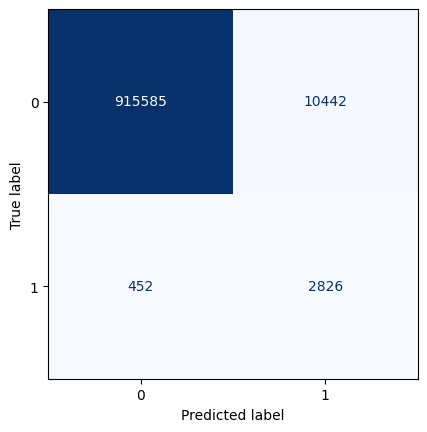

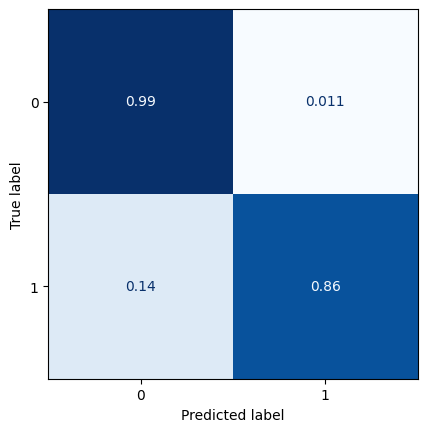

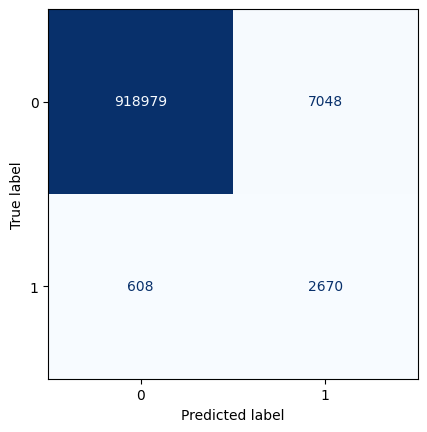

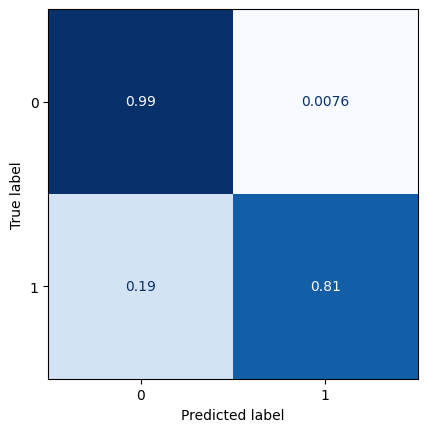

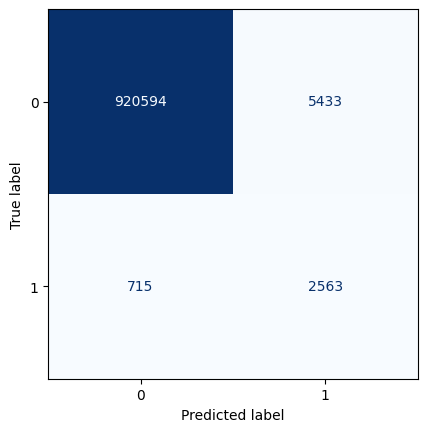

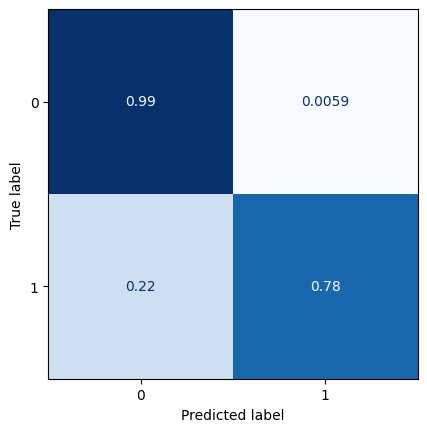

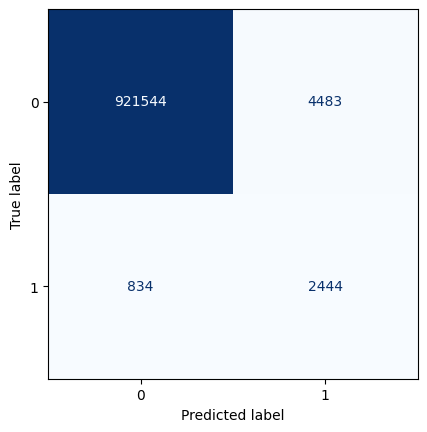

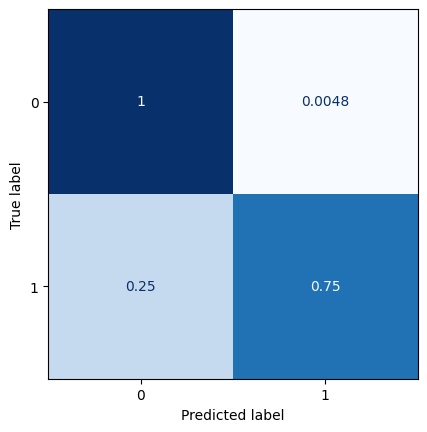

In [56]:
t = model.predict(test_img_std_2)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

# confusion matrix with threshold on 0.1, otherwise always 0 
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    

In [57]:
922821+3583+919+2359

929682

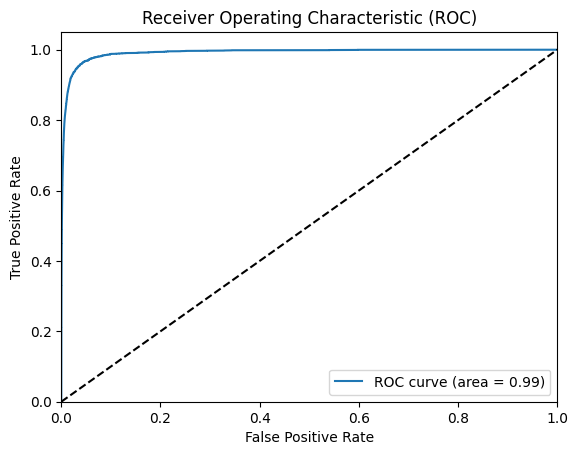

In [58]:
plot_roc(t.reshape(-1,1),y_test_img[1:].reshape(-1,1))

9


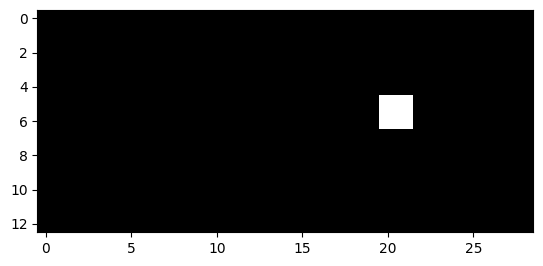

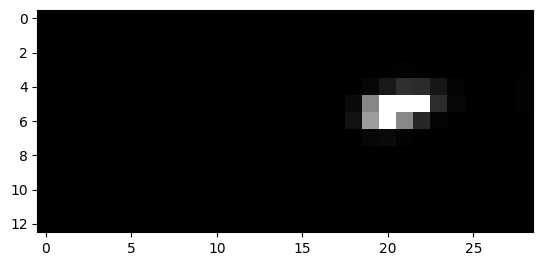

10


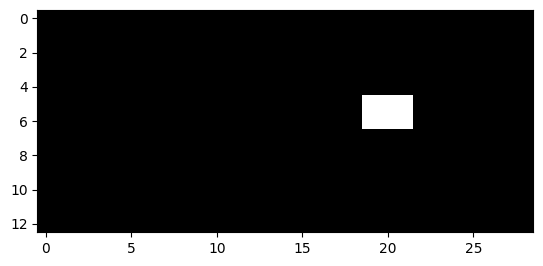

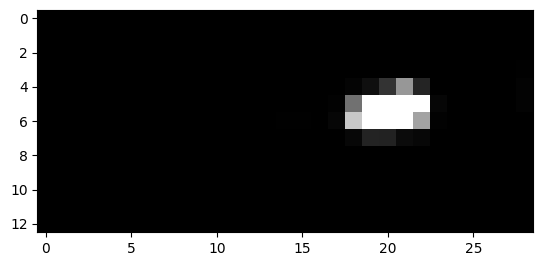

11


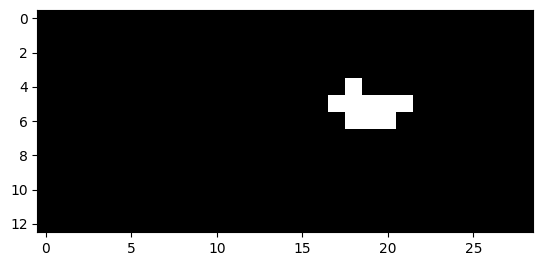

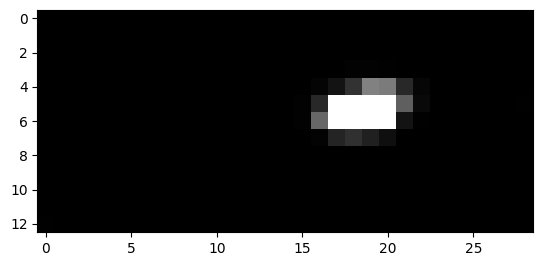

12


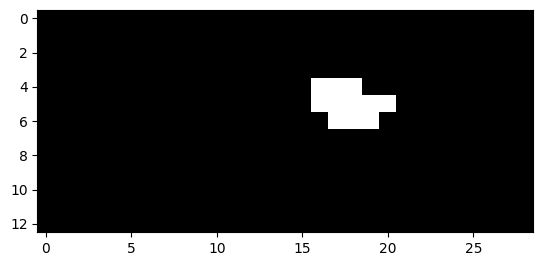

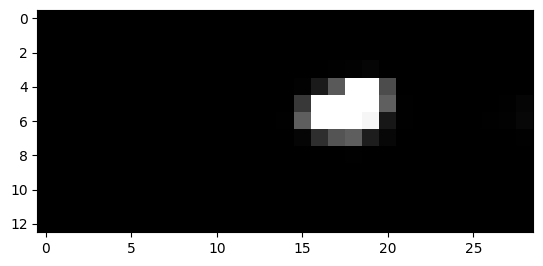

13


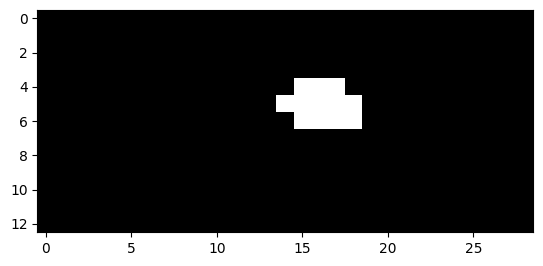

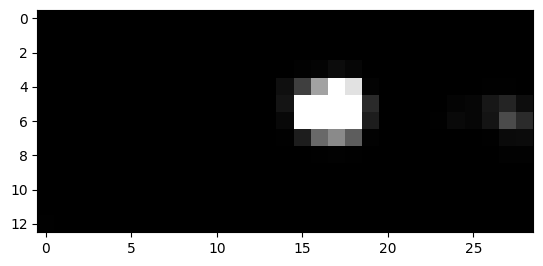

14


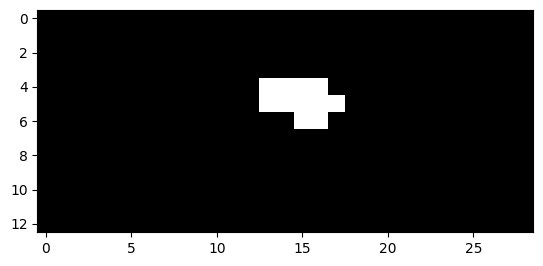

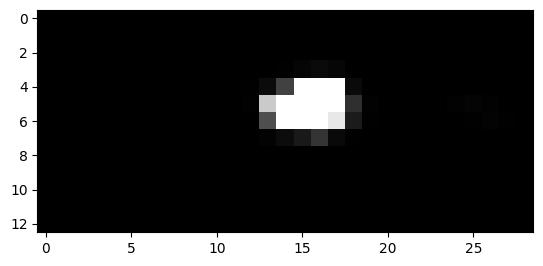

15


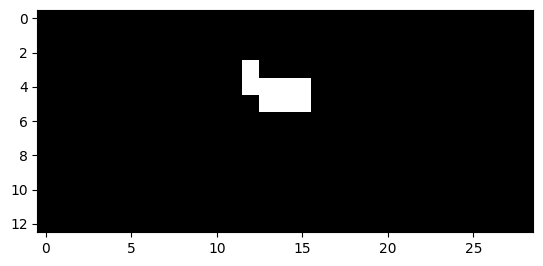

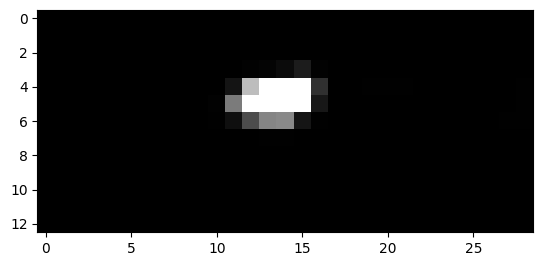

16


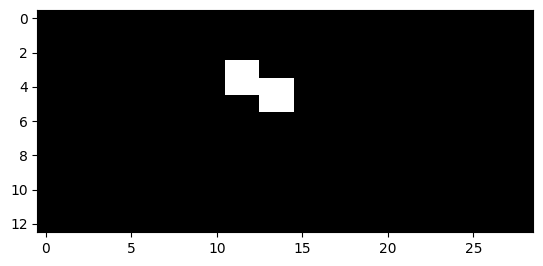

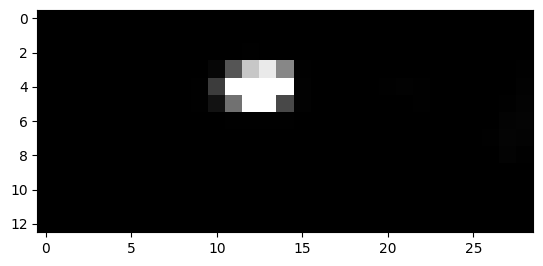

17


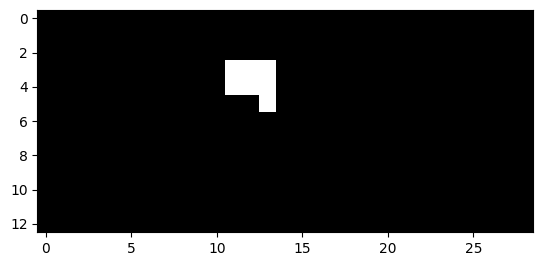

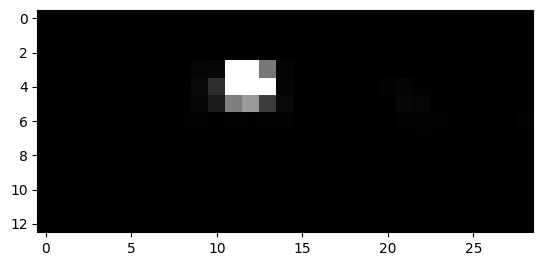

18


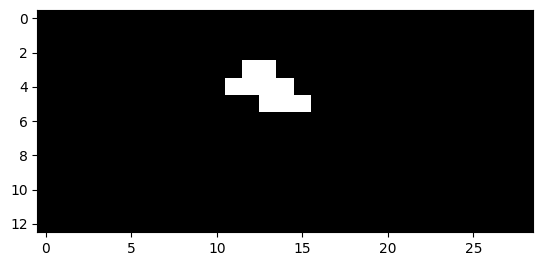

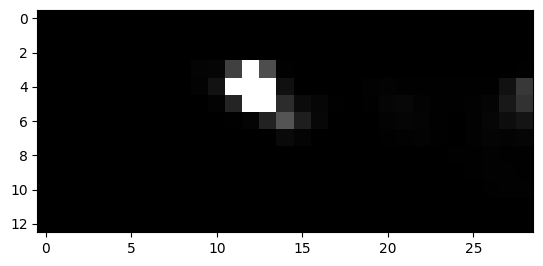

19


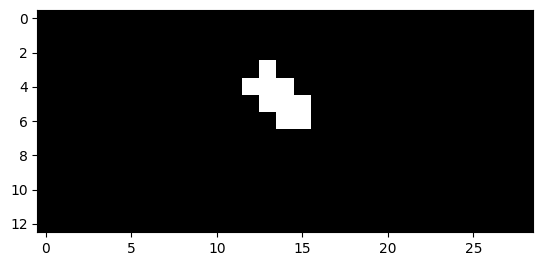

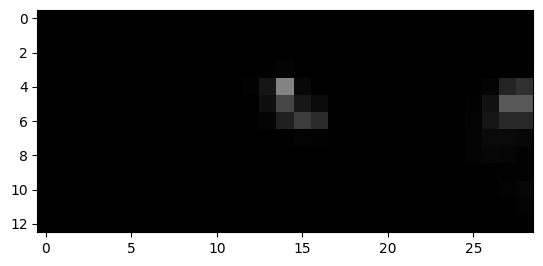

20


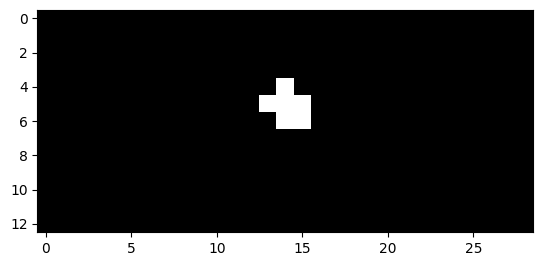

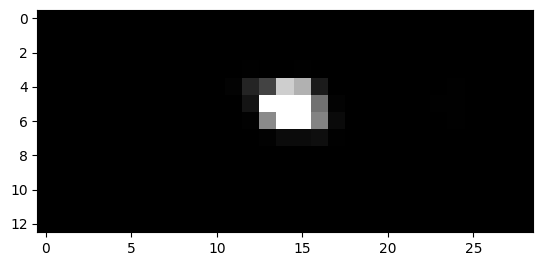

21


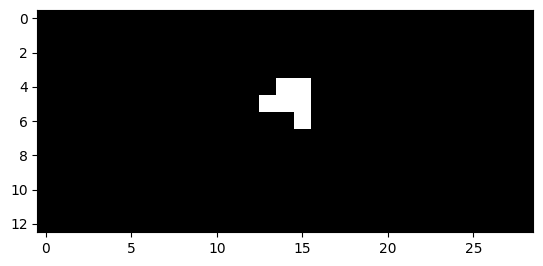

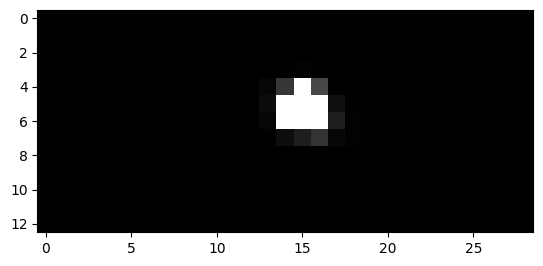

22


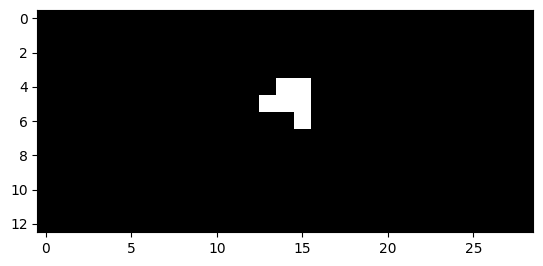

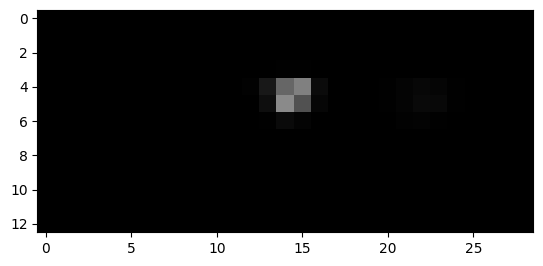

105


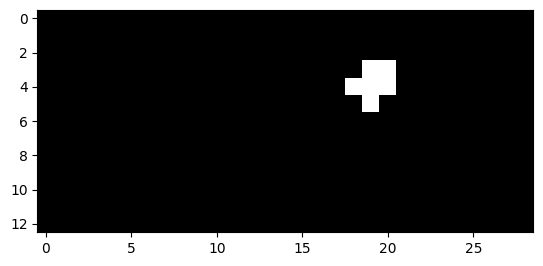

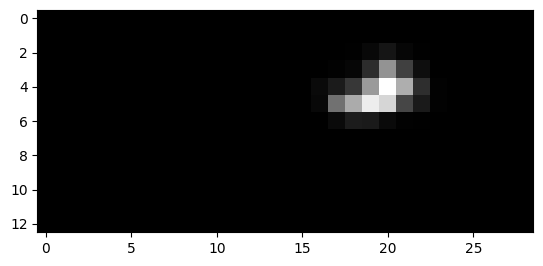

106


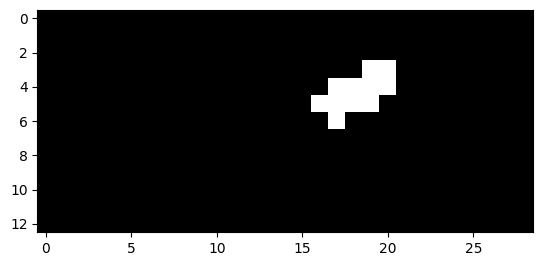

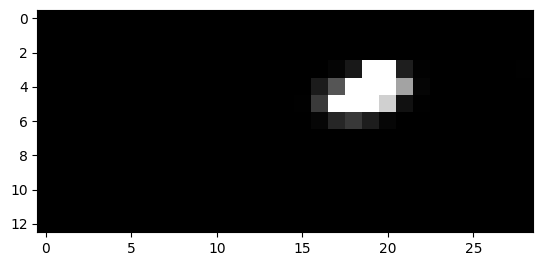

107


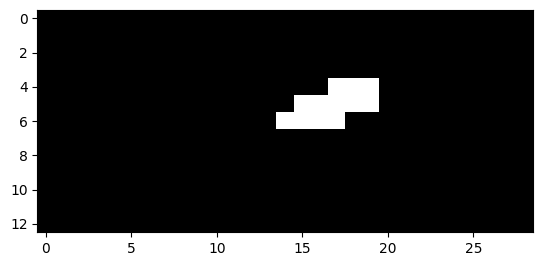

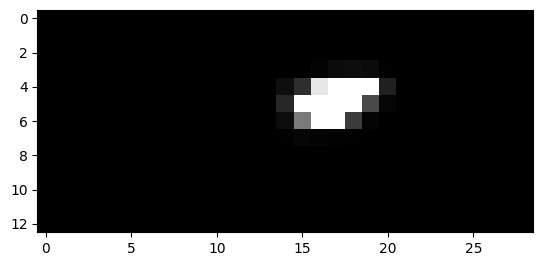

108


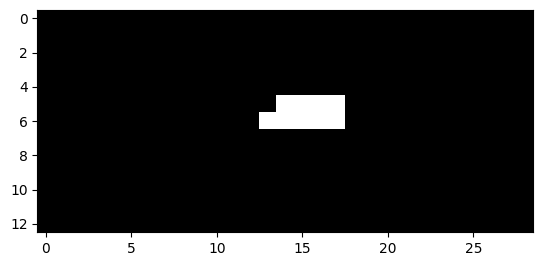

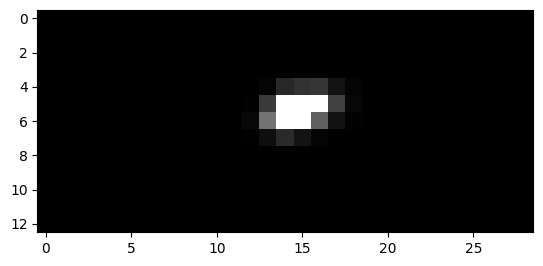

109


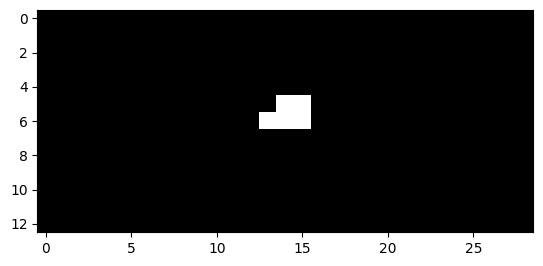

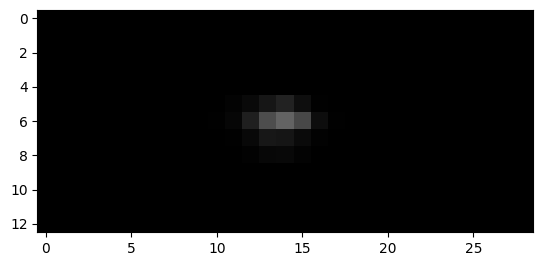

184


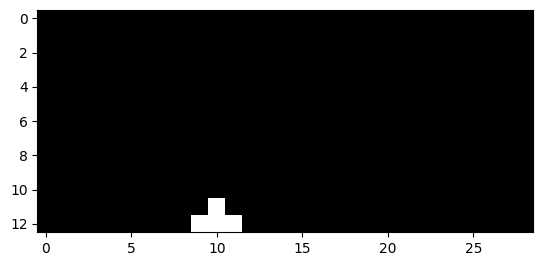

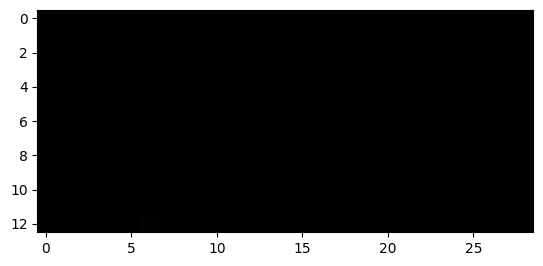

185


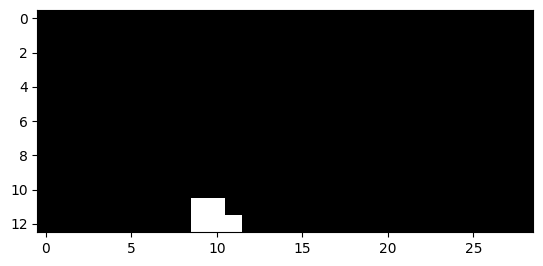

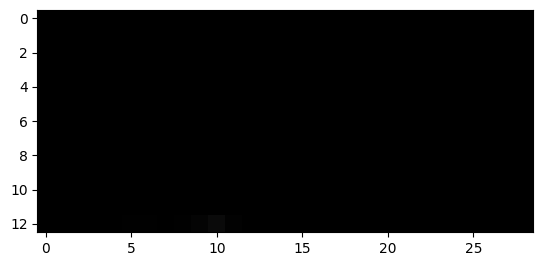

186


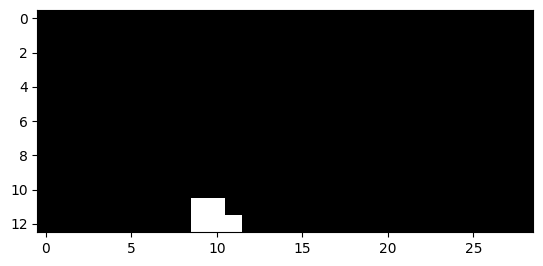

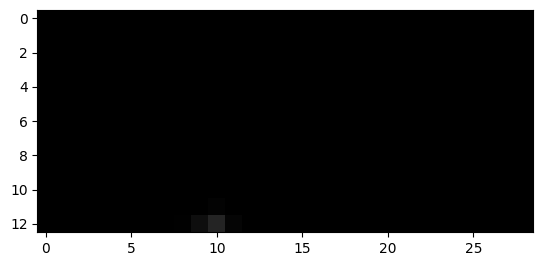

187


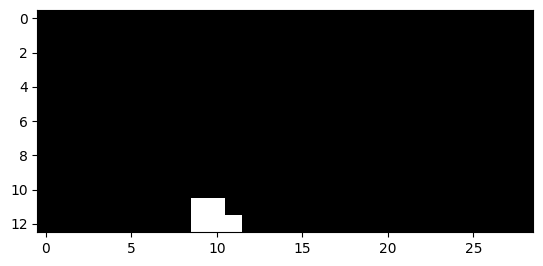

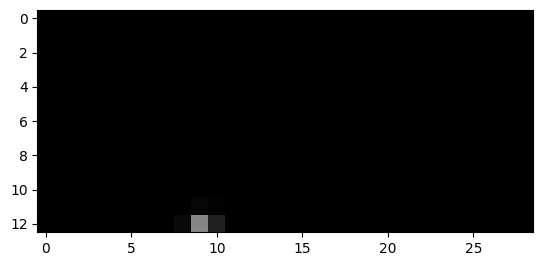

188


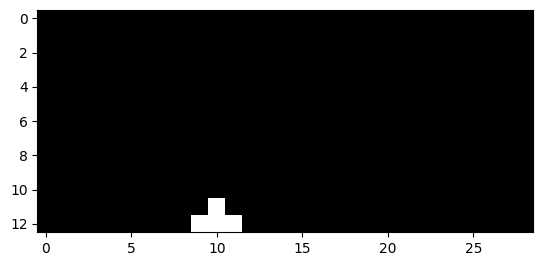

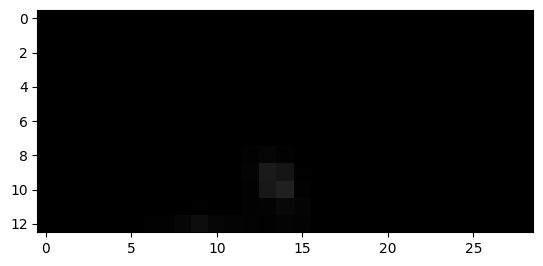

308


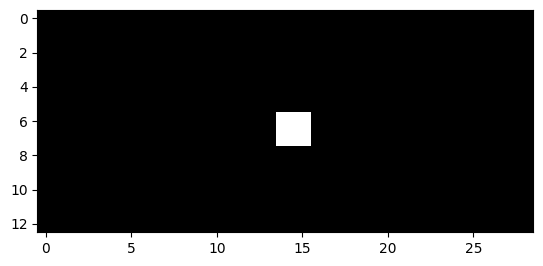

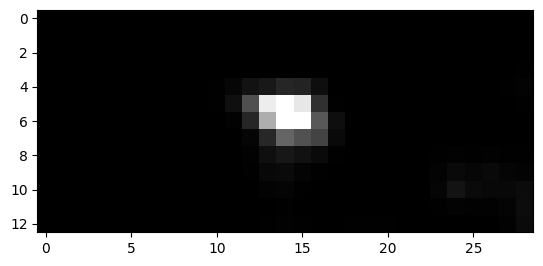

309


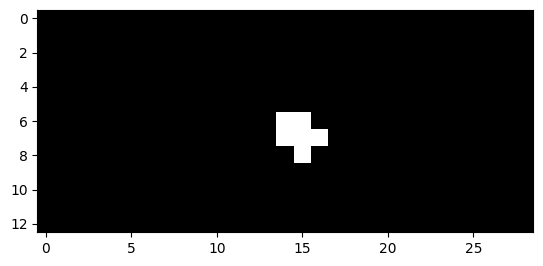

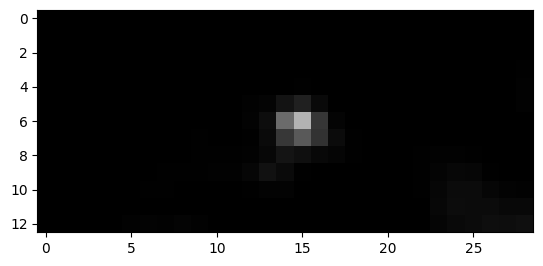

310


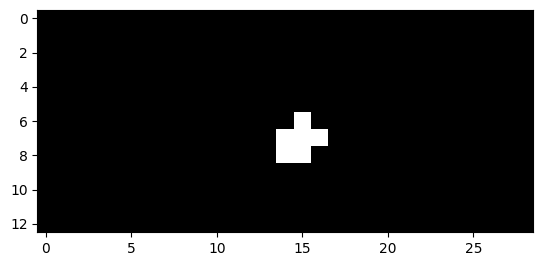

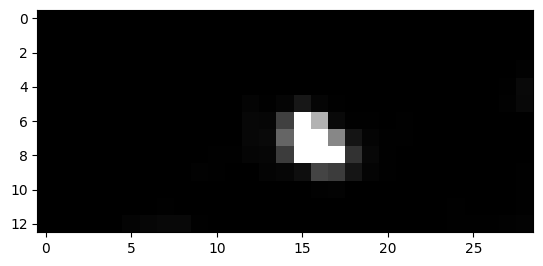

311


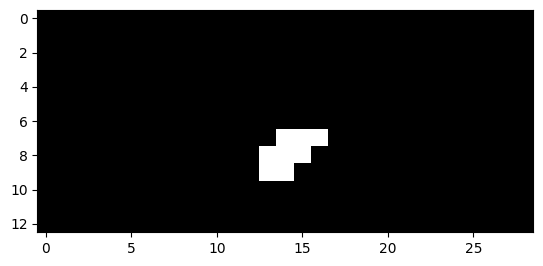

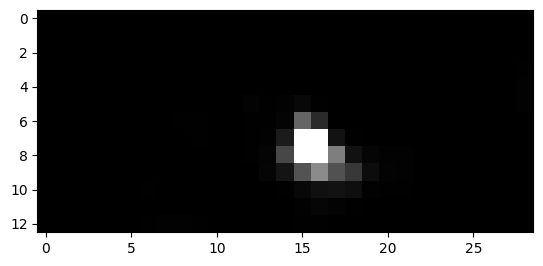

312


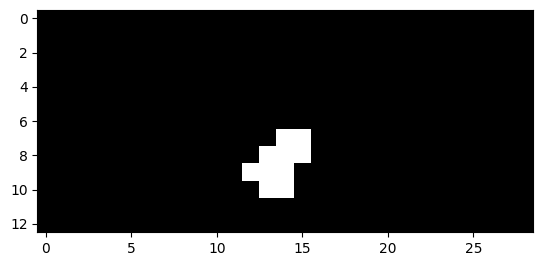

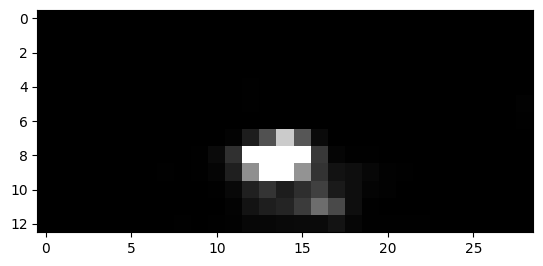

313


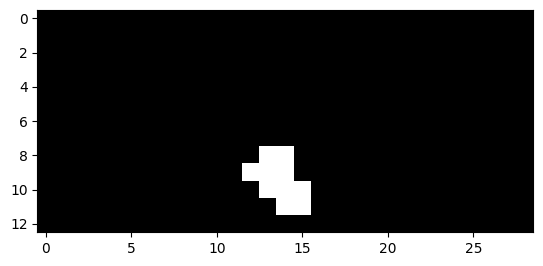

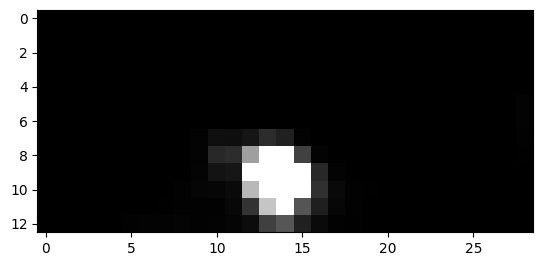

314


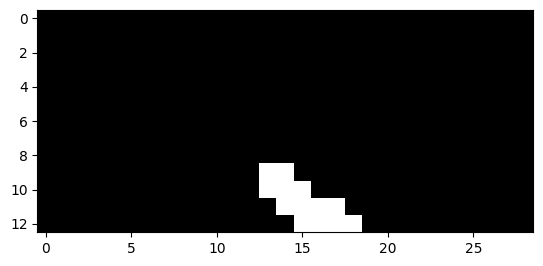

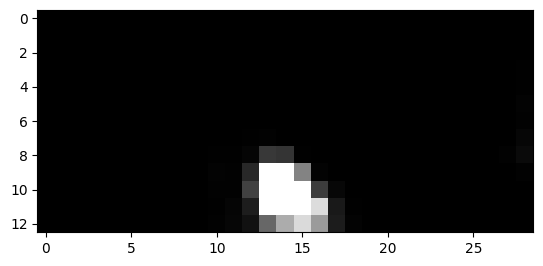

315


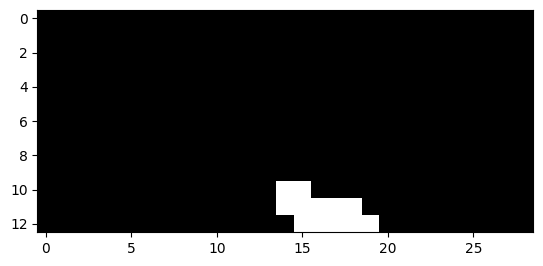

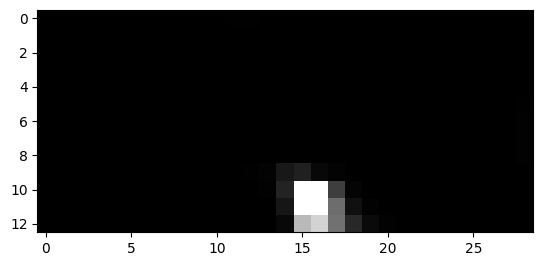

316


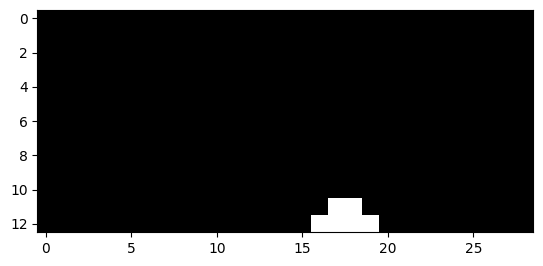

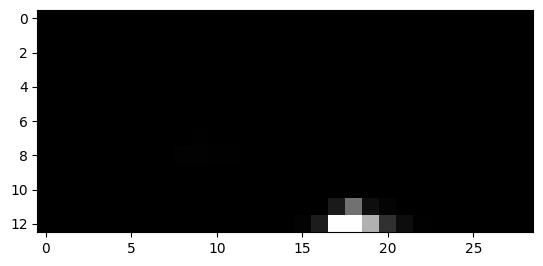

317


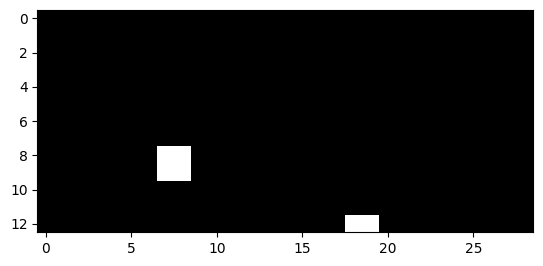

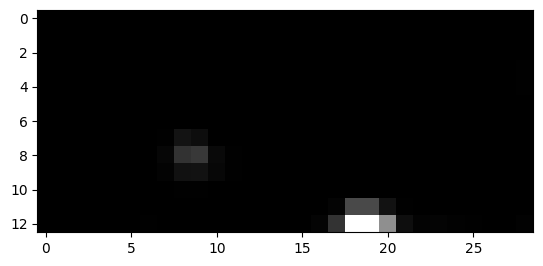

318


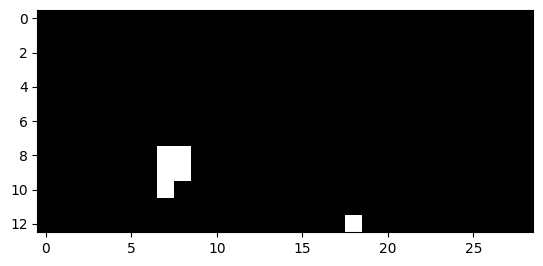

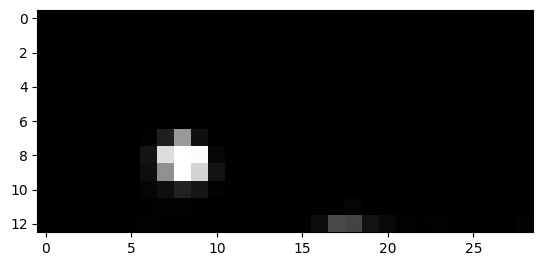

319


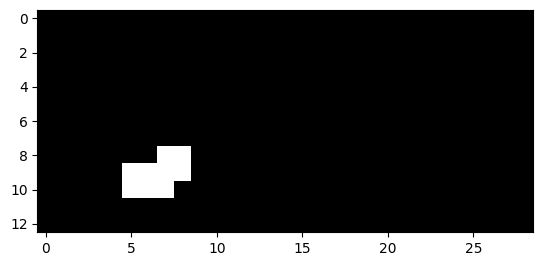

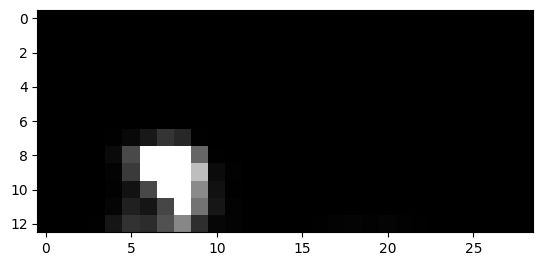

320


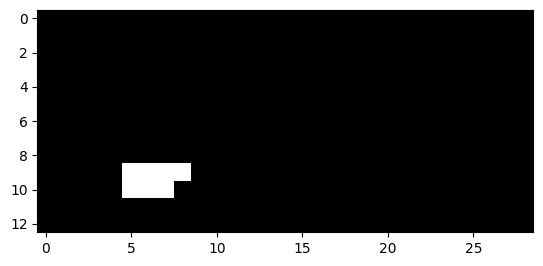

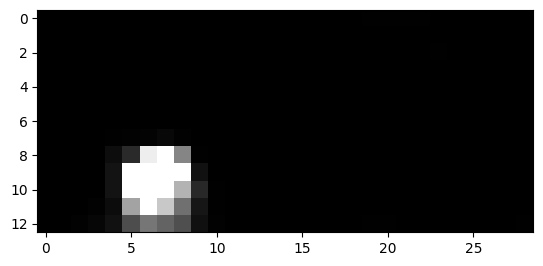

321


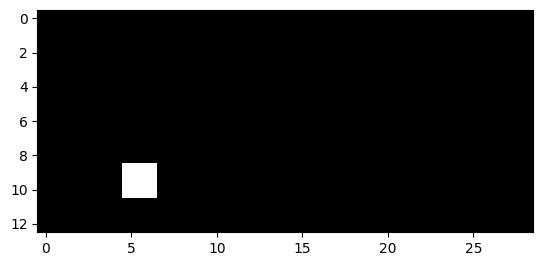

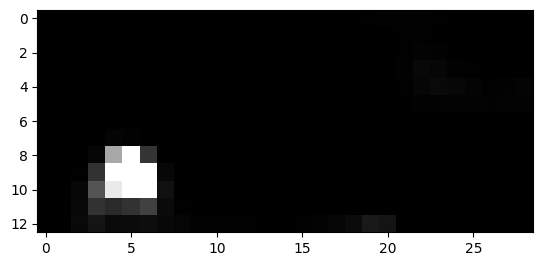

335


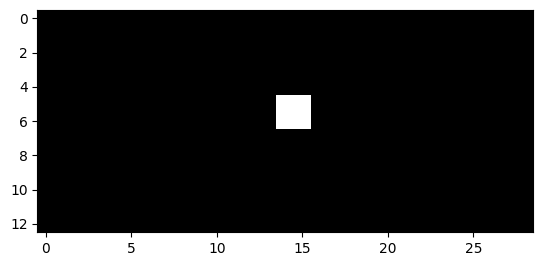

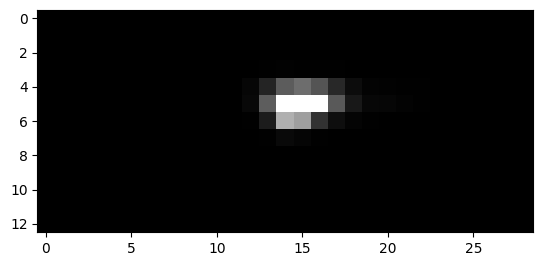

336


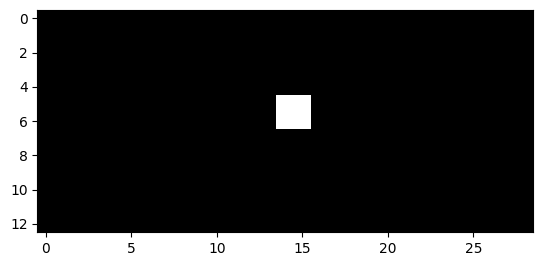

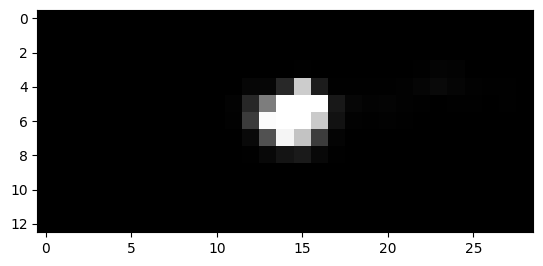

337


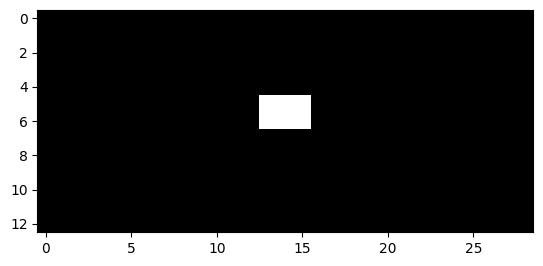

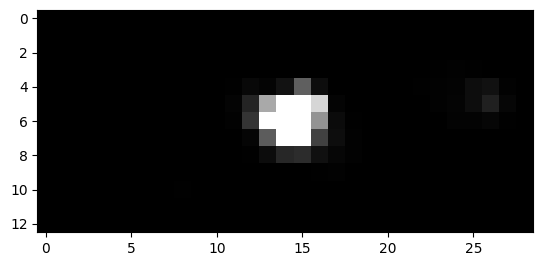

338


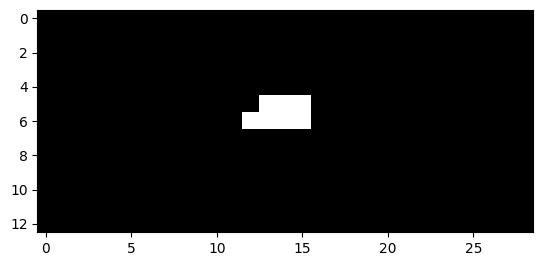

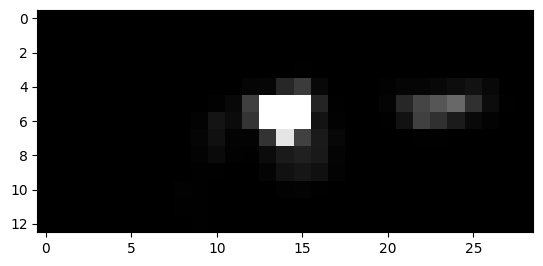

339


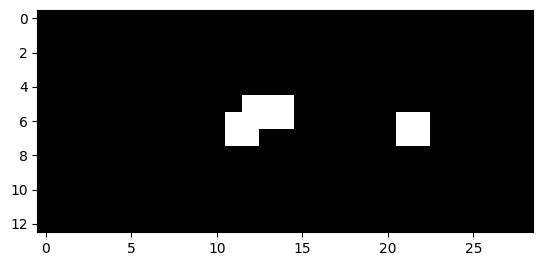

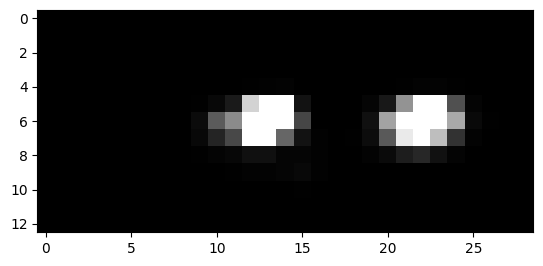

340


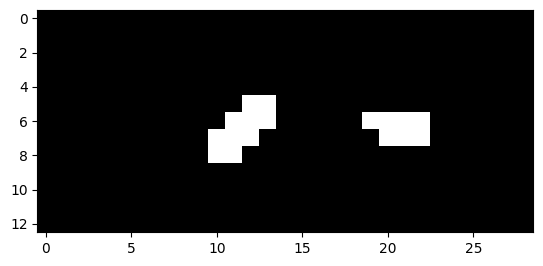

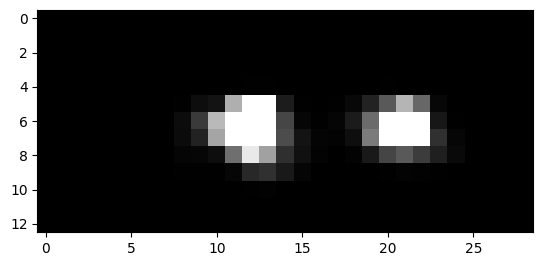

341


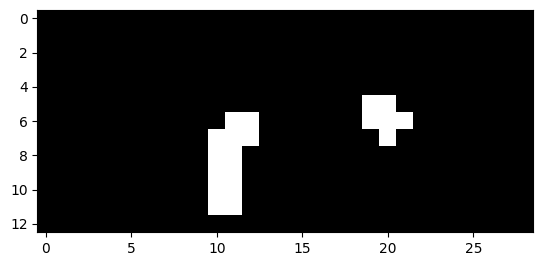

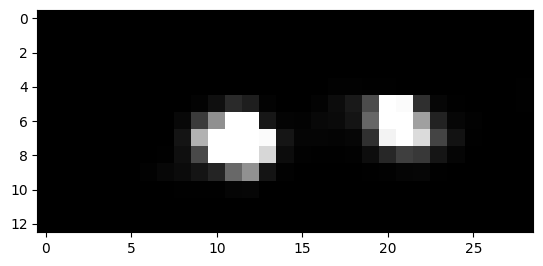

342


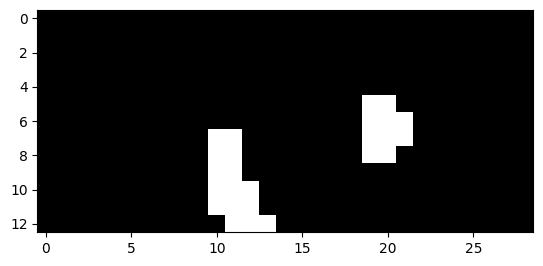

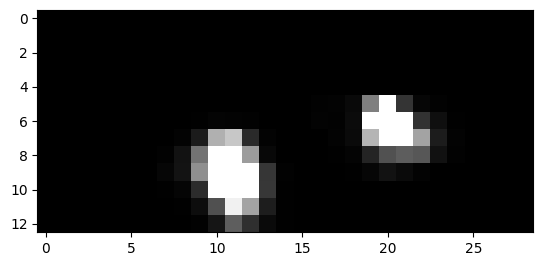

343


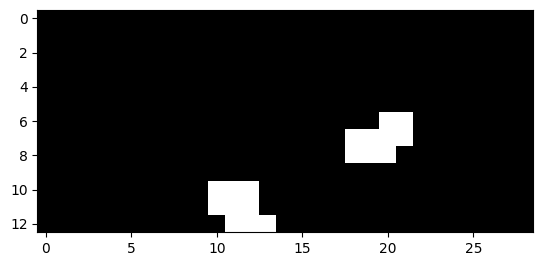

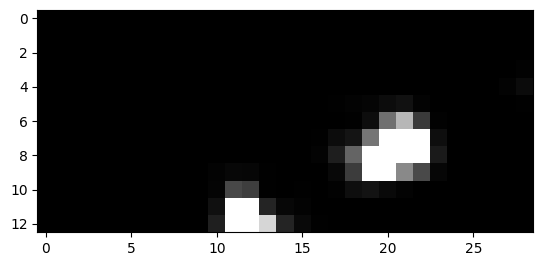

344


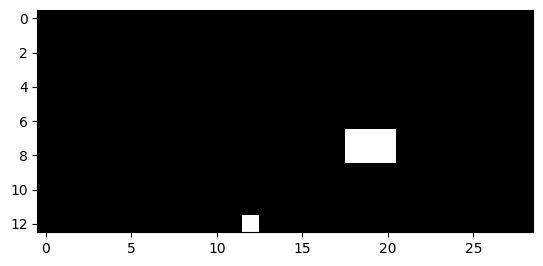

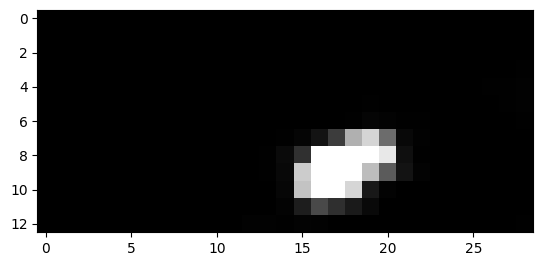

346


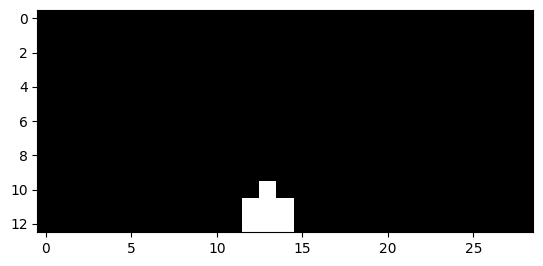

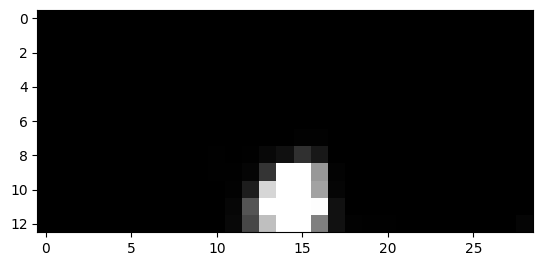

347


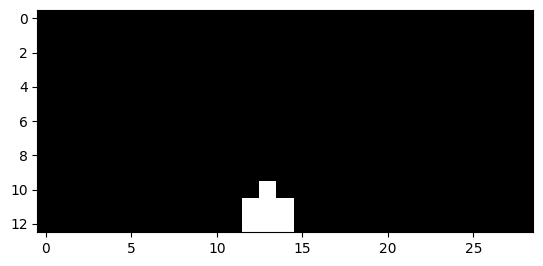

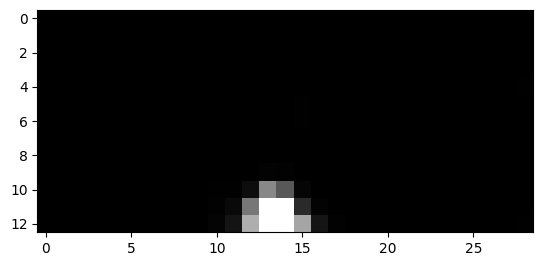

348


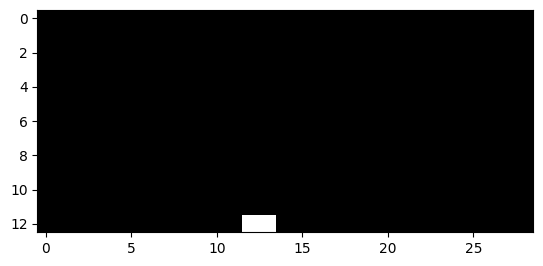

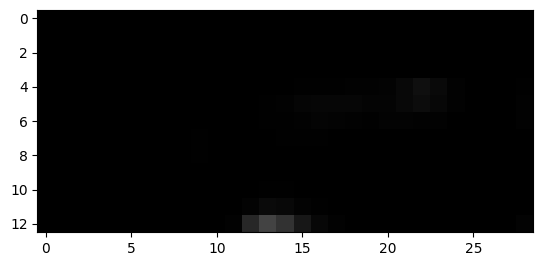

640


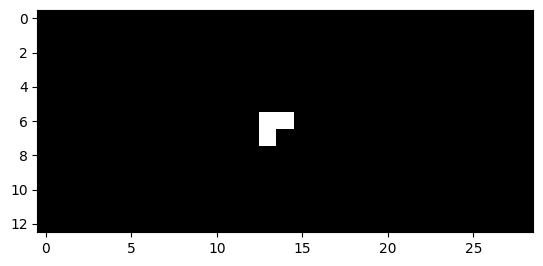

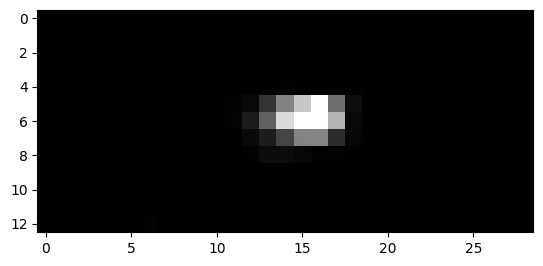

641


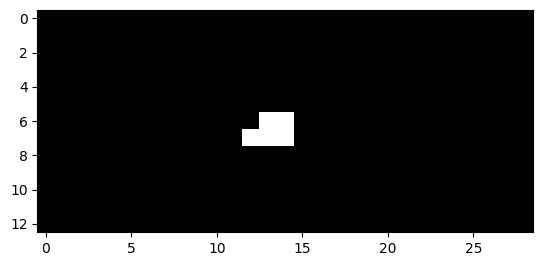

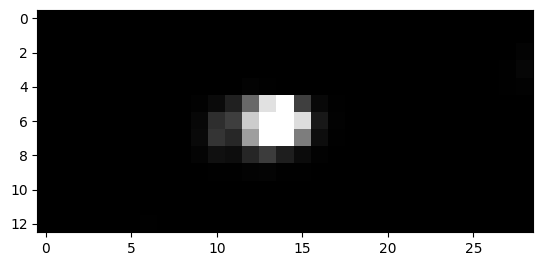

642


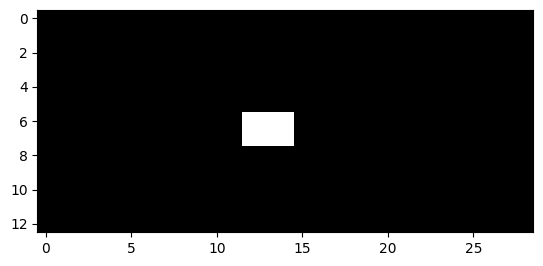

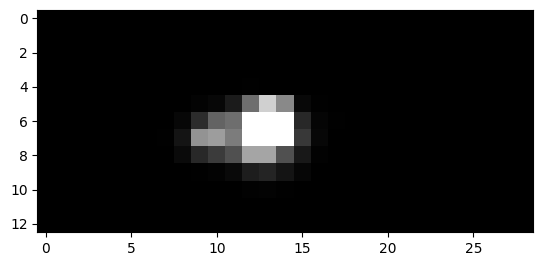

643


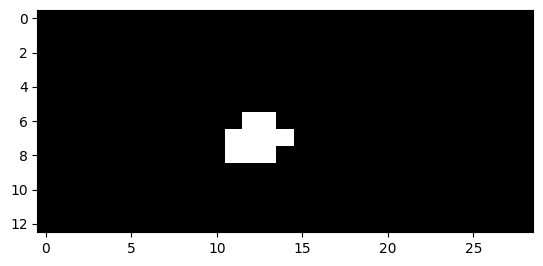

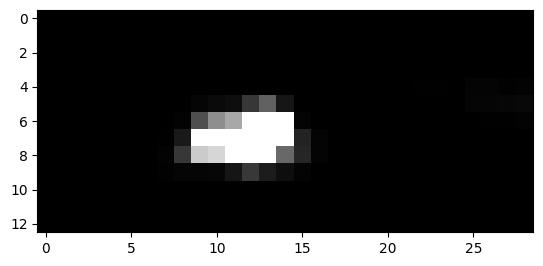

644


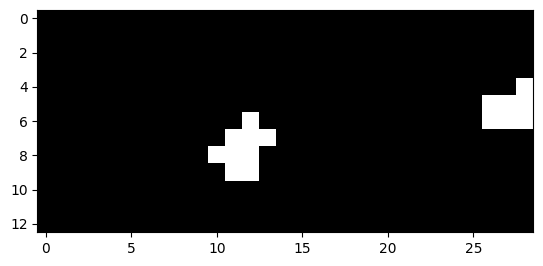

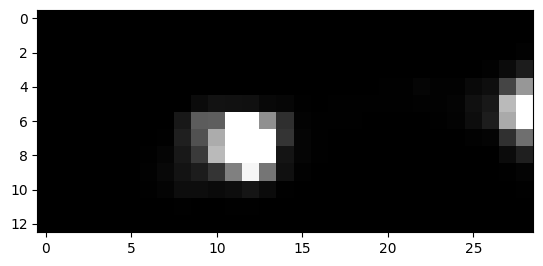

645


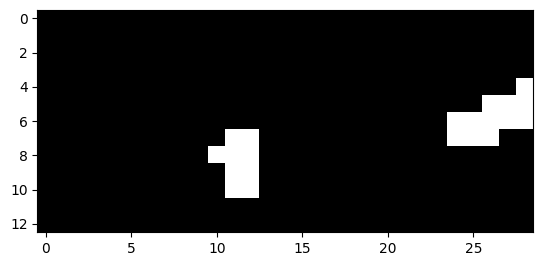

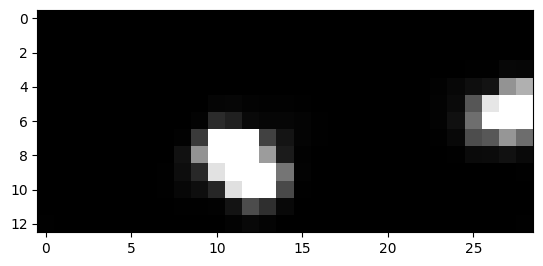

646


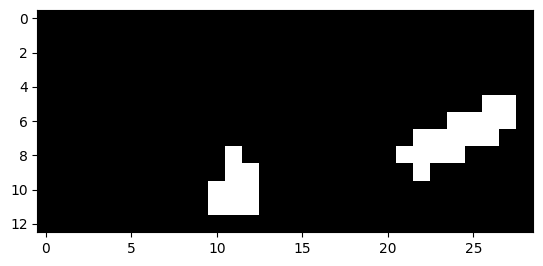

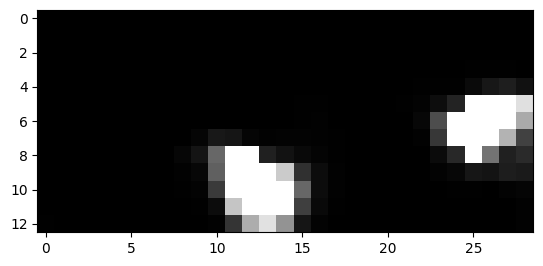

647


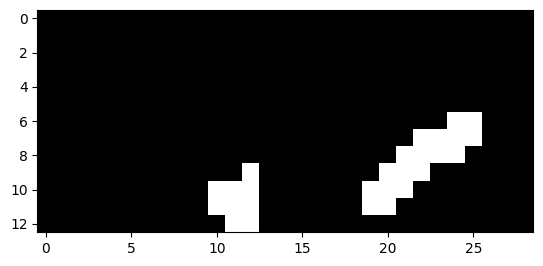

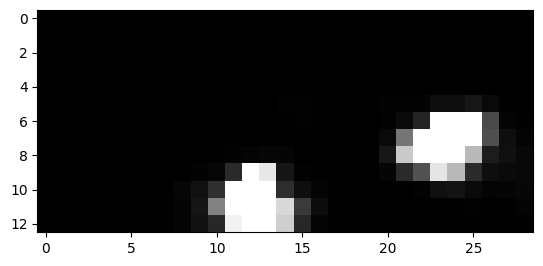

648


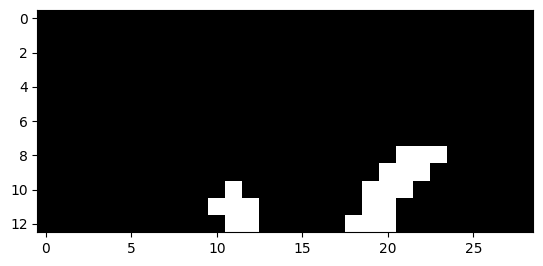

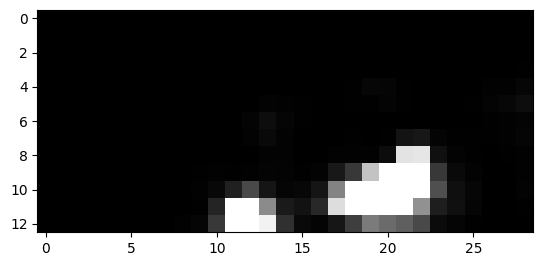

649


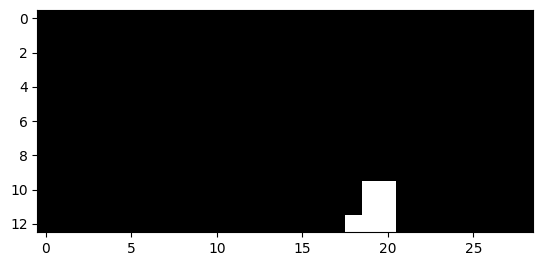

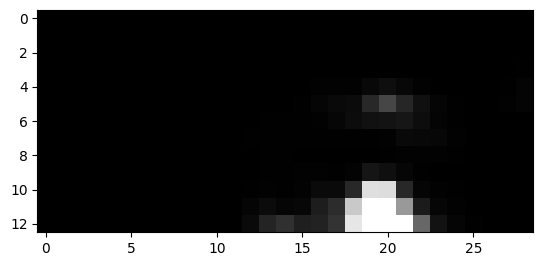

651


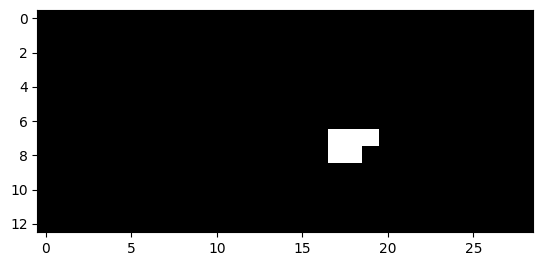

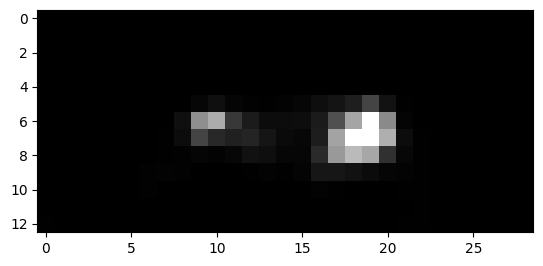

652


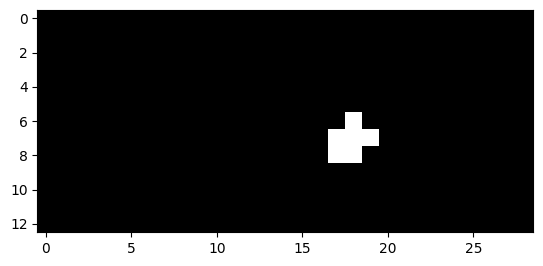

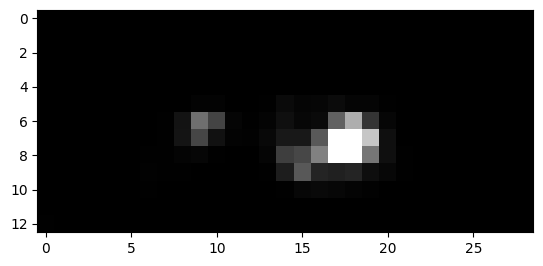

653


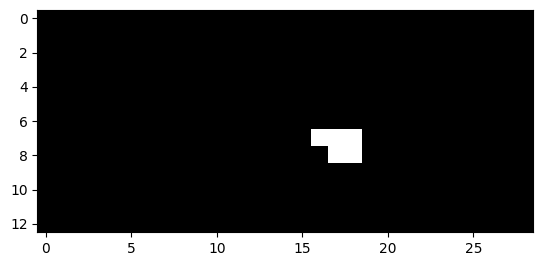

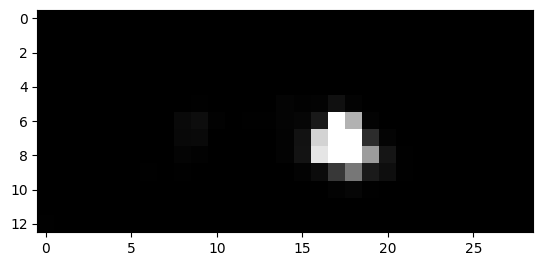

654


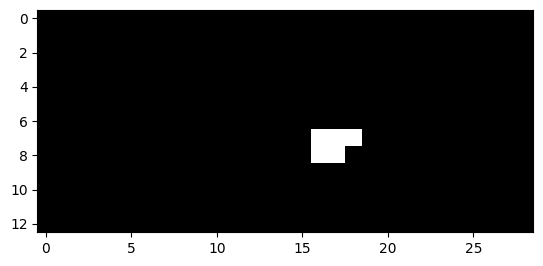

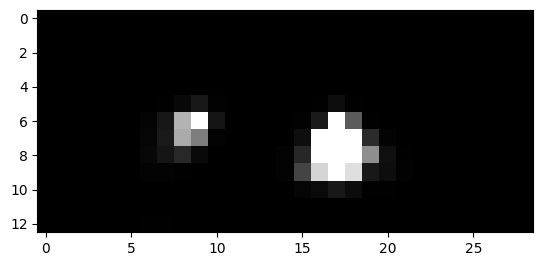

655


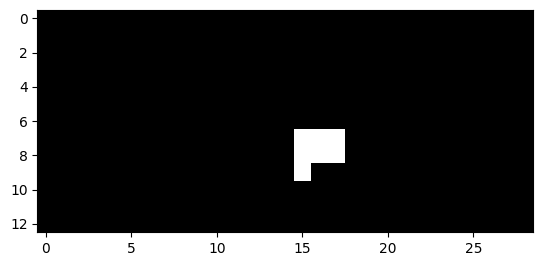

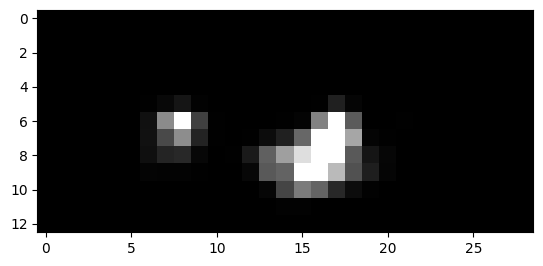

656


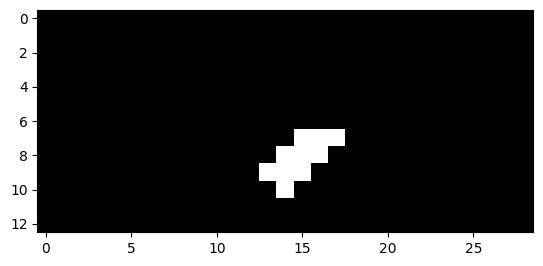

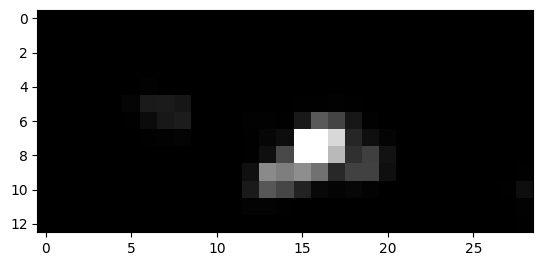

657


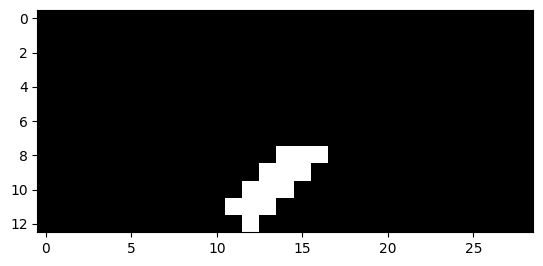

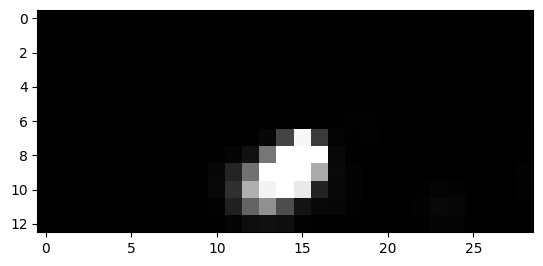

658


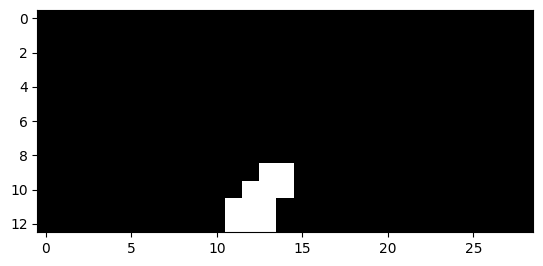

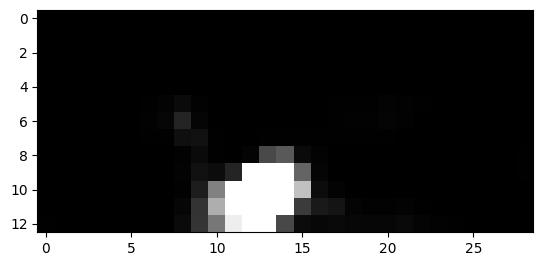

659


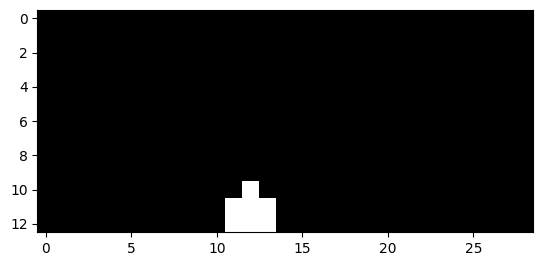

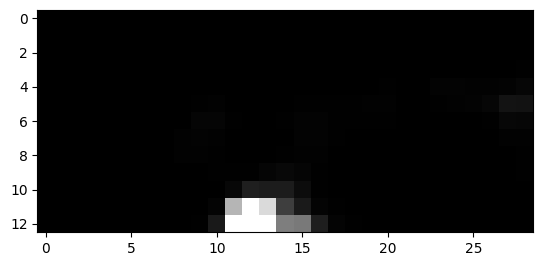

665


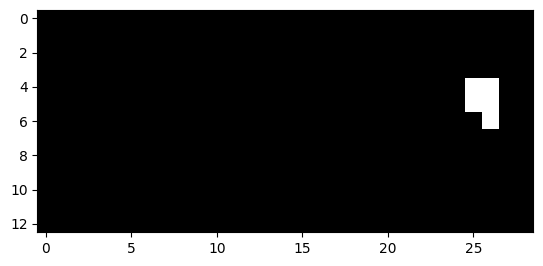

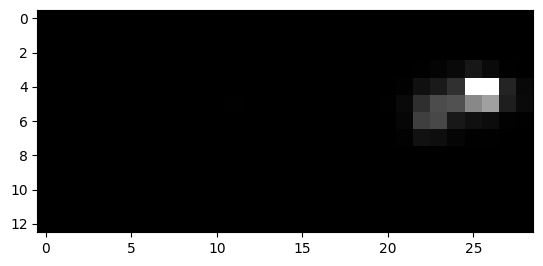

666


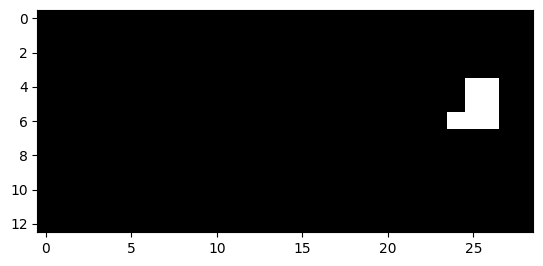

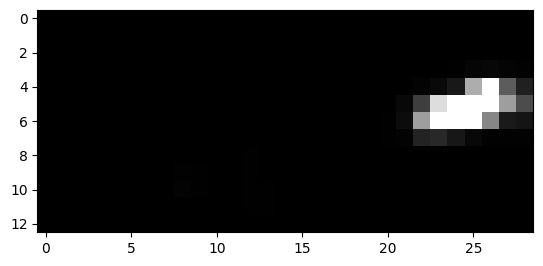

667


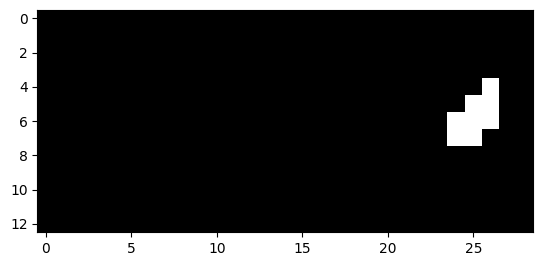

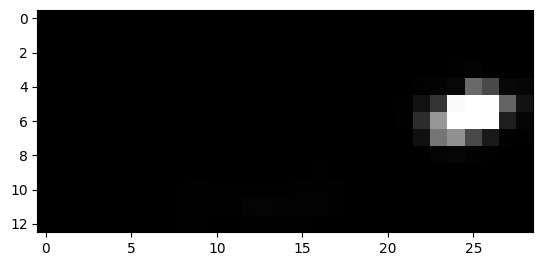

668


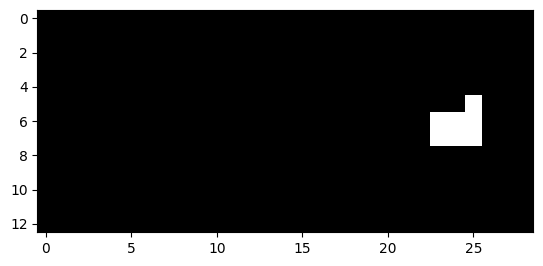

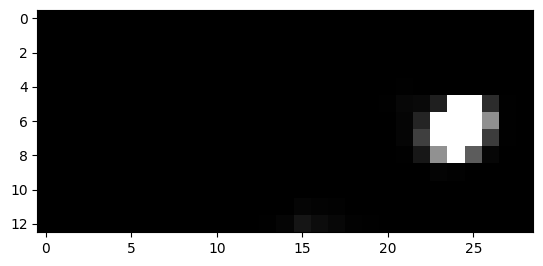

669


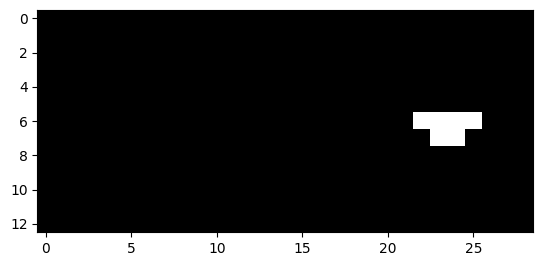

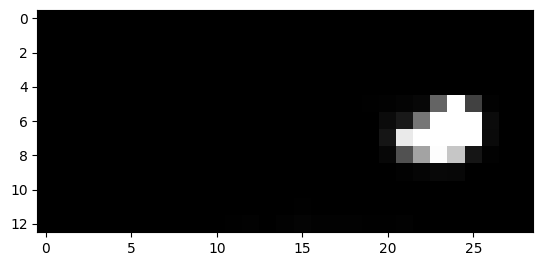

670


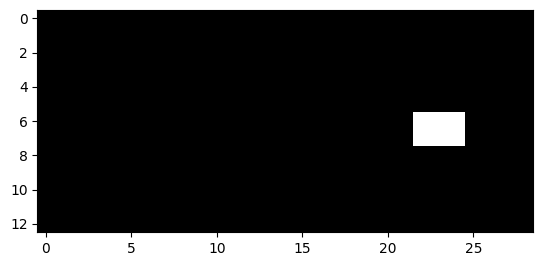

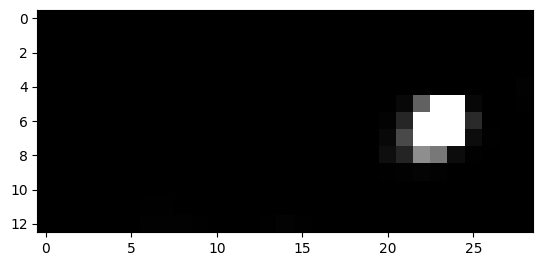

671


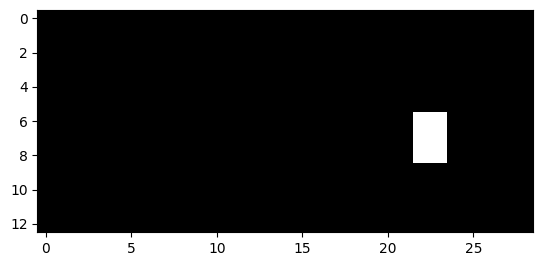

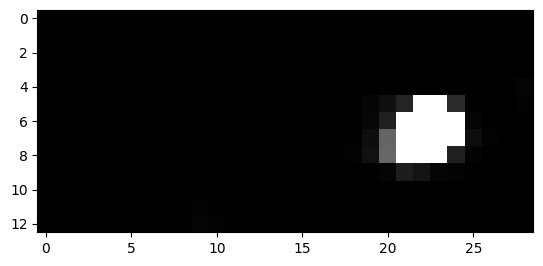

672


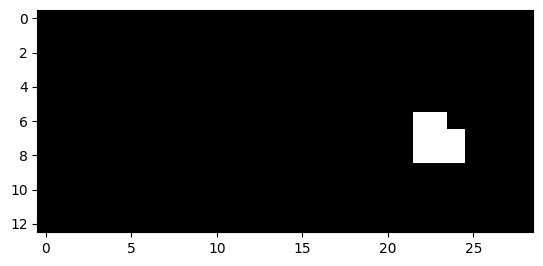

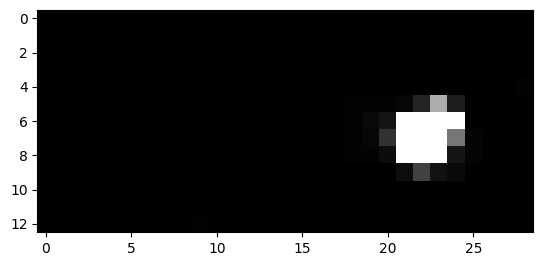

673


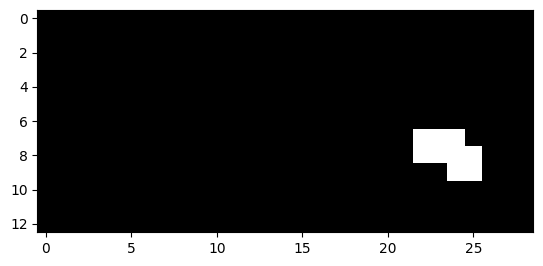

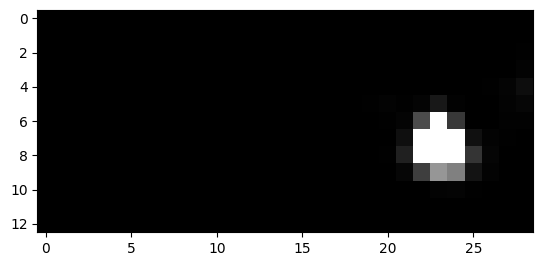

674


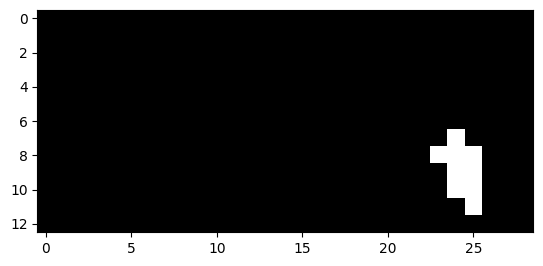

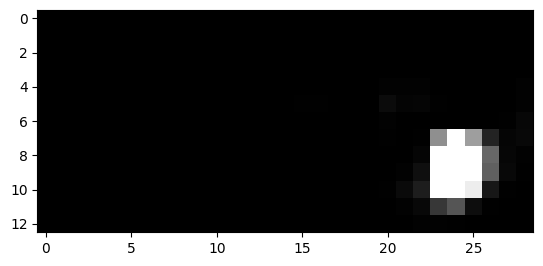

675


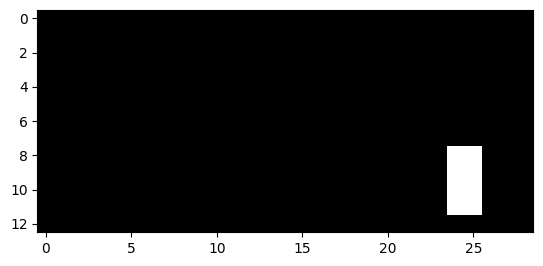

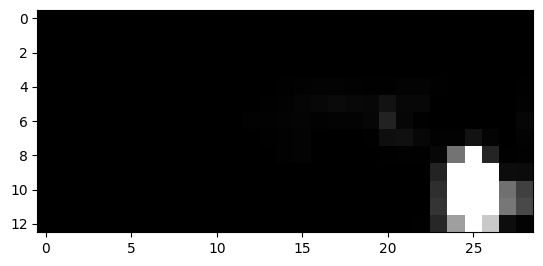

676


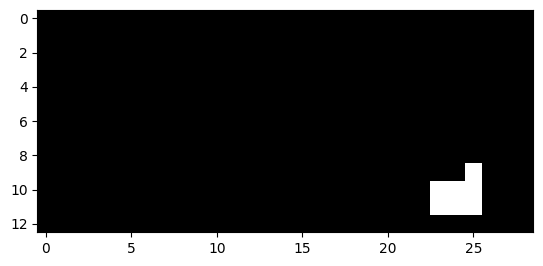

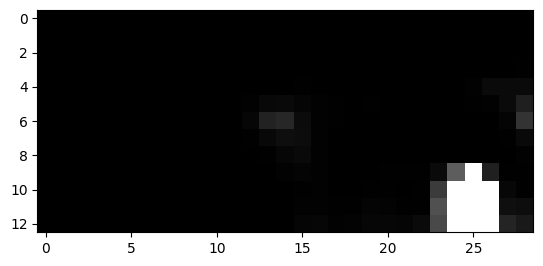

677


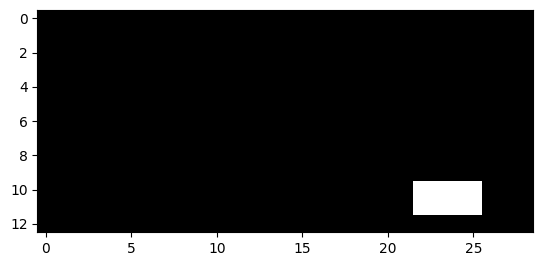

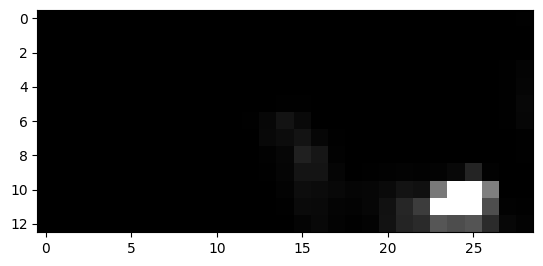

678


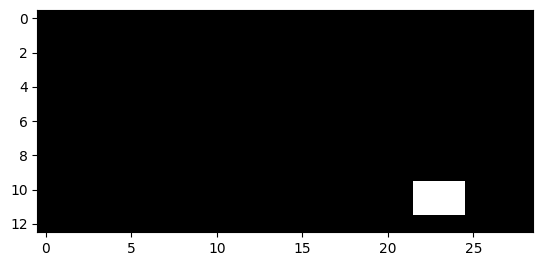

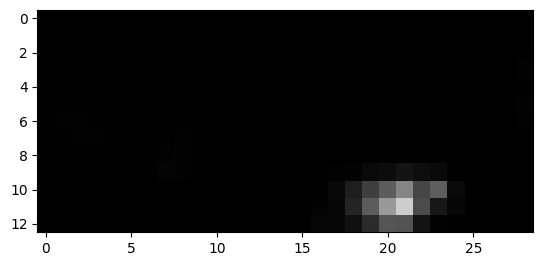

699


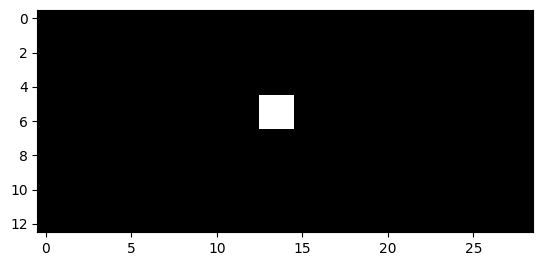

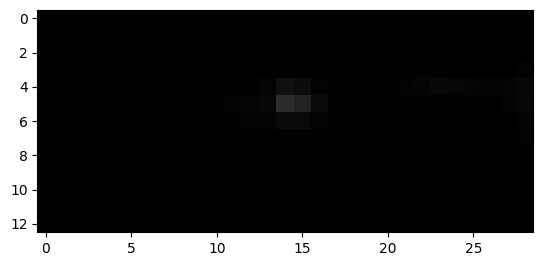

700


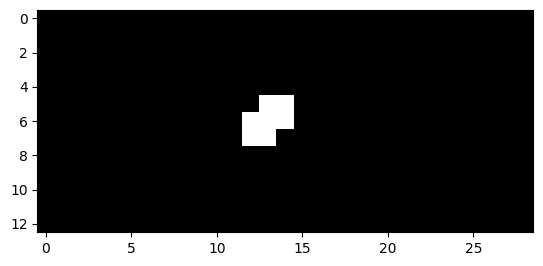

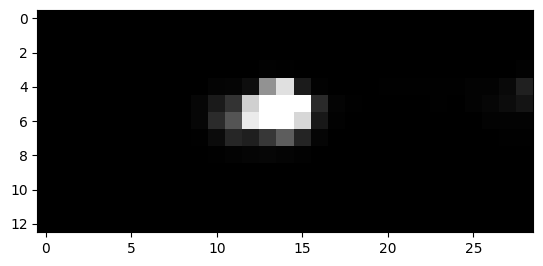

701


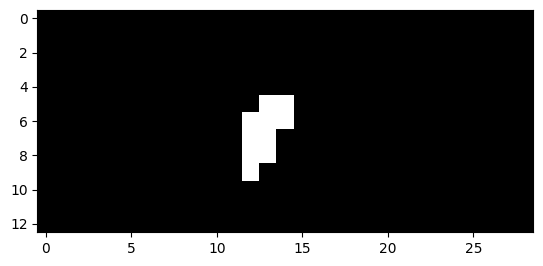

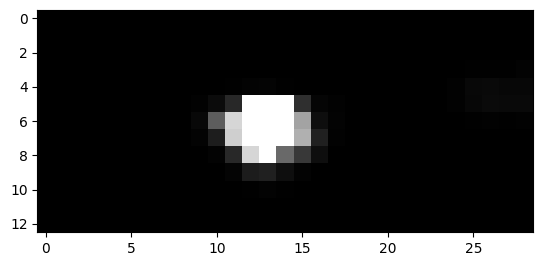

702


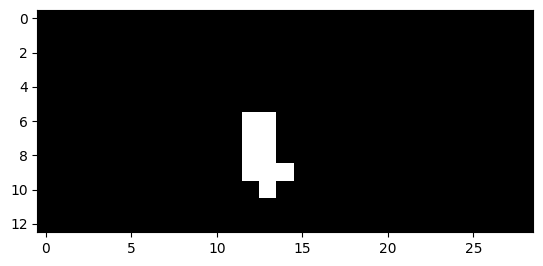

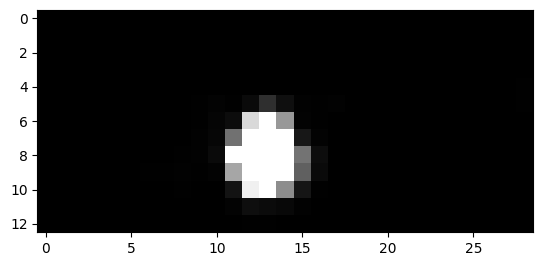

703


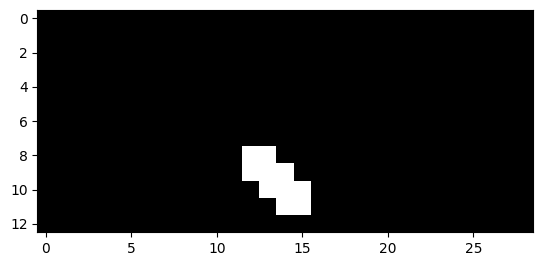

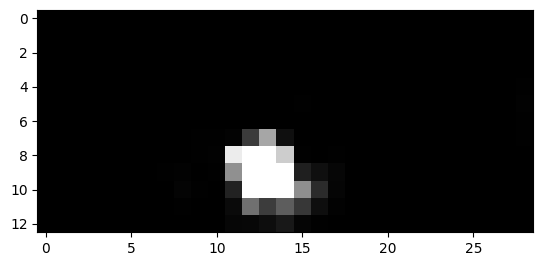

704


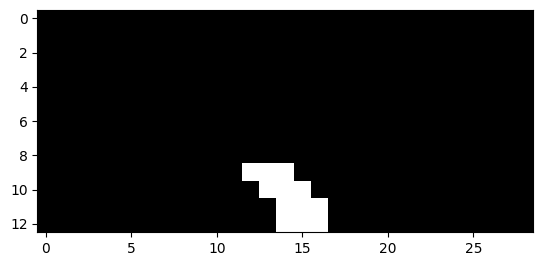

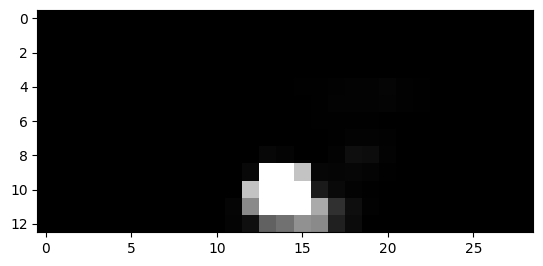

705


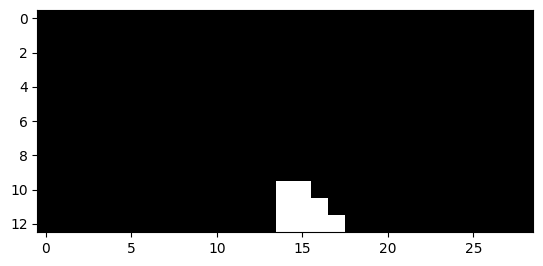

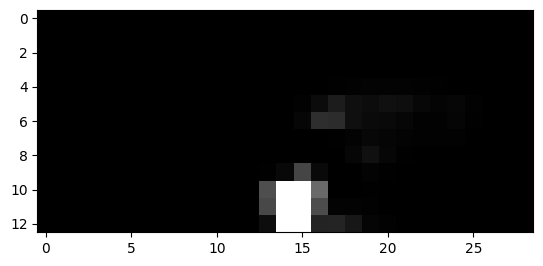

706


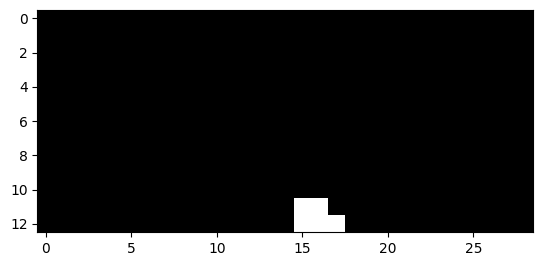

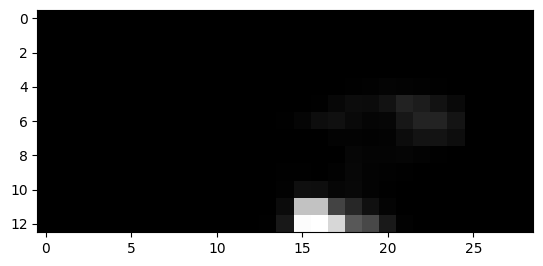

711


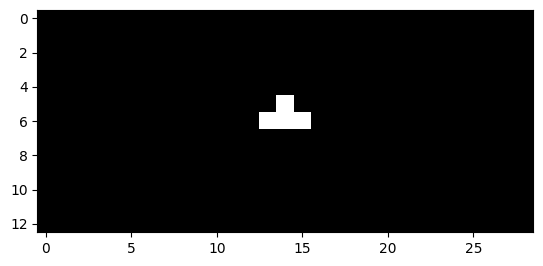

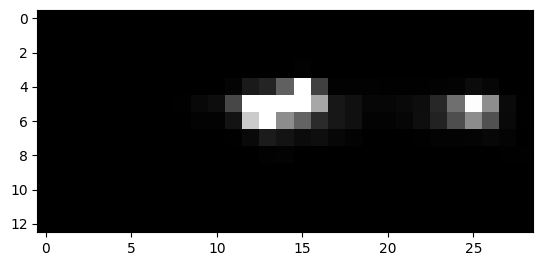

712


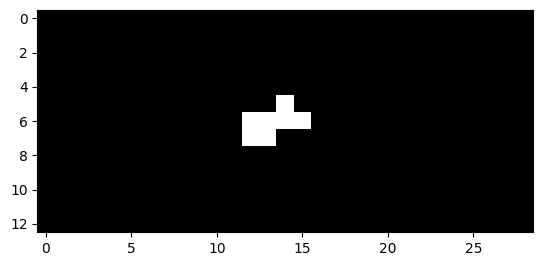

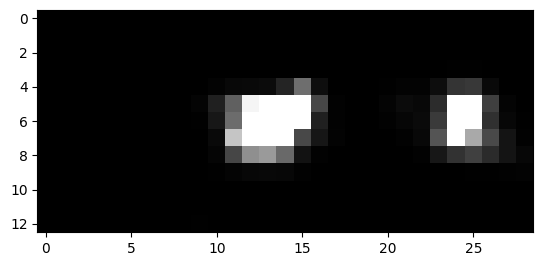

713


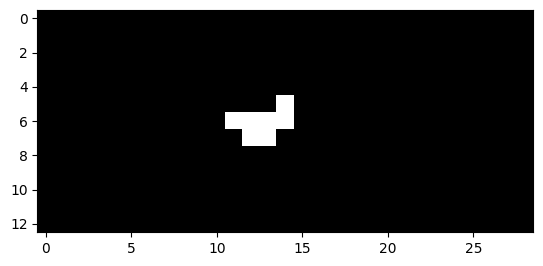

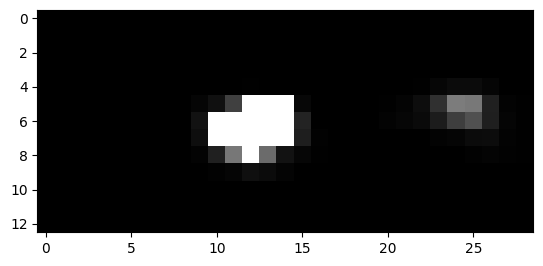

714


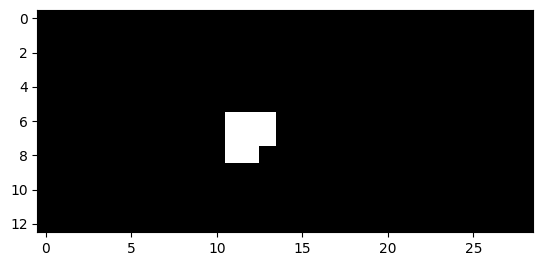

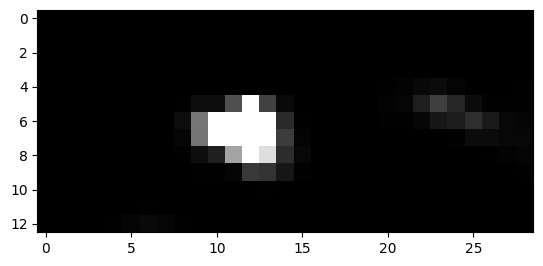

715


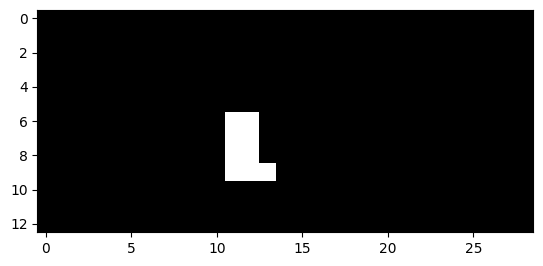

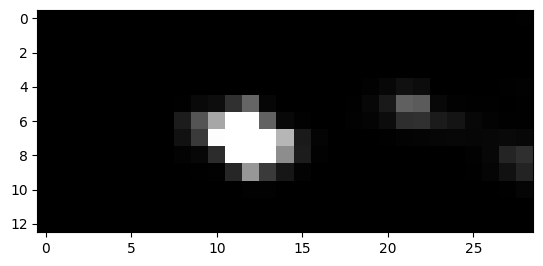

716


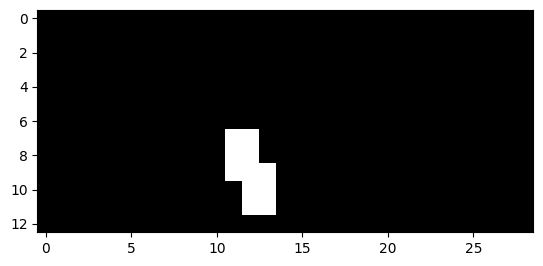

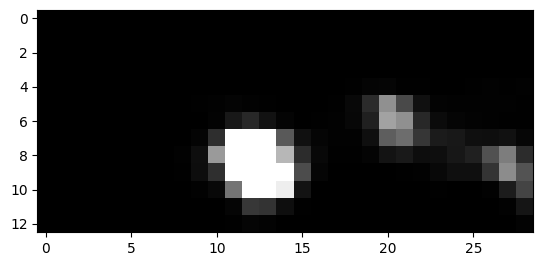

717


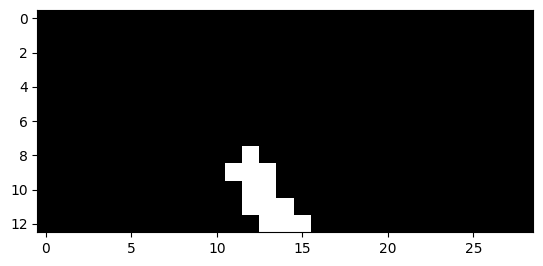

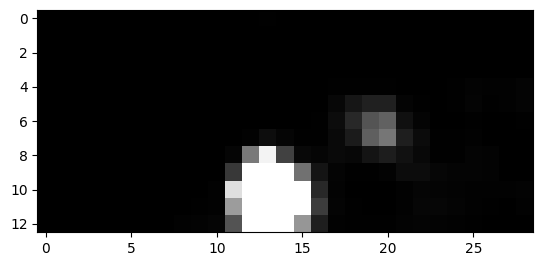

718


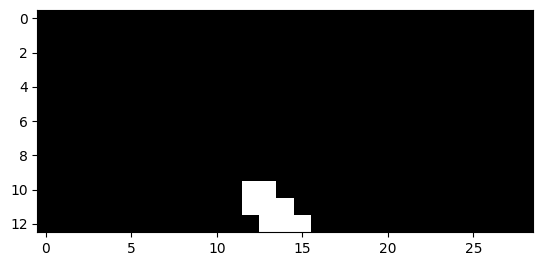

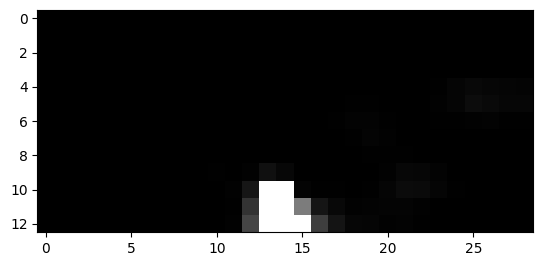

719


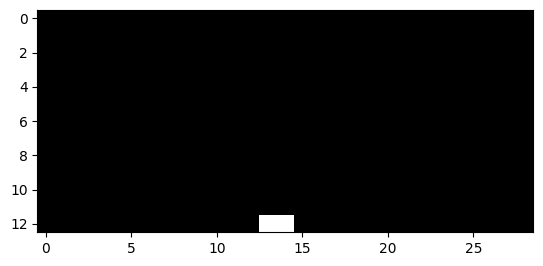

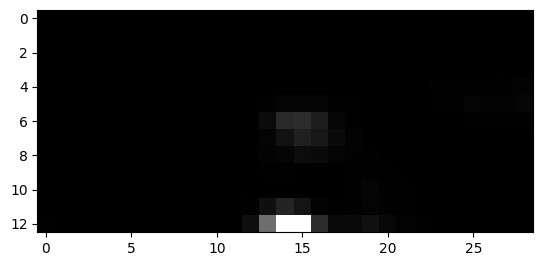

751


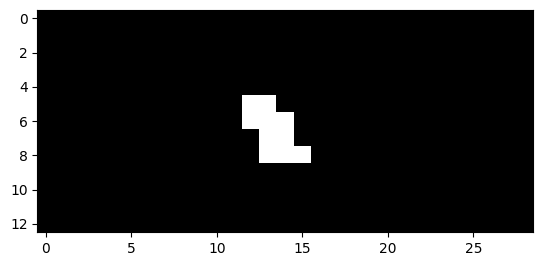

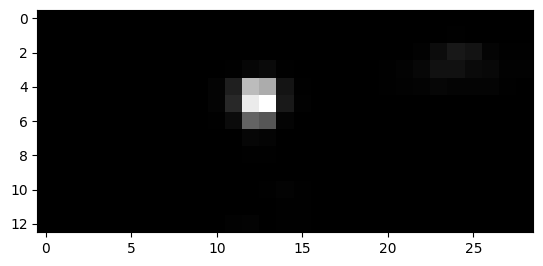

752


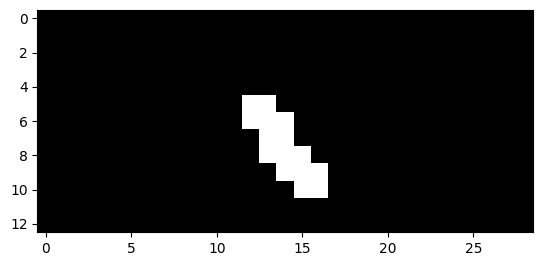

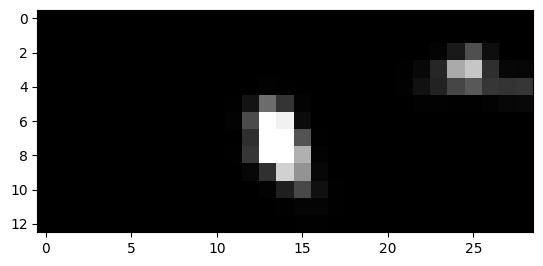

753


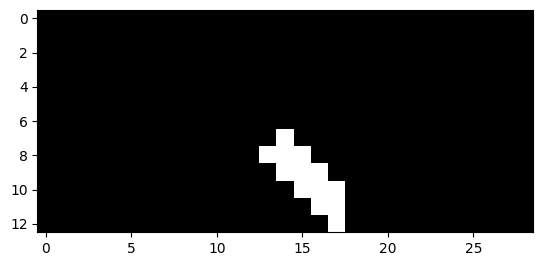

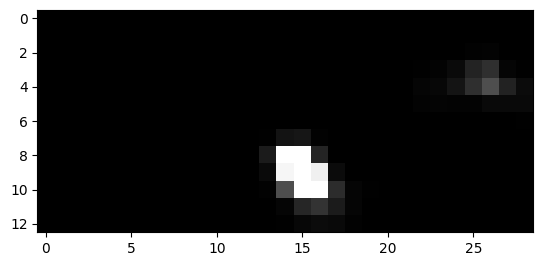

754


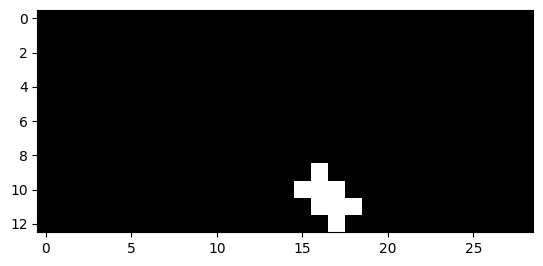

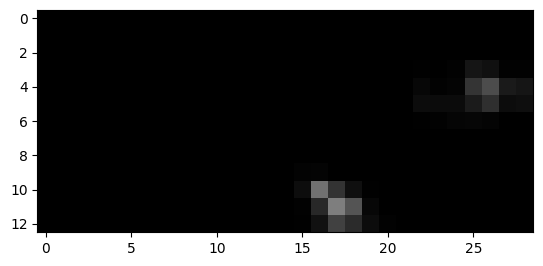

755


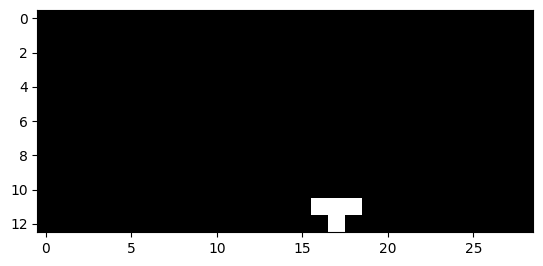

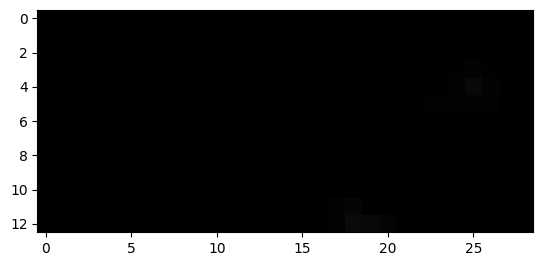

756


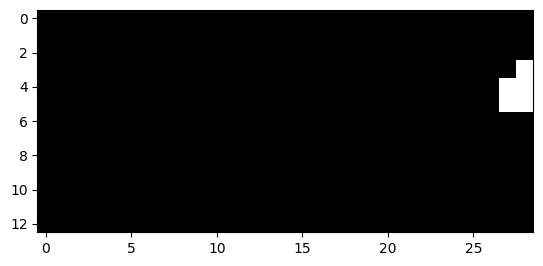

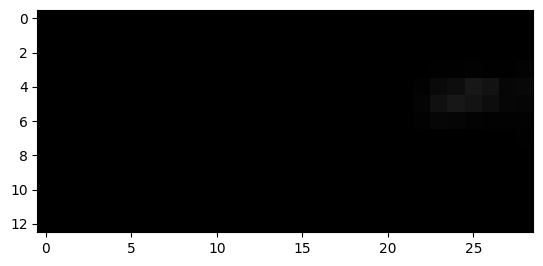

757


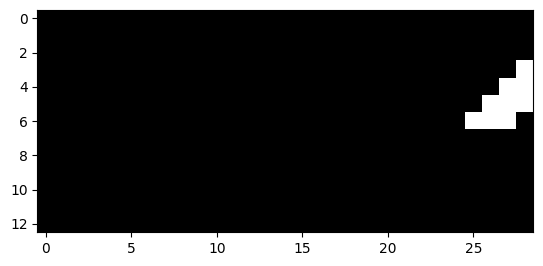

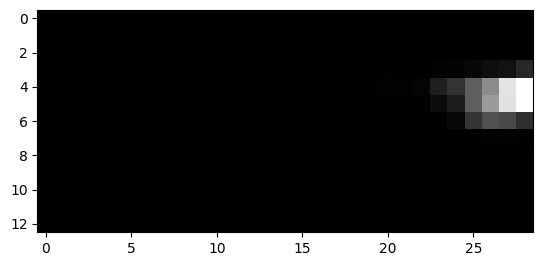

758


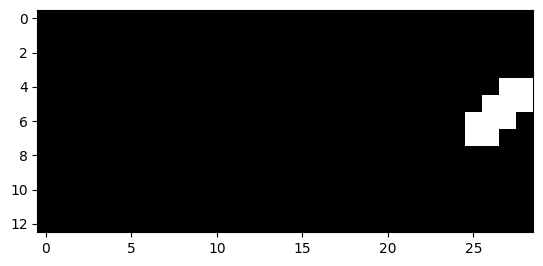

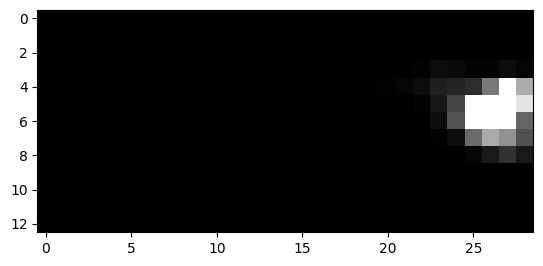

759


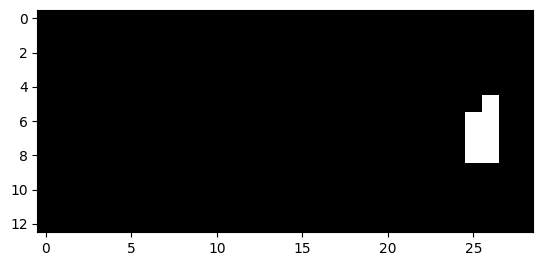

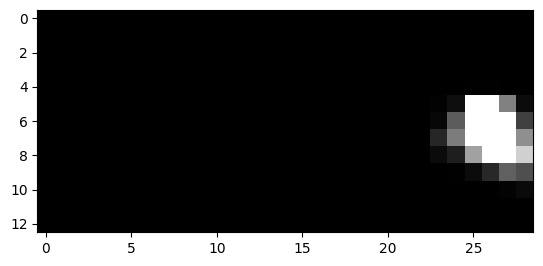

760


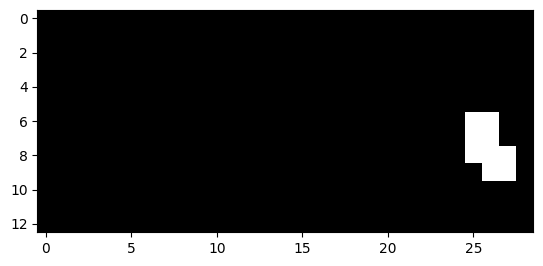

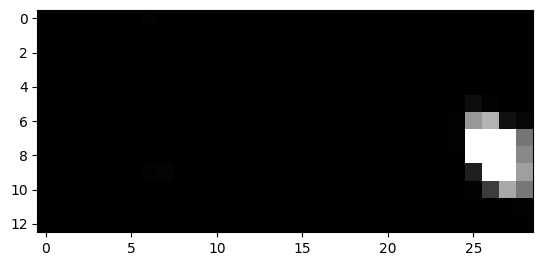

761


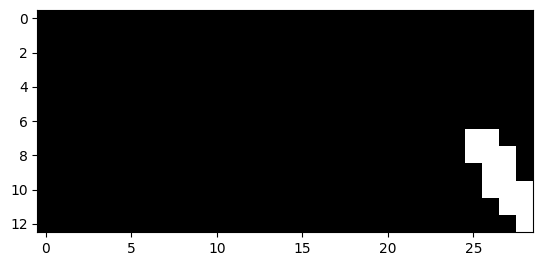

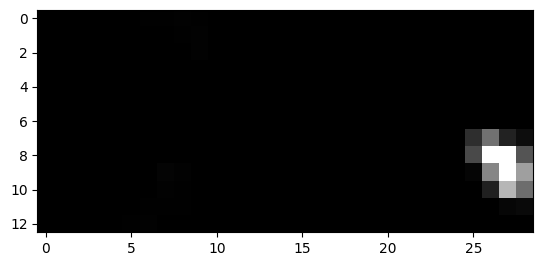

762


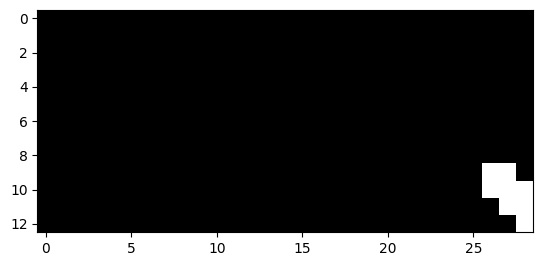

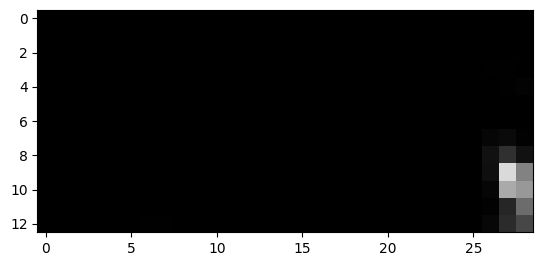

763


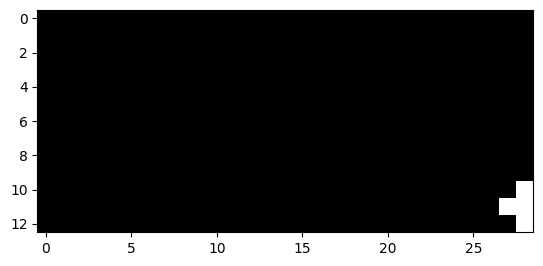

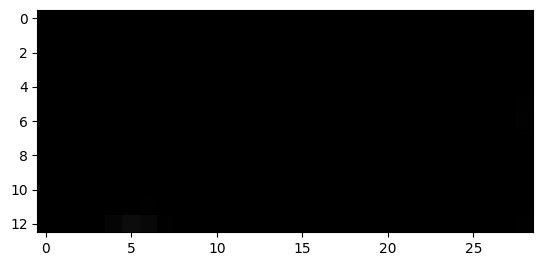

896


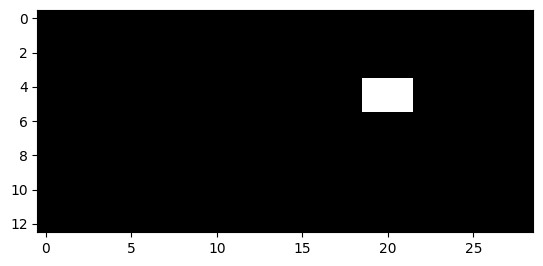

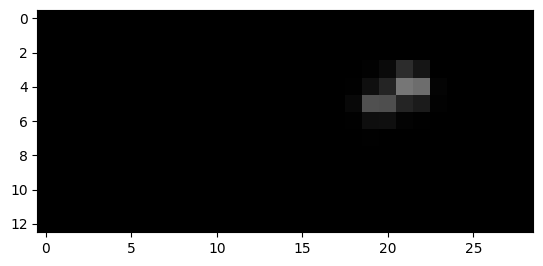

897


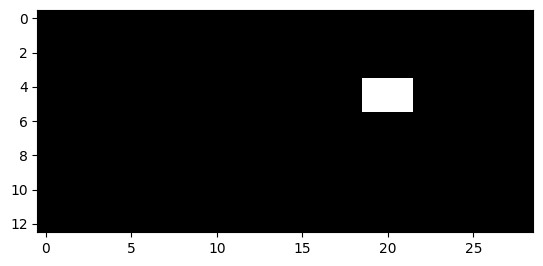

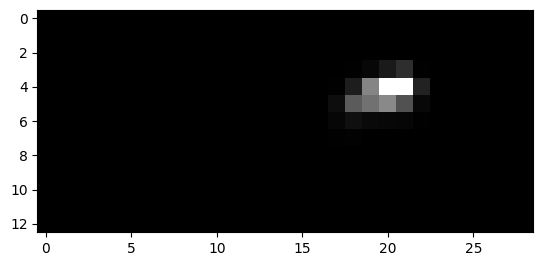

948


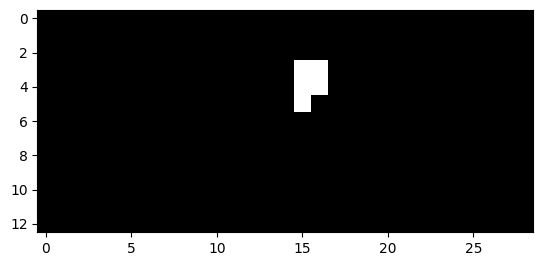

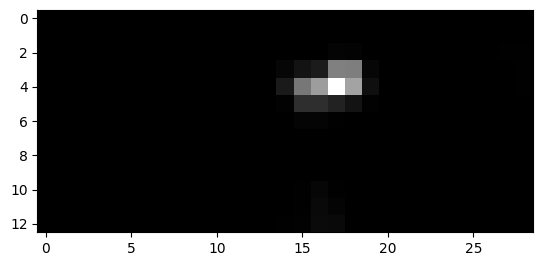

949


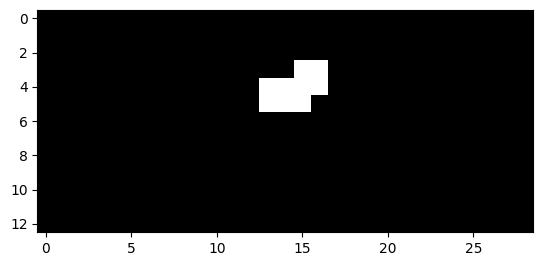

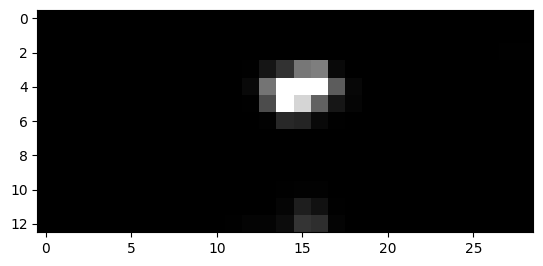

950


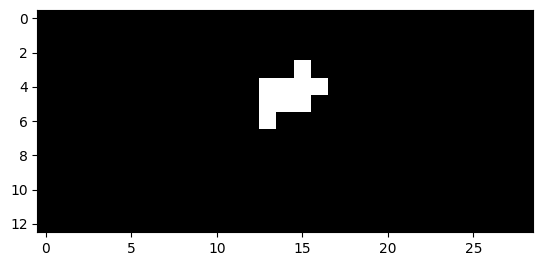

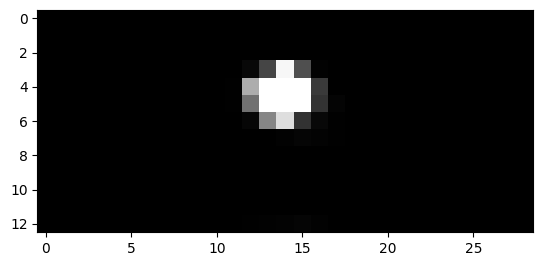

951


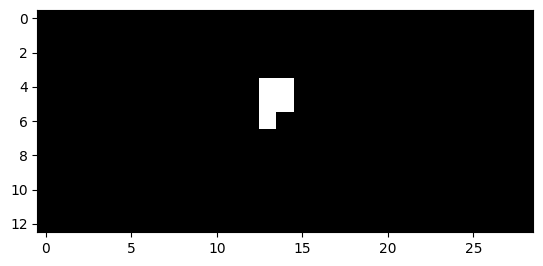

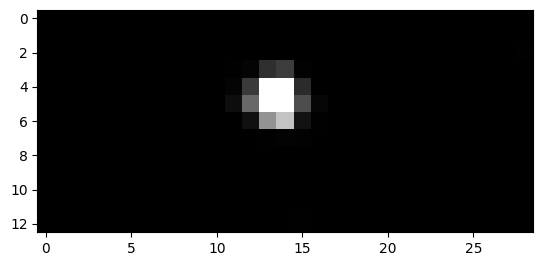

952


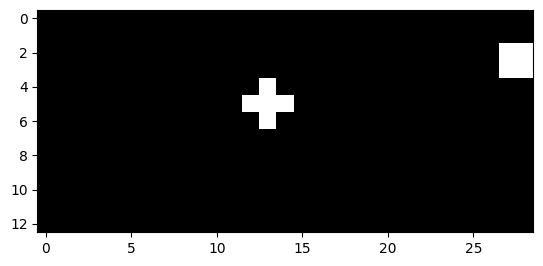

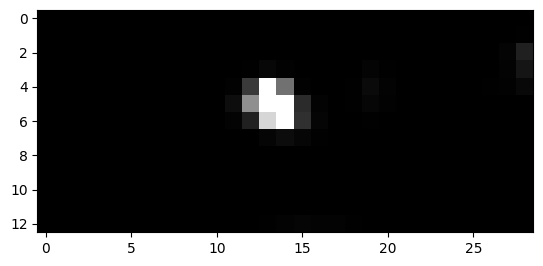

953


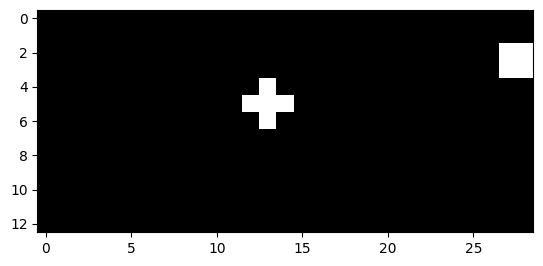

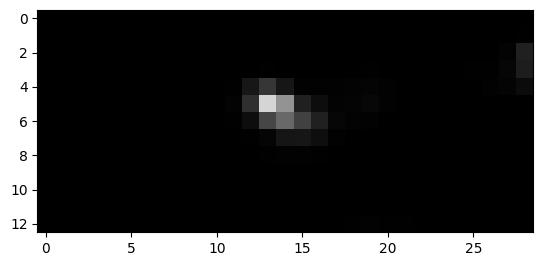

954


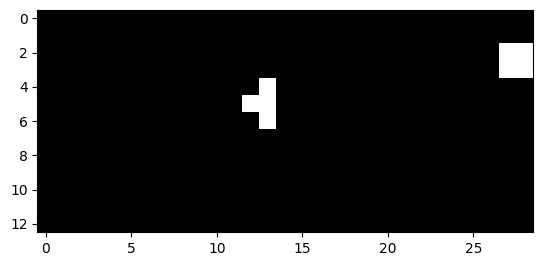

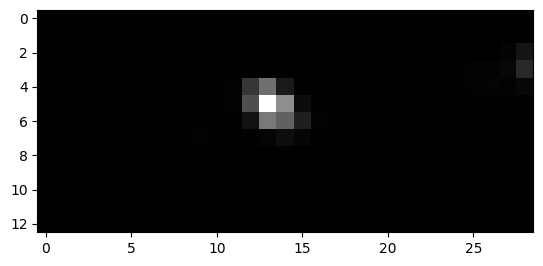

955


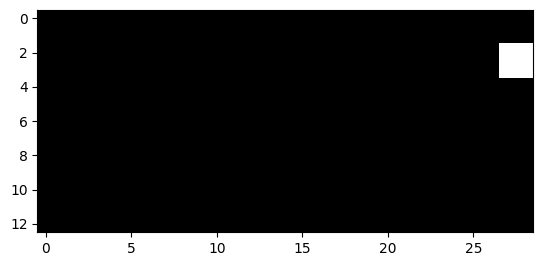

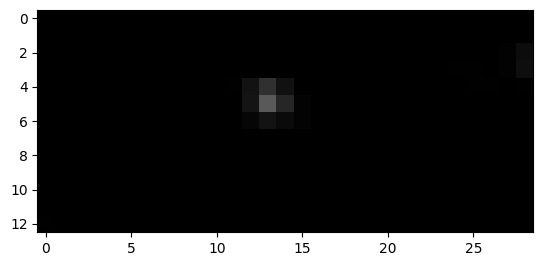

959


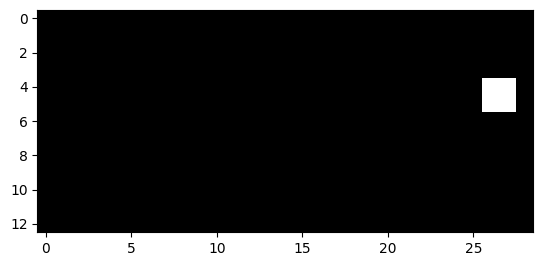

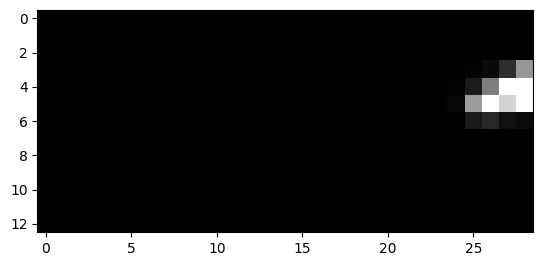

960


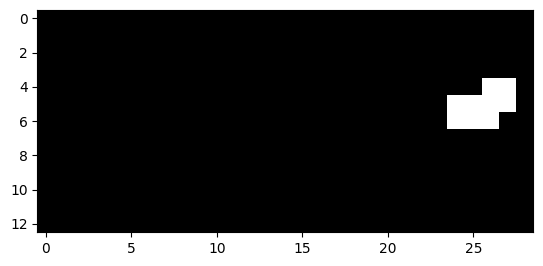

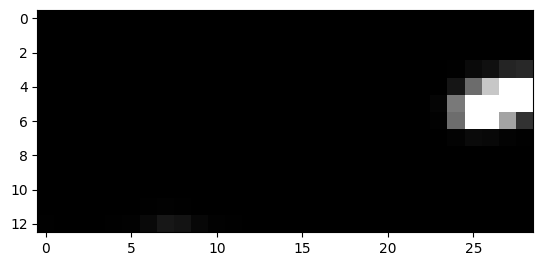

961


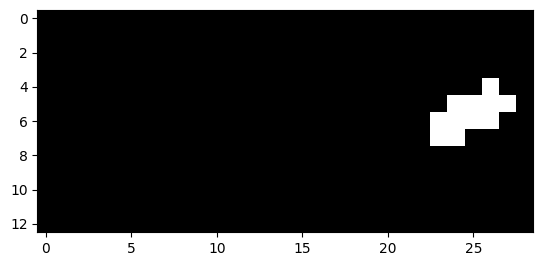

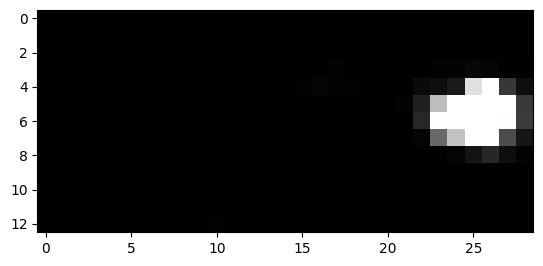

962


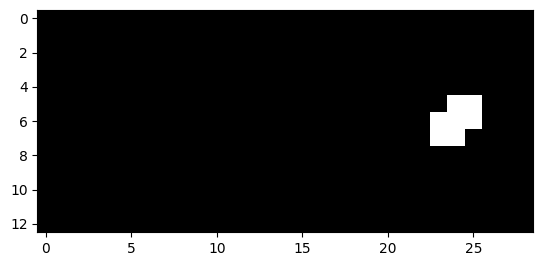

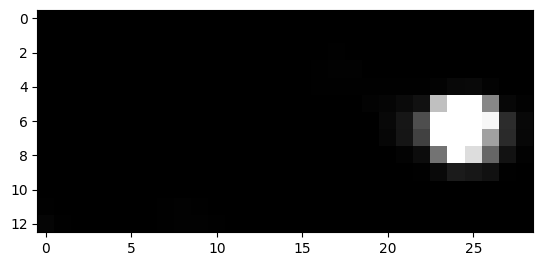

987


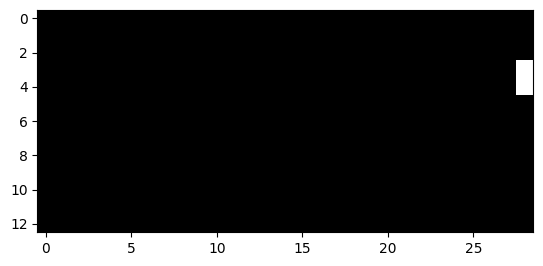

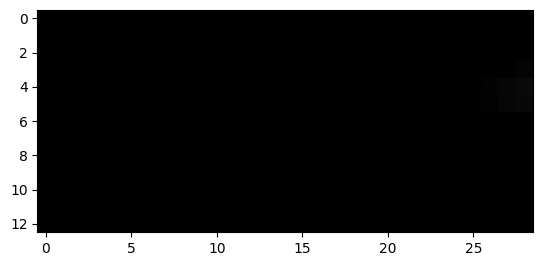

988


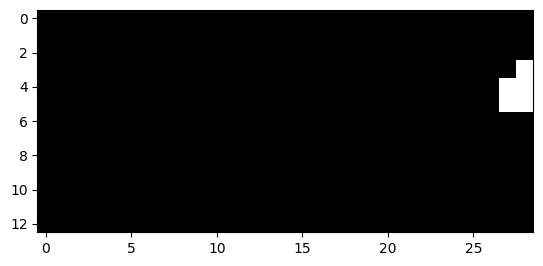

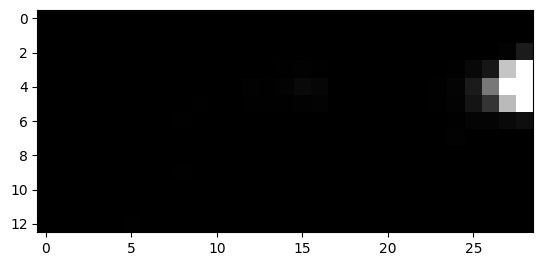

989


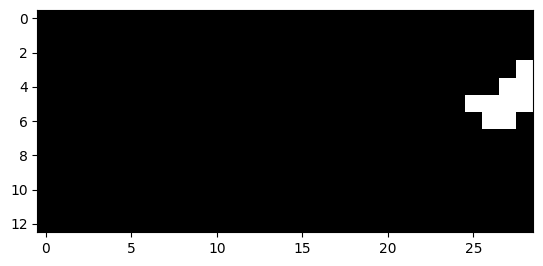

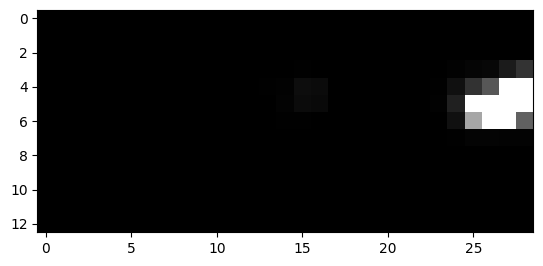

990


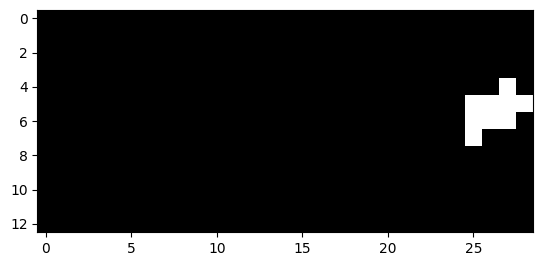

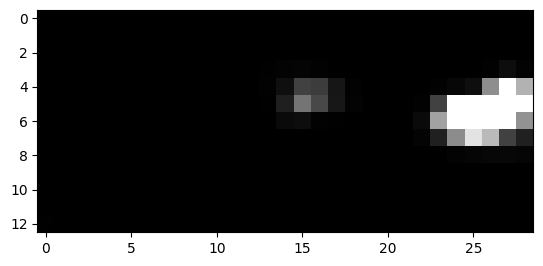

991


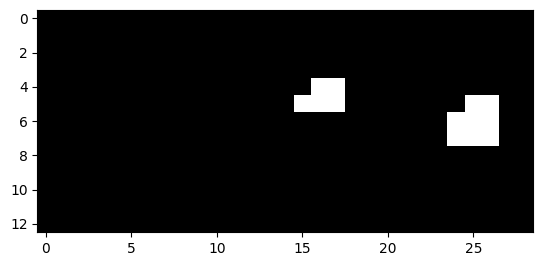

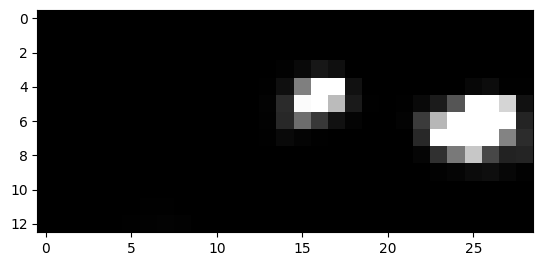

992


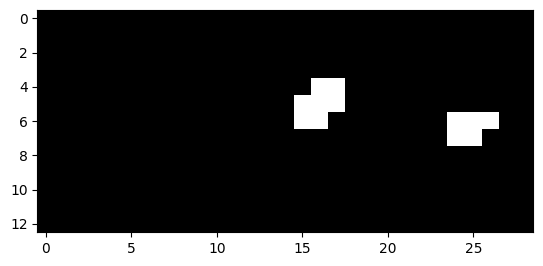

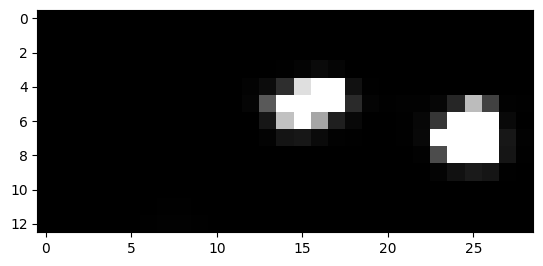

993


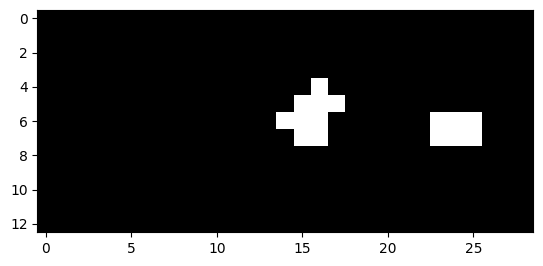

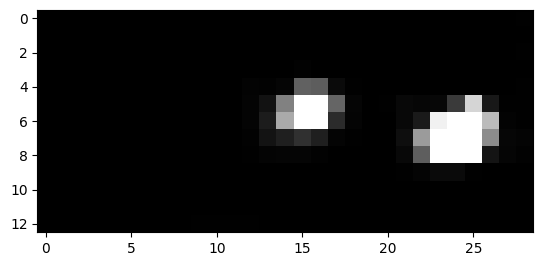

994


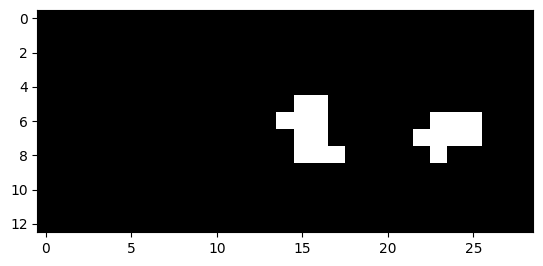

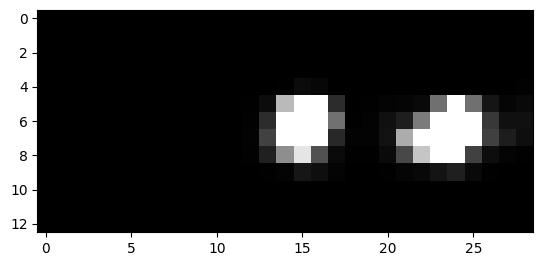

995


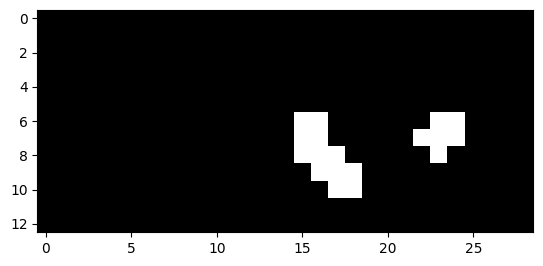

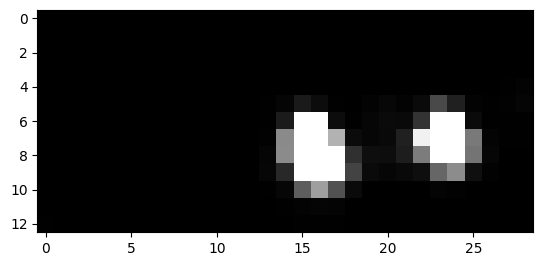

996


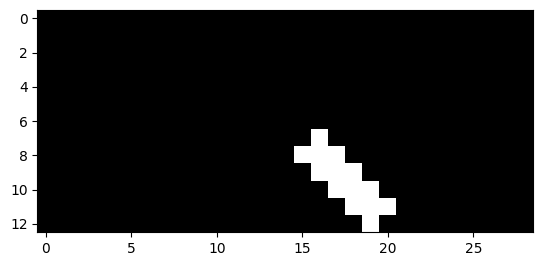

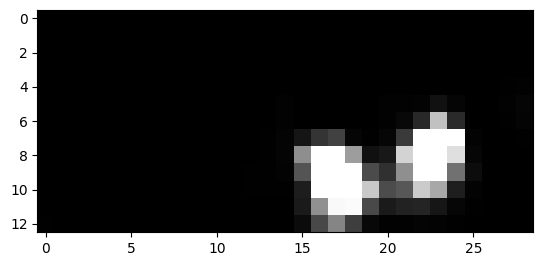

997


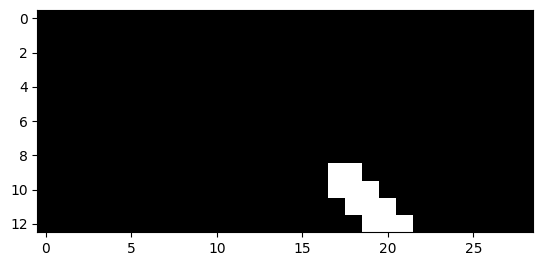

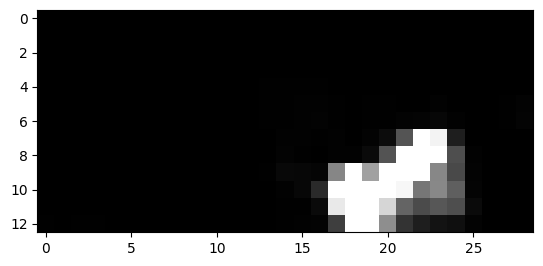

998


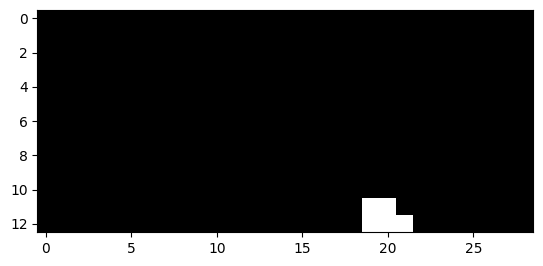

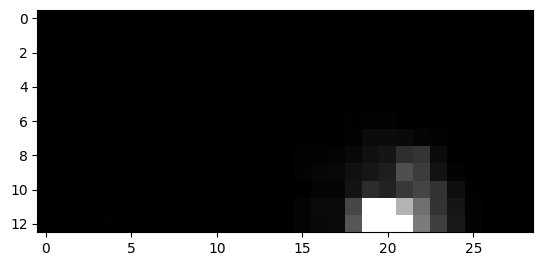

1023


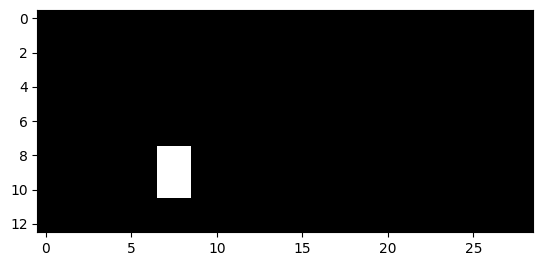

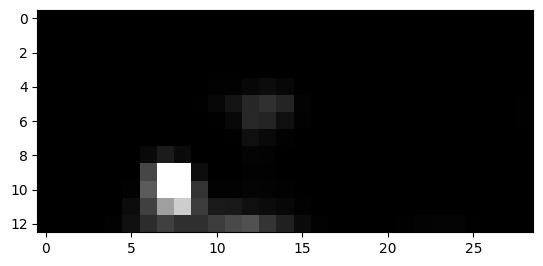

1024


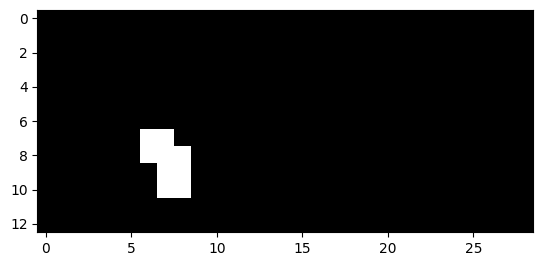

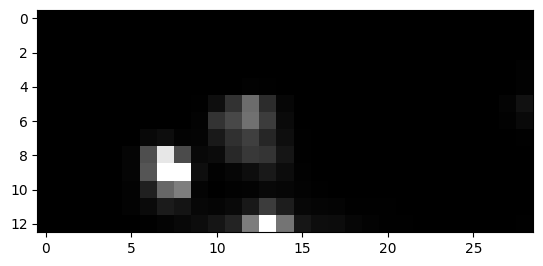

1025


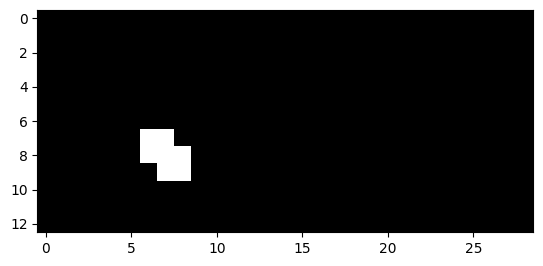

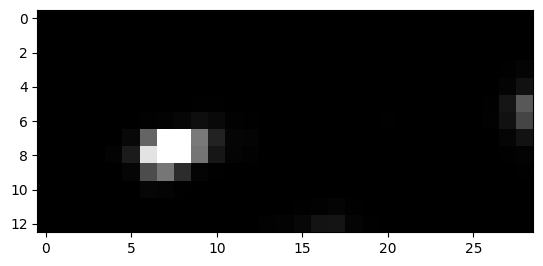

1027


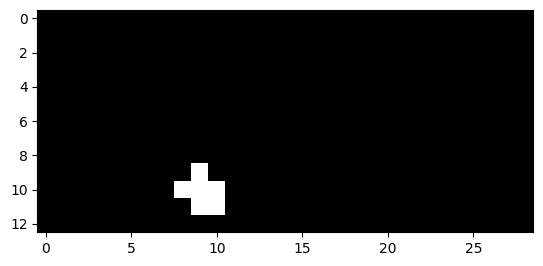

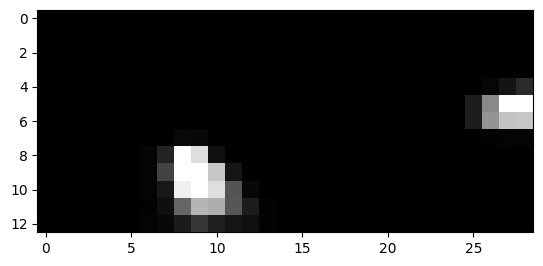

1028


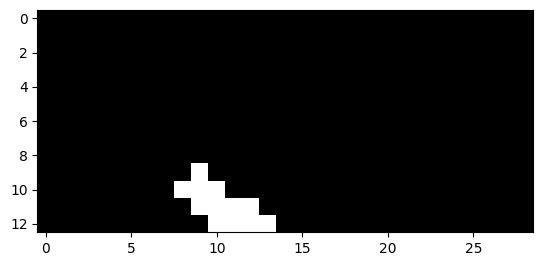

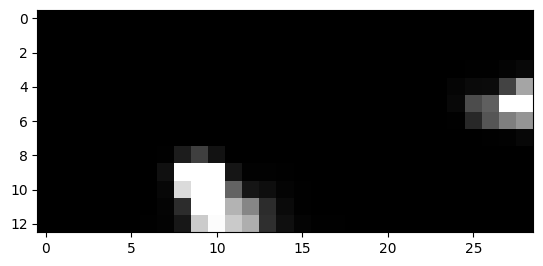

1029


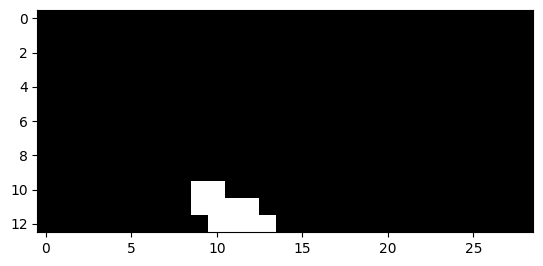

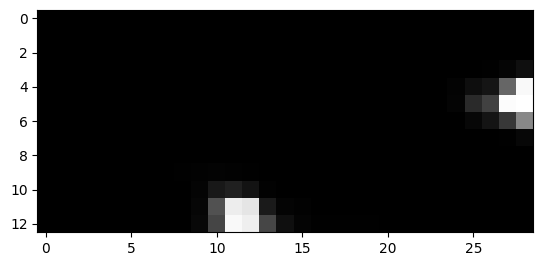

1039


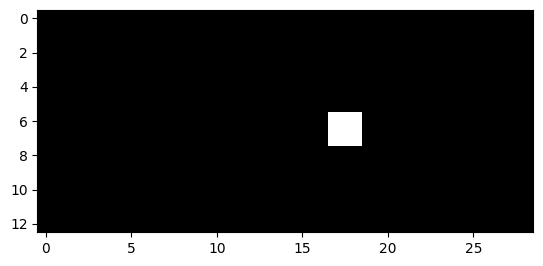

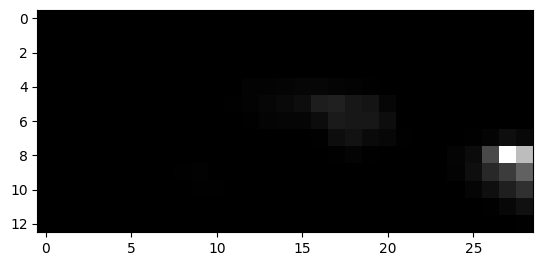

1040


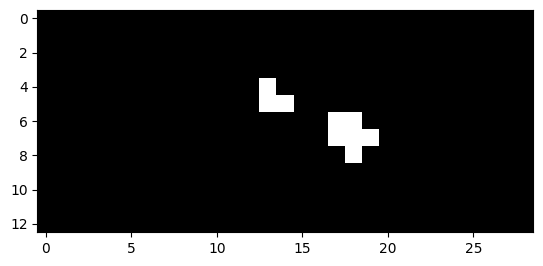

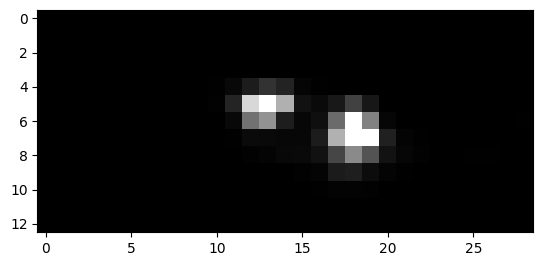

1041


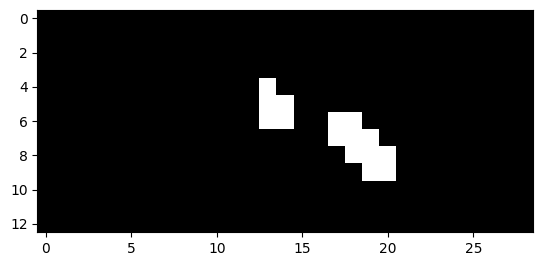

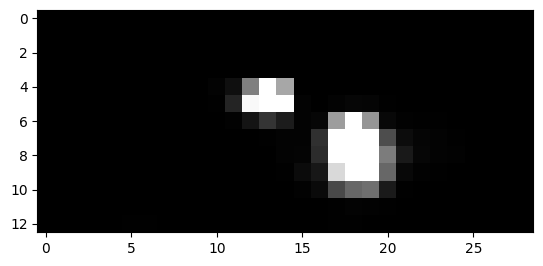

1042


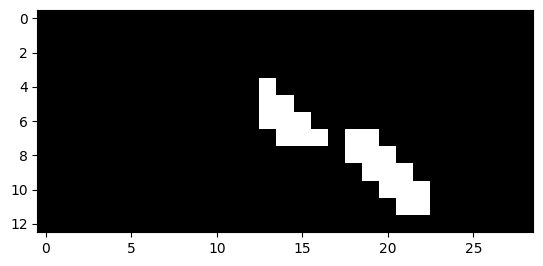

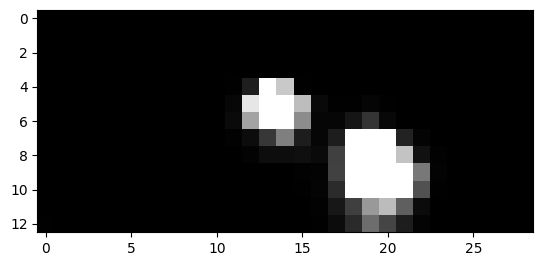

1043


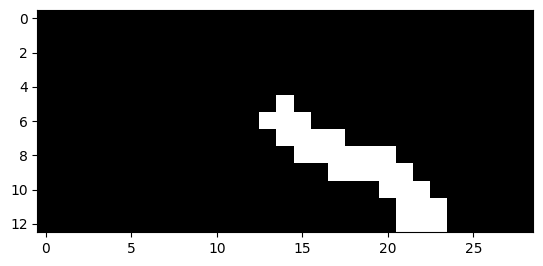

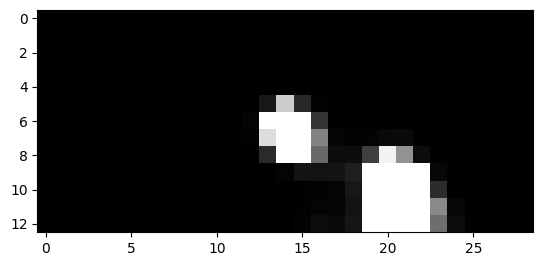

1044


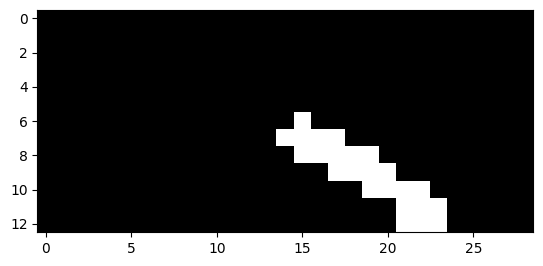

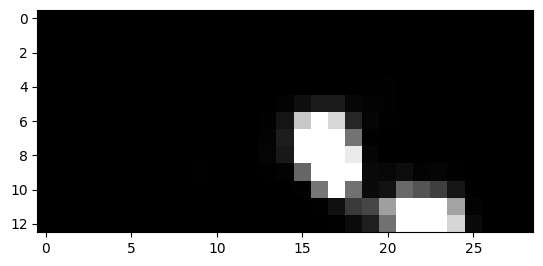

1045


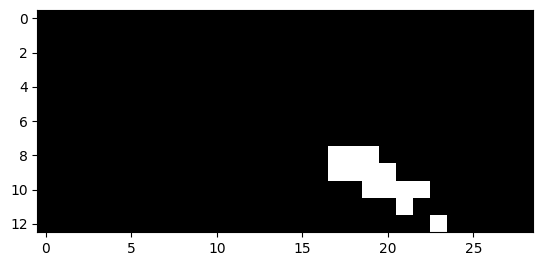

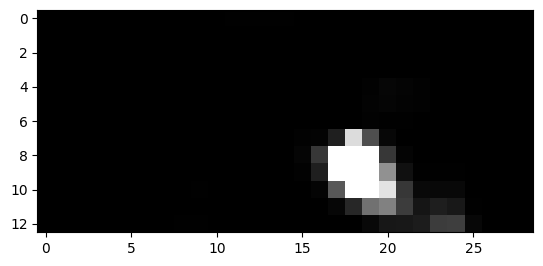

1046


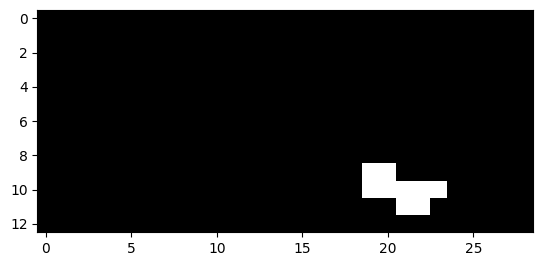

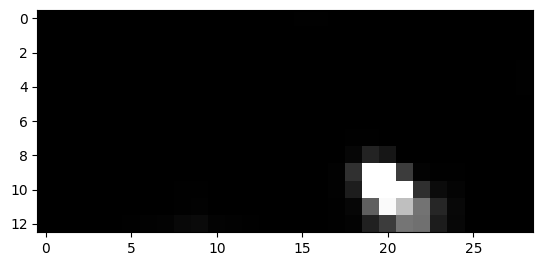

1047


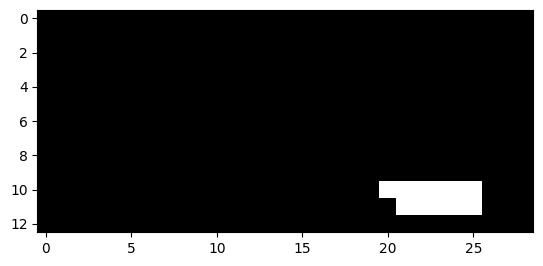

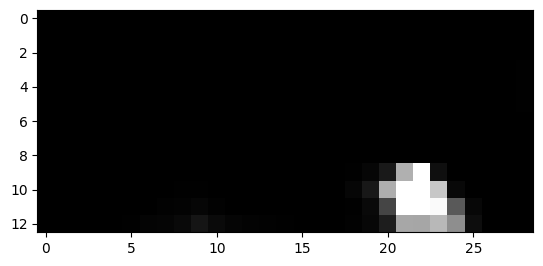

1048


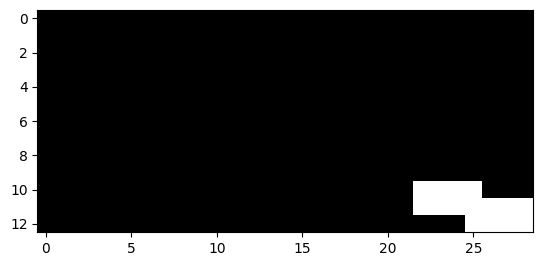

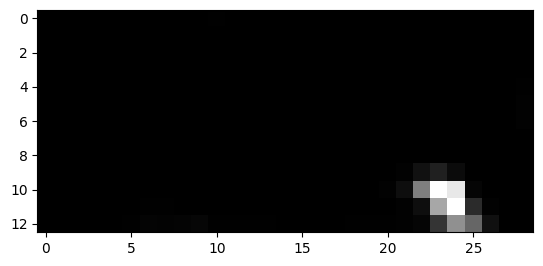

1049


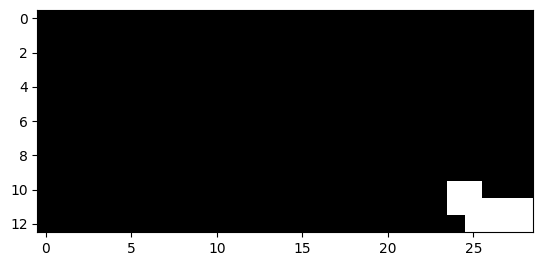

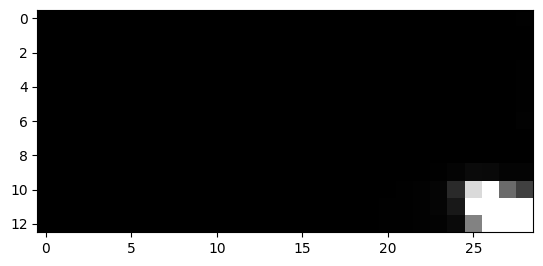

1050


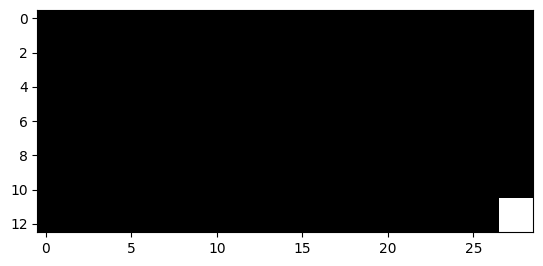

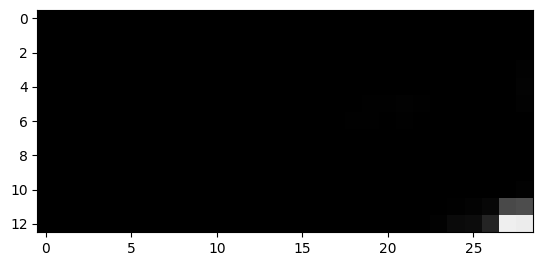

1064


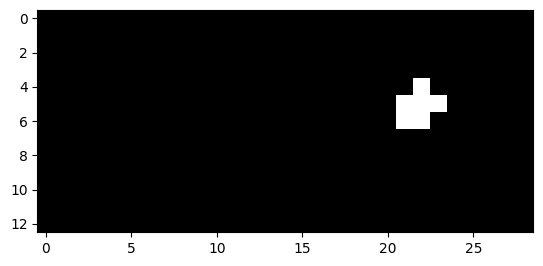

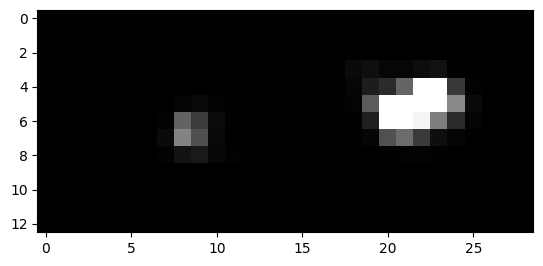

1065


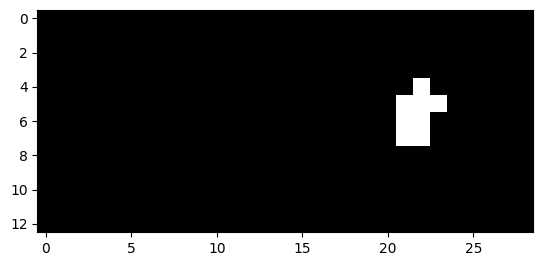

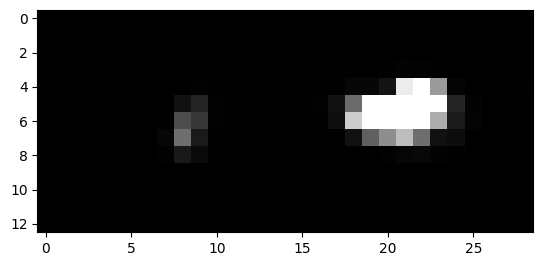

1066


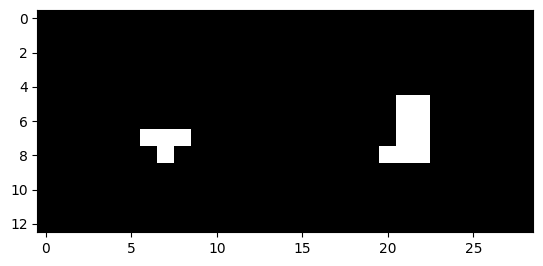

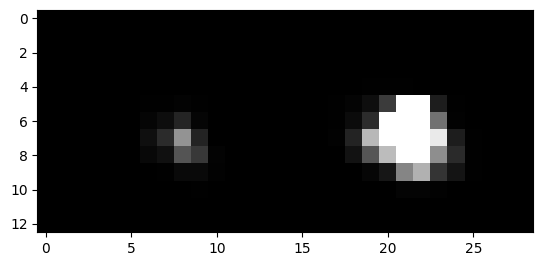

1067


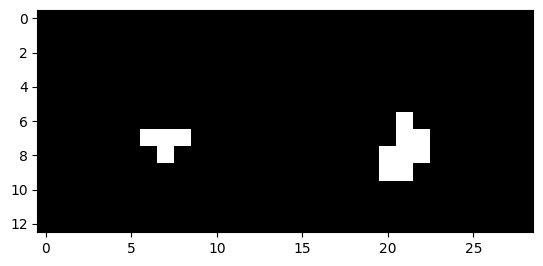

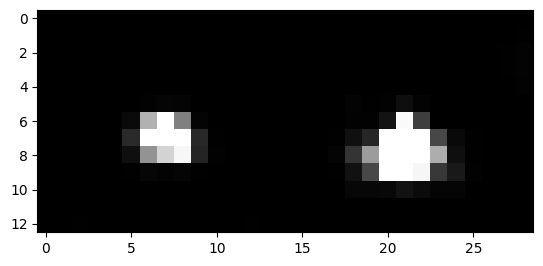

1068


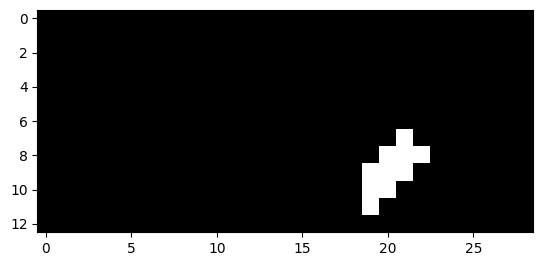

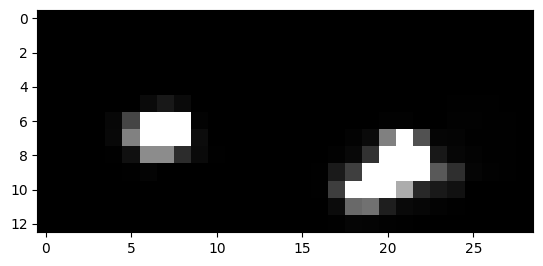

1069


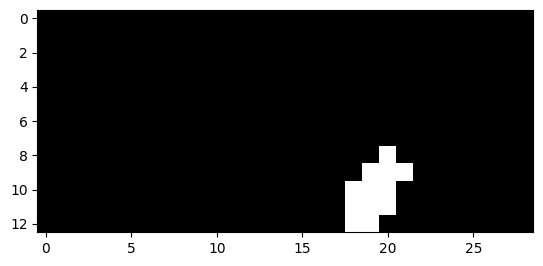

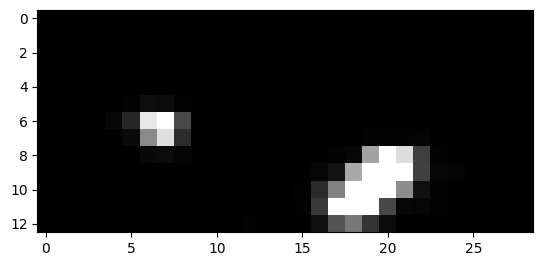

1070


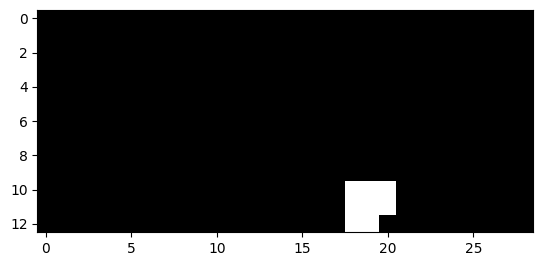

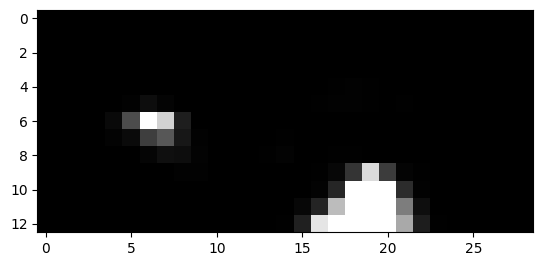

1071


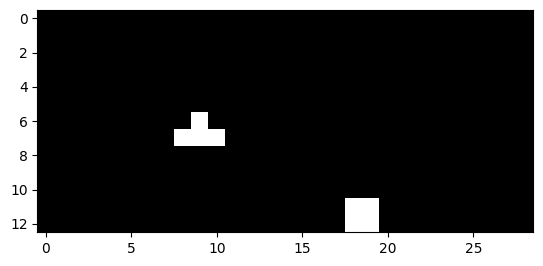

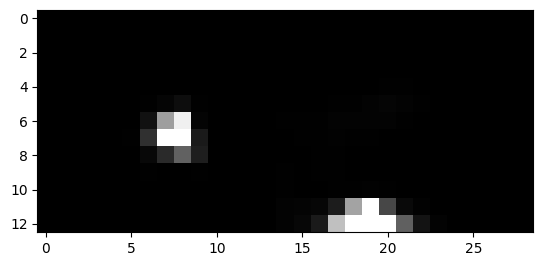

1072


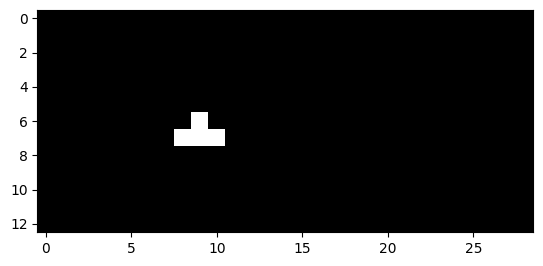

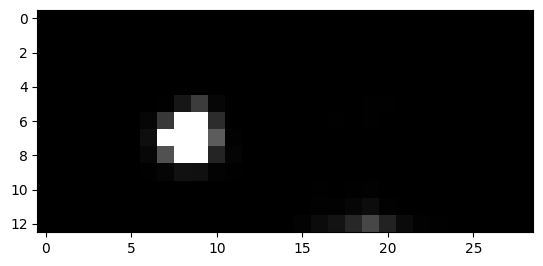

1073


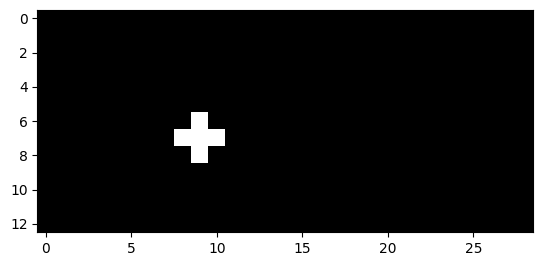

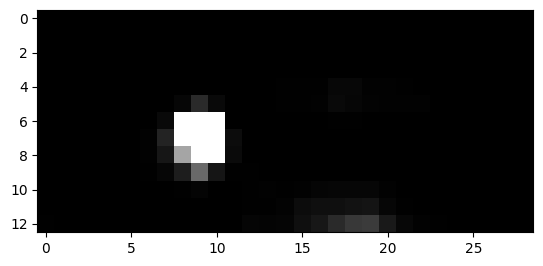

1074


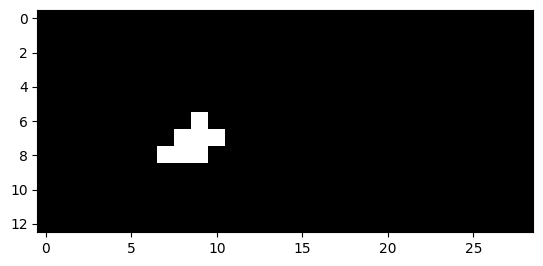

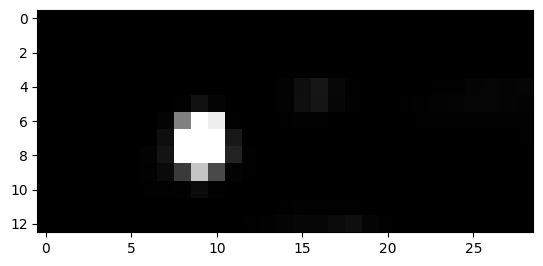

1075


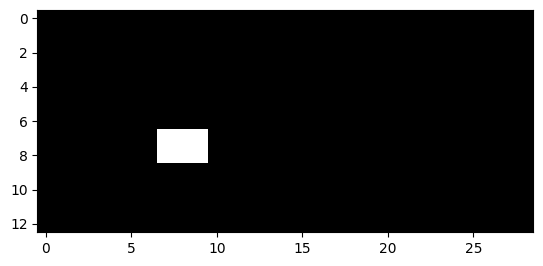

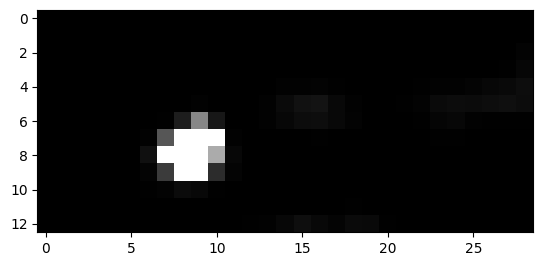

1076


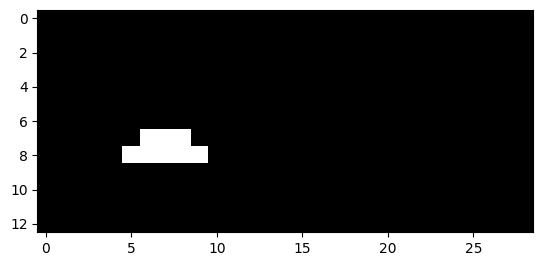

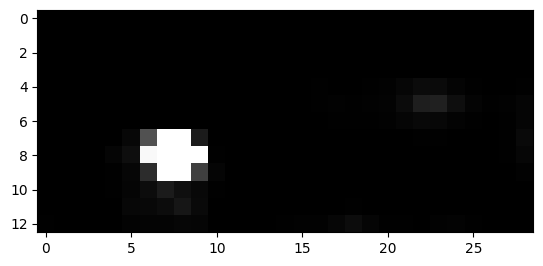

1077


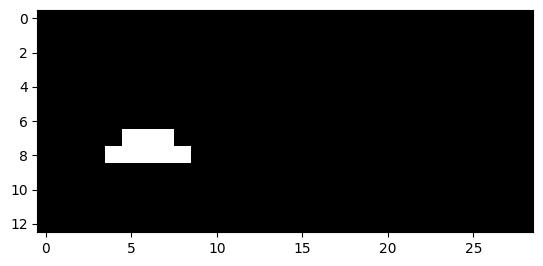

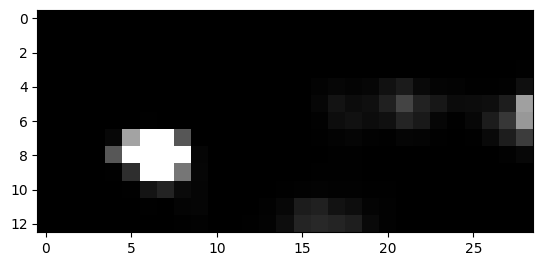

1078


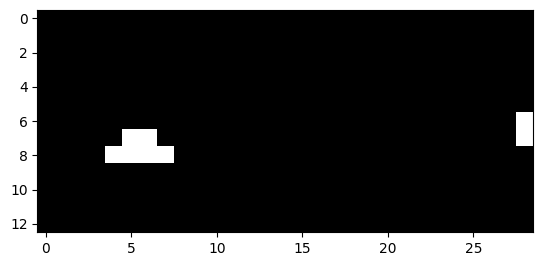

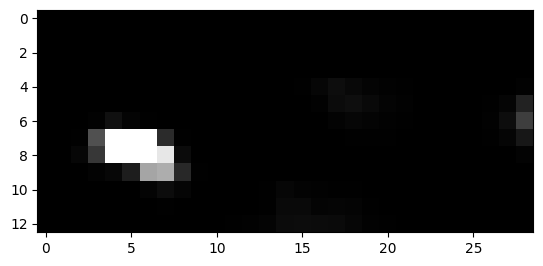

1079


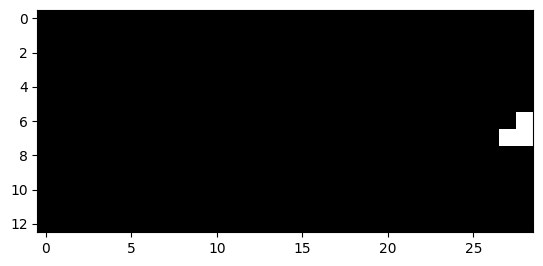

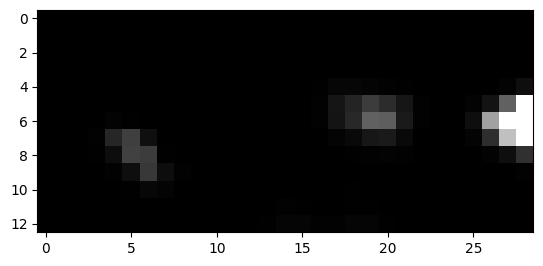

1080


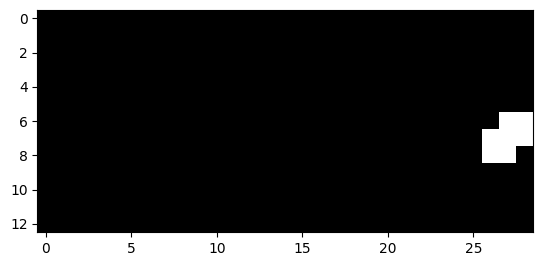

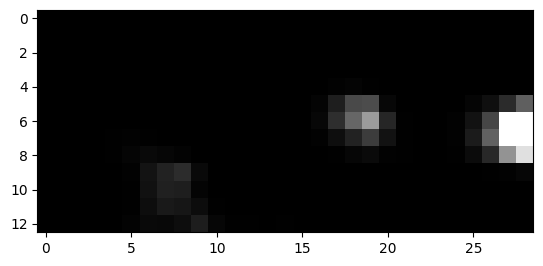

1081


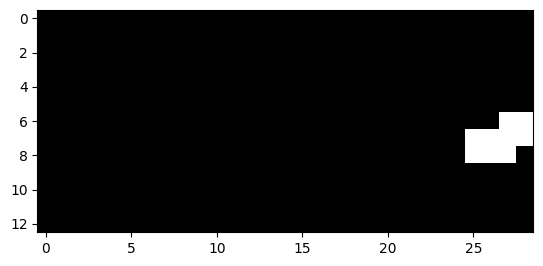

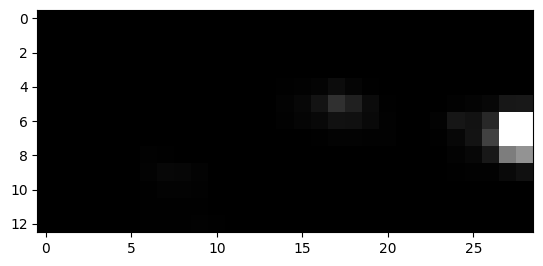

1082


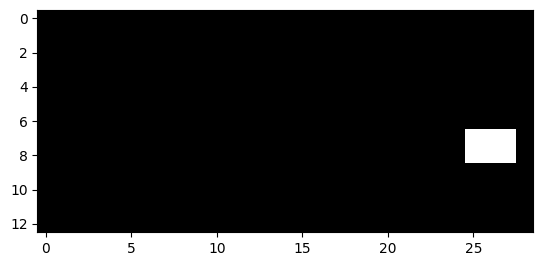

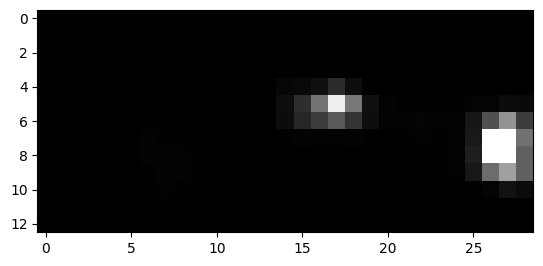

1083


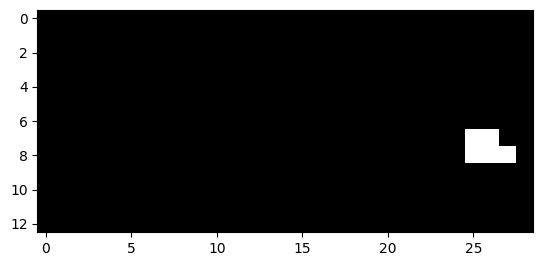

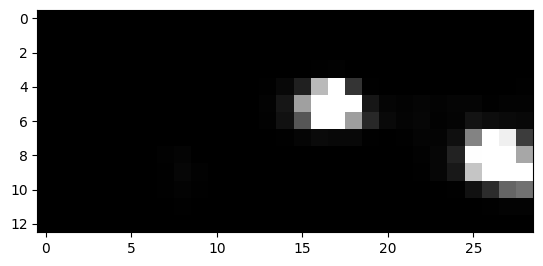

1084


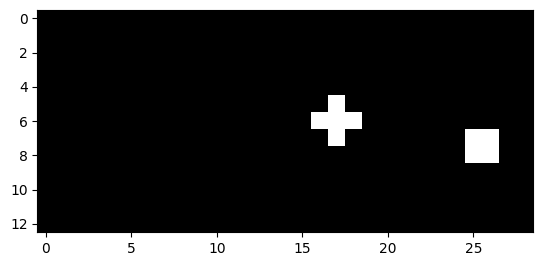

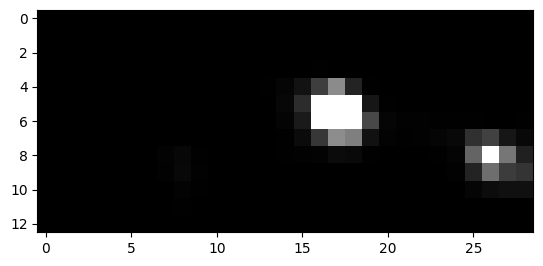

1085


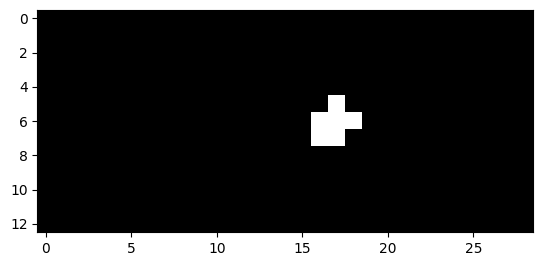

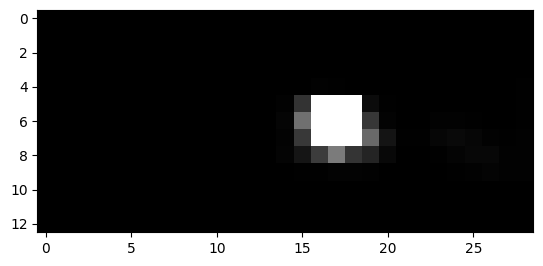

1086


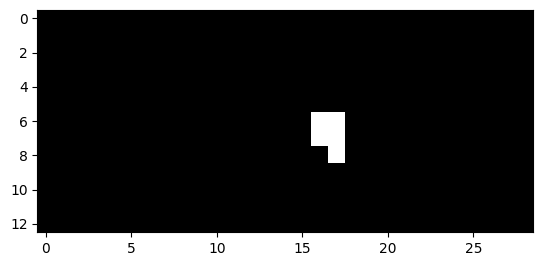

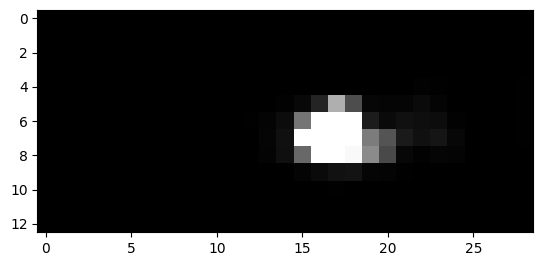

1087


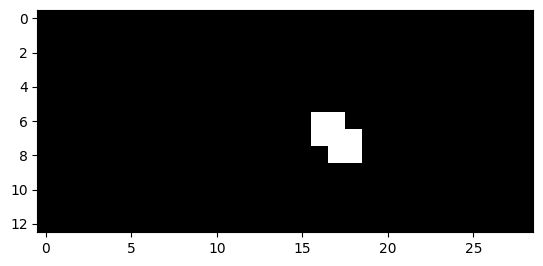

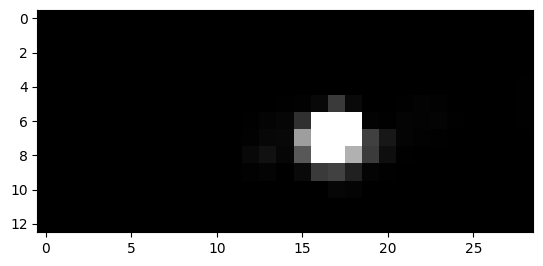

1088


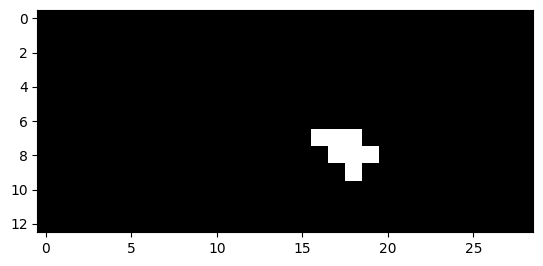

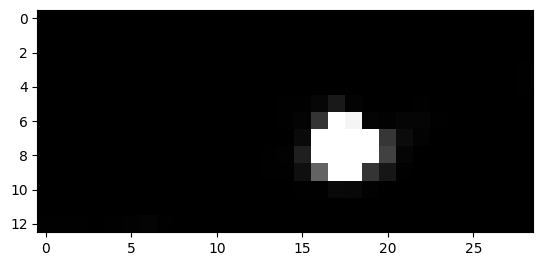

1089


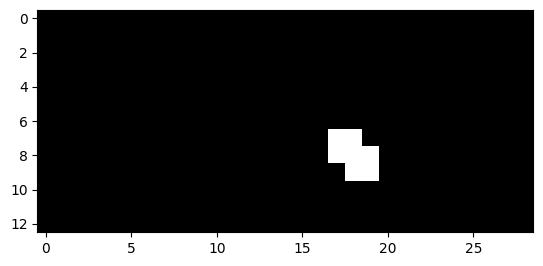

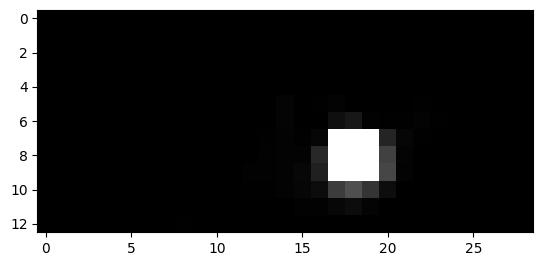

1090


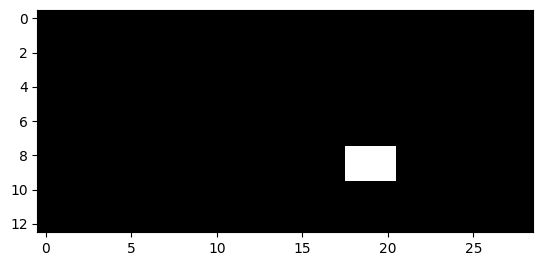

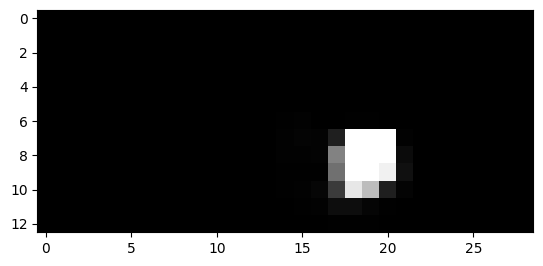

1091


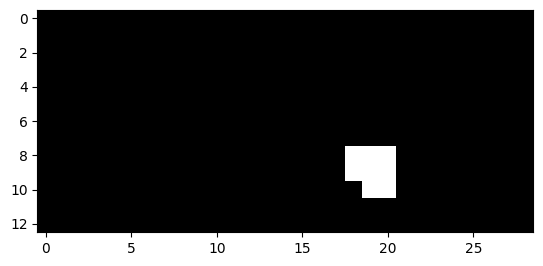

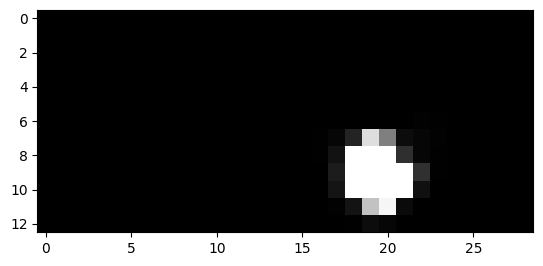

1092


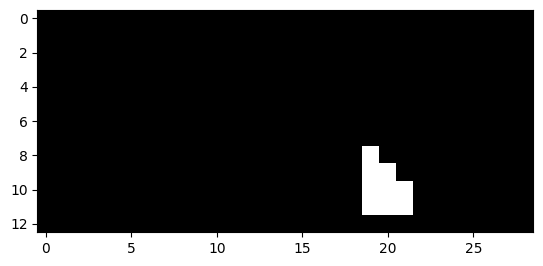

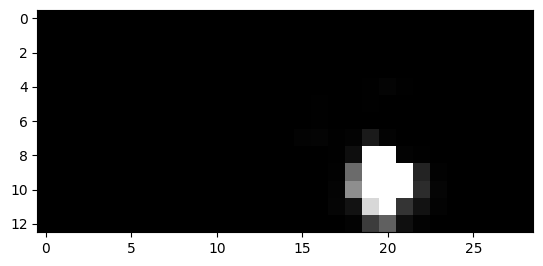

1093


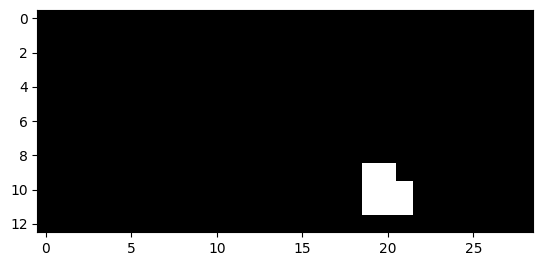

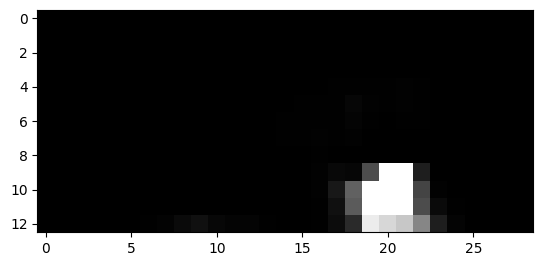

1094


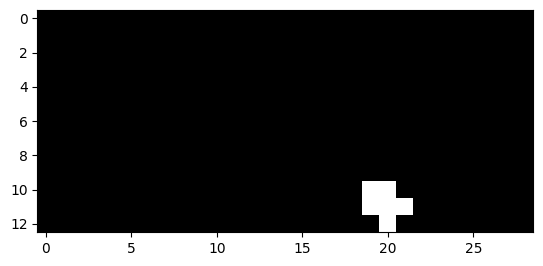

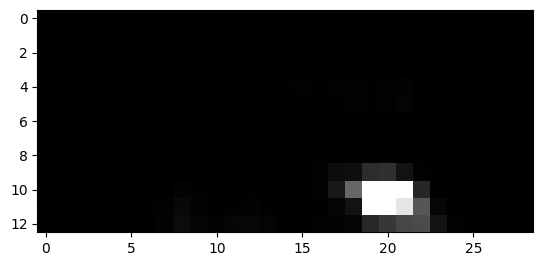

1095


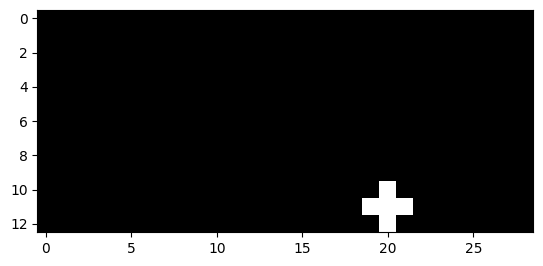

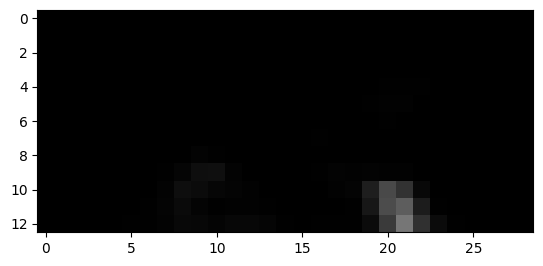

1116


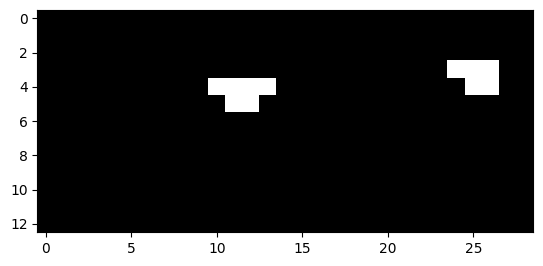

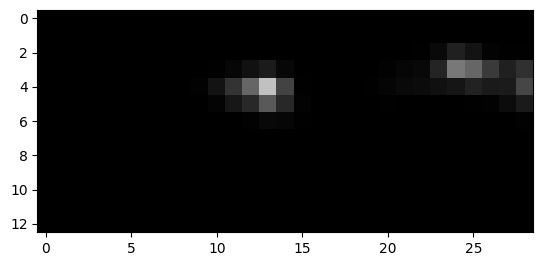

1117


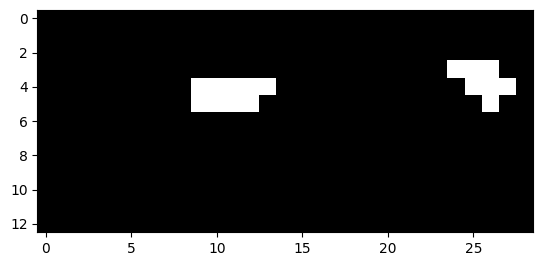

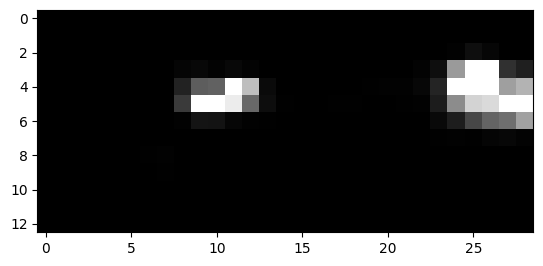

1118


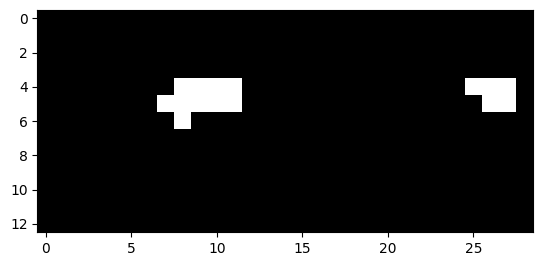

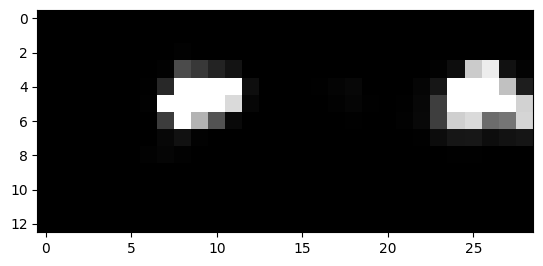

1119


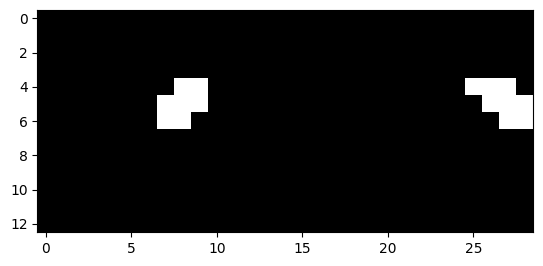

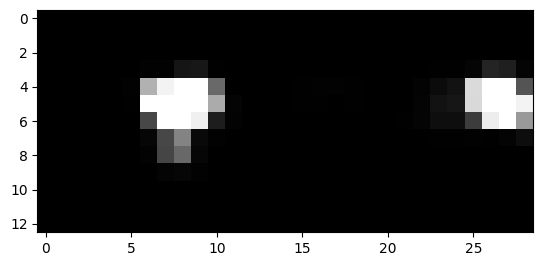

1120


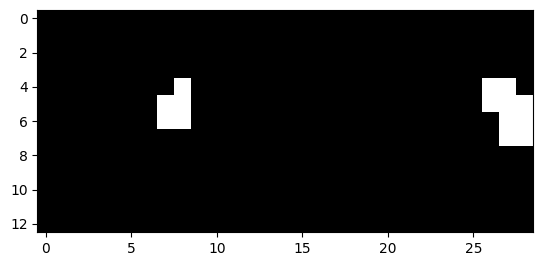

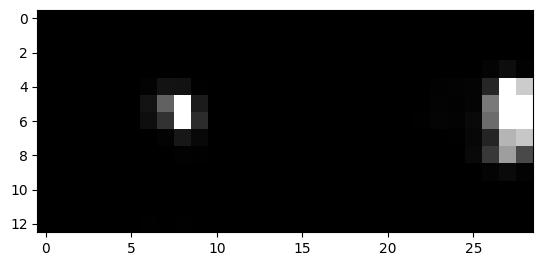

1121


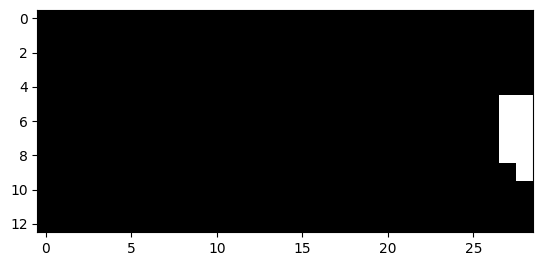

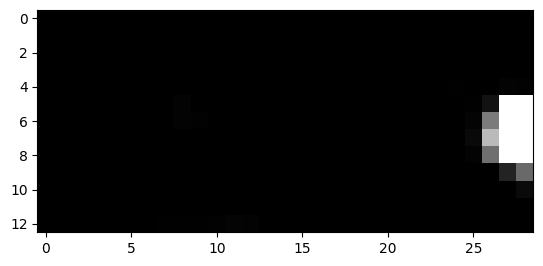

1122


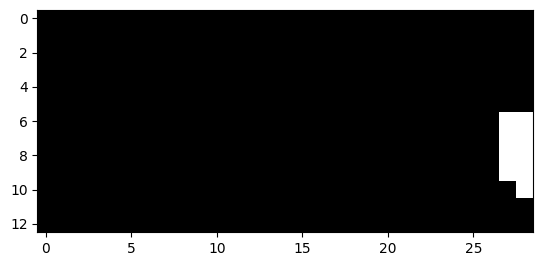

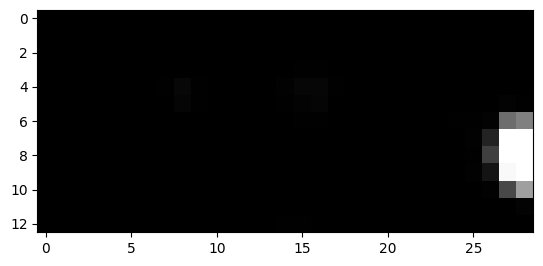

1123


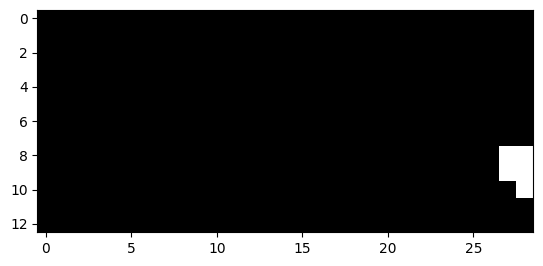

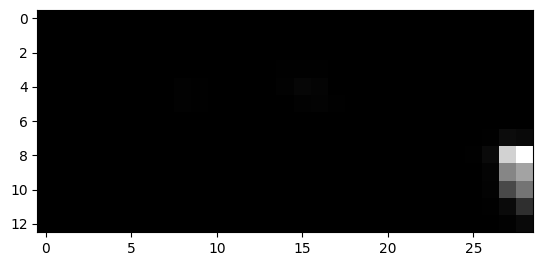

1341


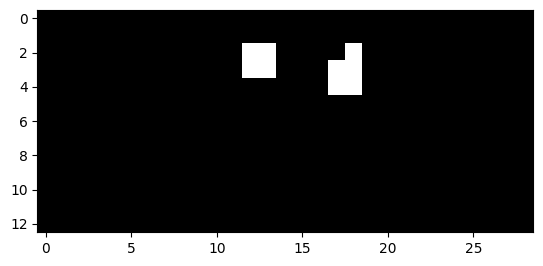

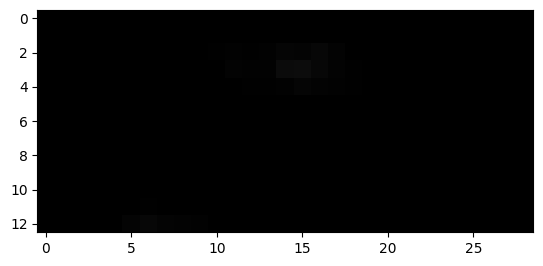

1342


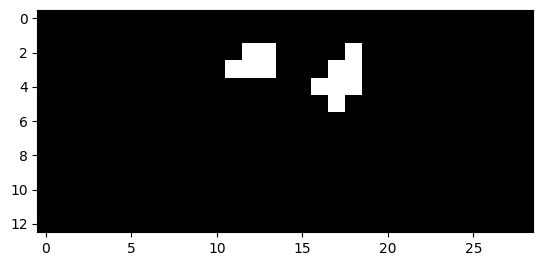

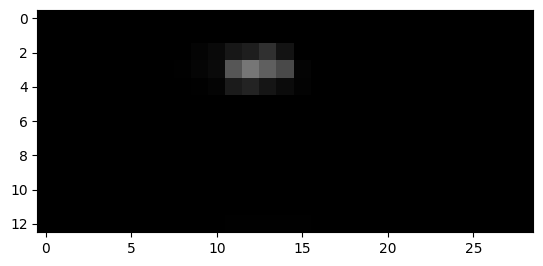

1343


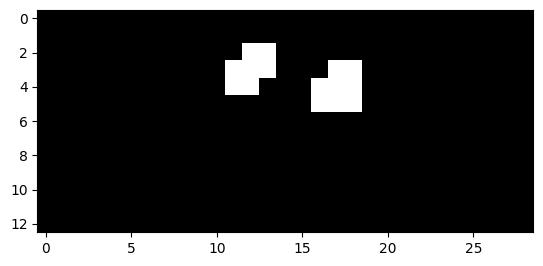

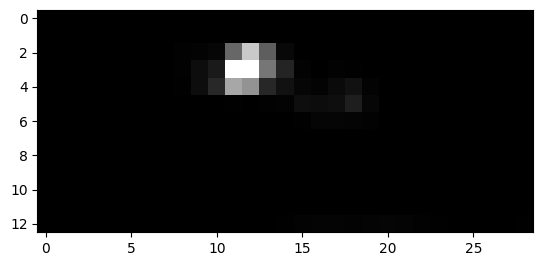

1344


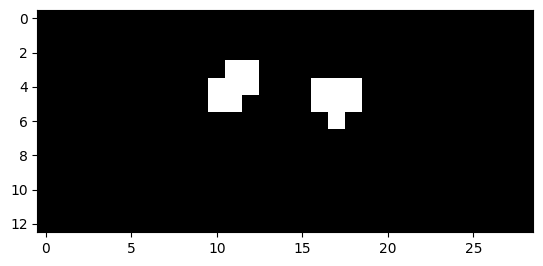

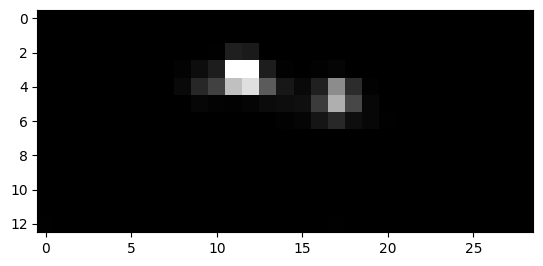

1345


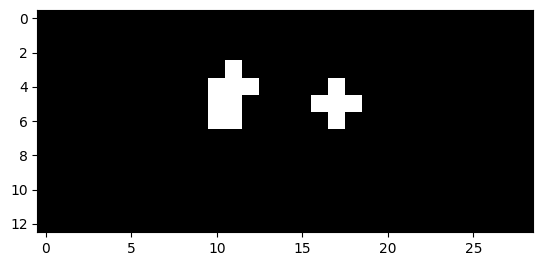

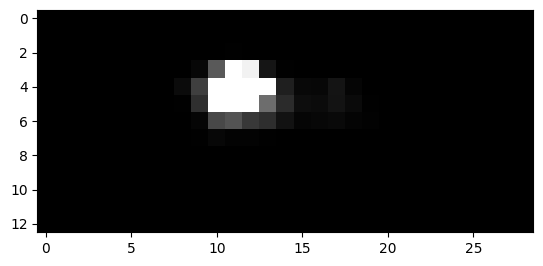

1346


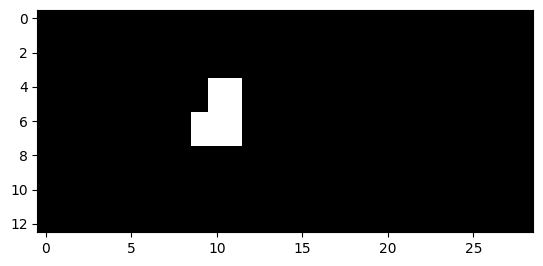

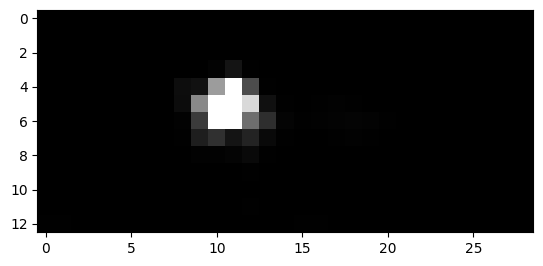

1347


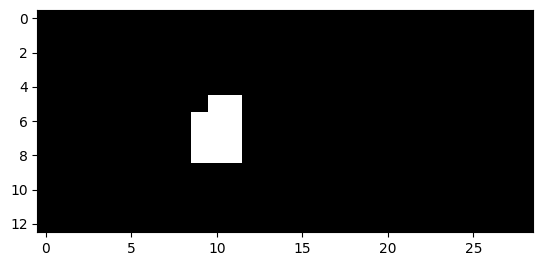

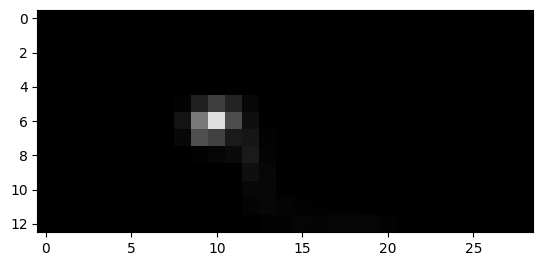

1348


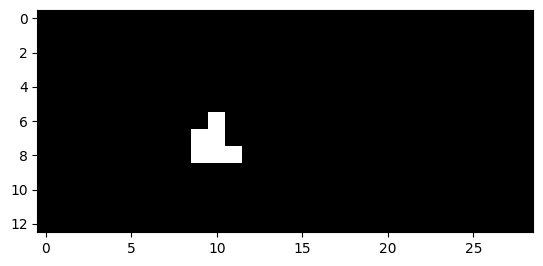

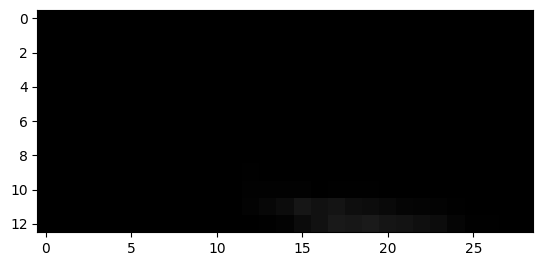

1366


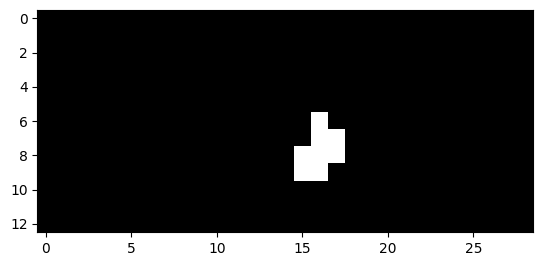

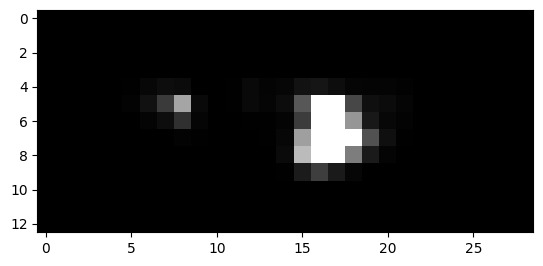

1367


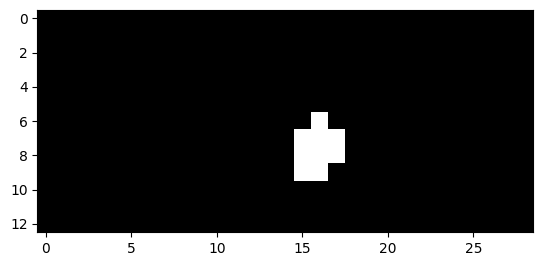

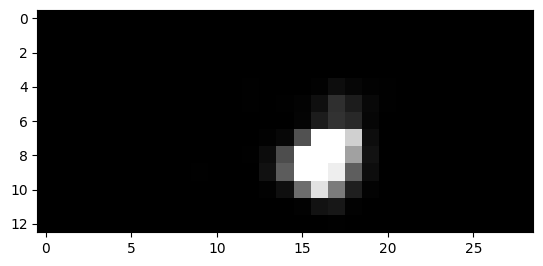

1368


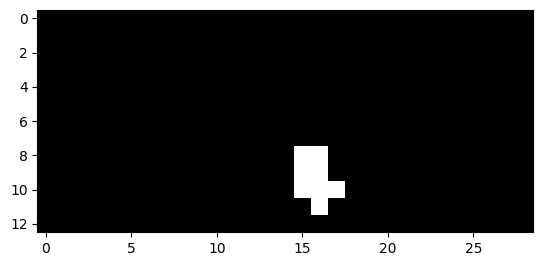

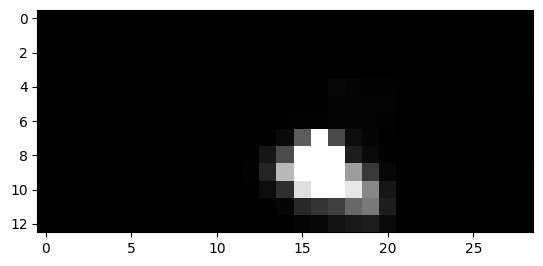

1369


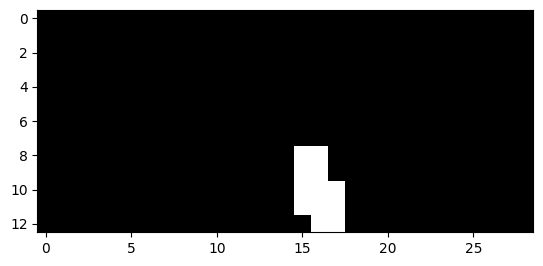

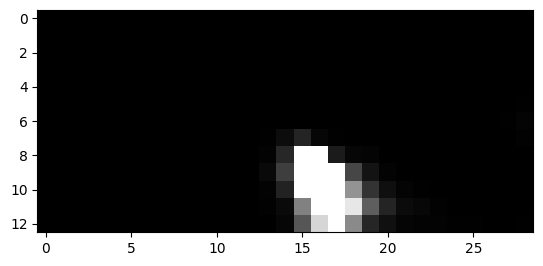

1370


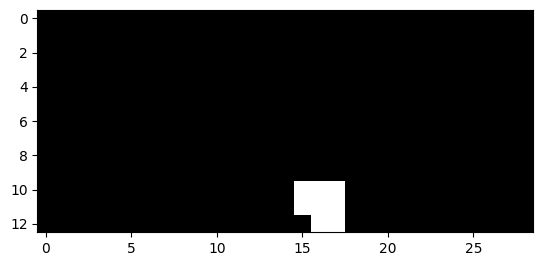

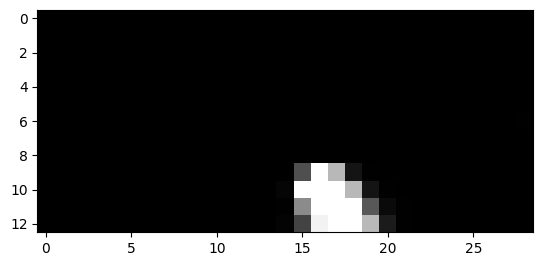

1371


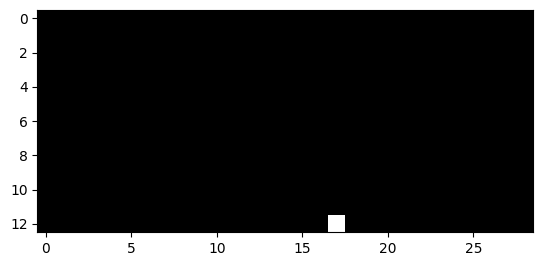

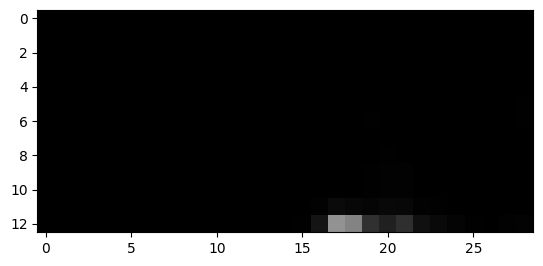

1389


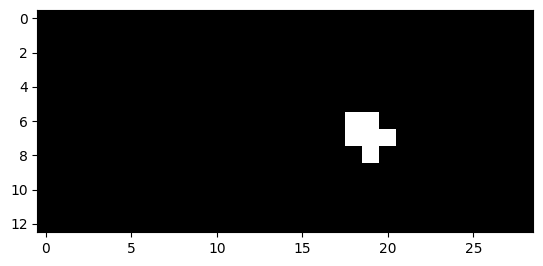

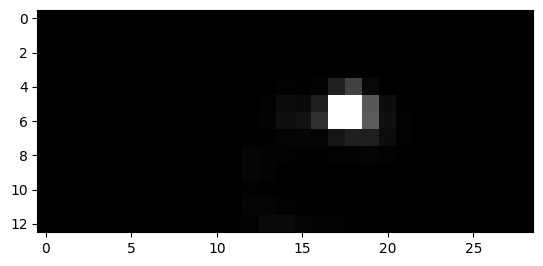

1390


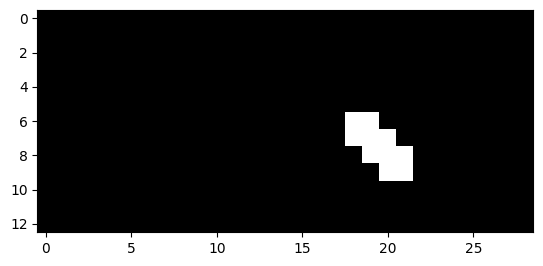

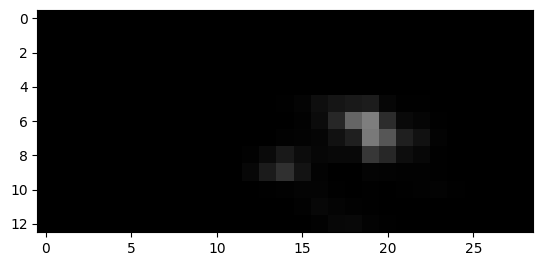

1391


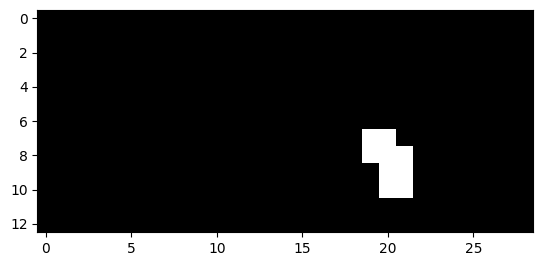

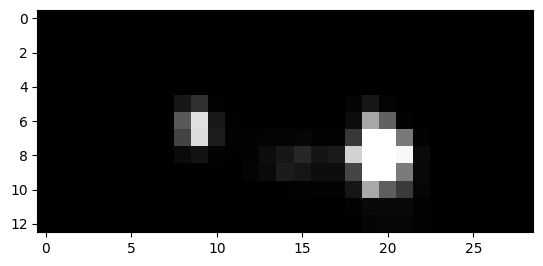

1392


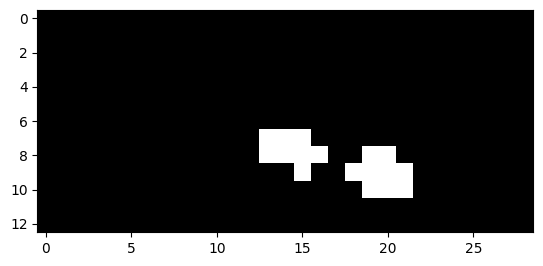

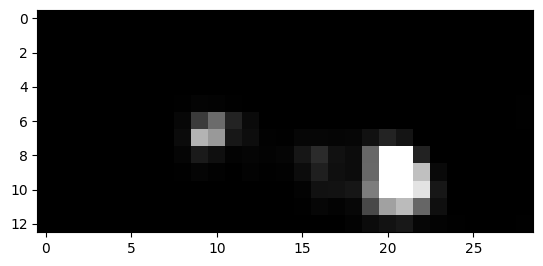

1393


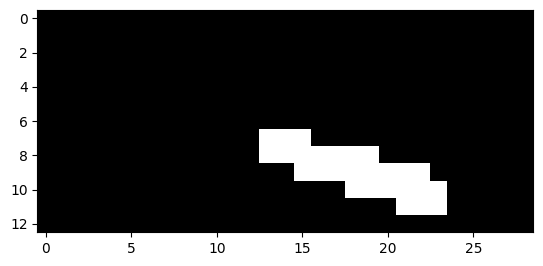

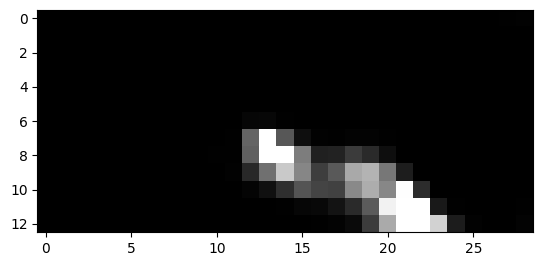

1394


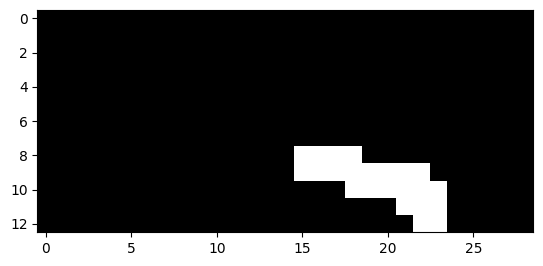

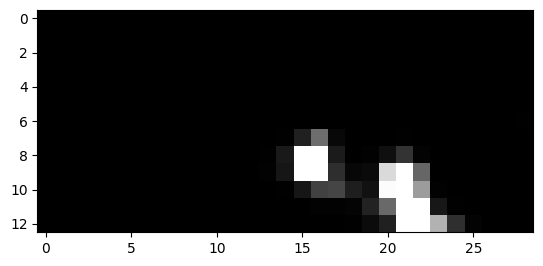

1395


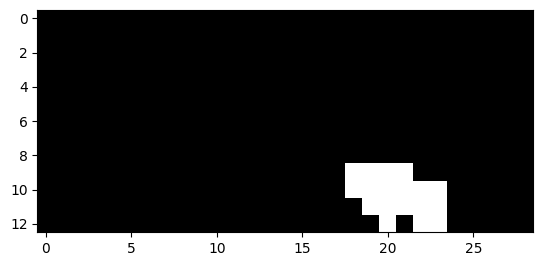

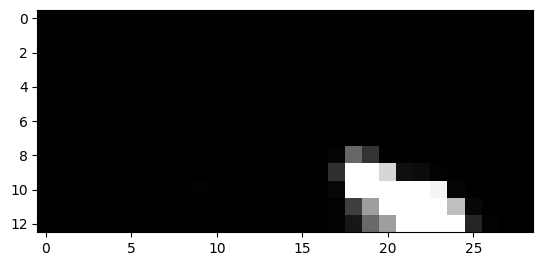

1396


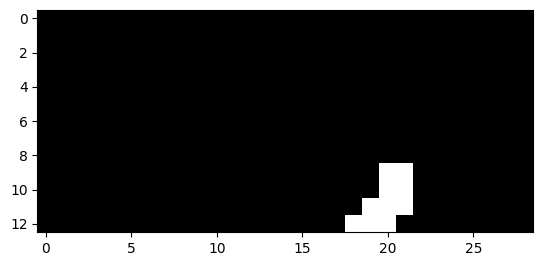

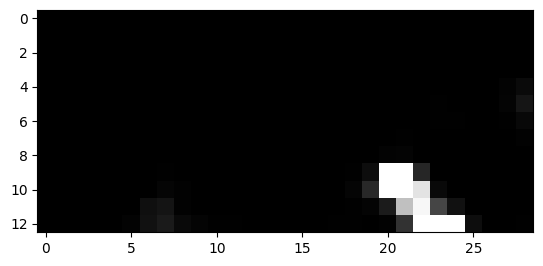

1397


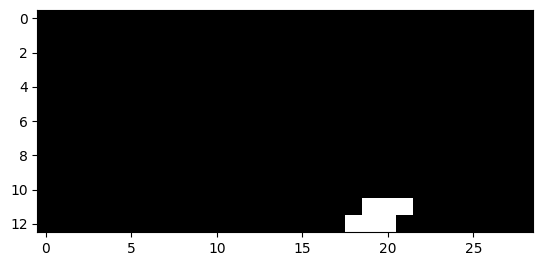

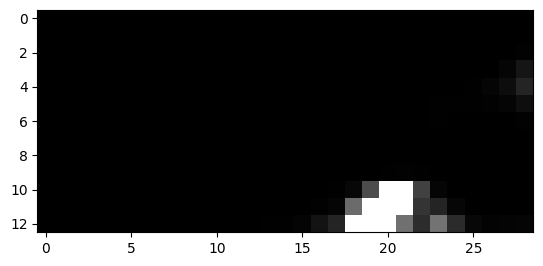

1398


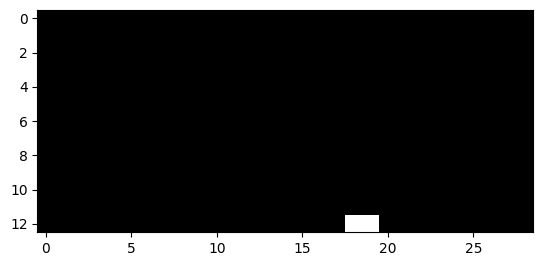

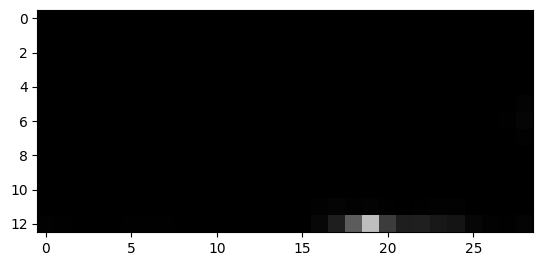

1403


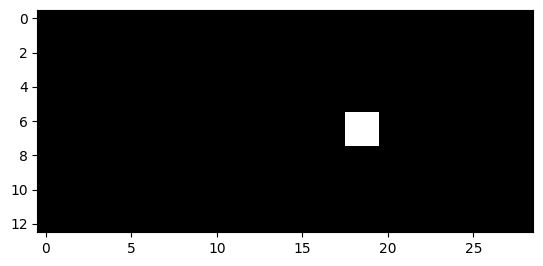

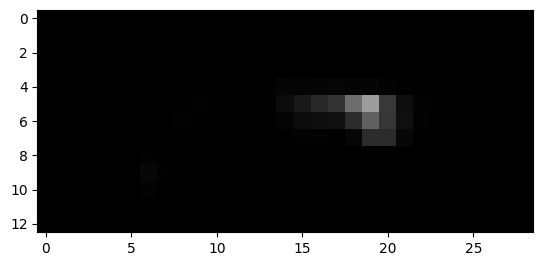

1404


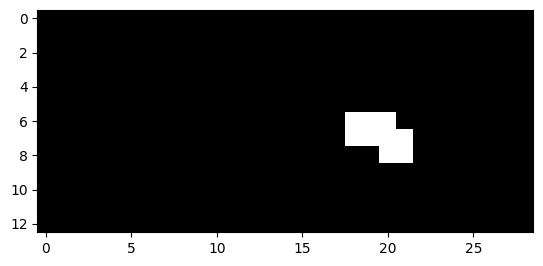

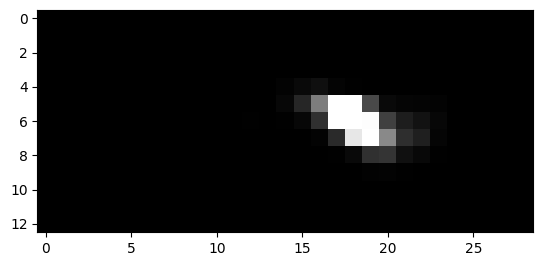

1405


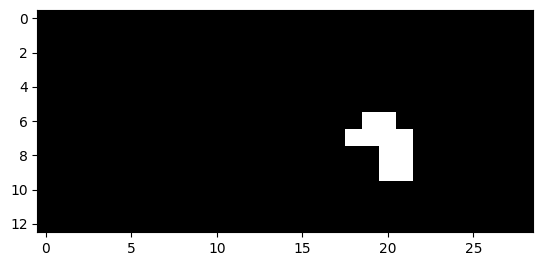

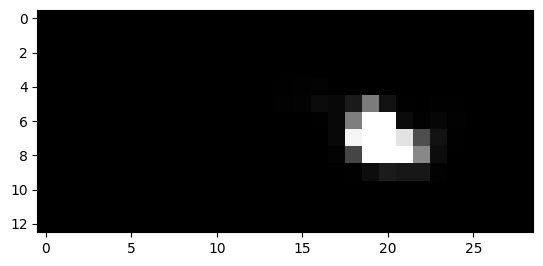

1406


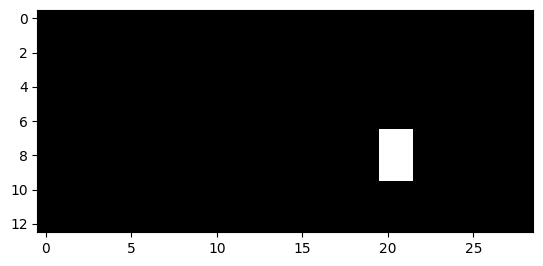

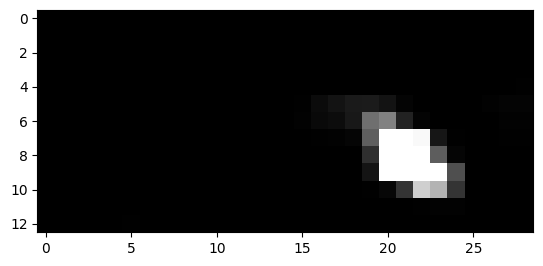

1407


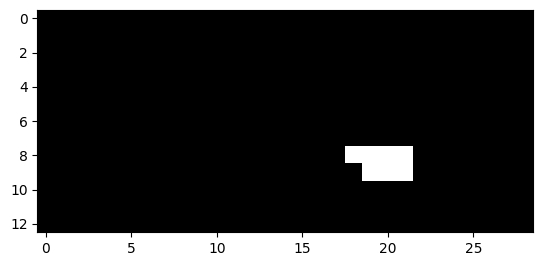

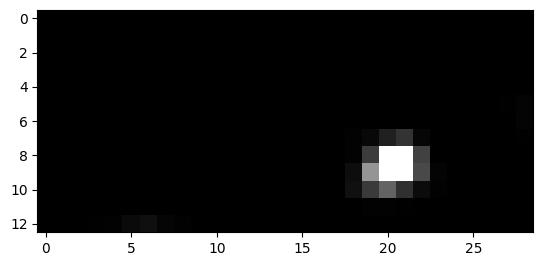

1408


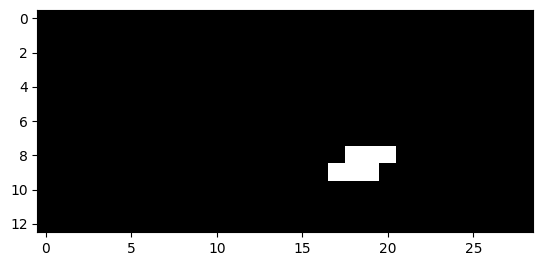

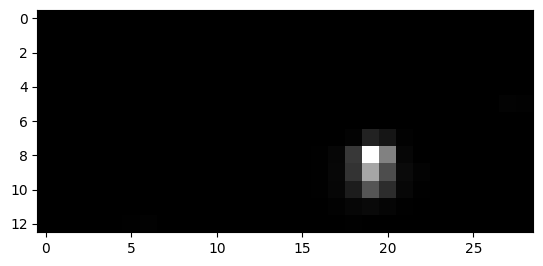

1409


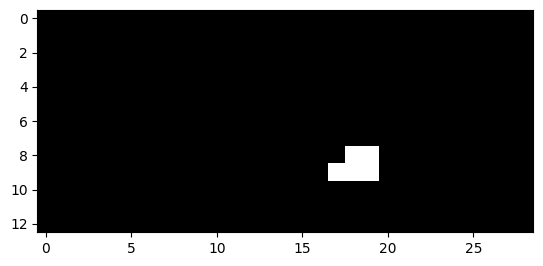

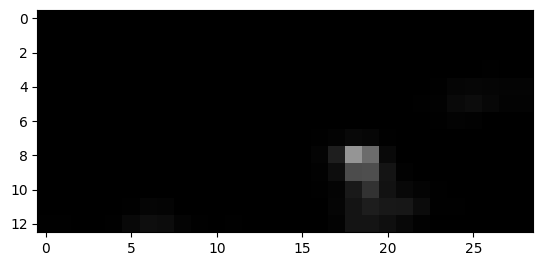

1412


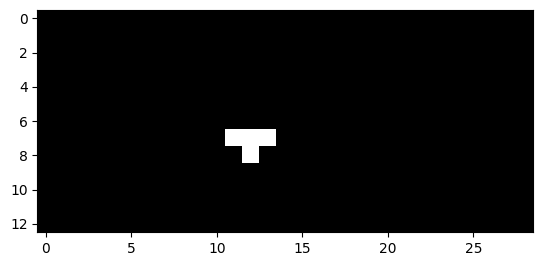

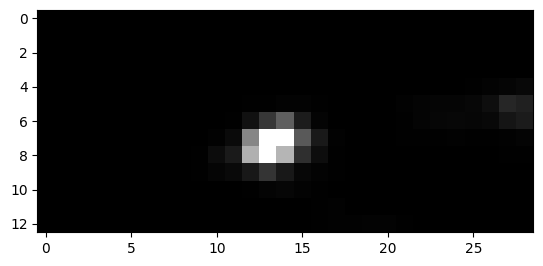

1413


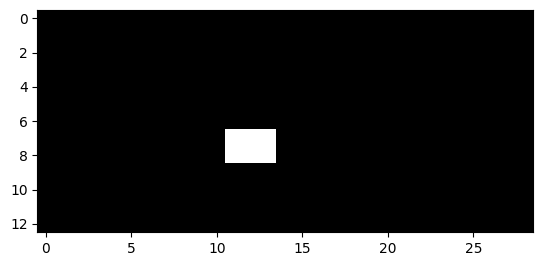

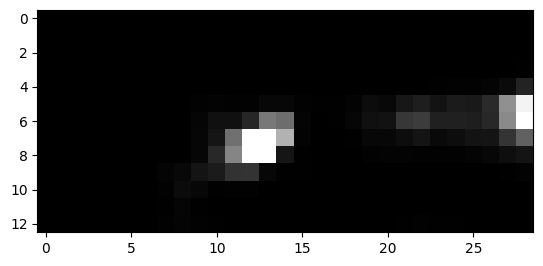

1414


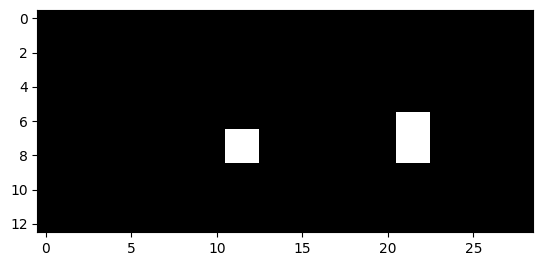

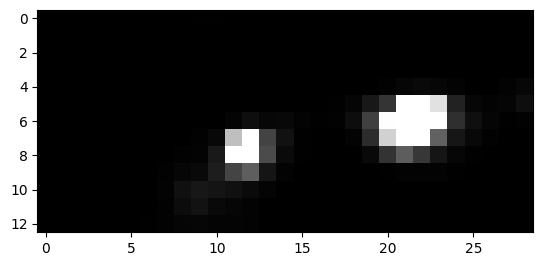

1415


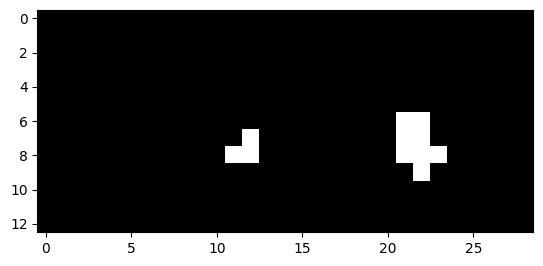

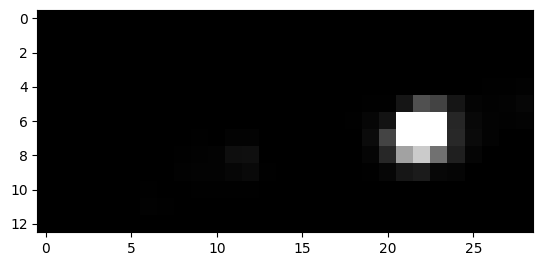

1416


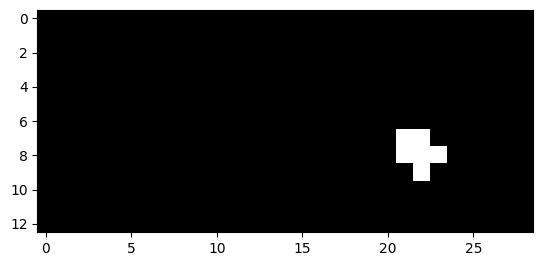

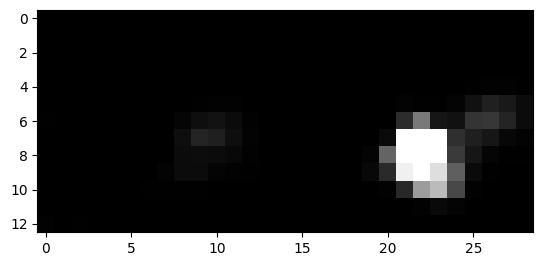

1417


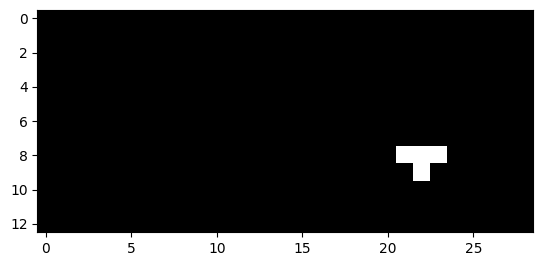

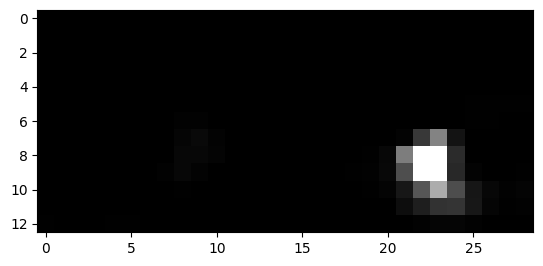

1419


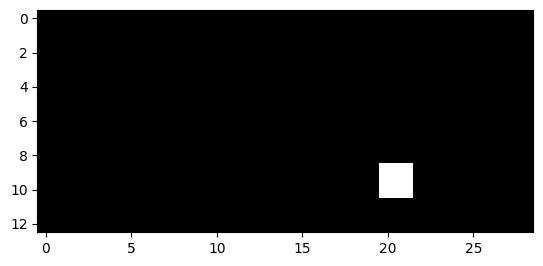

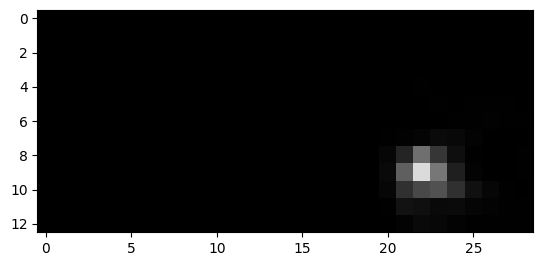

1420


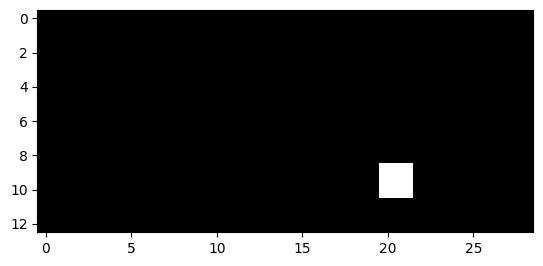

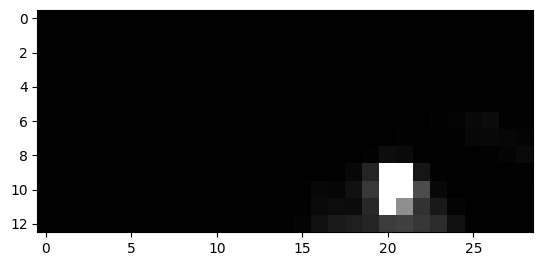

1441


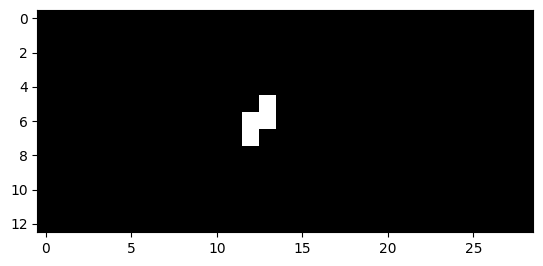

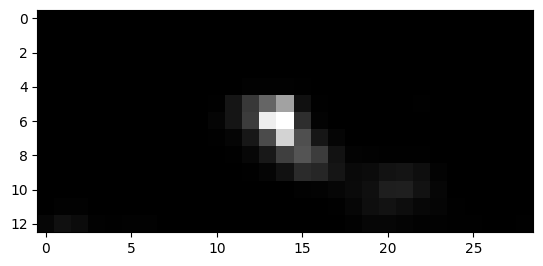

1442


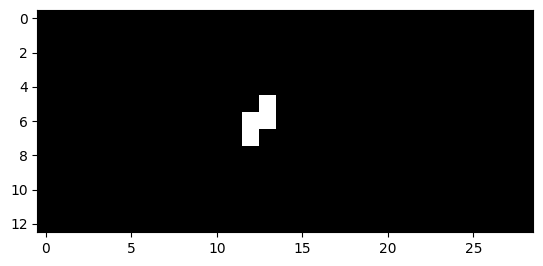

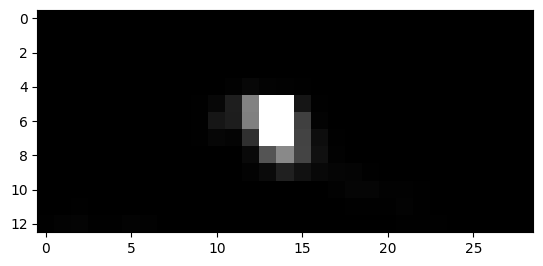

1443


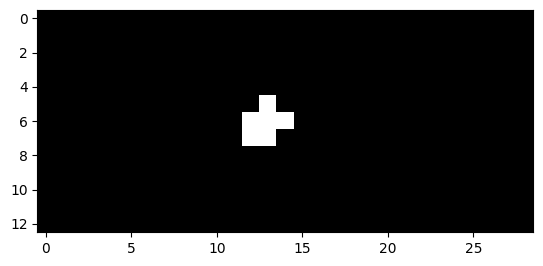

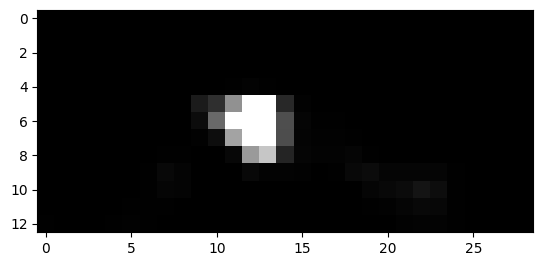

1444


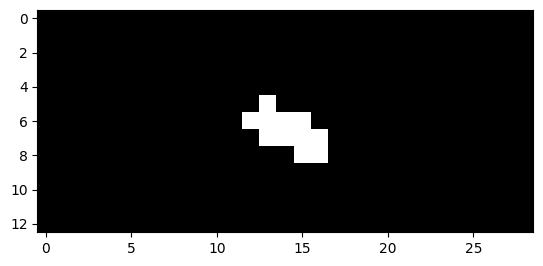

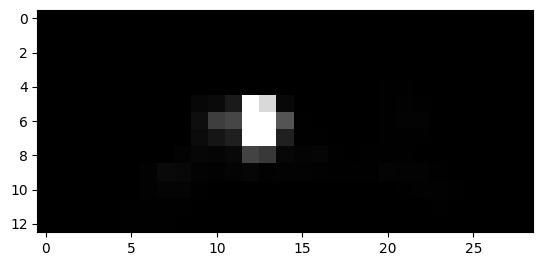

1445


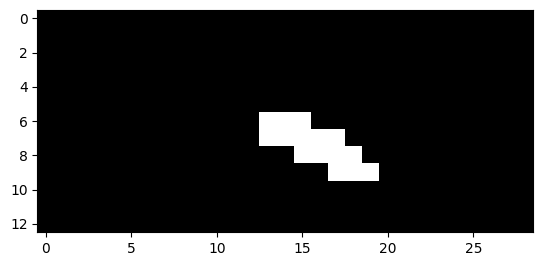

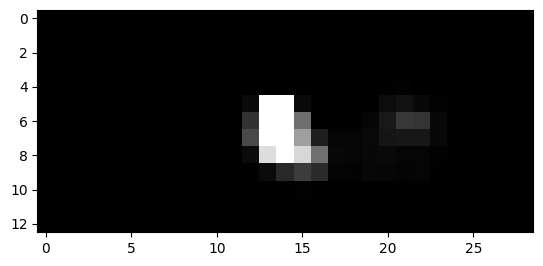

1446


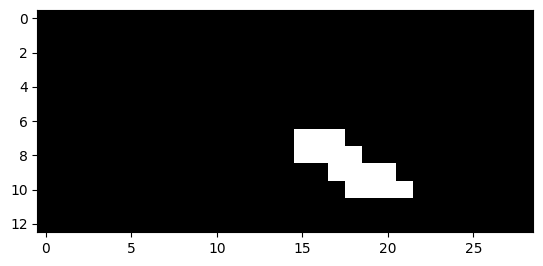

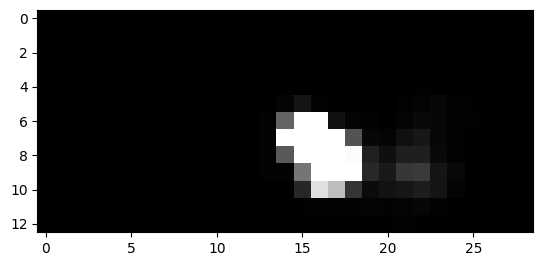

1447


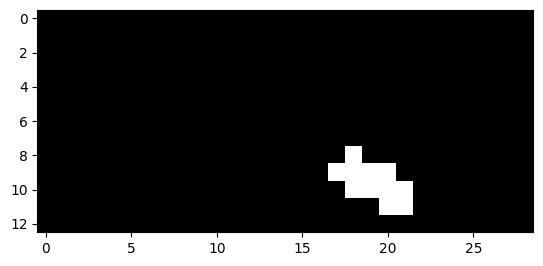

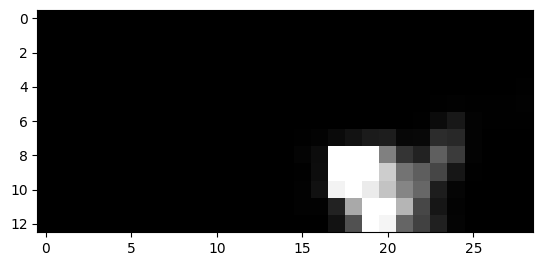

1448


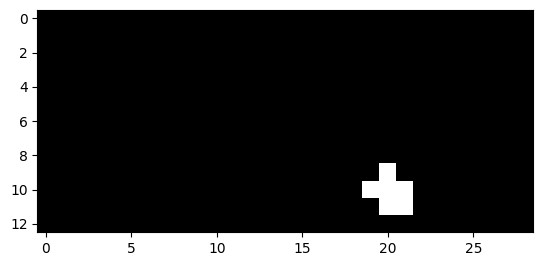

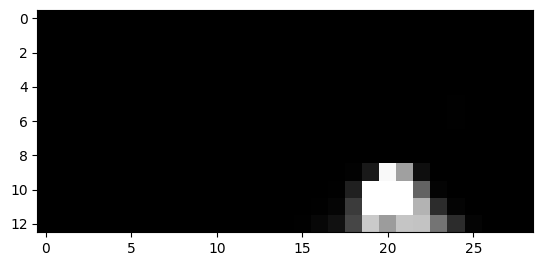

1460


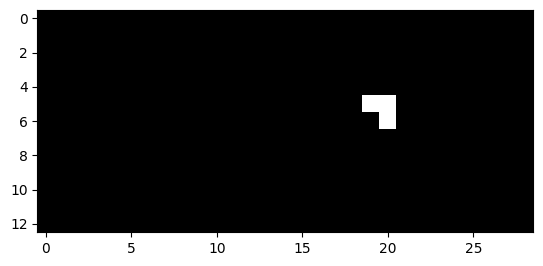

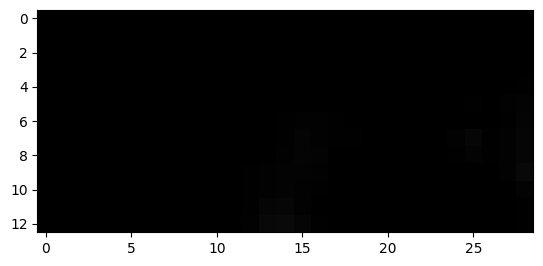

1461


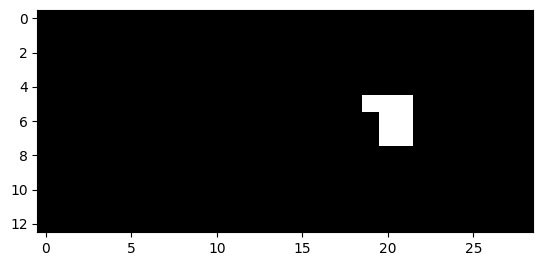

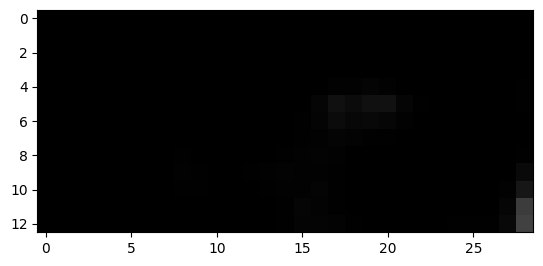

1462


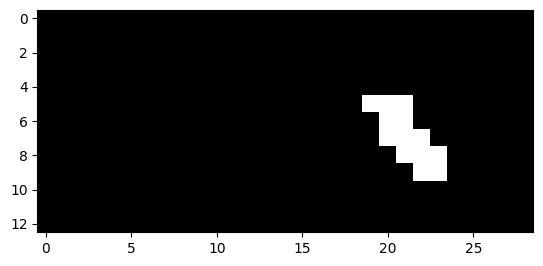

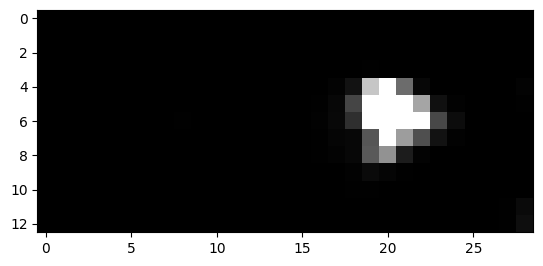

1463


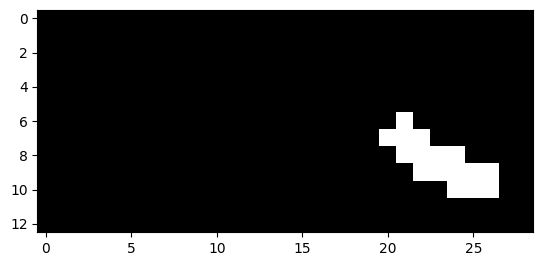

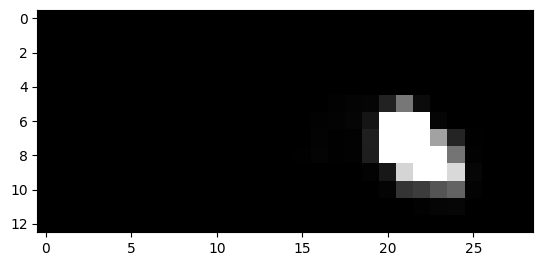

1464


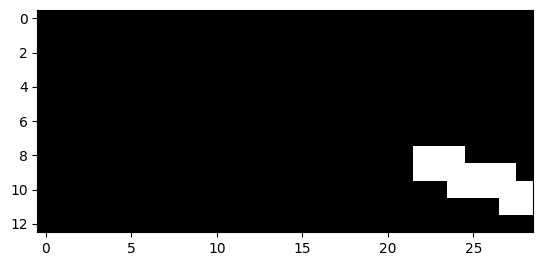

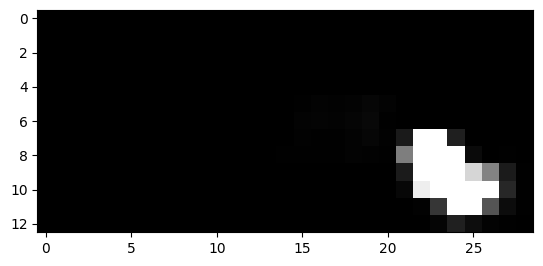

1465


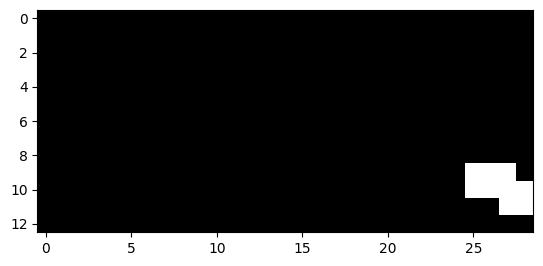

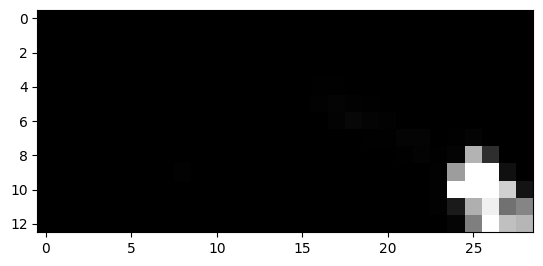

1466


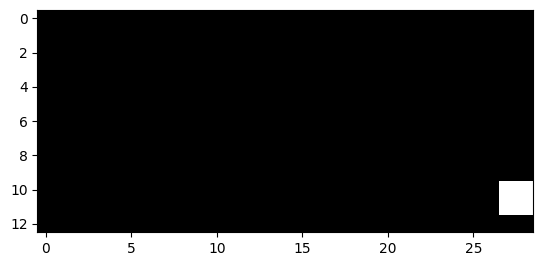

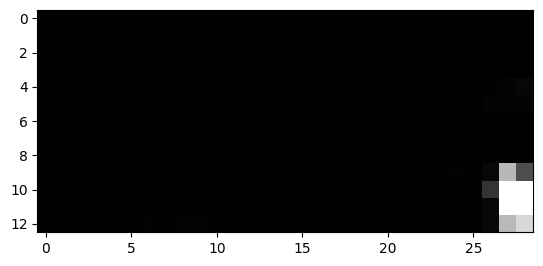

1473


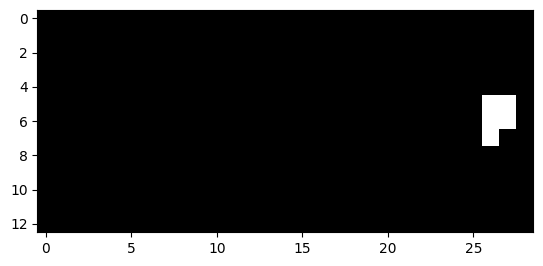

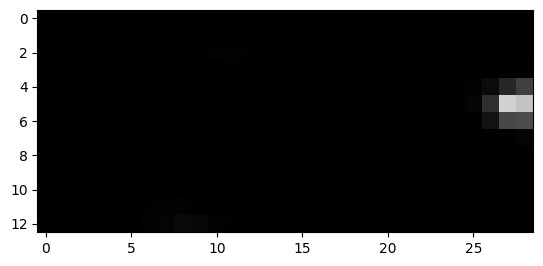

1474


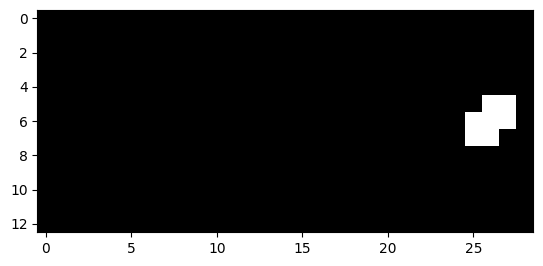

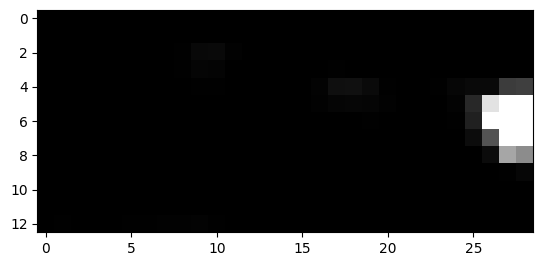

1475


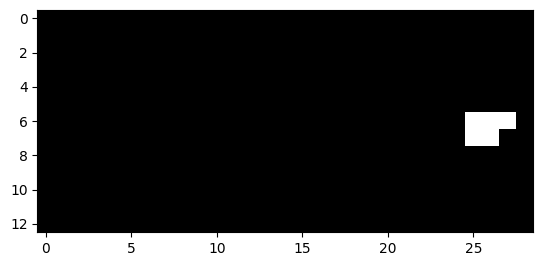

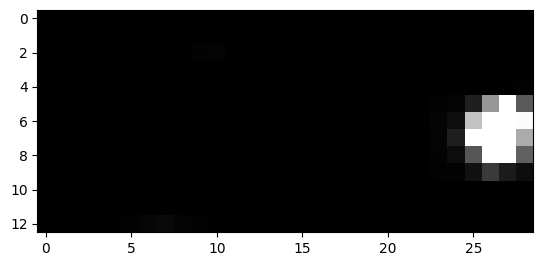

1509


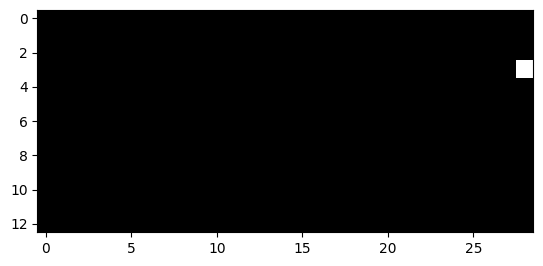

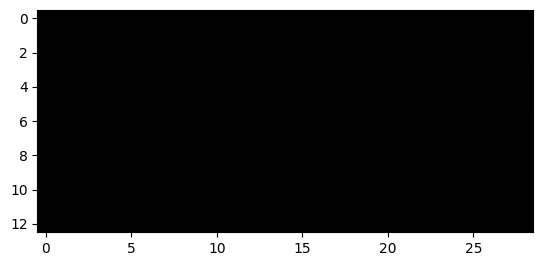

1510


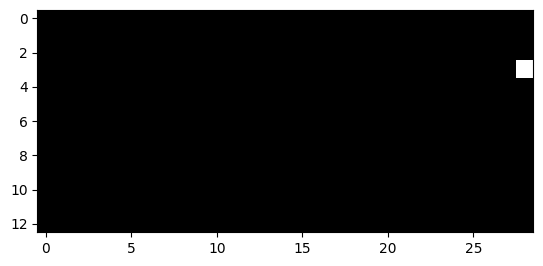

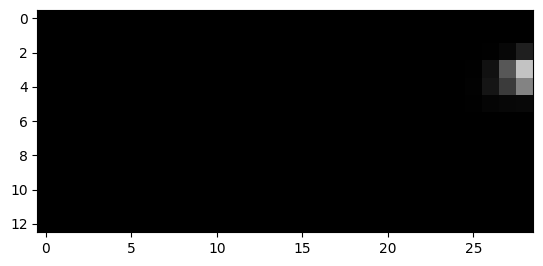

1511


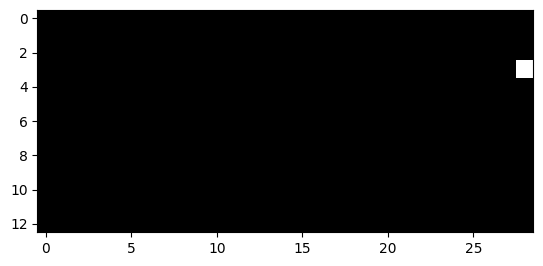

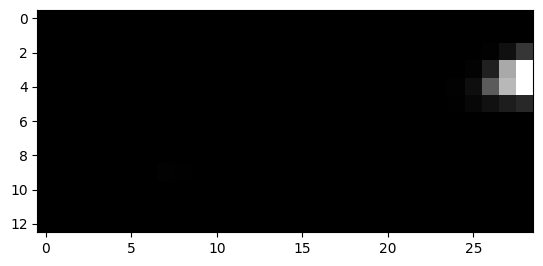

1687


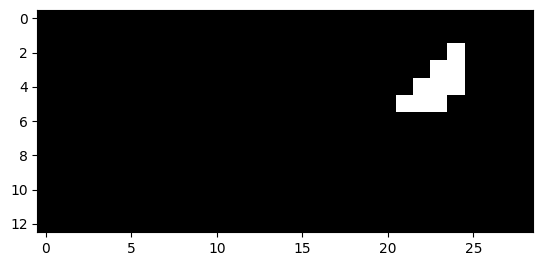

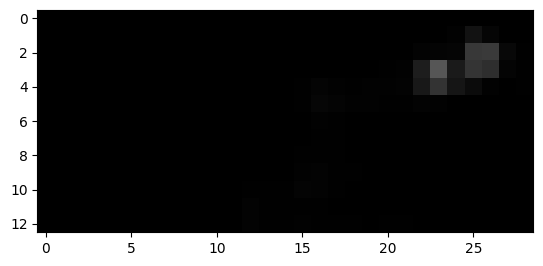

1688


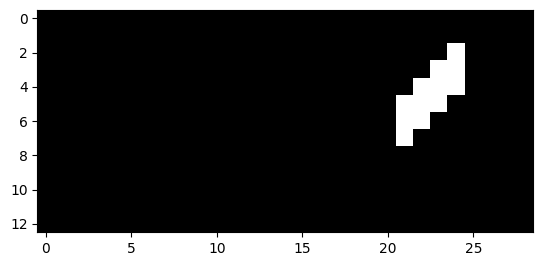

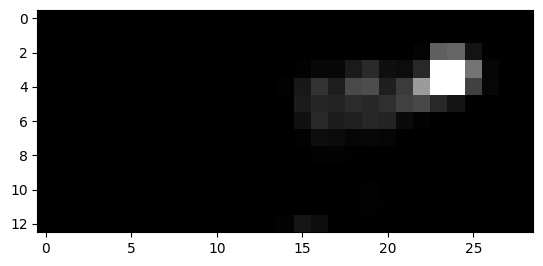

1689


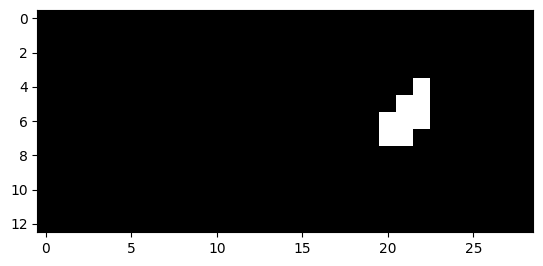

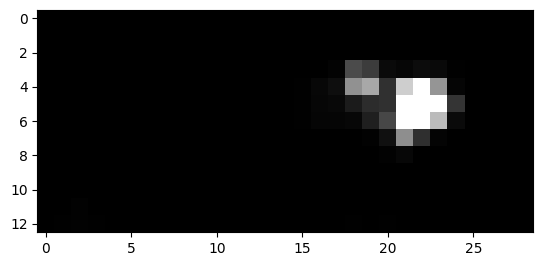

1690


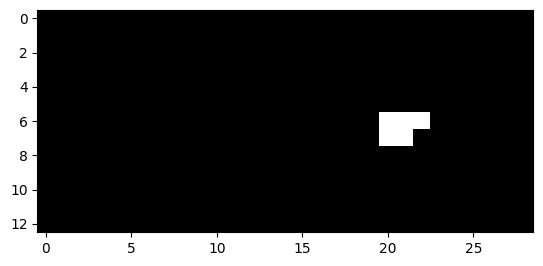

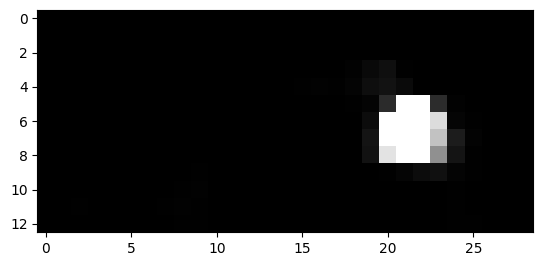

1691


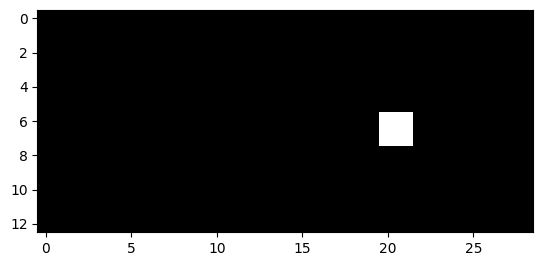

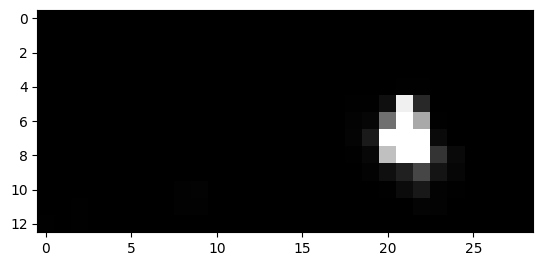

1710


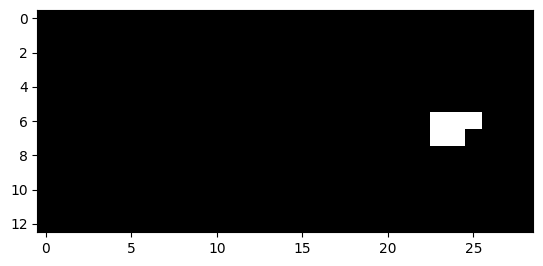

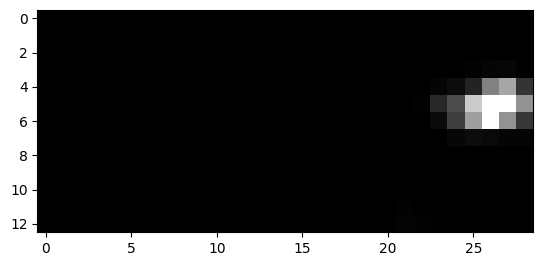

1711


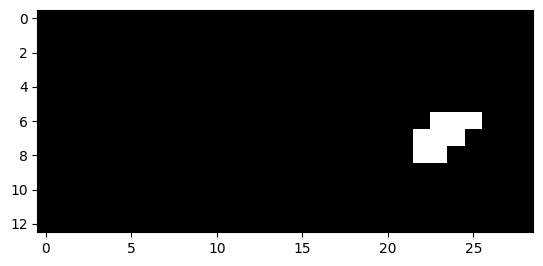

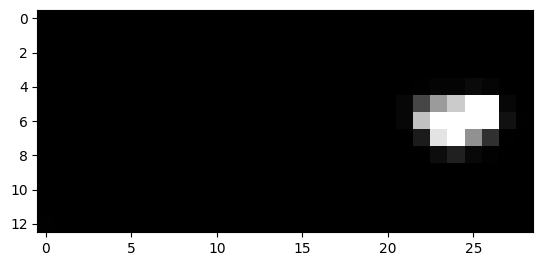

1712


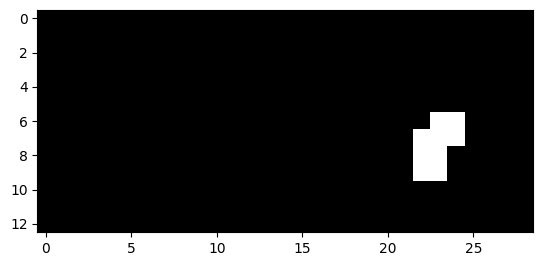

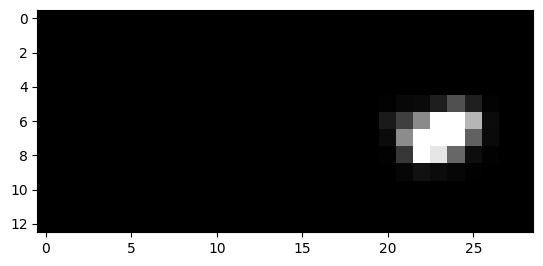

1713


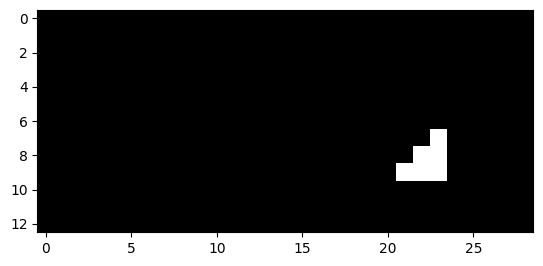

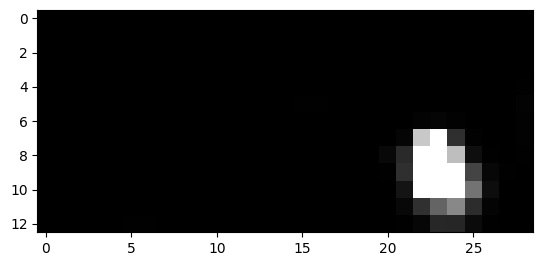

1714


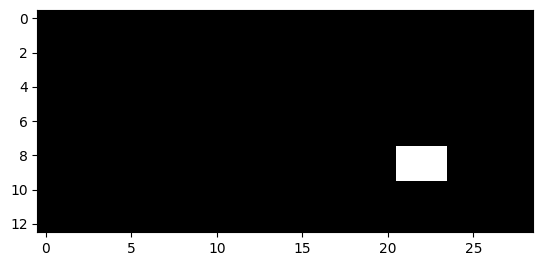

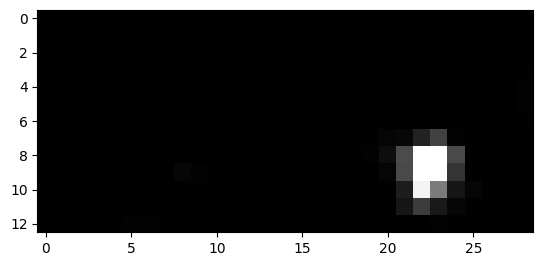

1715


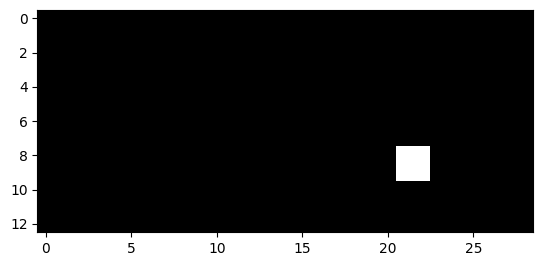

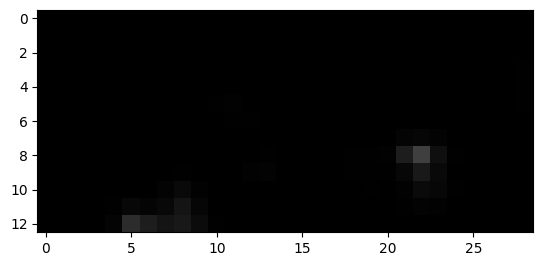

1728


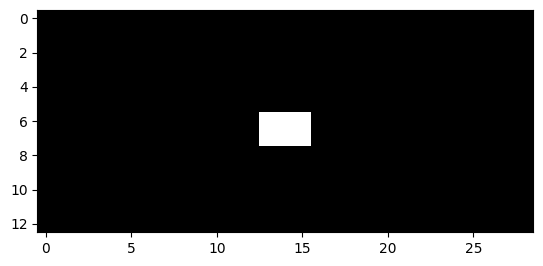

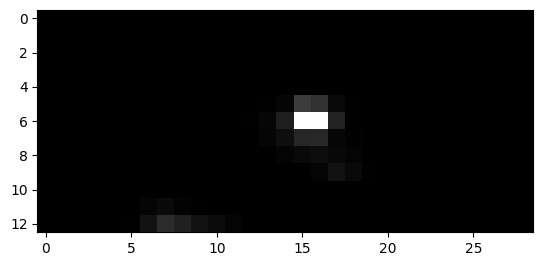

1729


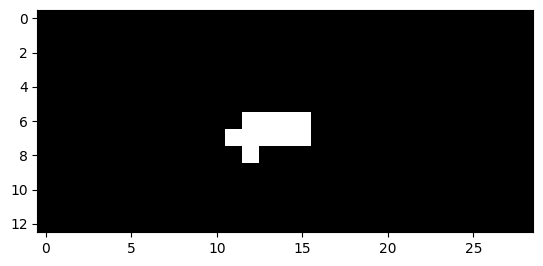

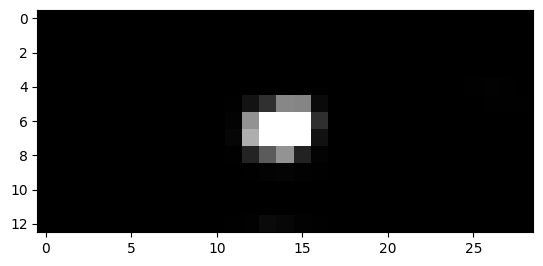

1730


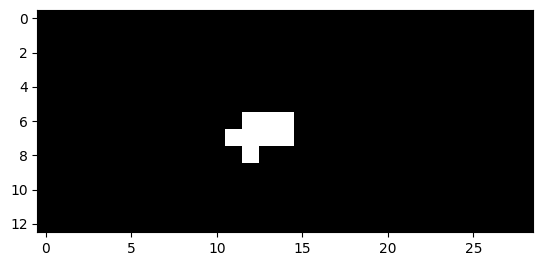

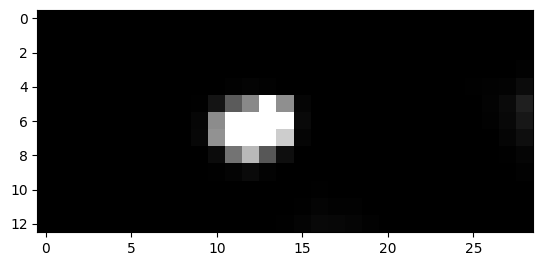

1731


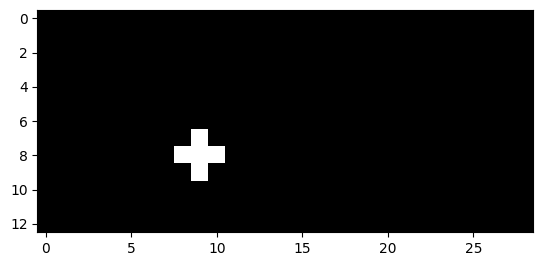

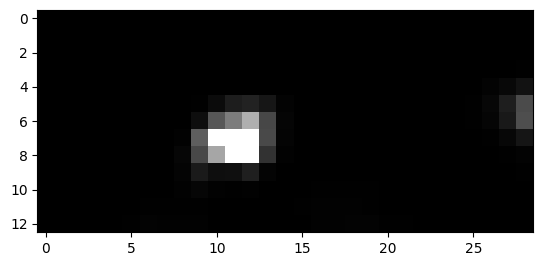

1732


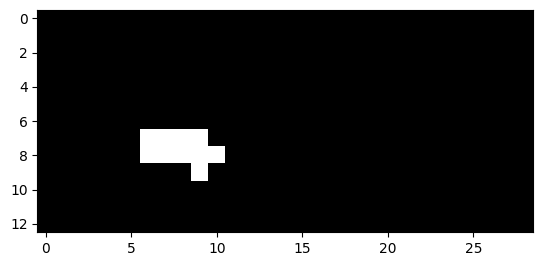

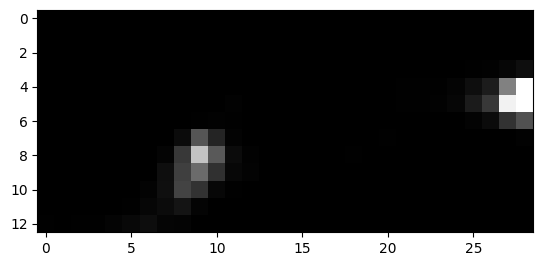

1733


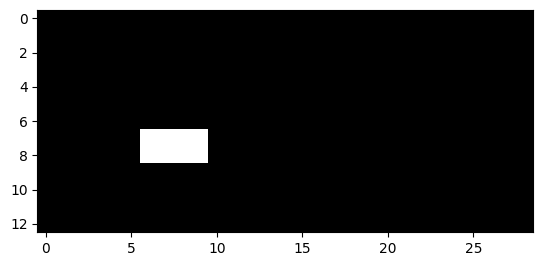

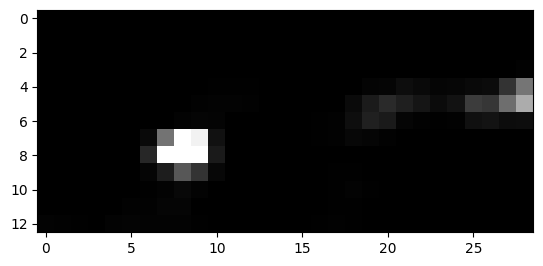

1735


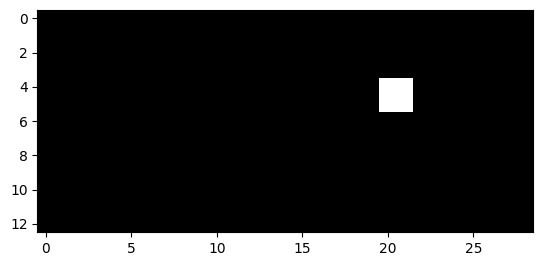

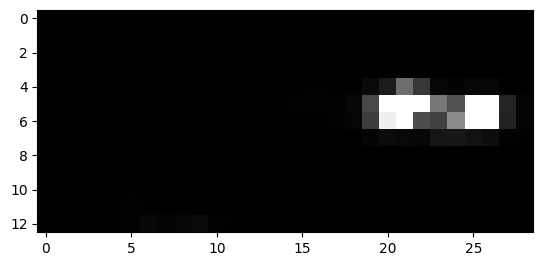

1736


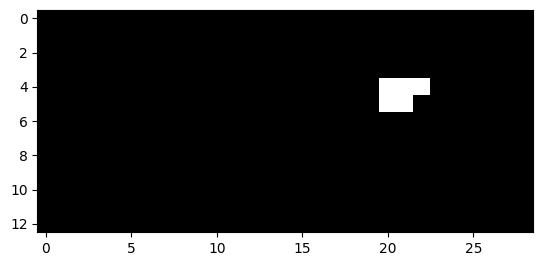

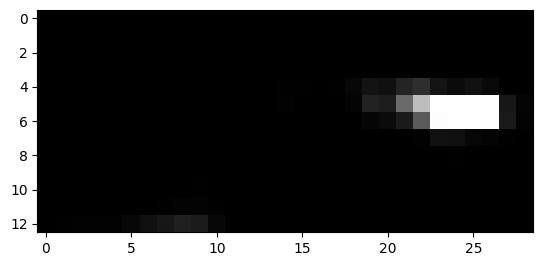

1737


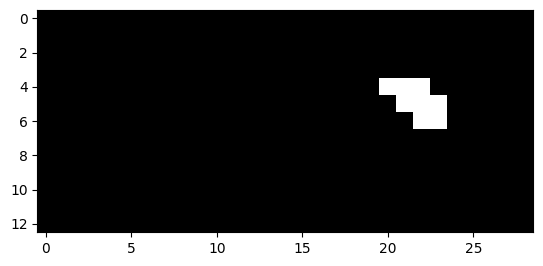

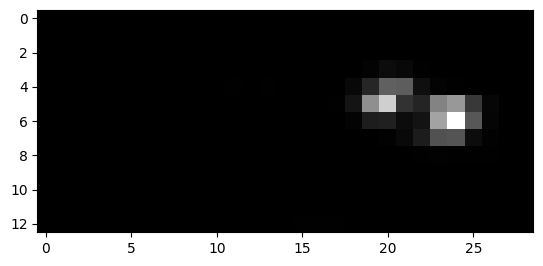

1738


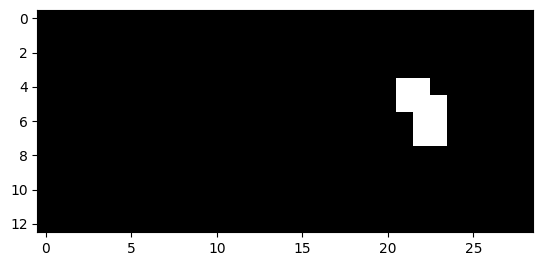

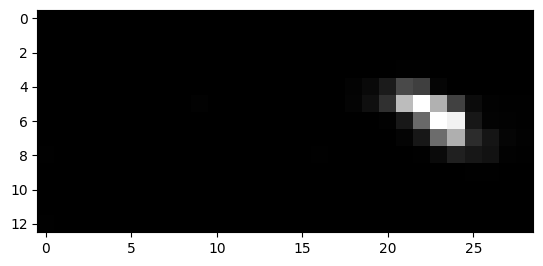

1739


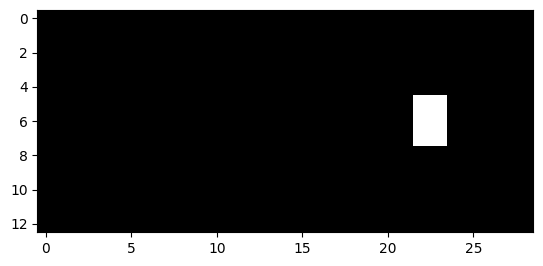

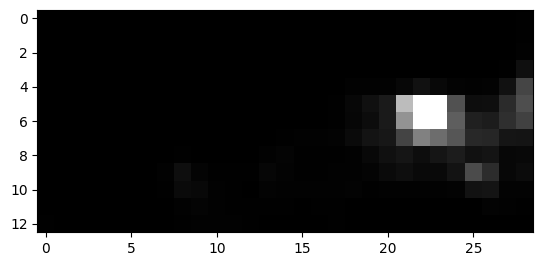

1740


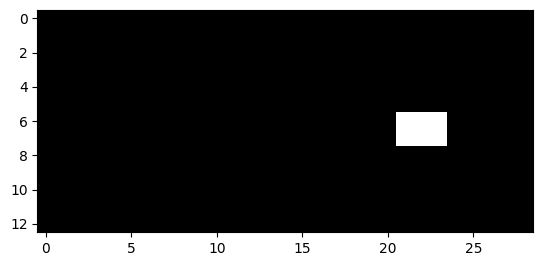

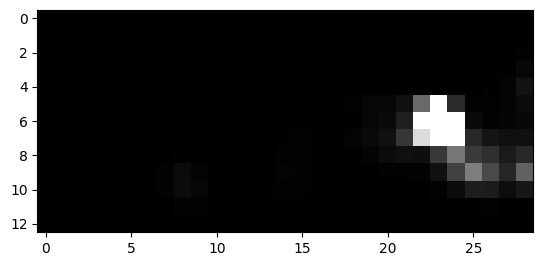

1741


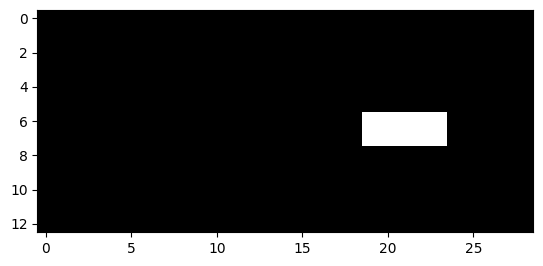

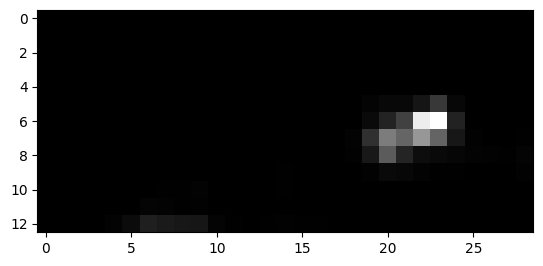

1742


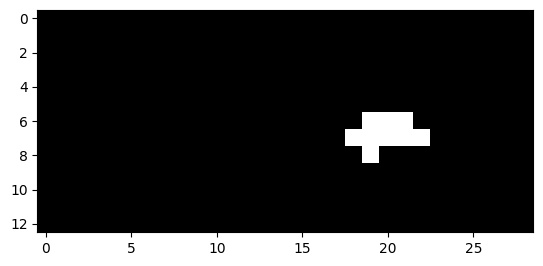

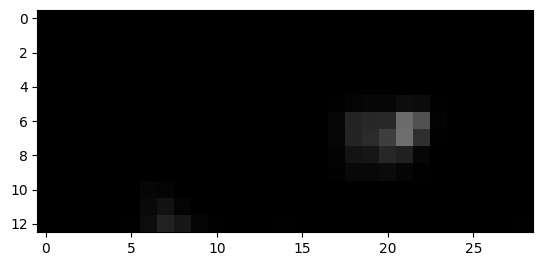

1743


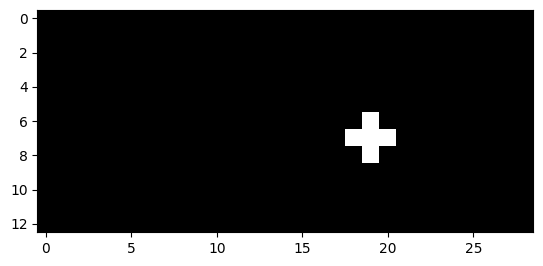

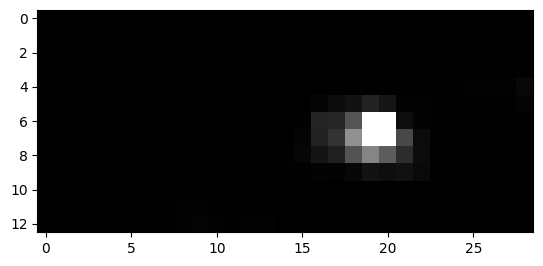

1750


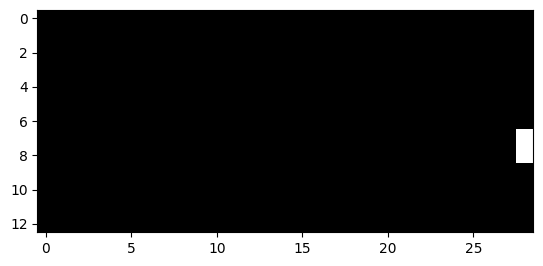

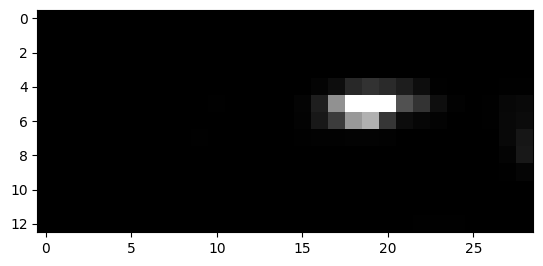

1751


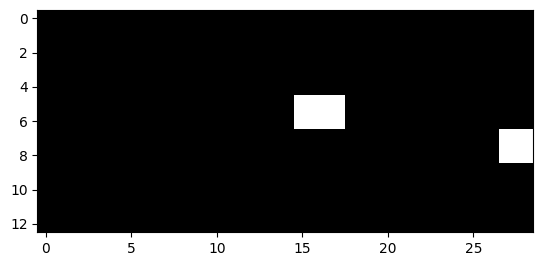

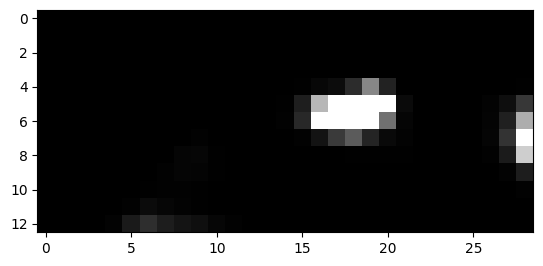

1752


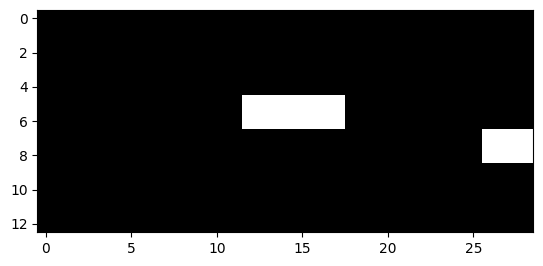

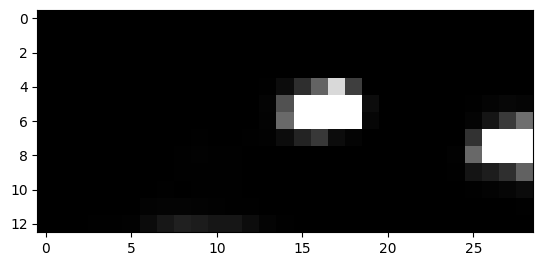

1753


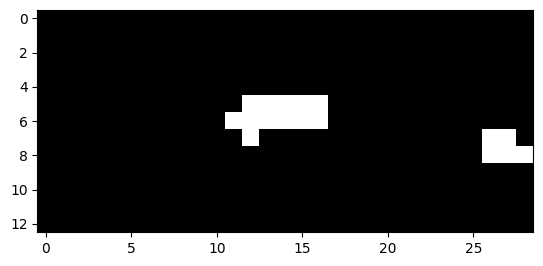

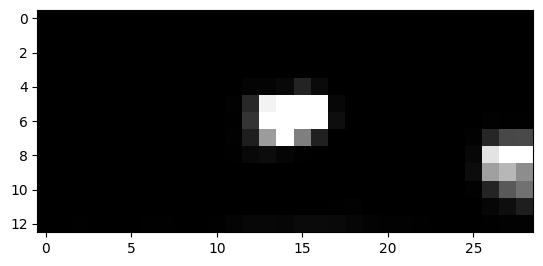

1754


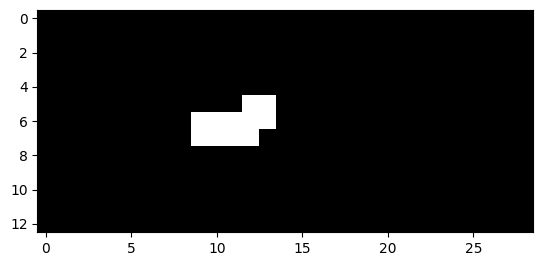

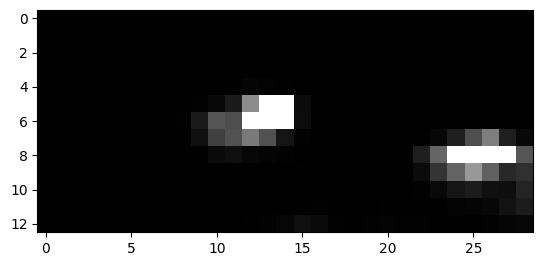

1755


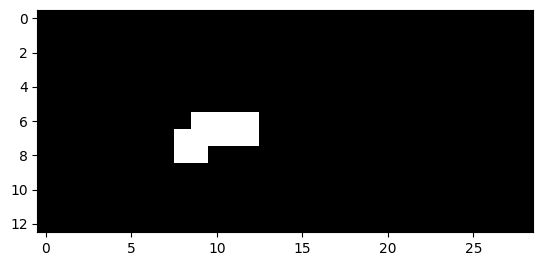

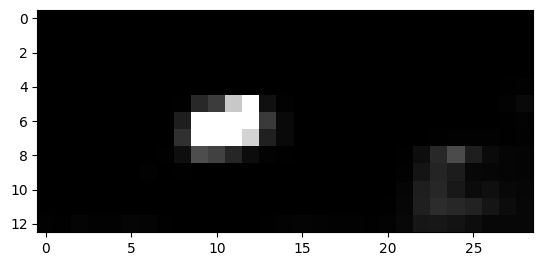

1756


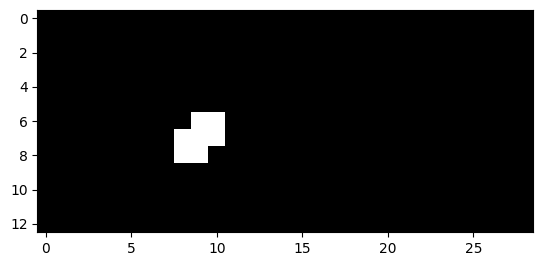

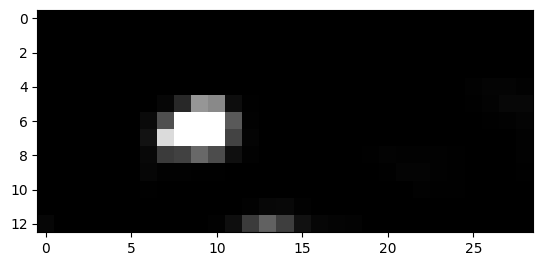

1760


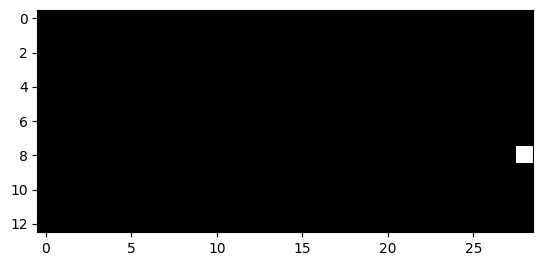

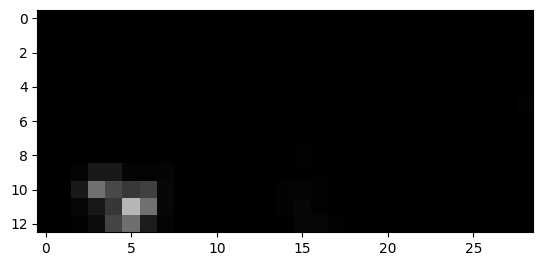

1761


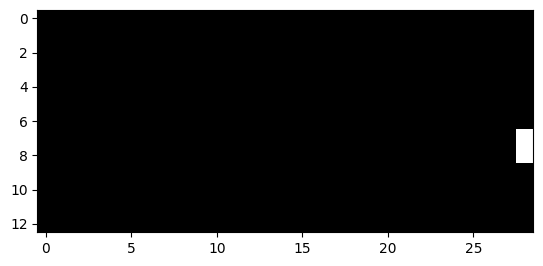

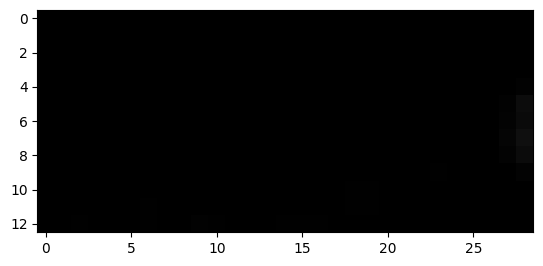

1762


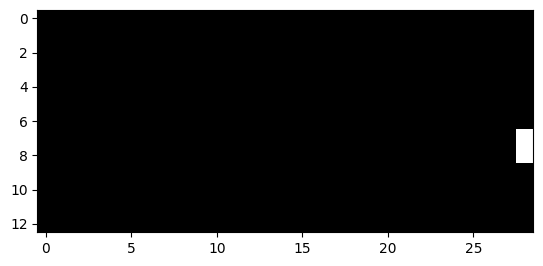

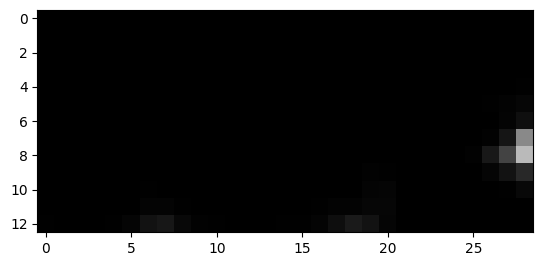

1770


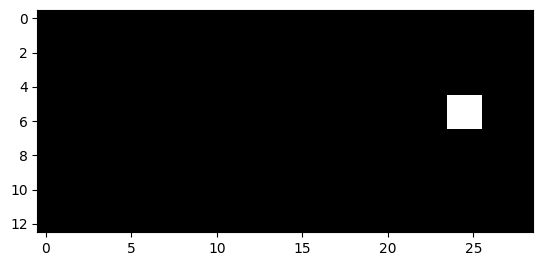

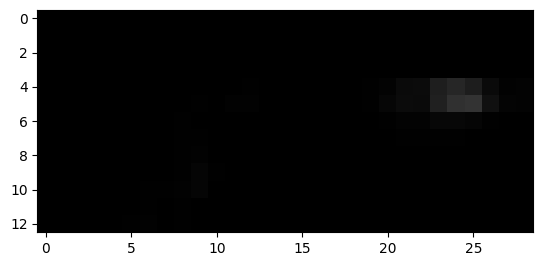

1771


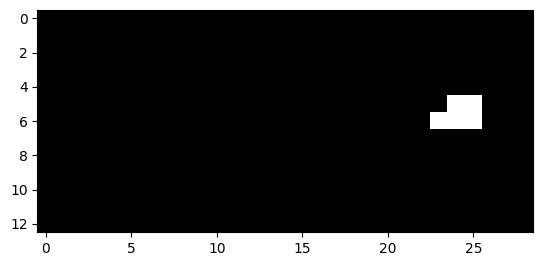

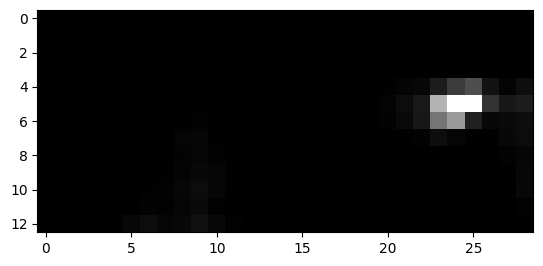

1772


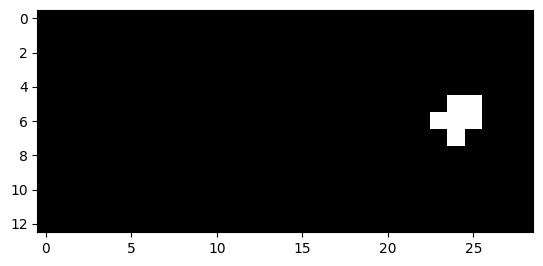

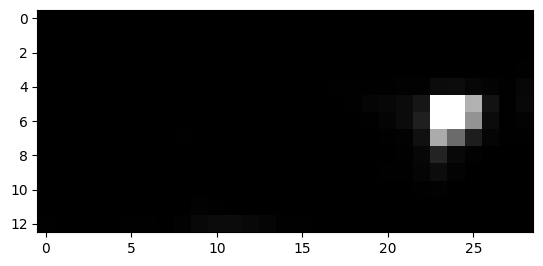

1773


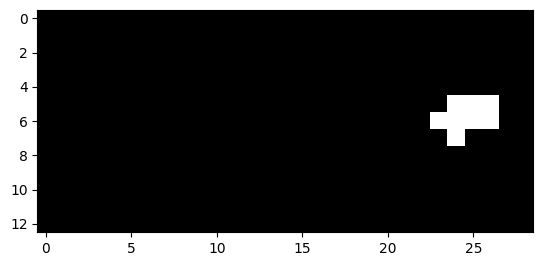

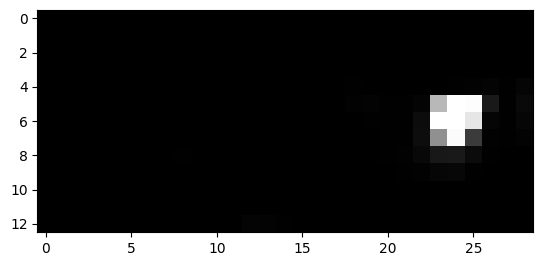

1774


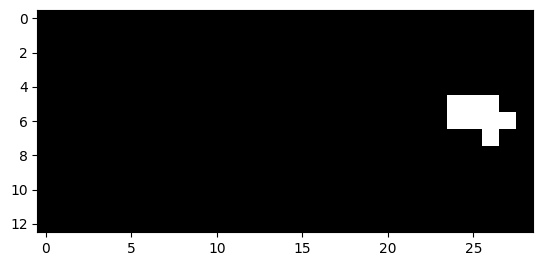

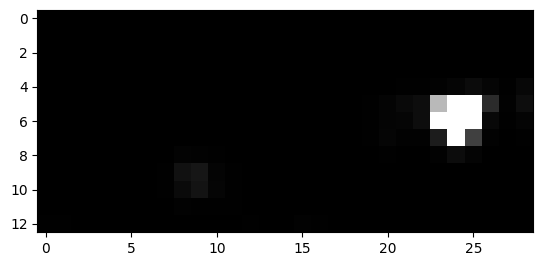

1775


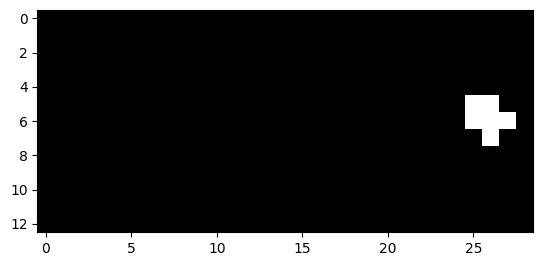

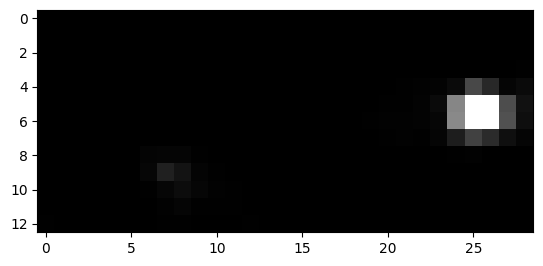

1776


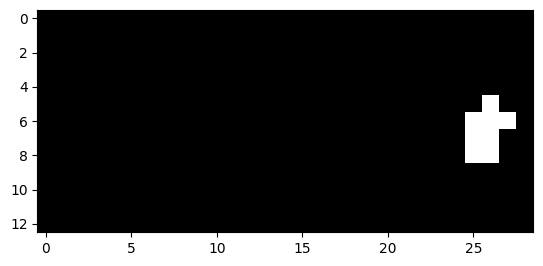

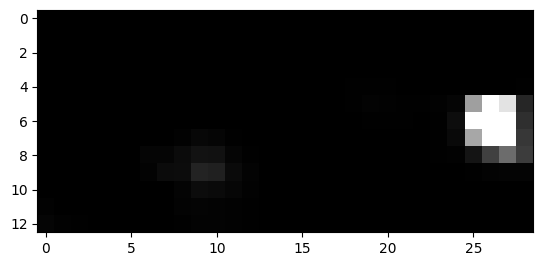

1777


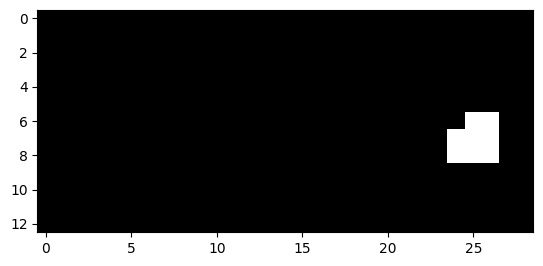

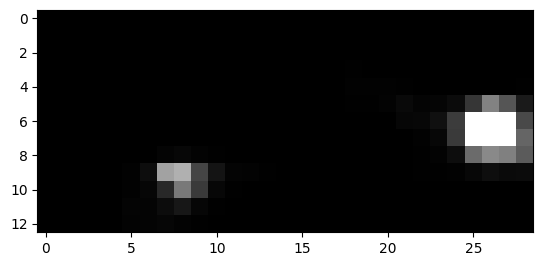

1778


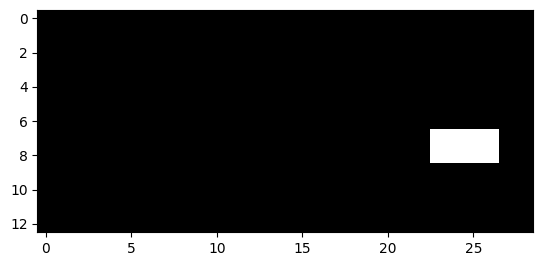

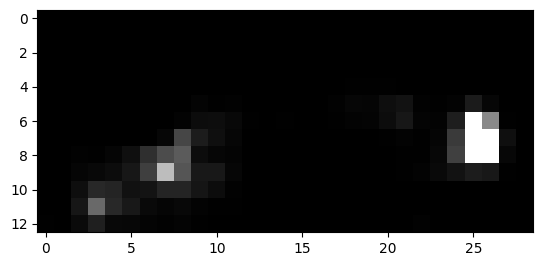

1779


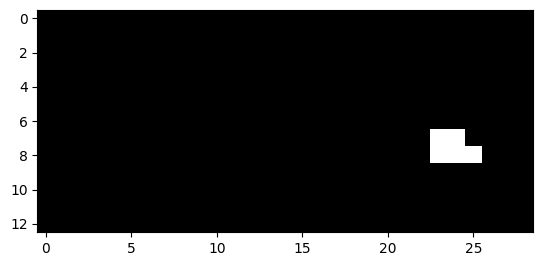

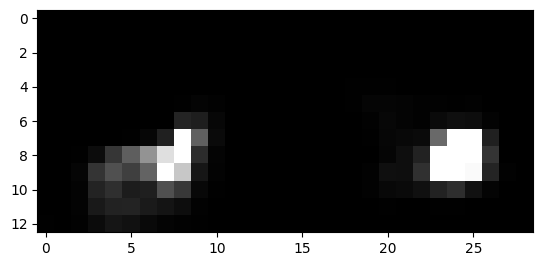

1786


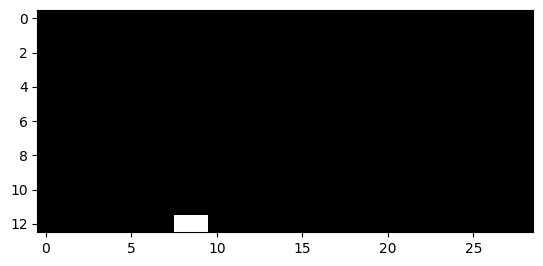

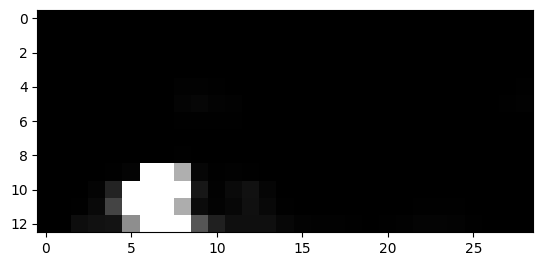

1787


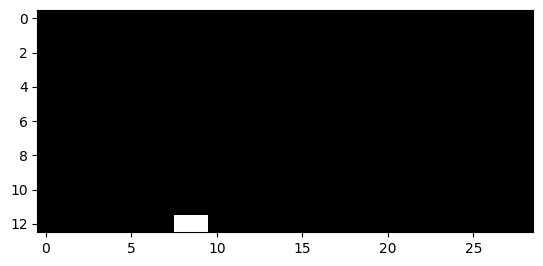

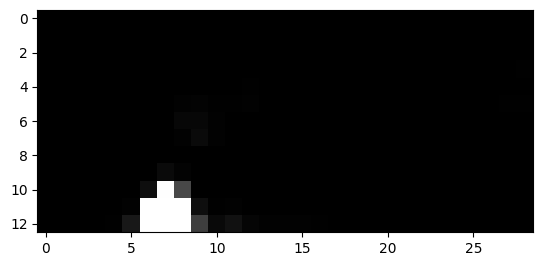

1792


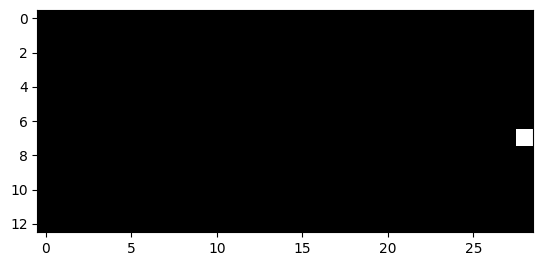

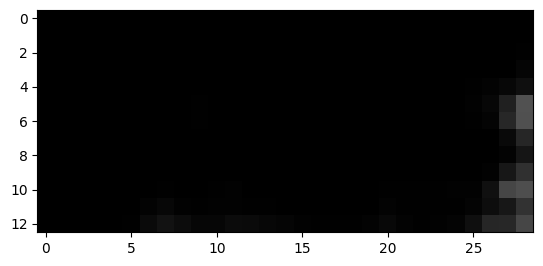

1793


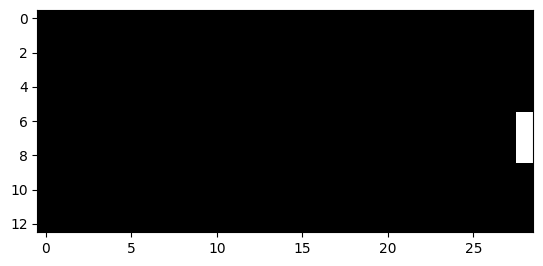

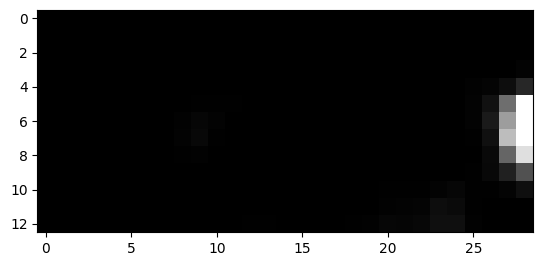

1794


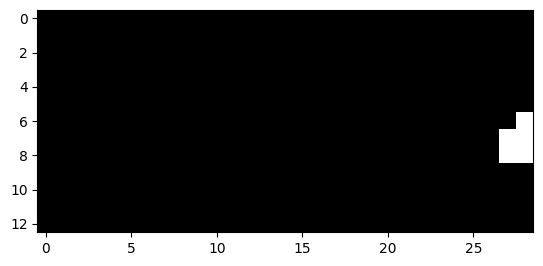

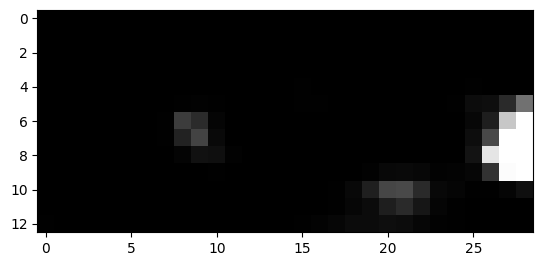

1795


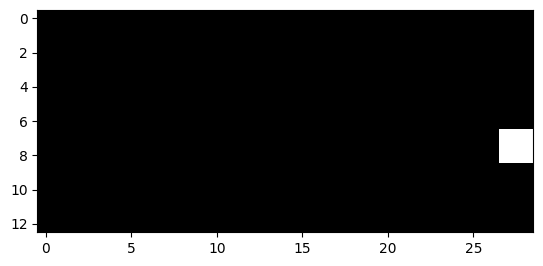

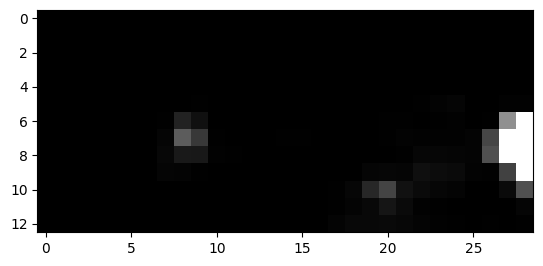

1796


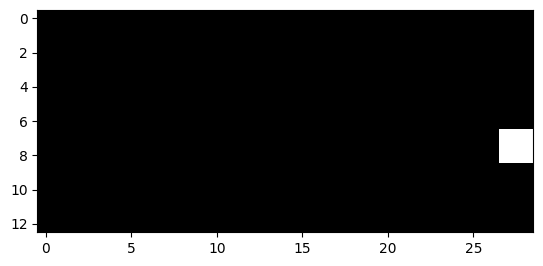

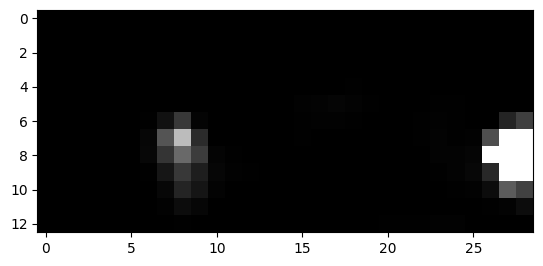

1797


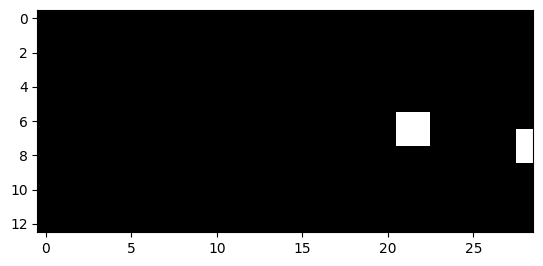

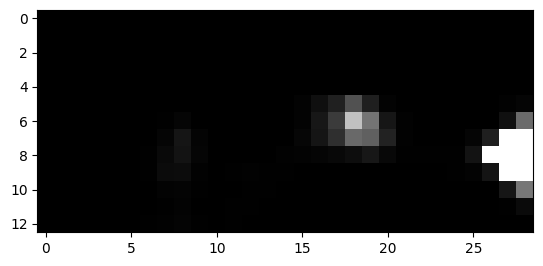

1798


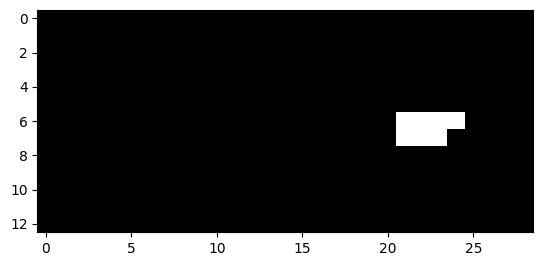

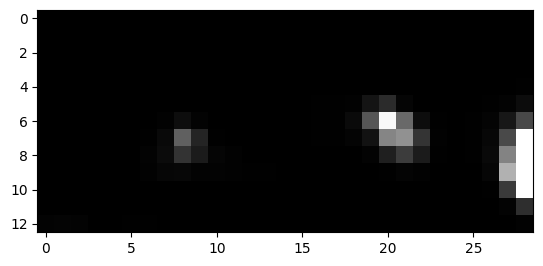

1799


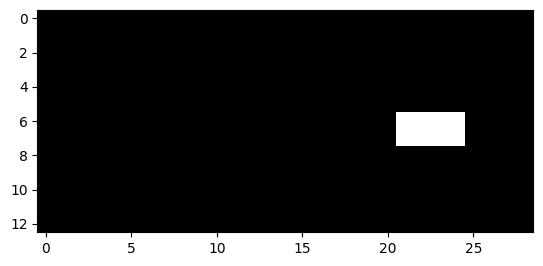

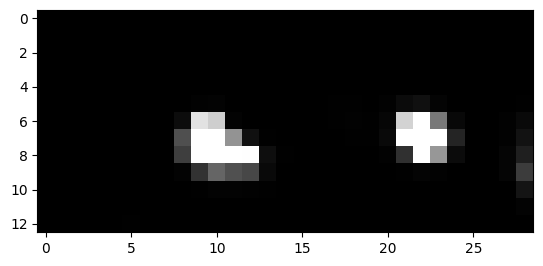

1800


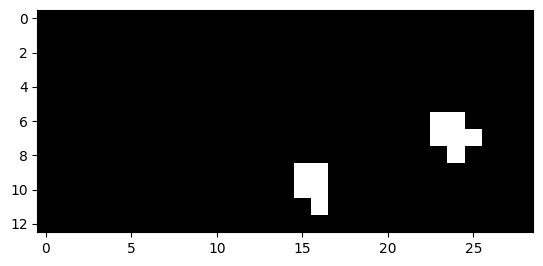

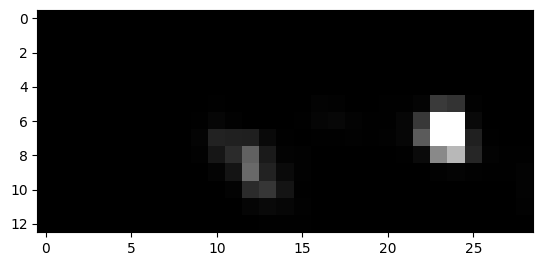

1801


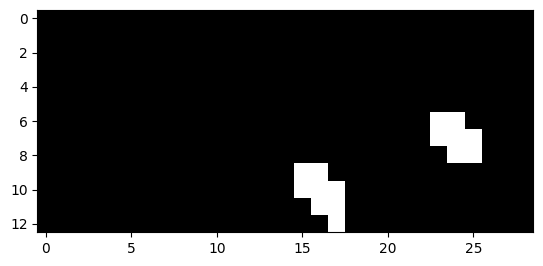

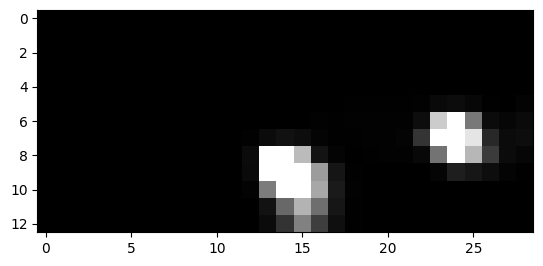

1802


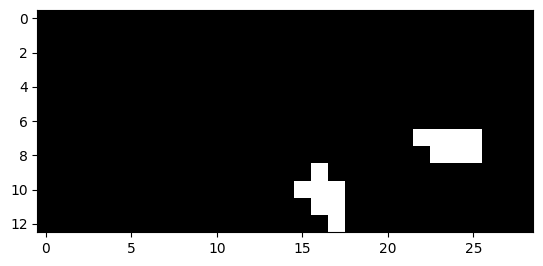

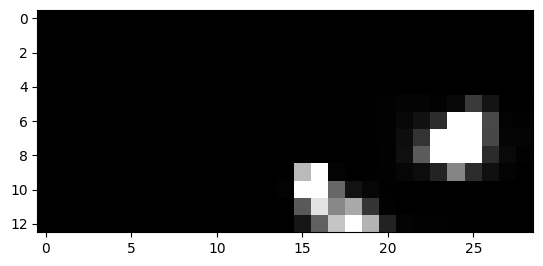

1803


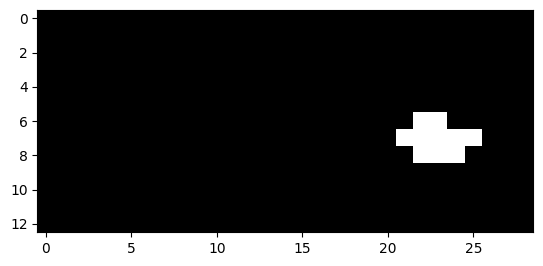

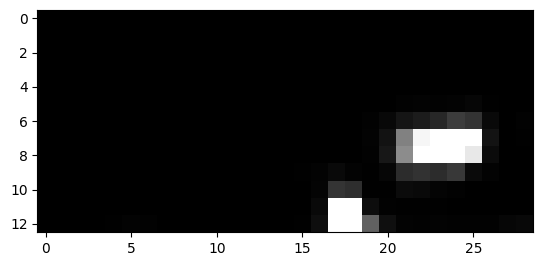

1804


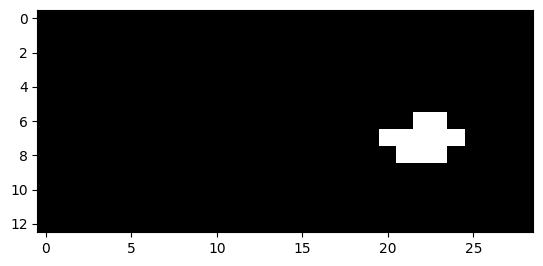

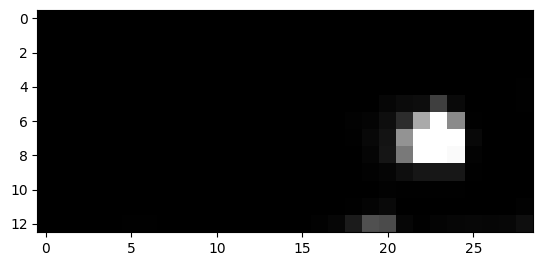

1805


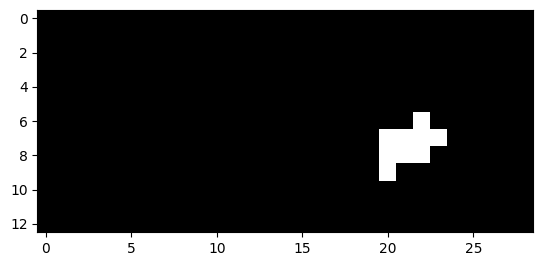

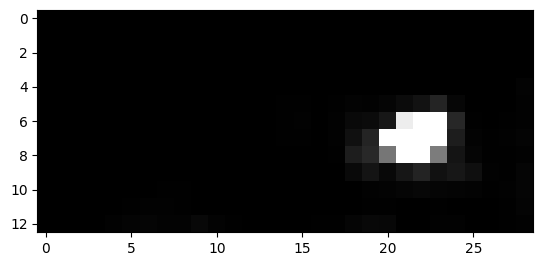

1806


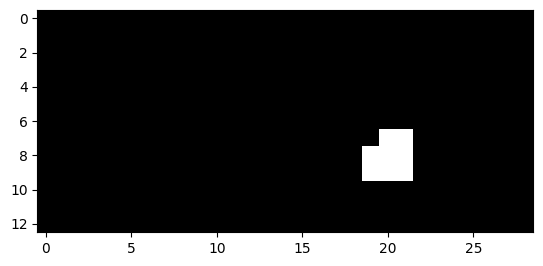

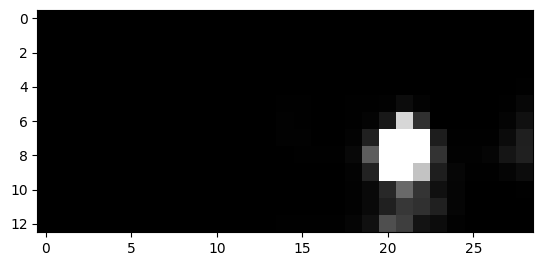

1807


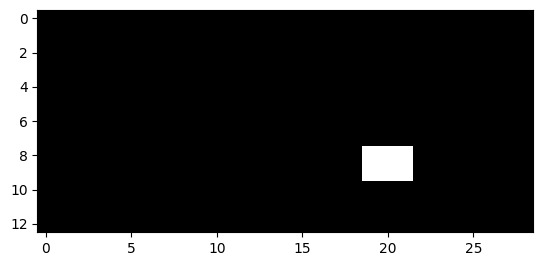

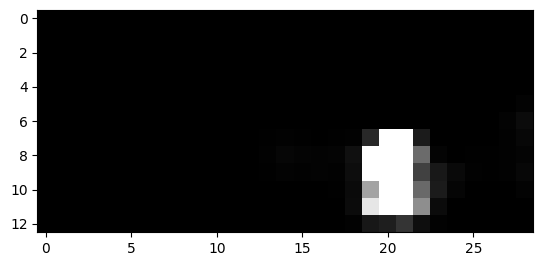

1808


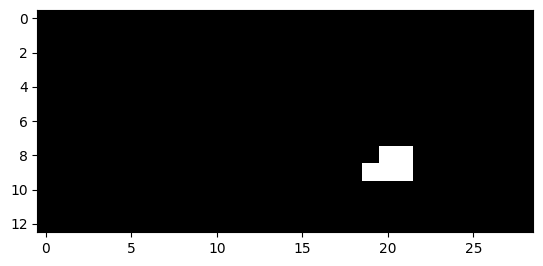

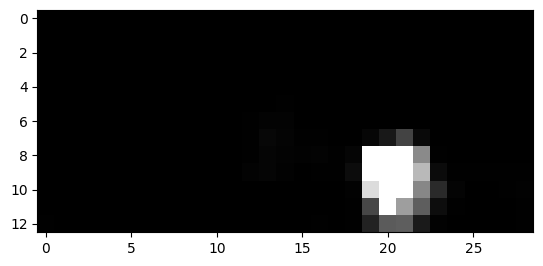

1809


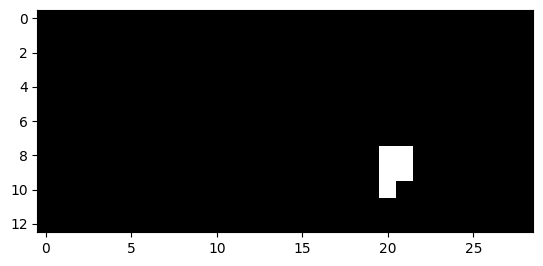

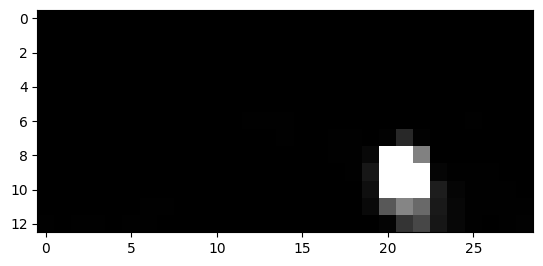

1810


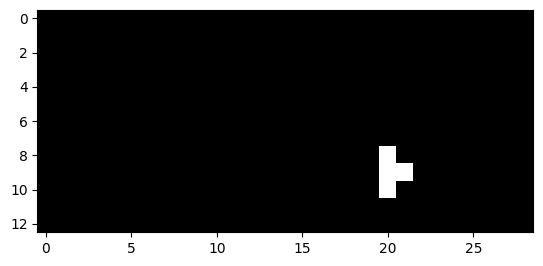

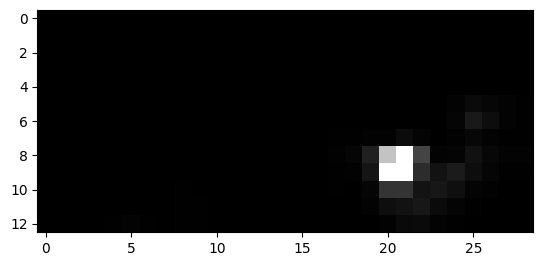

1845


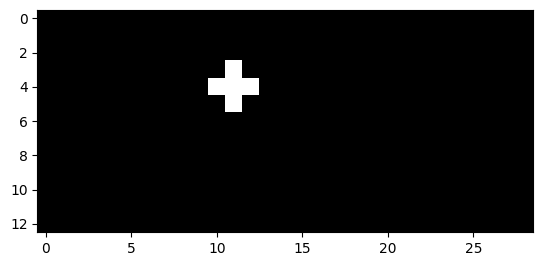

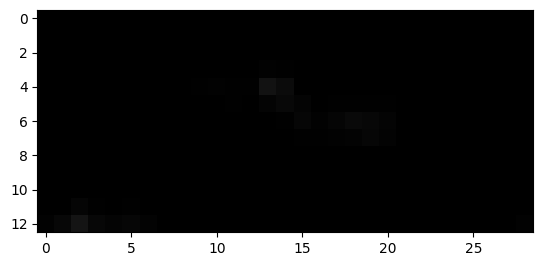

1846


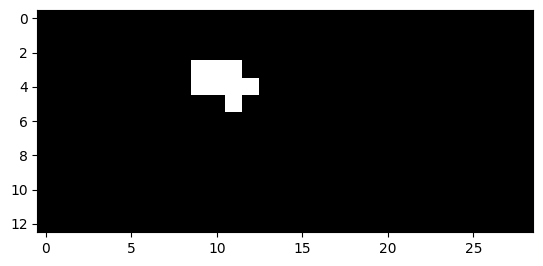

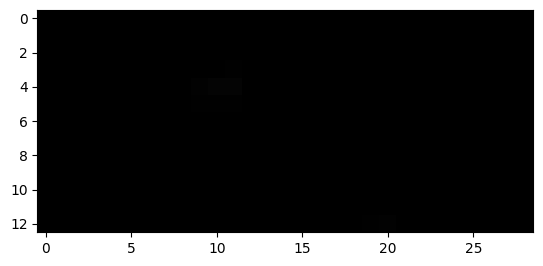

1847


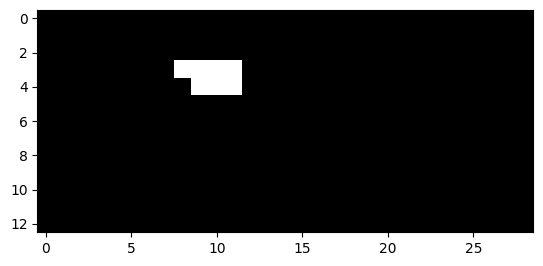

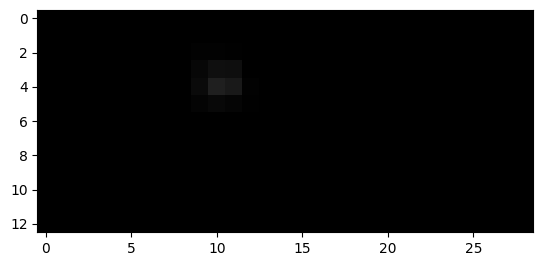

1848


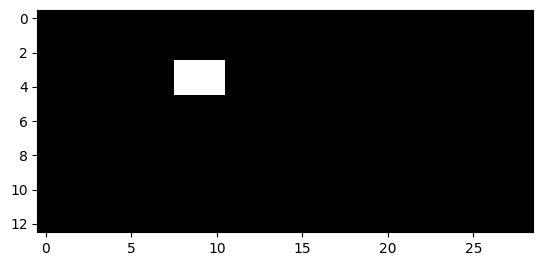

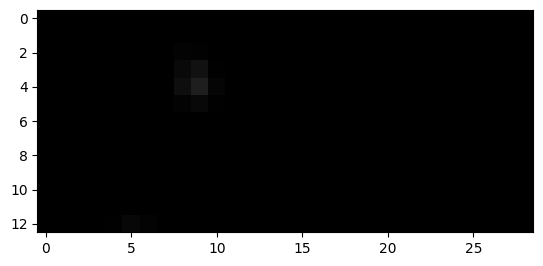

1849


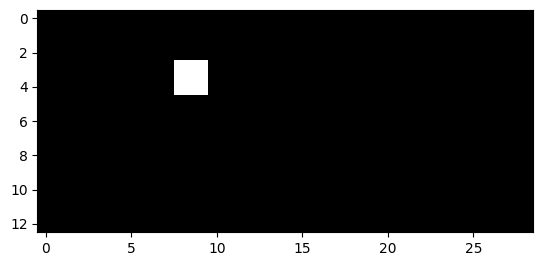

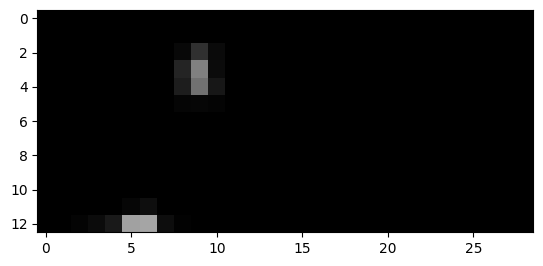

2122


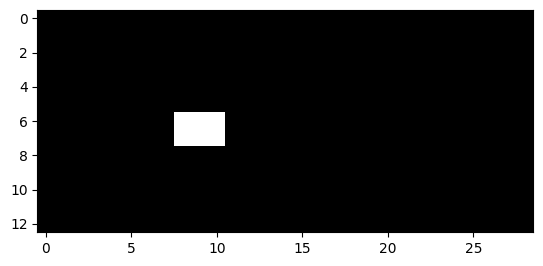

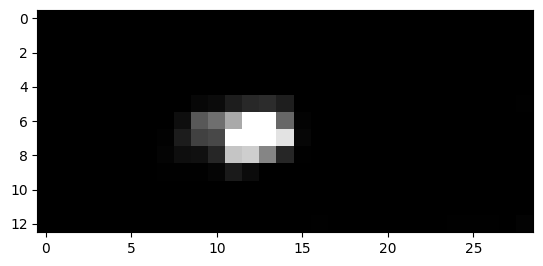

2123


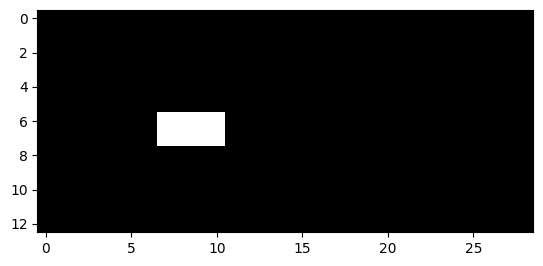

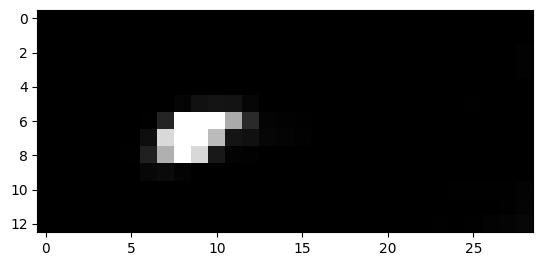

2124


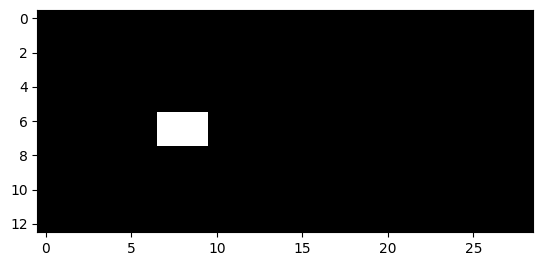

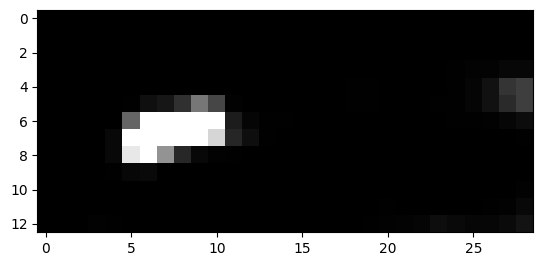

2126


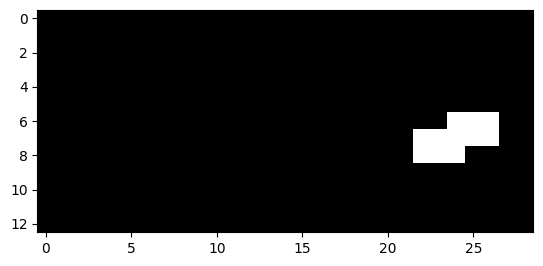

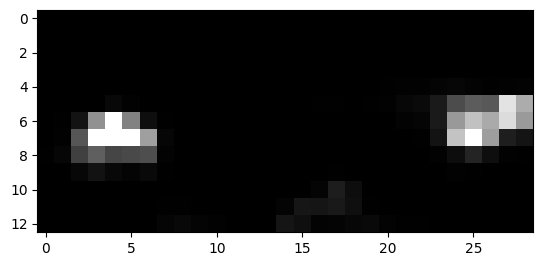

2127


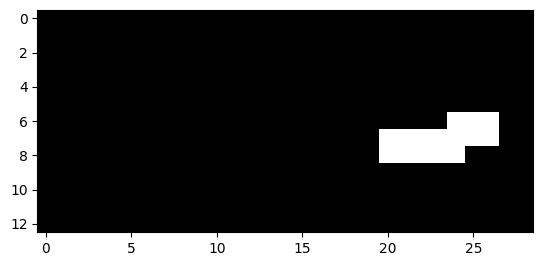

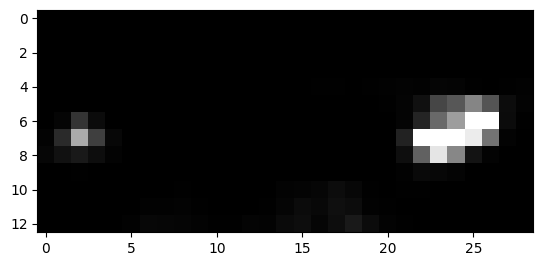

2128


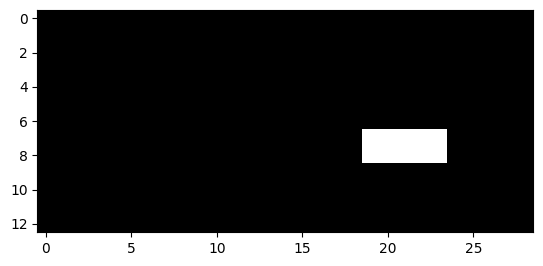

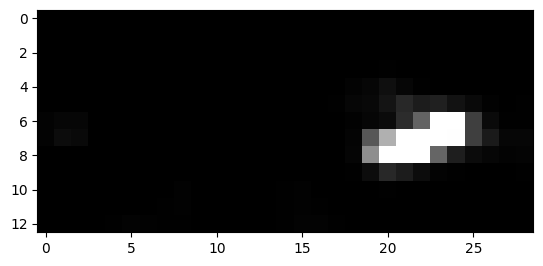

2129


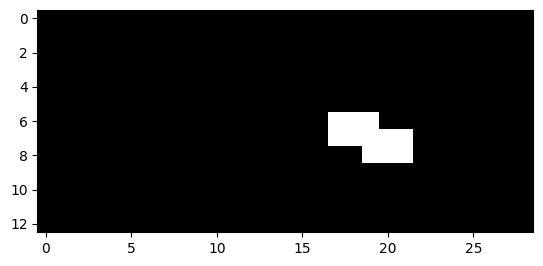

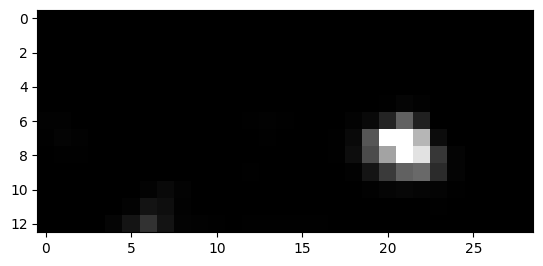

2130


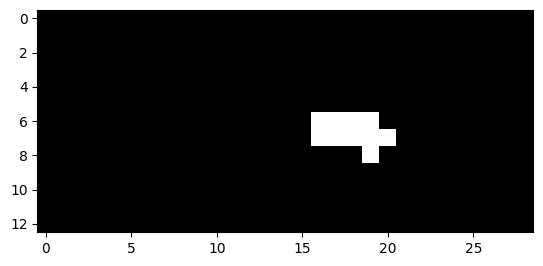

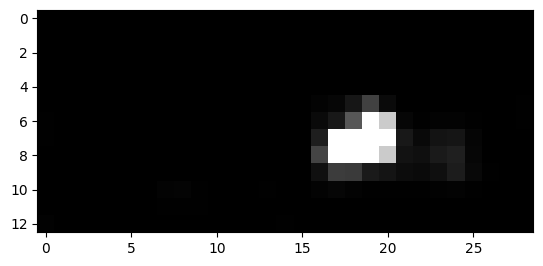

2131


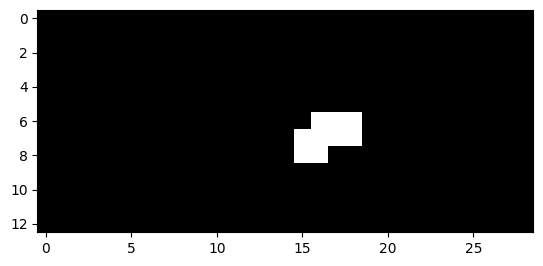

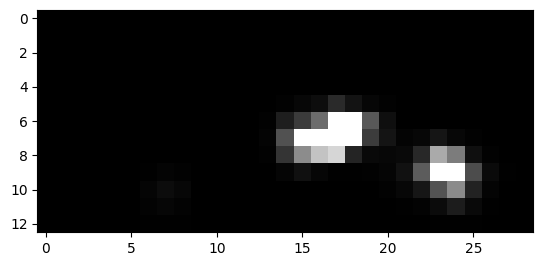

2132


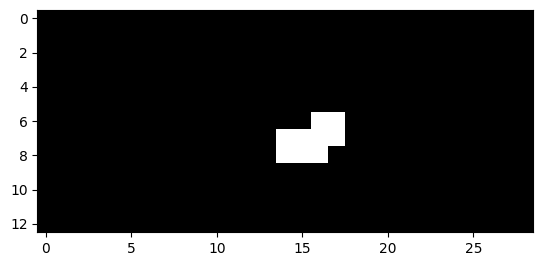

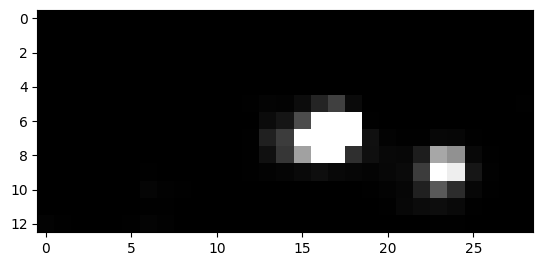

2133


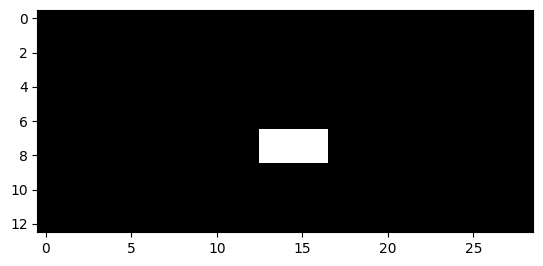

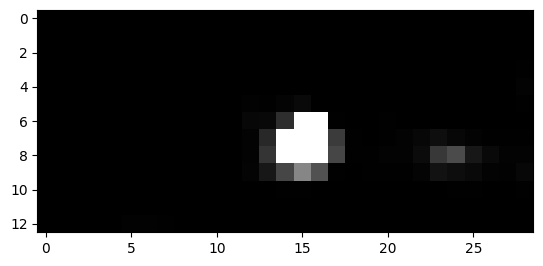

2134


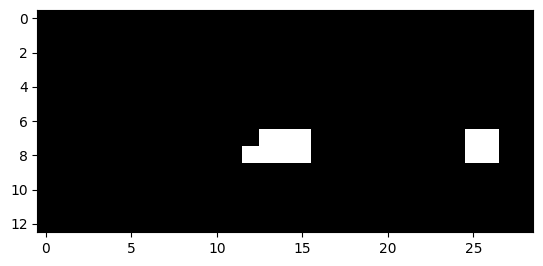

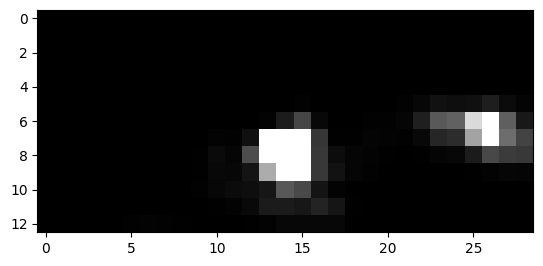

2135


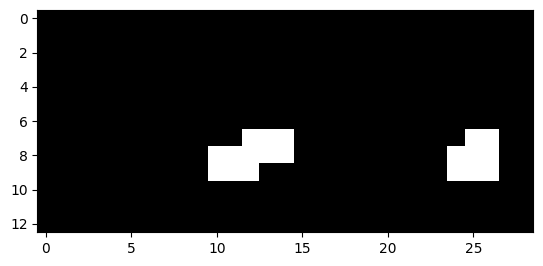

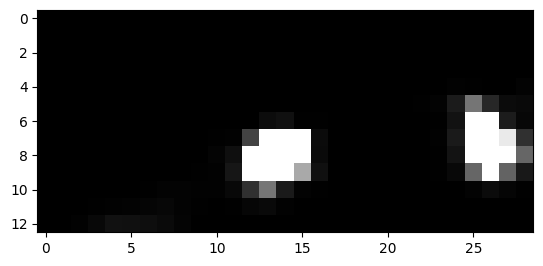

2136


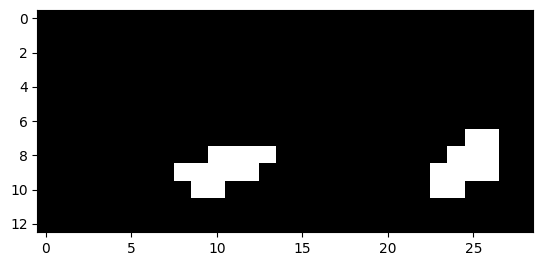

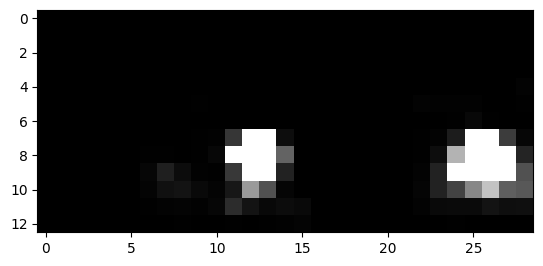

2137


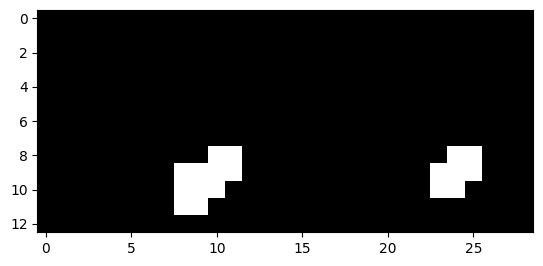

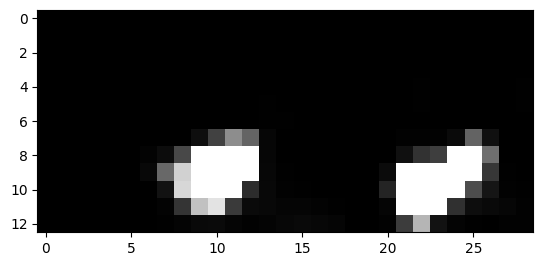

2138


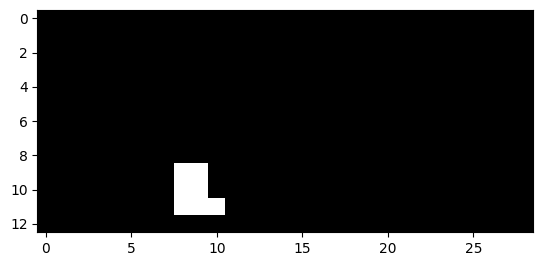

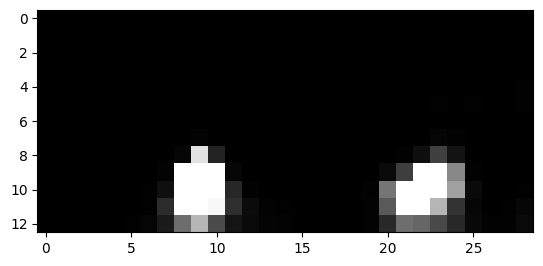

2139


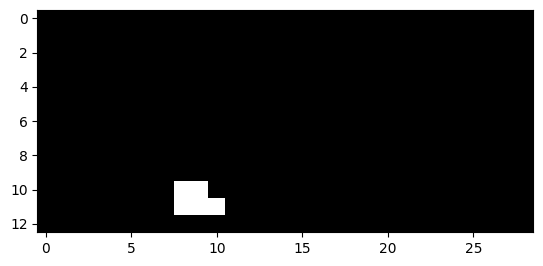

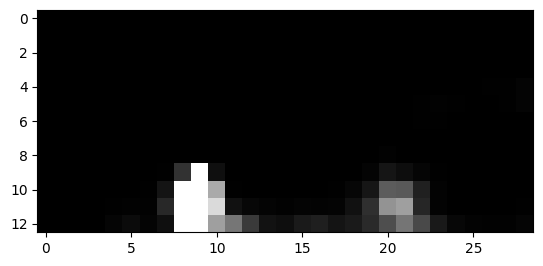

2143


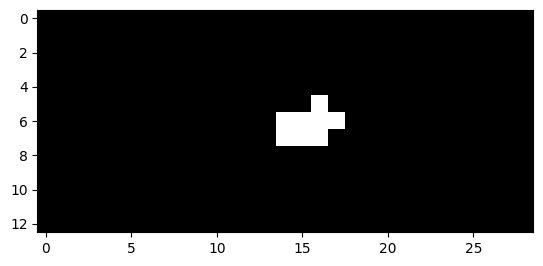

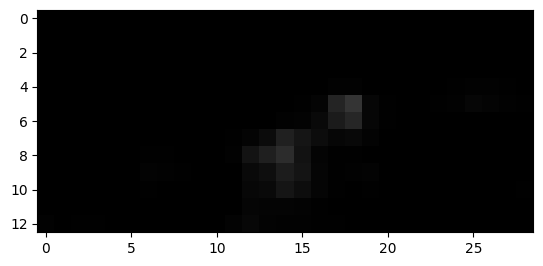

2144


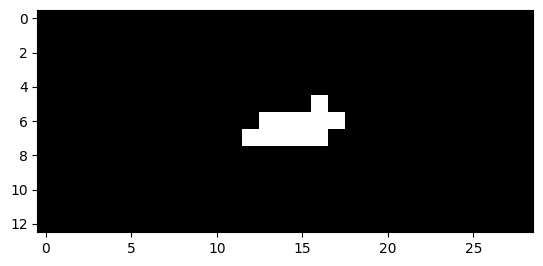

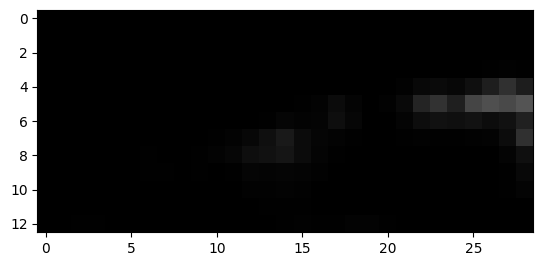

2145


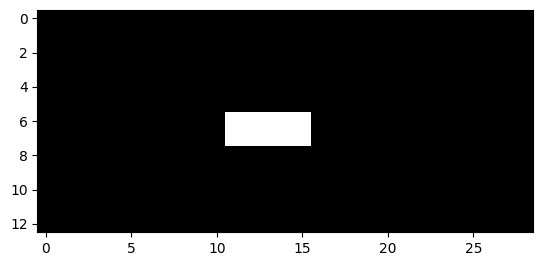

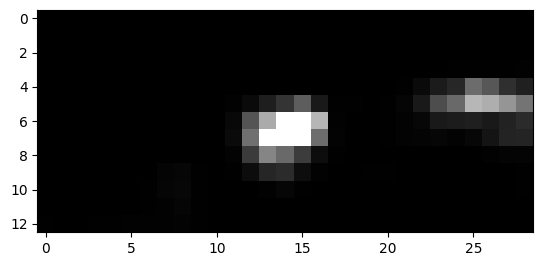

2146


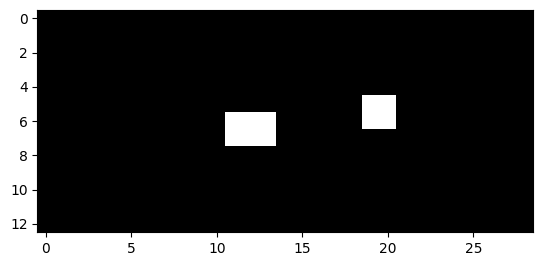

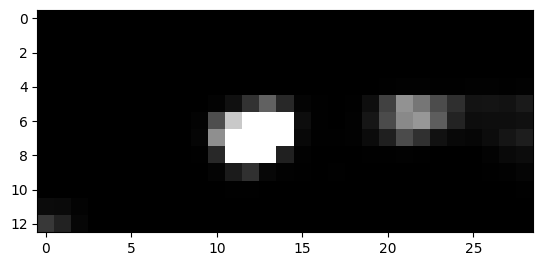

2147


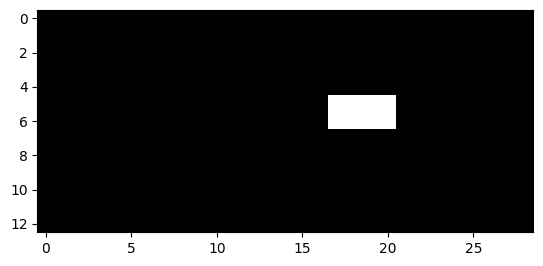

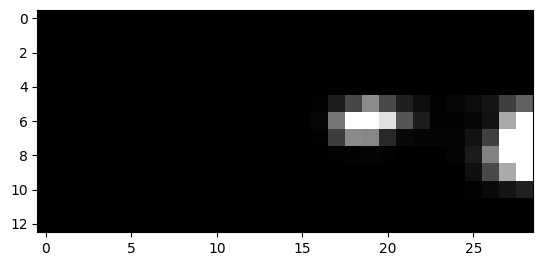

2148


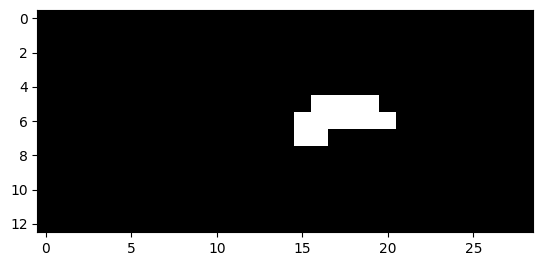

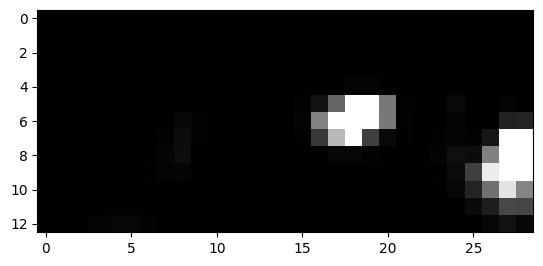

2149


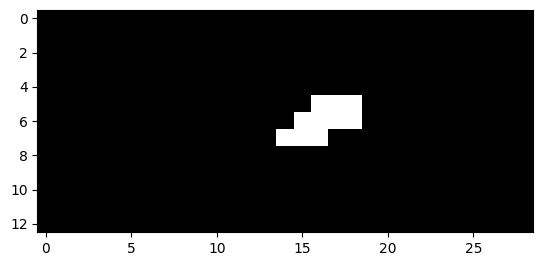

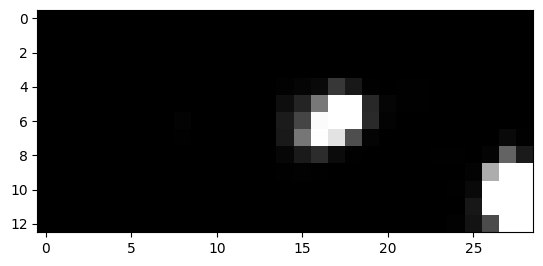

2150


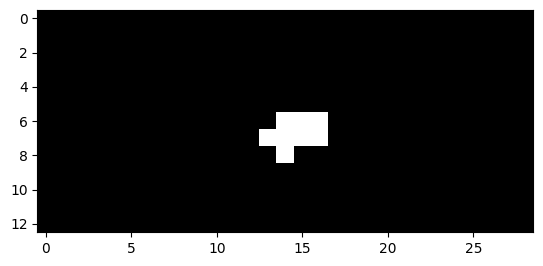

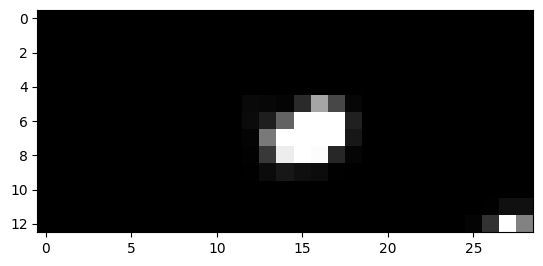

2151


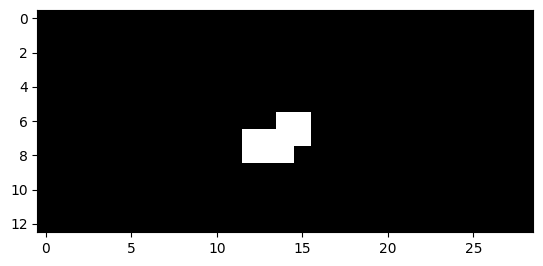

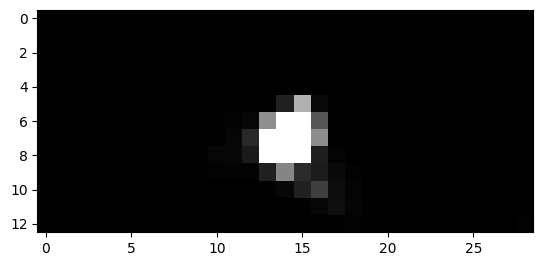

2152


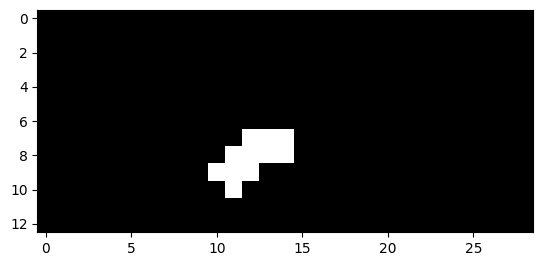

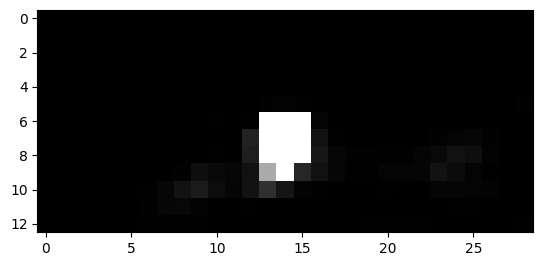

2153


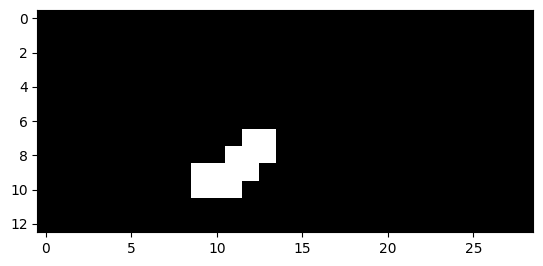

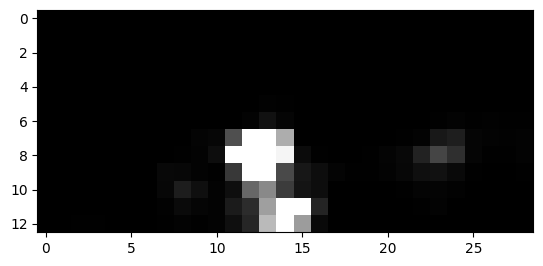

2154


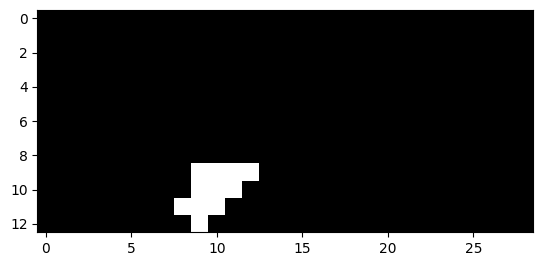

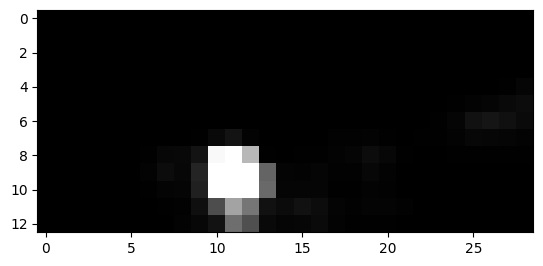

2155


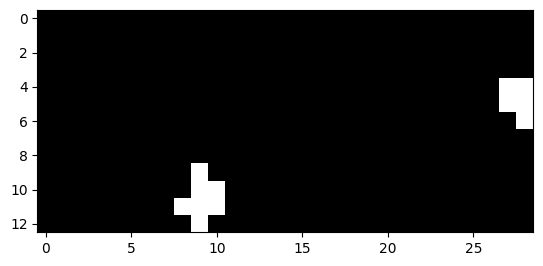

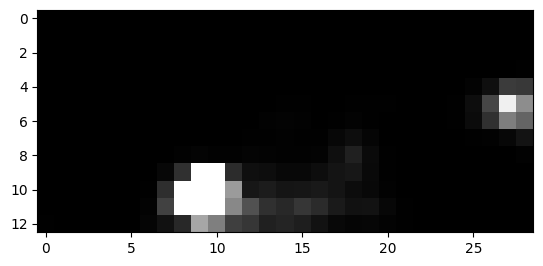

2156


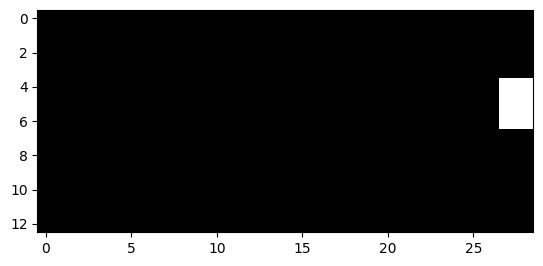

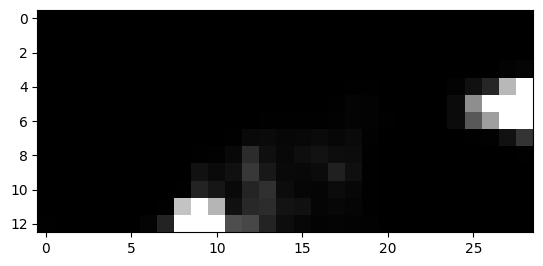

2157


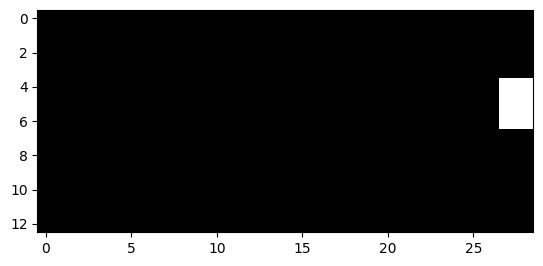

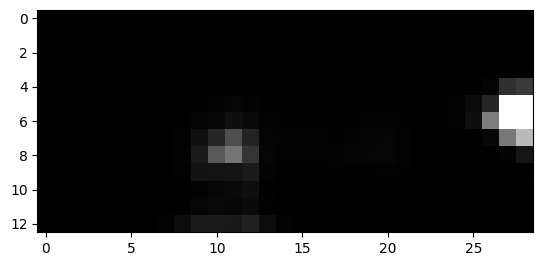

2166


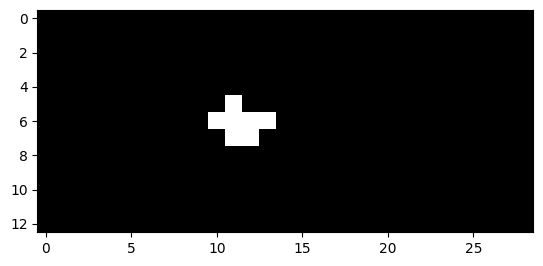

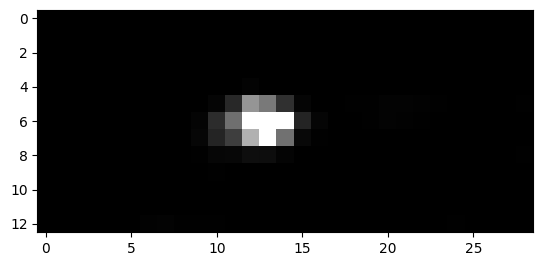

2167


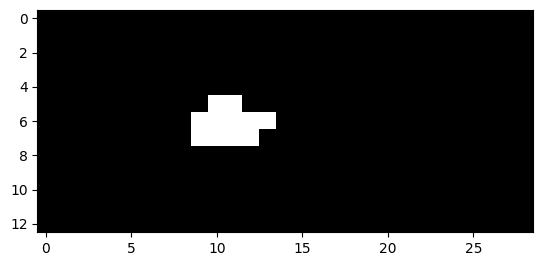

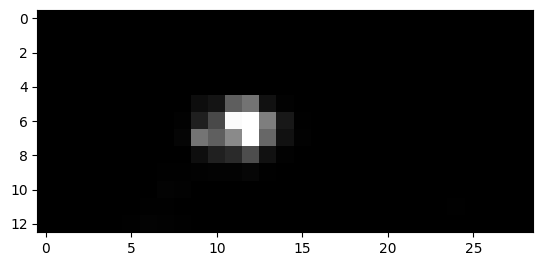

2168


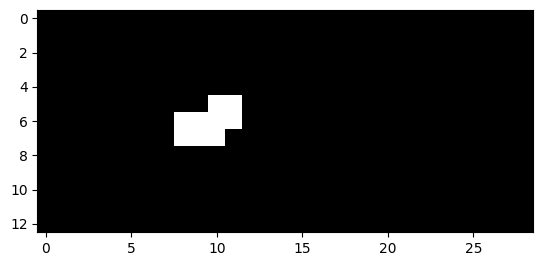

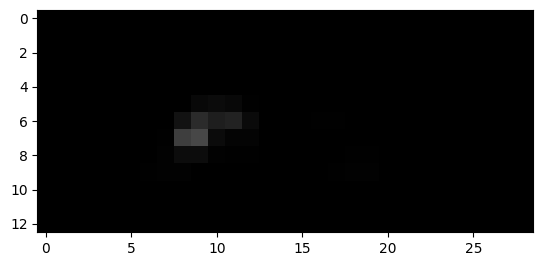

2169


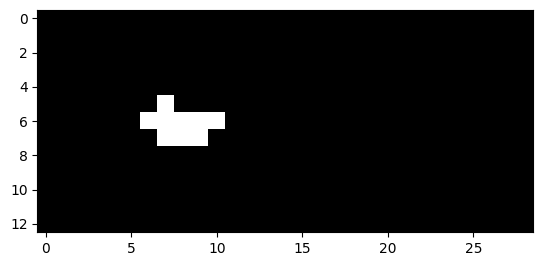

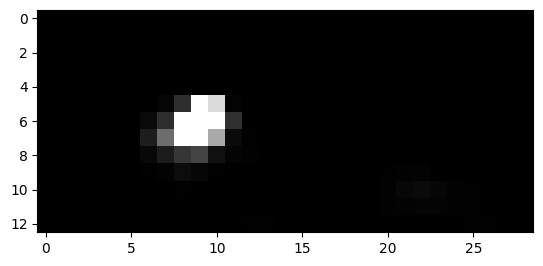

2170


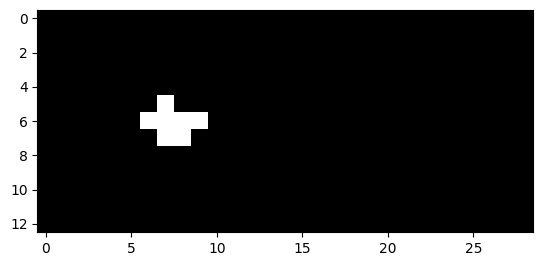

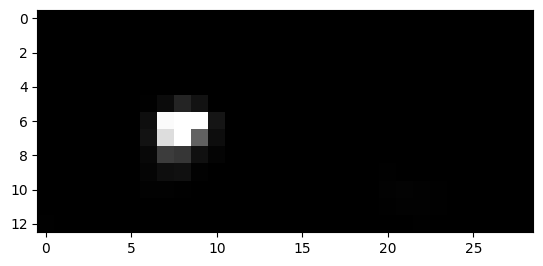

2171


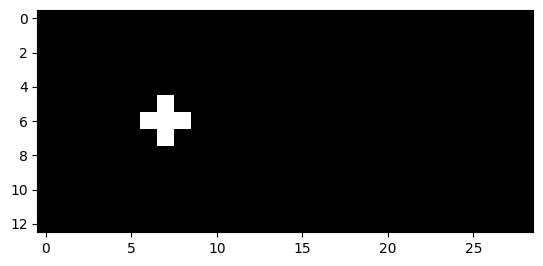

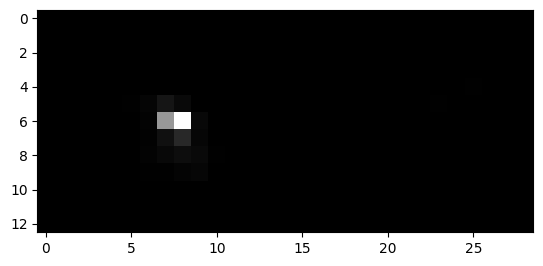

2174


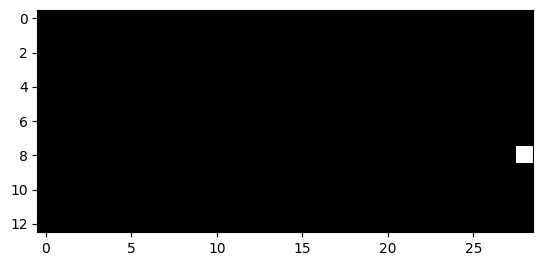

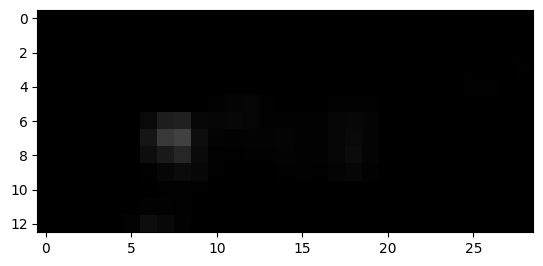

2175


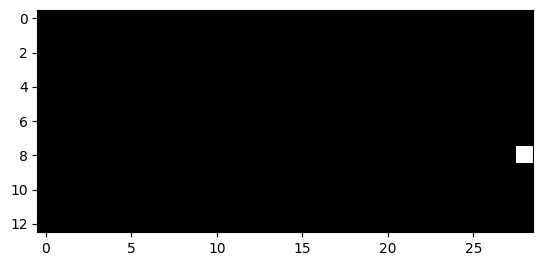

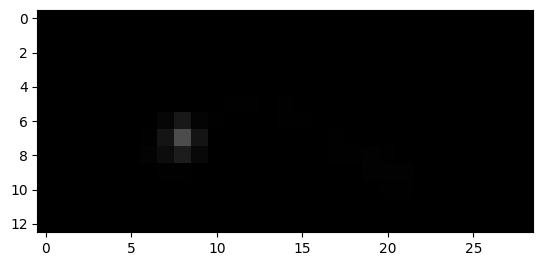

2181


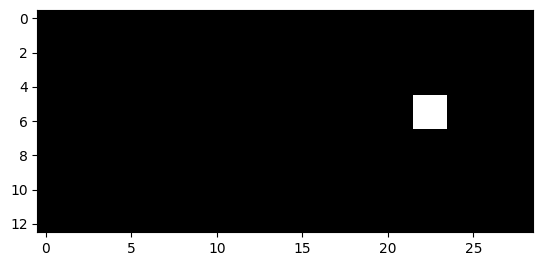

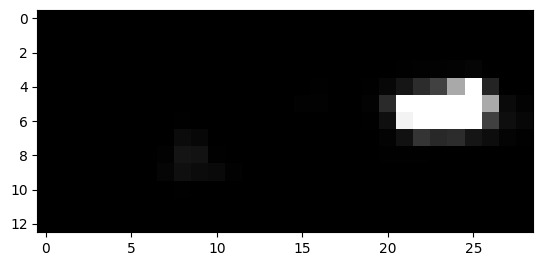

2182


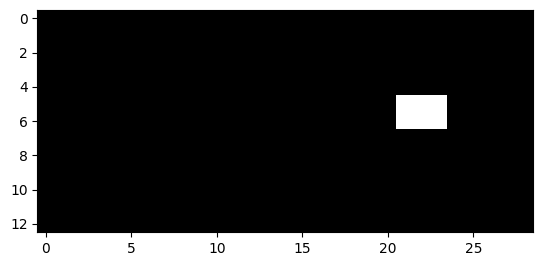

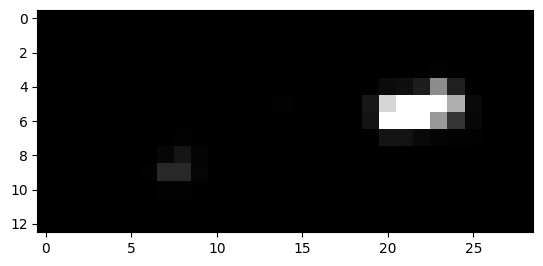

2183


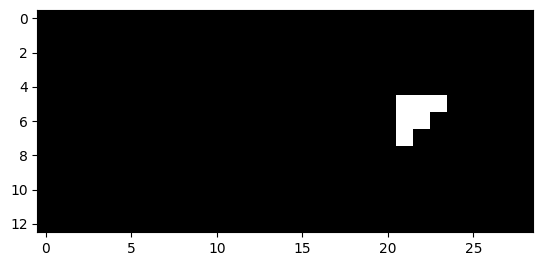

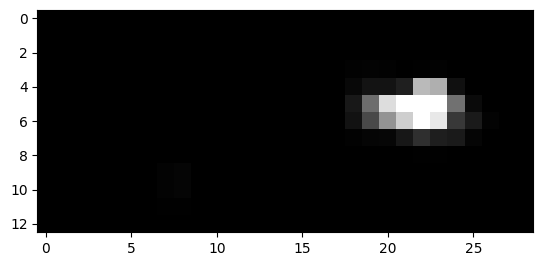

2184


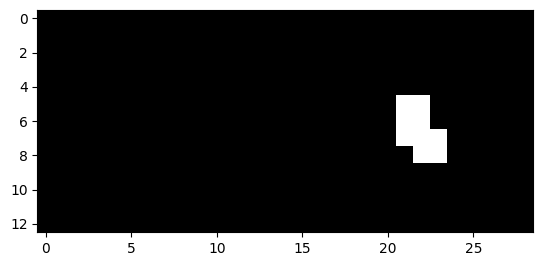

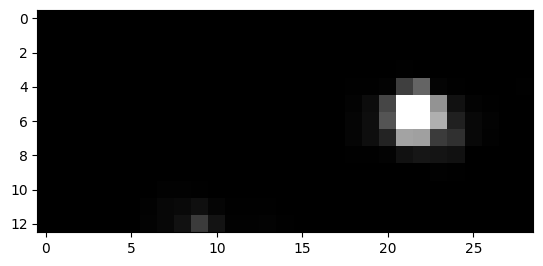

2185


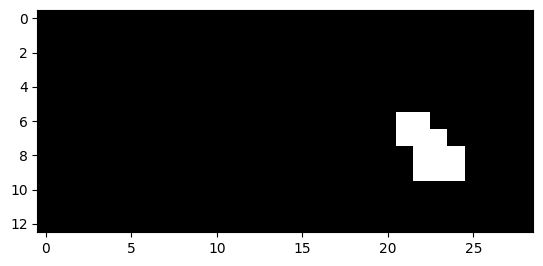

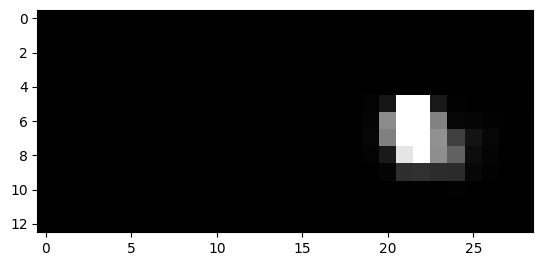

2186


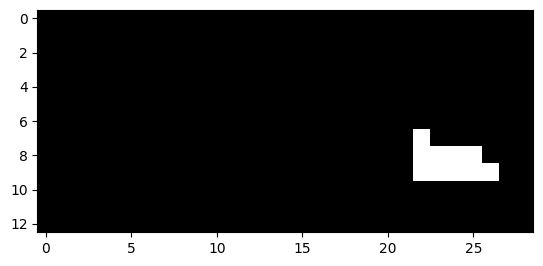

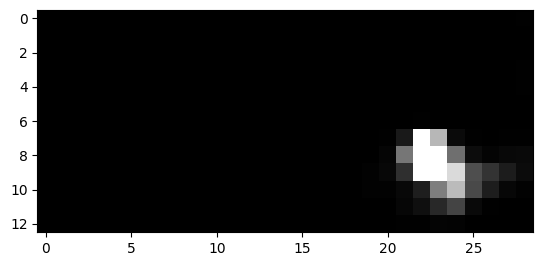

2187


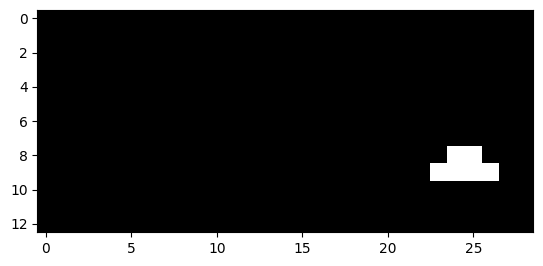

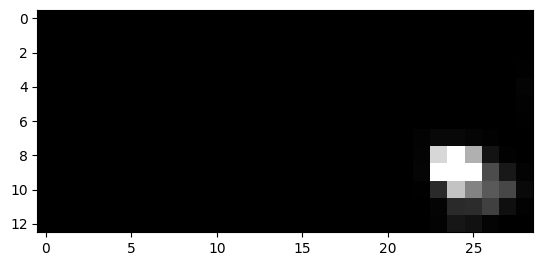

2188


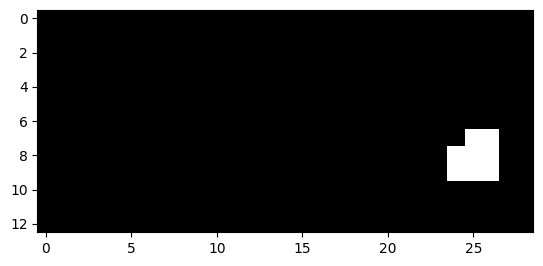

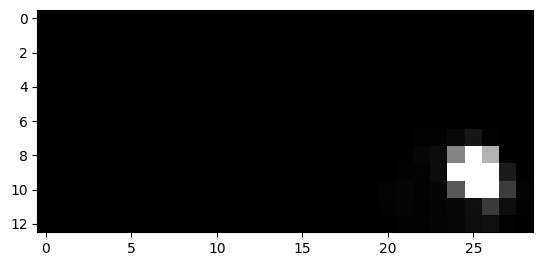

2189


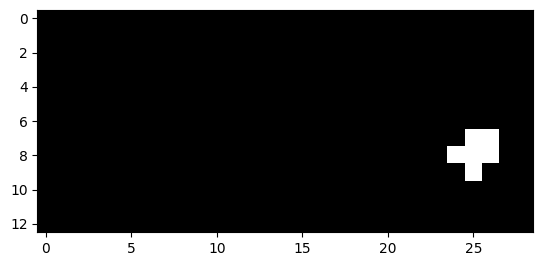

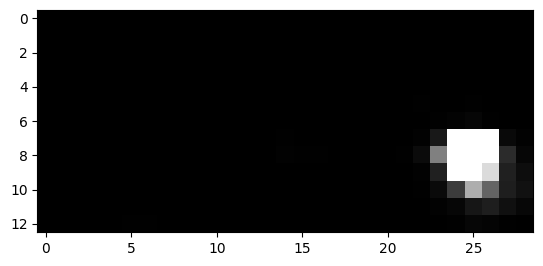

2190


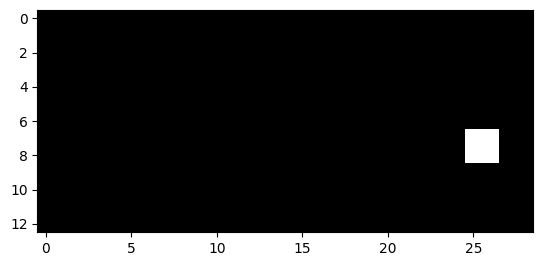

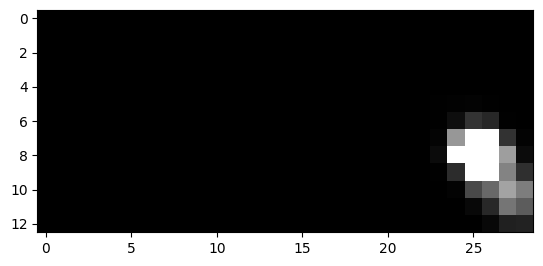

2191


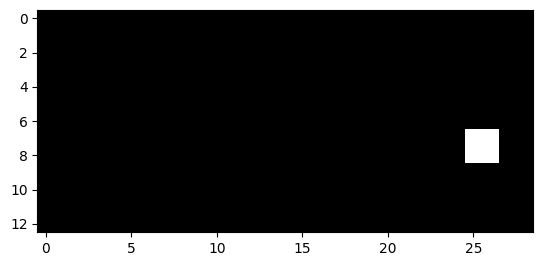

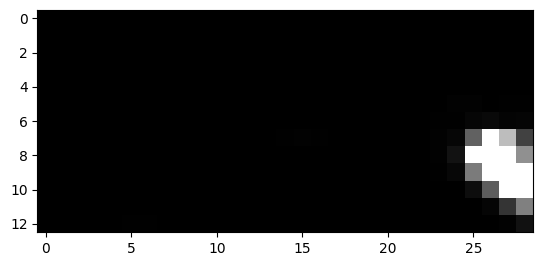

2214


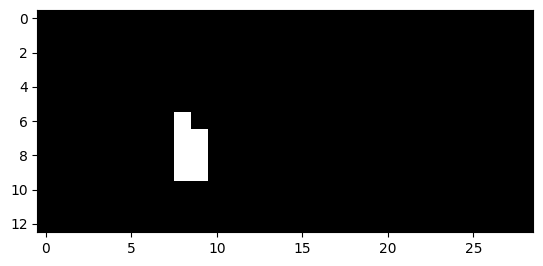

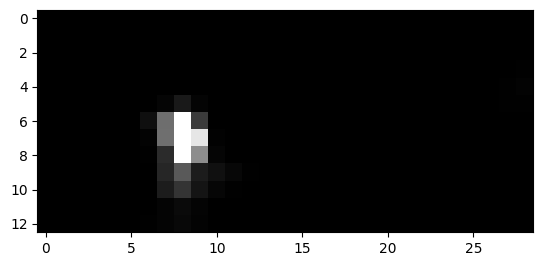

2215


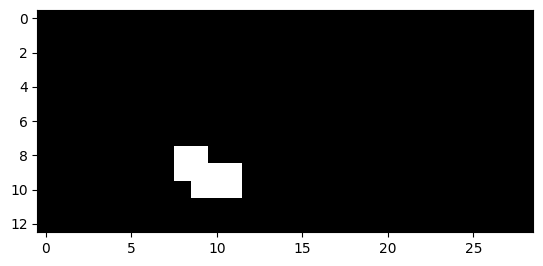

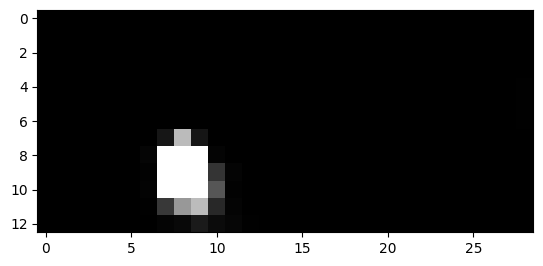

2216


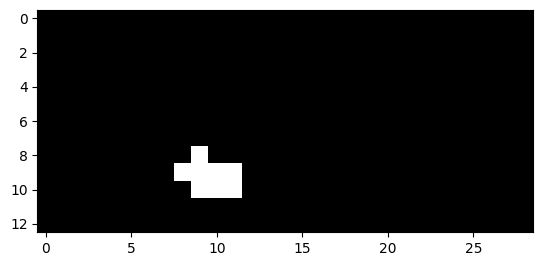

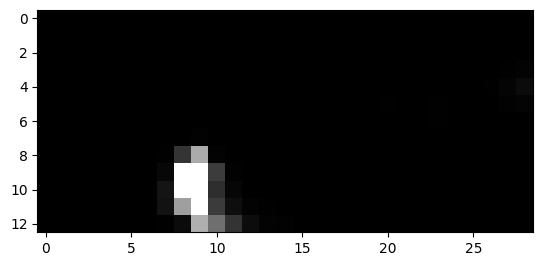

2226


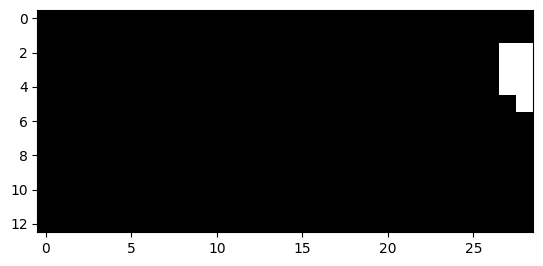

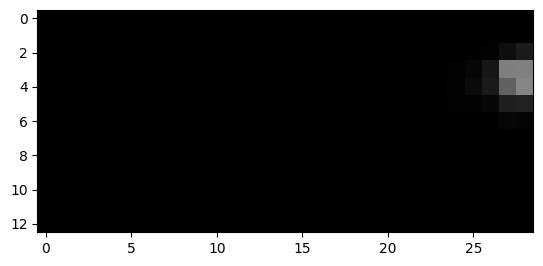

2227


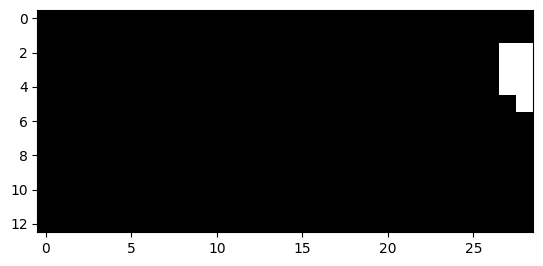

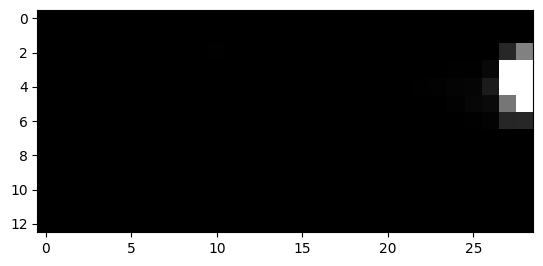

2228


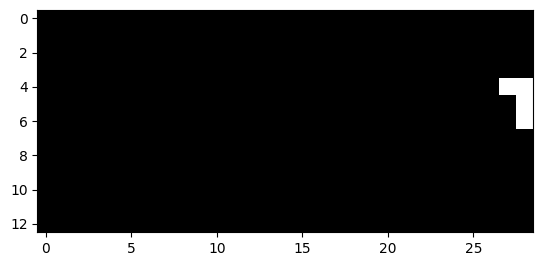

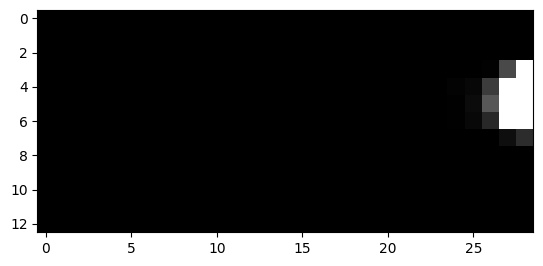

2229


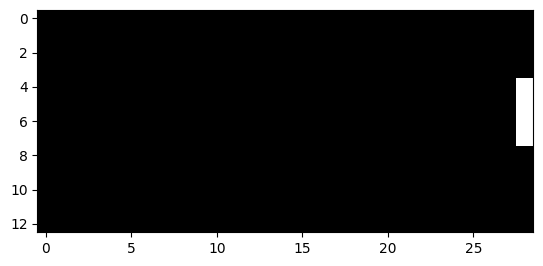

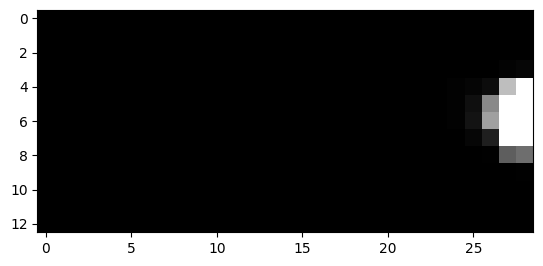

2230


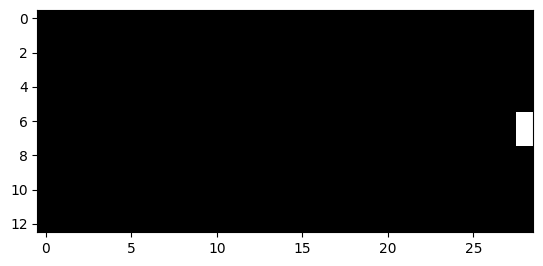

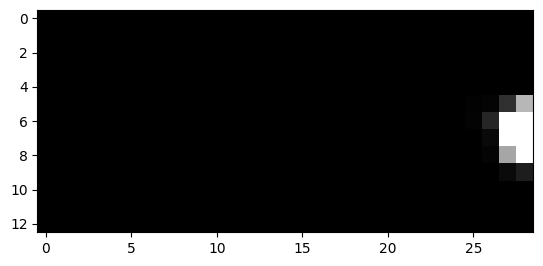

389


In [18]:
k=0
for i in range(len(y_test_img)): 
    if(np.max(y_test_img[i].reshape(-1))>0.1):
        print(i)
        plt.figure()
        plt.imshow(y_test_img[i], cmap = "gray", vmin=0, vmax=1)
        plt.show()
        plt.imshow(t[i], vmin=0, vmax=0.3, cmap = "gray")
        plt.show()
        k+=1
print(k)

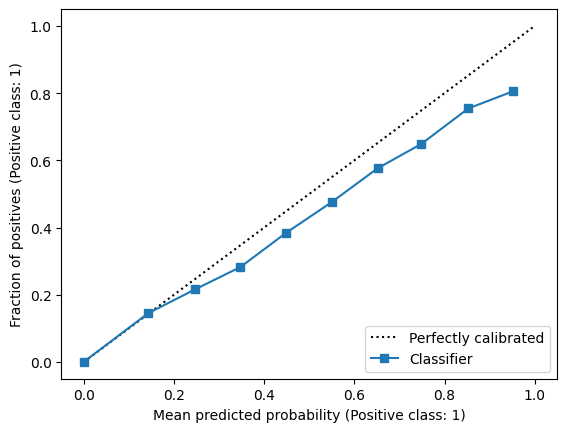

In [59]:
from sklearn.calibration import CalibrationDisplay

display = CalibrationDisplay.from_predictions(y_test_img[1:].reshape(-1,1), t.reshape(-1,1), n_bins=10)


In [60]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette

print(f'All zeros Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), np.zeros(len(y_test_img[1:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), t.reshape(-1,1))}')

All zeros Brier score: 0.00352736722604527
Model Brier score: 0.002218494190500883


In [61]:
z = np.zeros((1,13,29,1))
tt = np.concatenate((z,t))
test['predictions_lag0'] = tt.reshape(-1,1)

In [62]:
test.to_csv("test_with_newTarget_predictions_2days.csv")

## Lags

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_28 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_9 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_29 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_9 (Cropping2D)   (None, 13, 29, 1)        

2023-06-14 16:57:39.249280: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0875

2023-06-14 16:57:42.746013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0875 - val_loss: 0.0175
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0184 - val_loss: 0.0152
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0166 - val_loss: 0.0137
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0157 - val_loss: 0.0134
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0151 - val_loss: 0.0135
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0146 - val_loss: 0.0125
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0141 - val_loss: 0.0125
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0138 - val_loss: 0.0124
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0135 - val_loss: 0.0124
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0132 - val_loss: 0.0117


Epoch 80: early stopping
18/77 [======>.......................] - ETA: 0s 

2023-06-14 17:01:17.489775: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


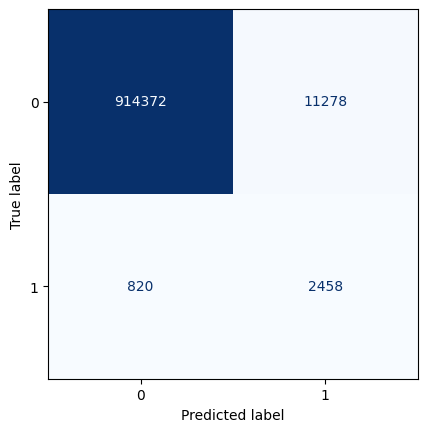

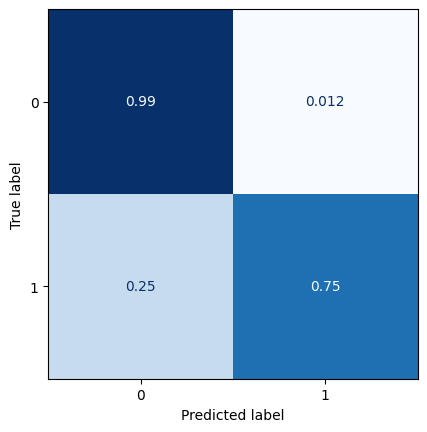

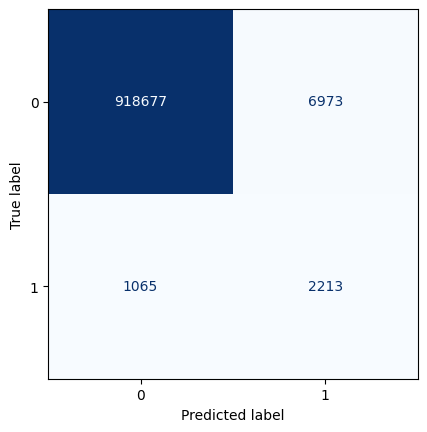

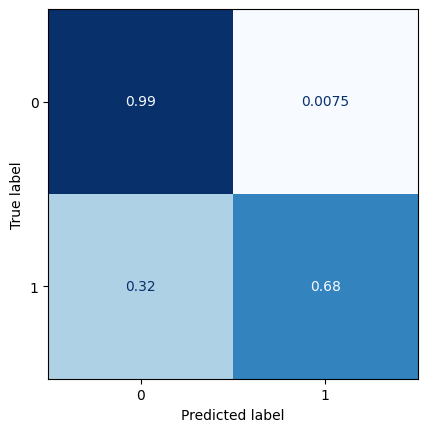

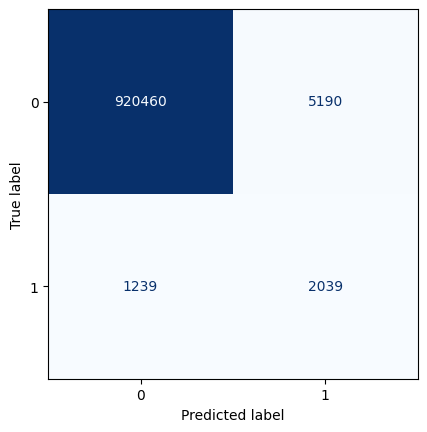

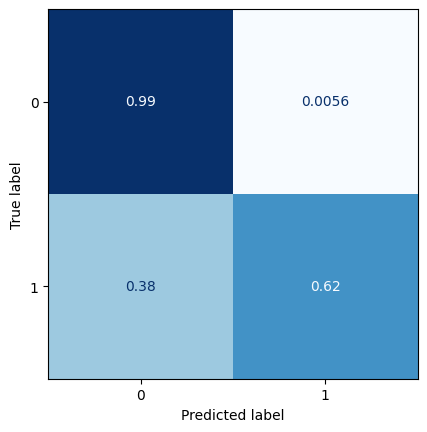

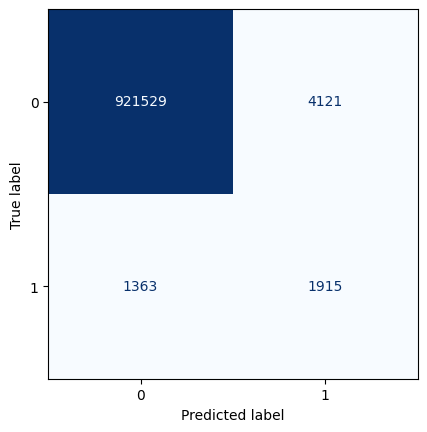

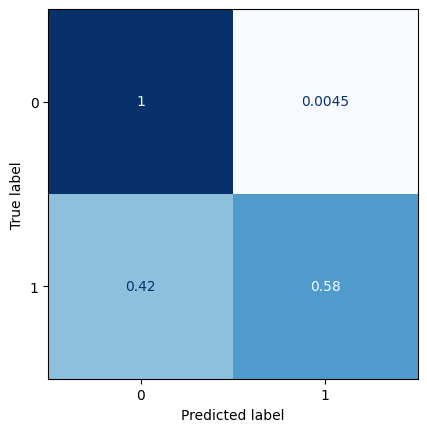

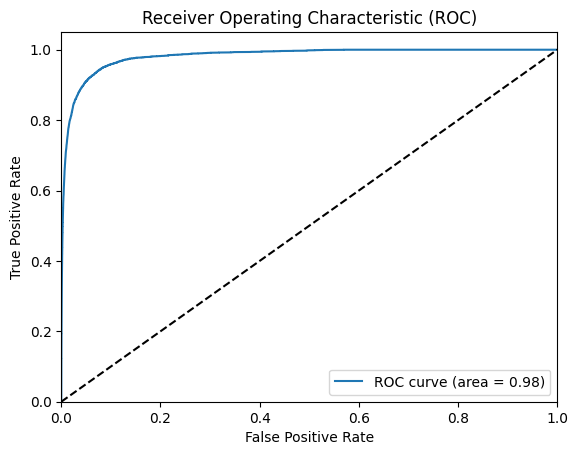

All zeros Brier score: 0.003528798787419477
Model Brier score: 0.0026867946519221753
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_10 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:01:37.256314: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0512

2023-06-14 17:01:40.987509: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 11ms/step - loss: 0.0512 - val_loss: 0.0192
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0195 - val_loss: 0.0167
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0179 - val_loss: 0.0159
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0171 - val_loss: 0.0158
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0165 - val_loss: 0.0154
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0161 - val_loss: 0.0146
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0158 - val_loss: 0.0143
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0156 - val_loss: 0.0140
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0154 - val_loss: 0.0151
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0153 - val_loss: 0.0143


2023-06-14 17:04:03.558721: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


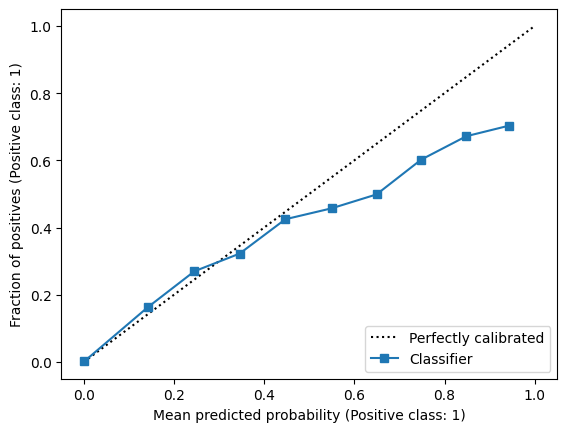

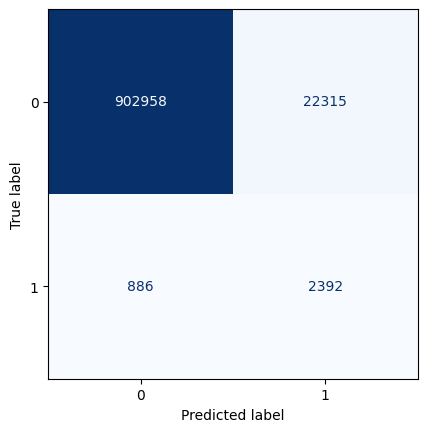

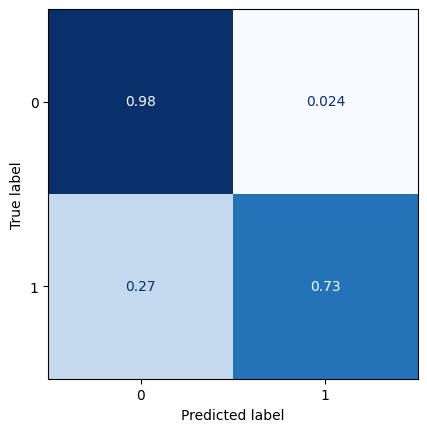

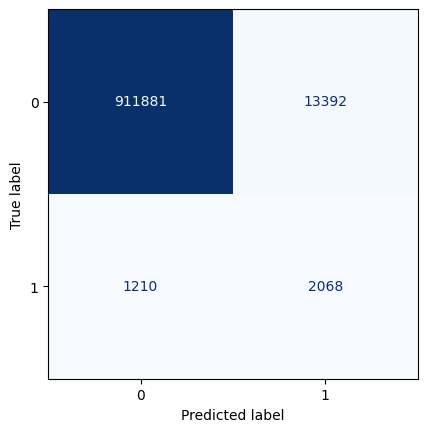

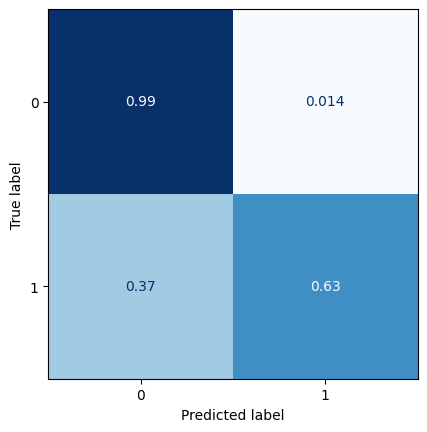

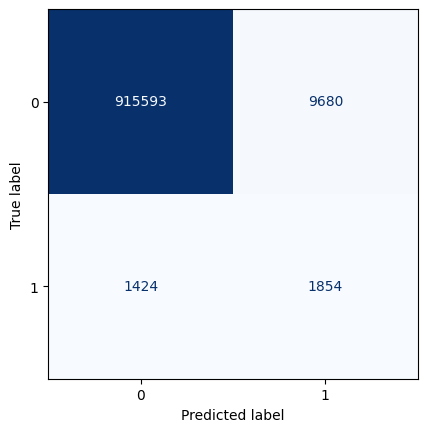

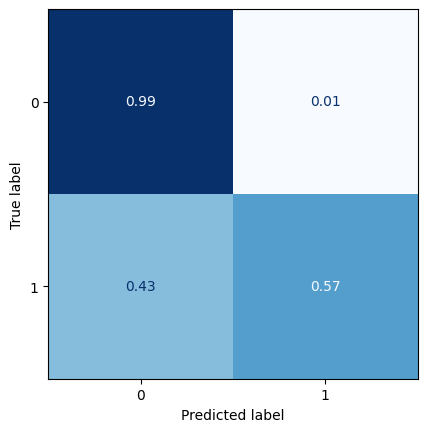

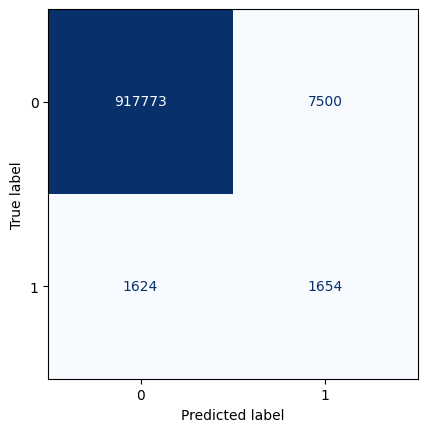

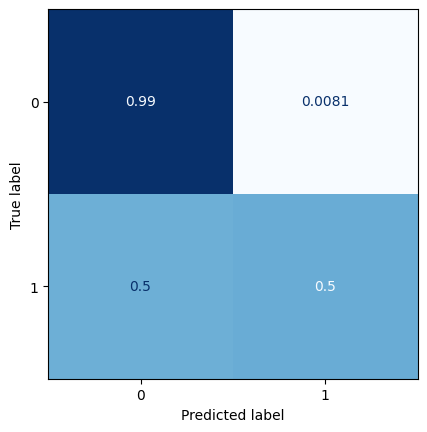

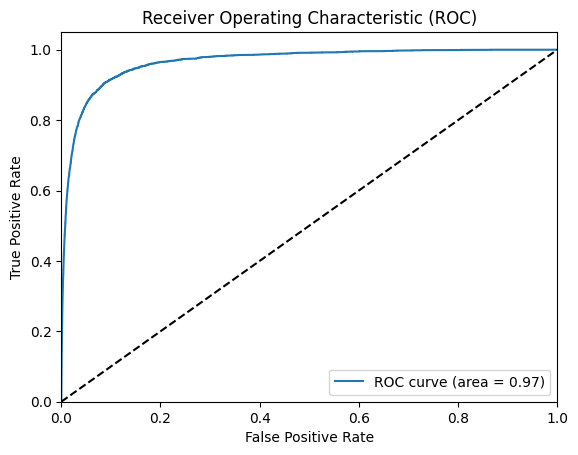

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.003114150154409445
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_11 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_35 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:04:24.427024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0633

2023-06-14 17:04:30.016191: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 17ms/step - loss: 0.0633 - val_loss: 0.0208
Epoch 2/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0221 - val_loss: 0.0189
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0205 - val_loss: 0.0183
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0178
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0173
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0171
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0185 - val_loss: 0.0170
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0182 - val_loss: 0.0174
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0180 - val_loss: 0.0168
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0177 - val_loss: 0.0169

2023-06-14 17:07:13.119798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


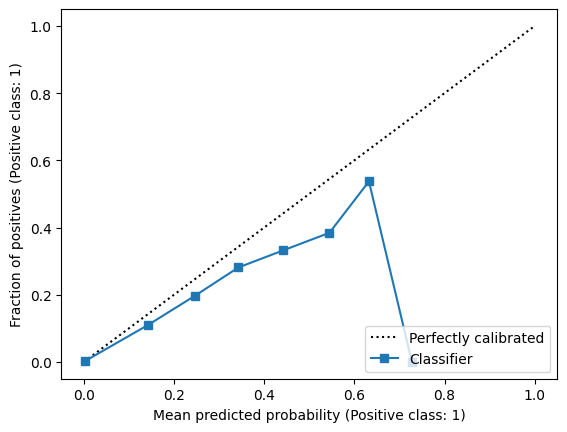

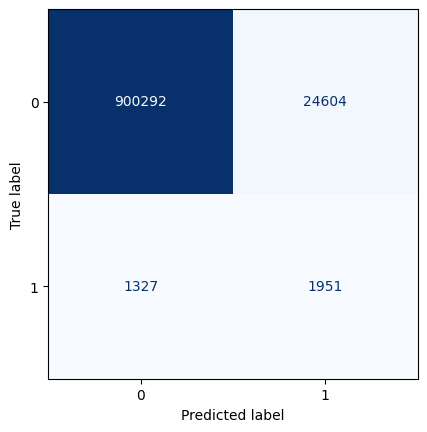

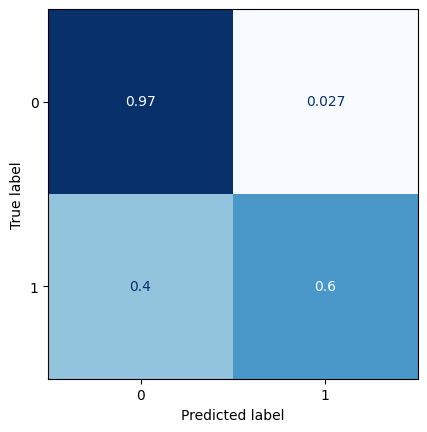

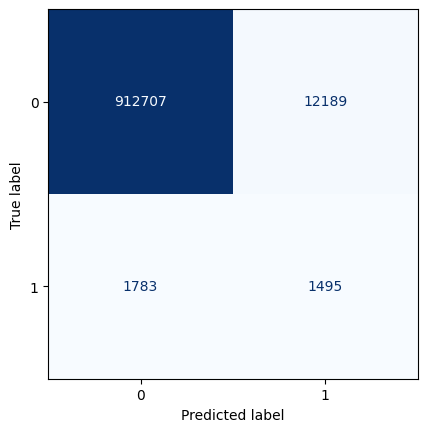

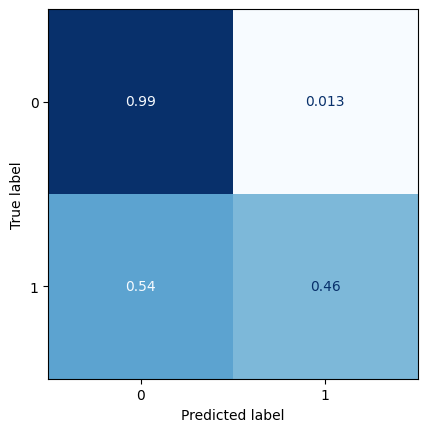

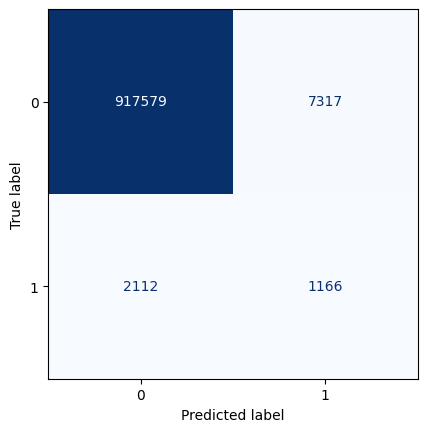

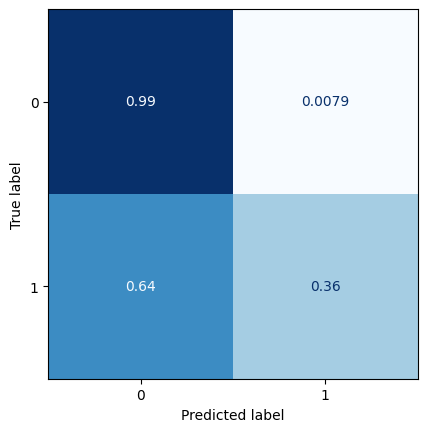

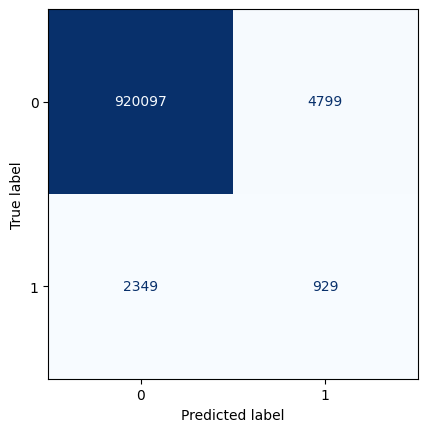

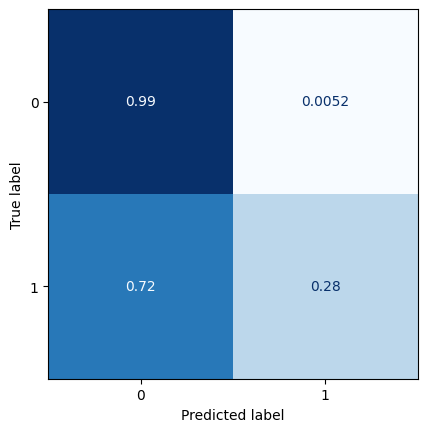

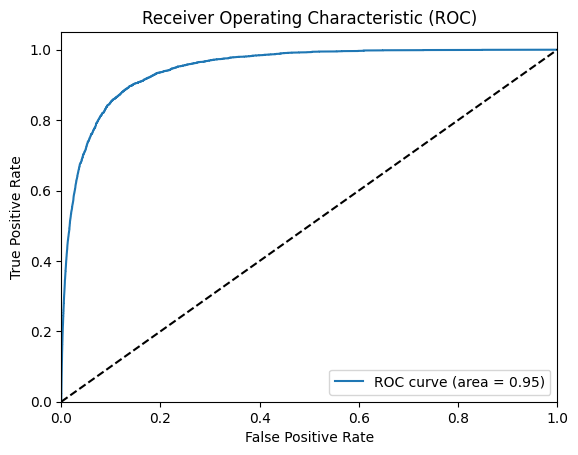

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.0032779860092476206
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_12 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-06-14 17:07:33.581478: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0637

2023-06-14 17:07:36.796556: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0637 - val_loss: 0.0225
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0233 - val_loss: 0.0199
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0194
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0195
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0186
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0199 - val_loss: 0.0182
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0196 - val_loss: 0.0180
Epoch 8/100
354/354 [==============================] - 5s 14ms/step - loss: 0.0194 - val_loss: 0.0179
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0179
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0191 - val_loss: 0.0184


2023-06-14 17:09:48.953915: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


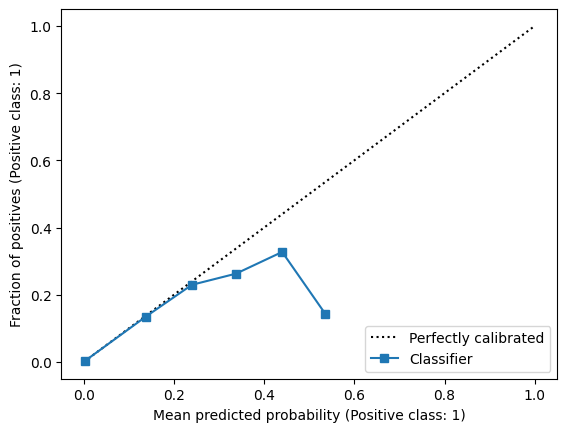

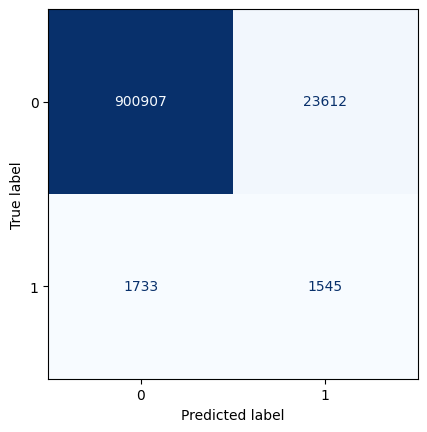

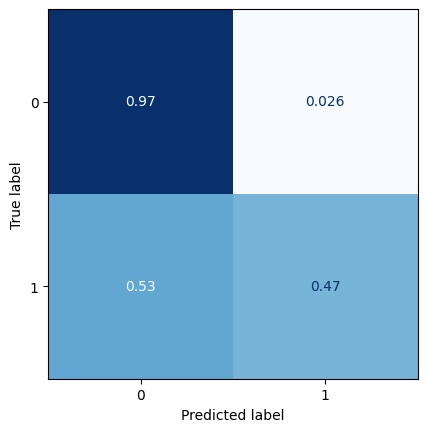

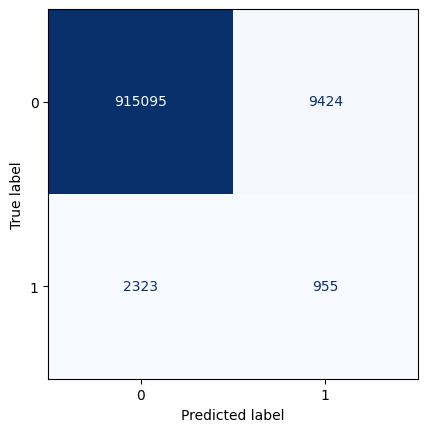

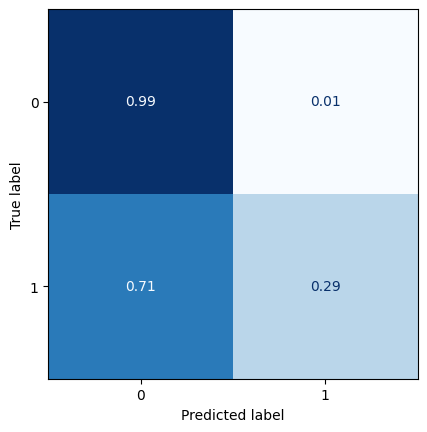

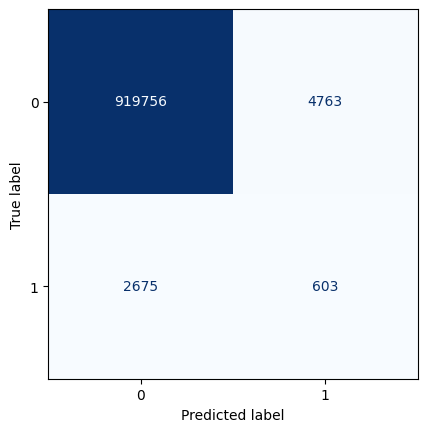

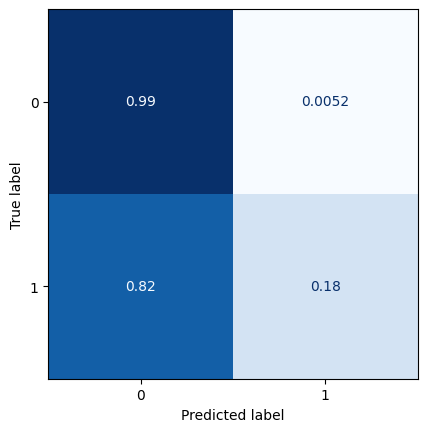

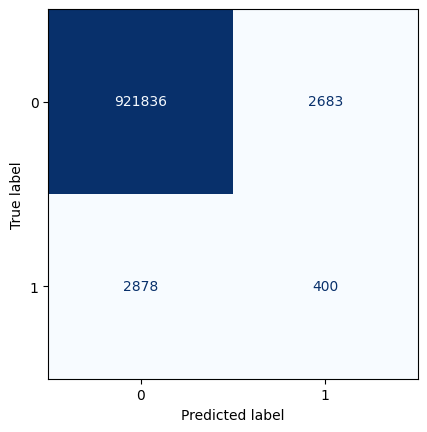

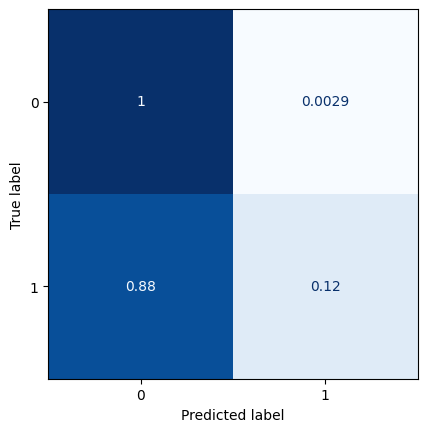

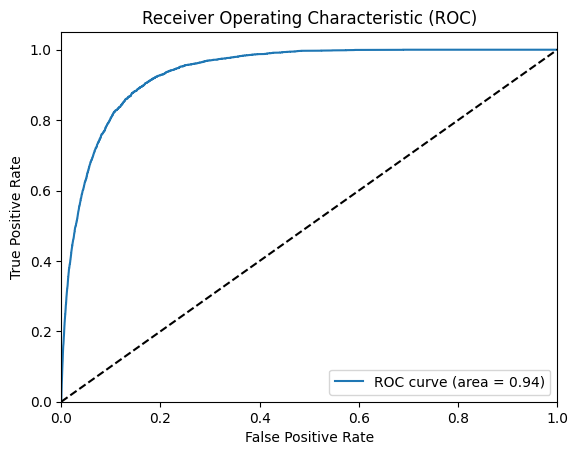

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.00338836536878834
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_40 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_13 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-06-14 17:10:11.624795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0794

2023-06-14 17:10:15.861630: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 13ms/step - loss: 0.0794 - val_loss: 0.0218
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0233 - val_loss: 0.0202
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0192
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0192
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0189
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0193
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0204 - val_loss: 0.0187
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0188
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0200 - val_loss: 0.0185
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0199 - val_loss: 0.0190


2023-06-14 17:12:00.211703: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


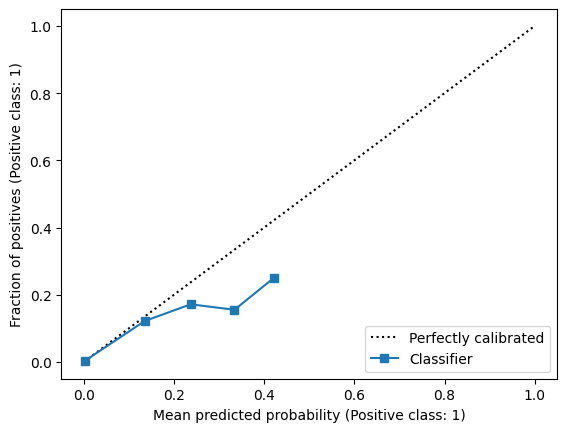

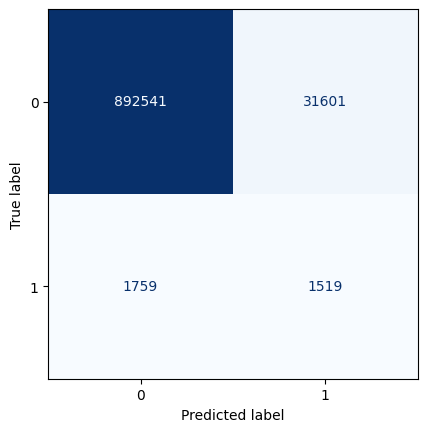

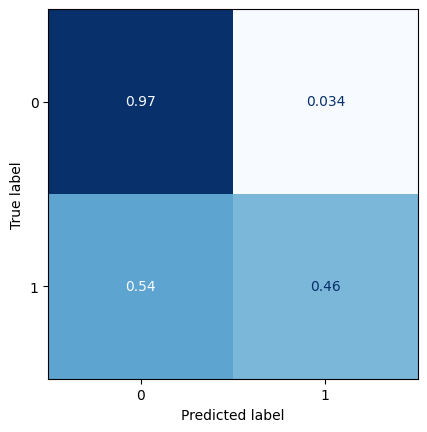

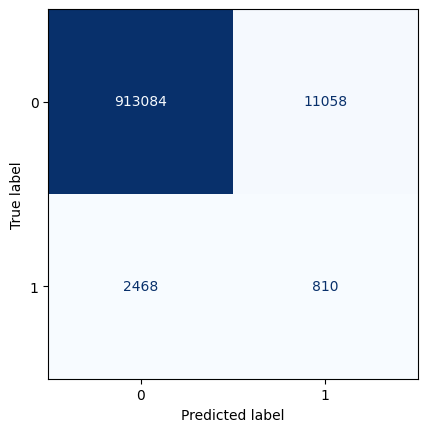

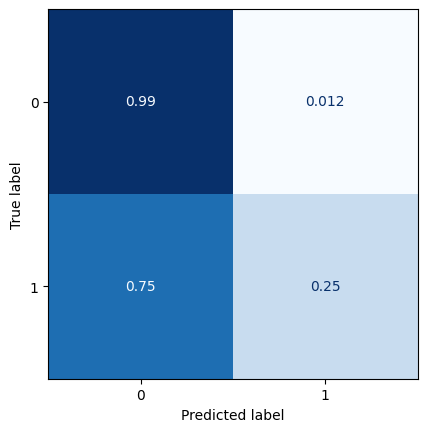

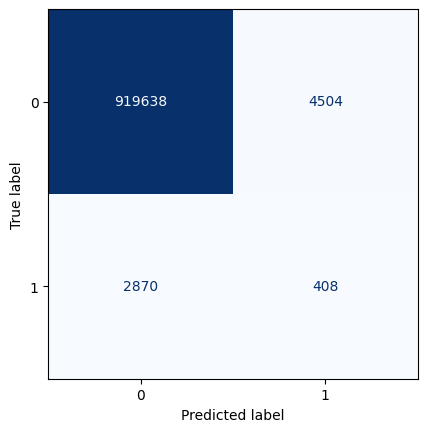

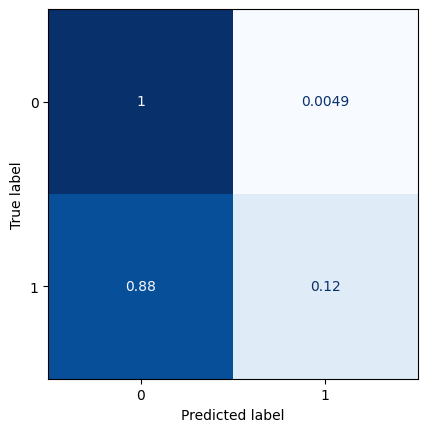

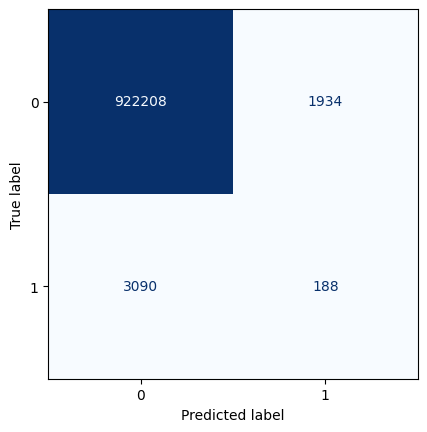

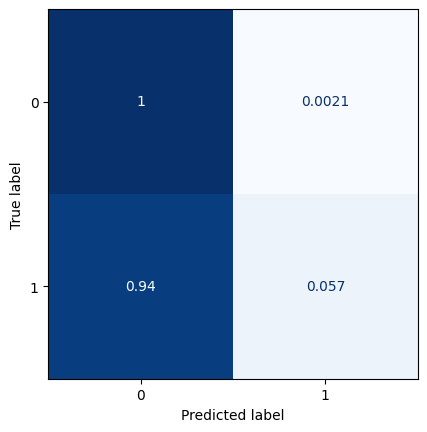

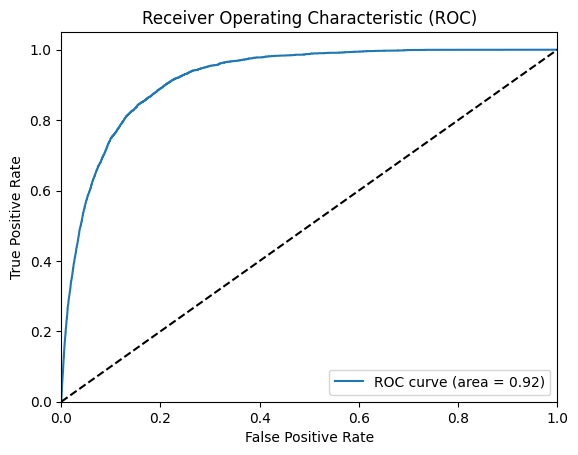

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.0034326494757120794
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_43 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_14 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_44 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:12:26.860812: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0697

2023-06-14 17:12:30.897670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 11ms/step - loss: 0.0697 - val_loss: 0.0219
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0238 - val_loss: 0.0206
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0225 - val_loss: 0.0201
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0194
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0193
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0192
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0189
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0191
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0189
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0206 - val_loss: 0.0190


2023-06-14 17:14:10.538140: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


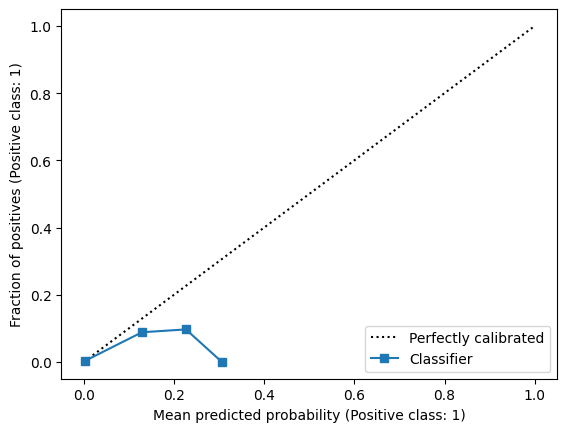

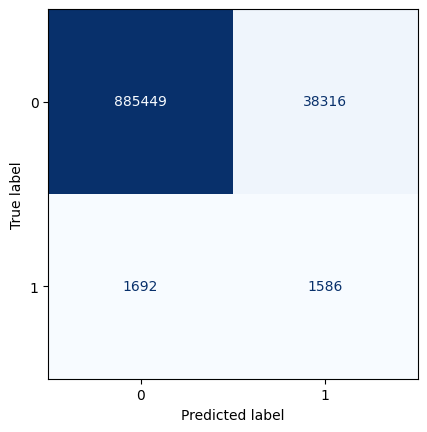

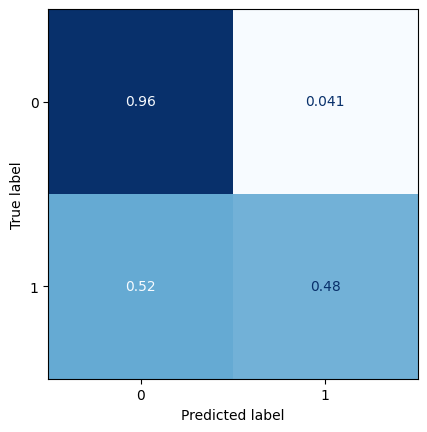

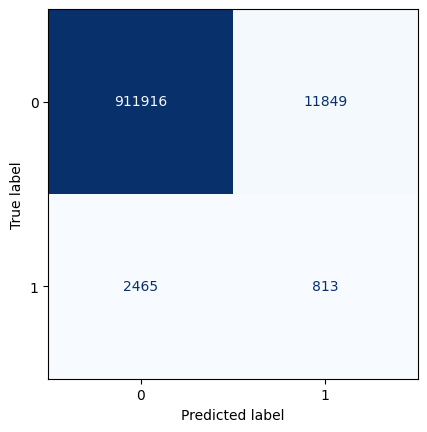

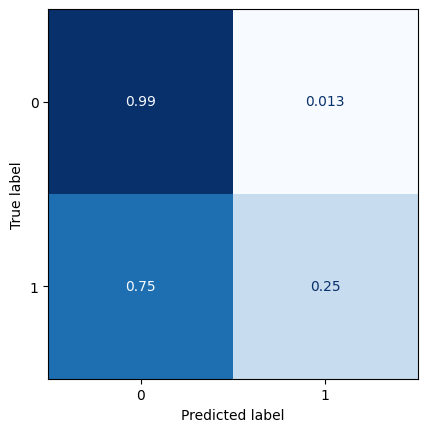

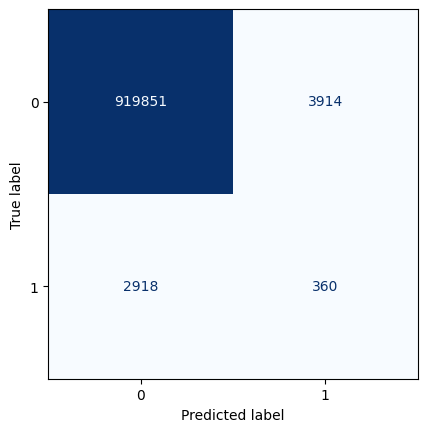

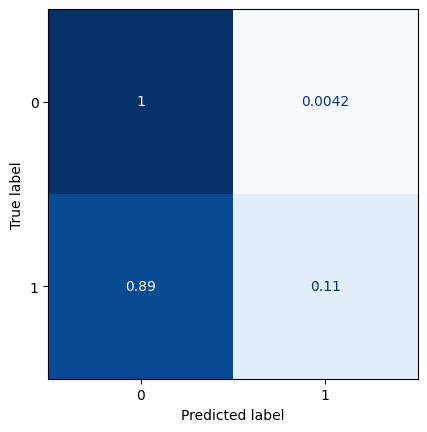

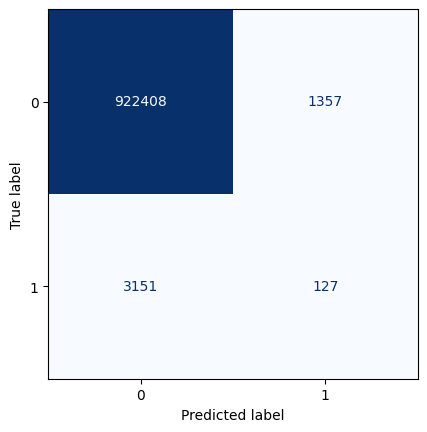

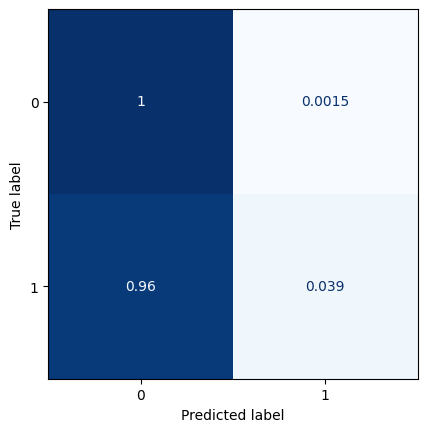

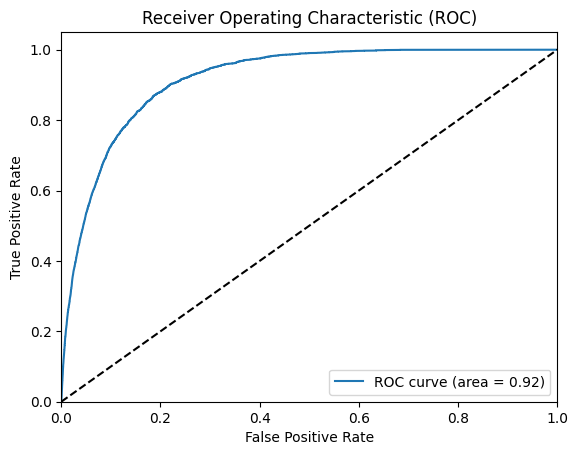

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.0034417315141724047
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_45 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_15 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_47 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-06-14 17:14:32.905069: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0927

2023-06-14 17:14:36.774024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 10ms/step - loss: 0.0927 - val_loss: 0.0231
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0247 - val_loss: 0.0217
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0232 - val_loss: 0.0209
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0205
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0200
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0198
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0194


2023-06-14 17:16:28.302637: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 5ms/step


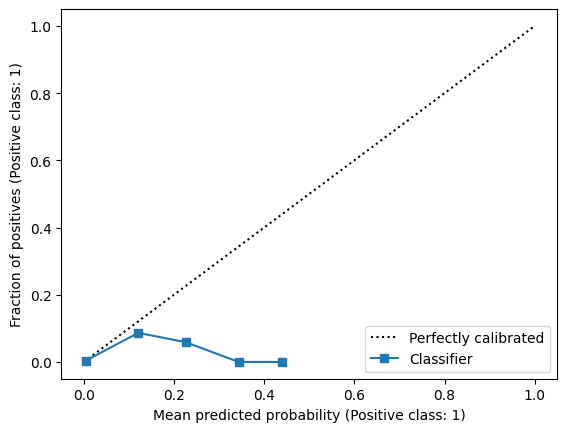

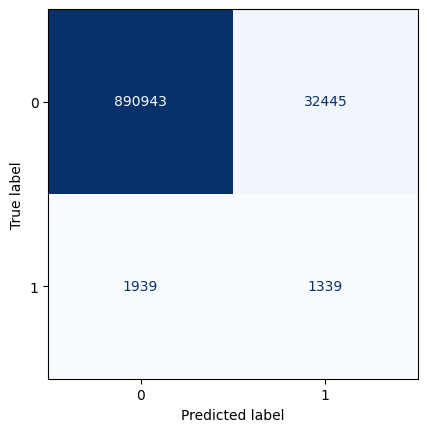

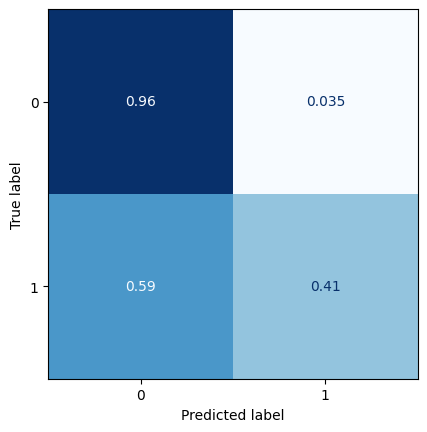

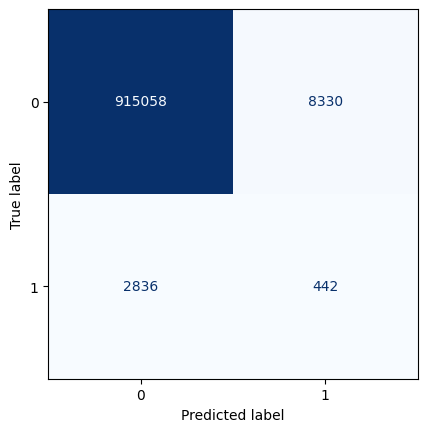

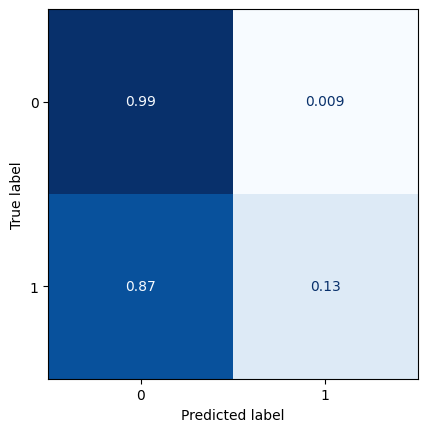

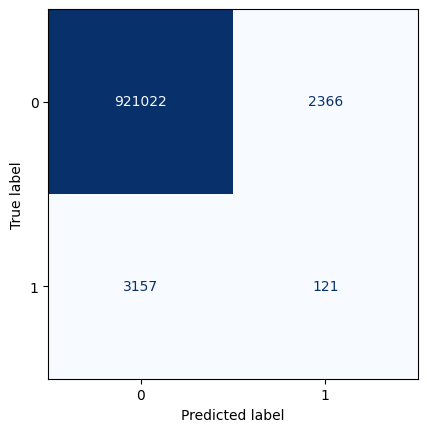

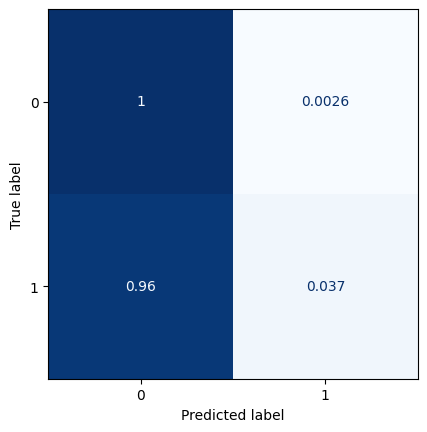

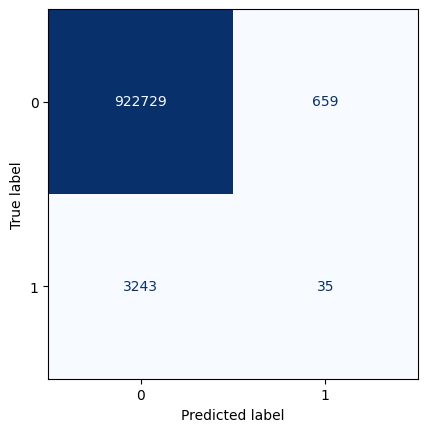

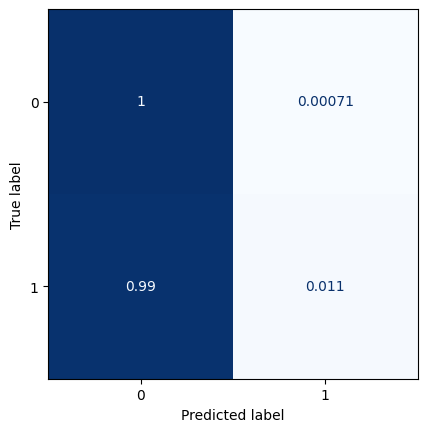

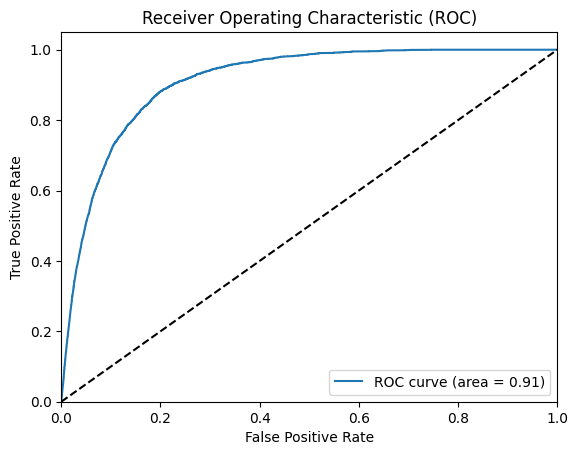

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.003462804999521739
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_49 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_16 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_50 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:16:53.000839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0524

2023-06-14 17:16:56.565562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0524 - val_loss: 0.0221
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0235 - val_loss: 0.0209
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0200
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0198
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0214 - val_loss: 0.0195
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0209 - val_loss: 0.0202
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0193
E

2023-06-14 17:18:33.548777: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


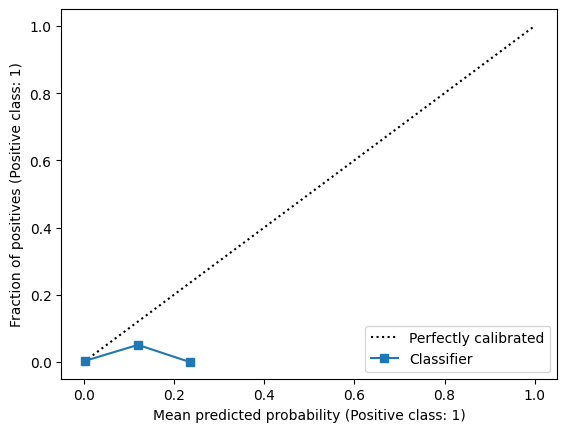

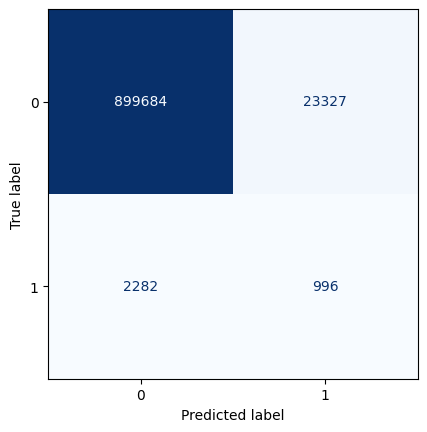

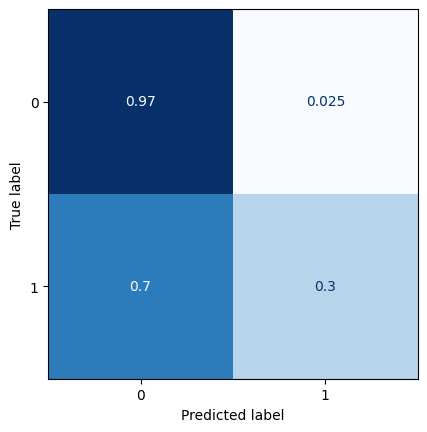

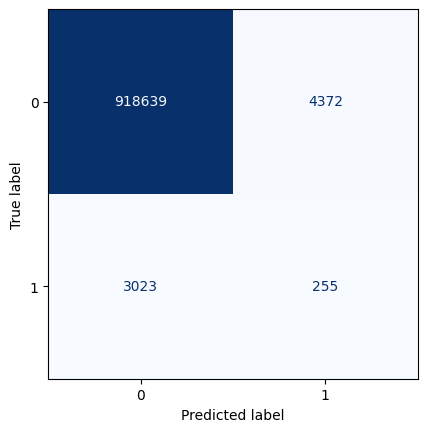

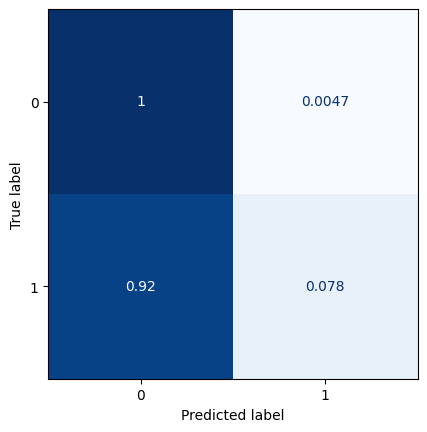

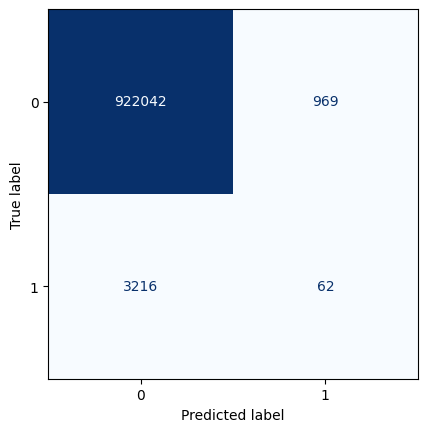

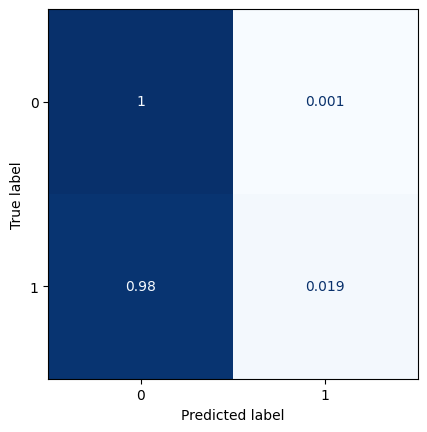

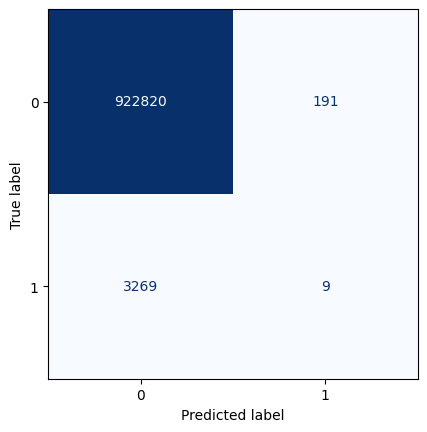

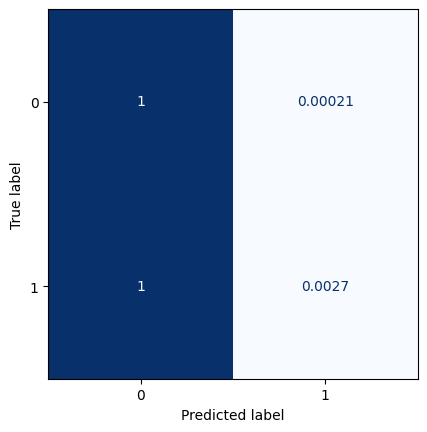

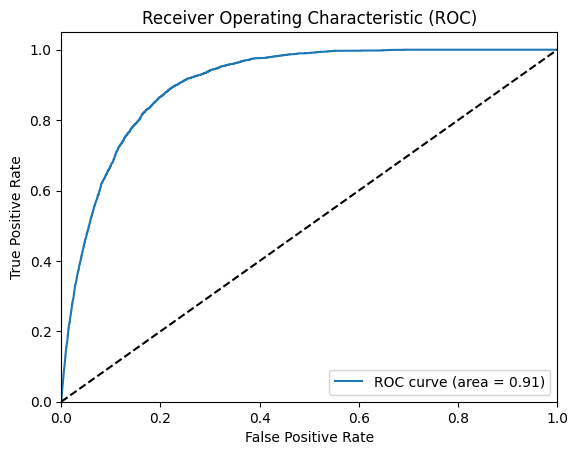

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.0034655819133706744
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_51 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_52 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_17 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_53 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:18:59.353896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0597

2023-06-14 17:19:03.202805: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 11ms/step - loss: 0.0597 - val_loss: 0.0233
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0243 - val_loss: 0.0213
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0228 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0222 - val_loss: 0.0202
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0200
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0217 - val_loss: 0.0198
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0198
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0214 - val_loss: 0.0197
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0197
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0198


2023-06-14 17:20:49.338715: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


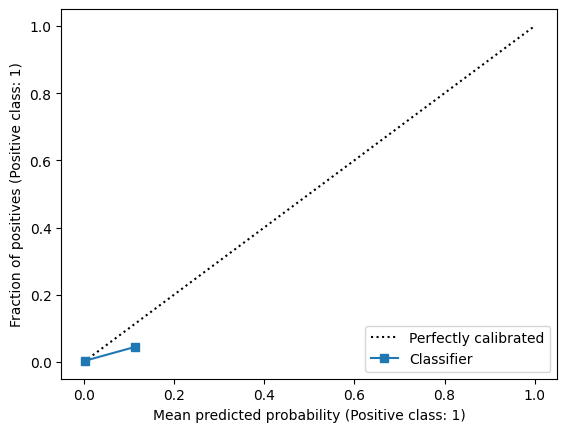

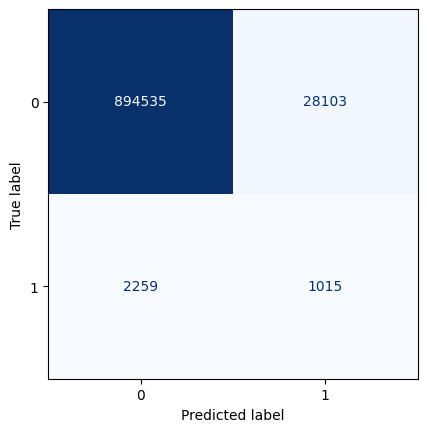

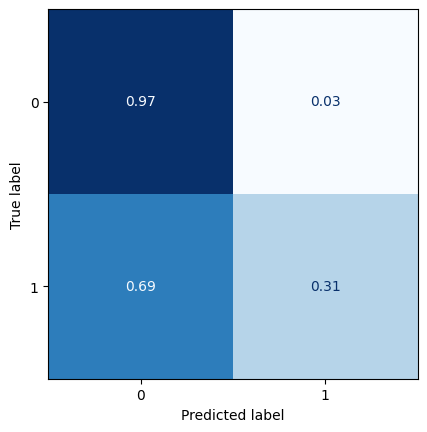

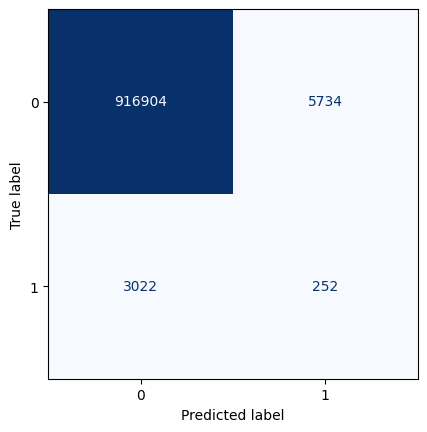

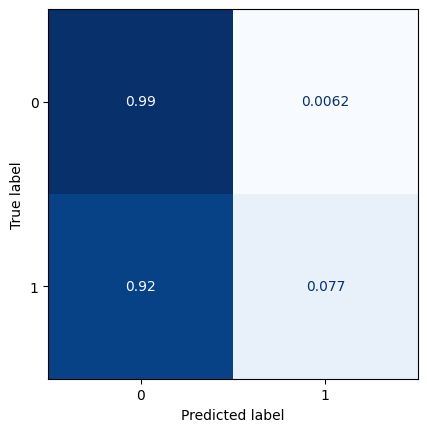

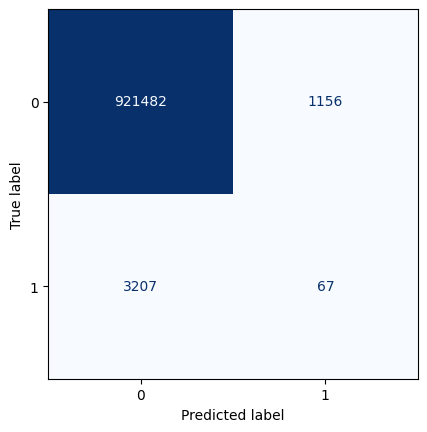

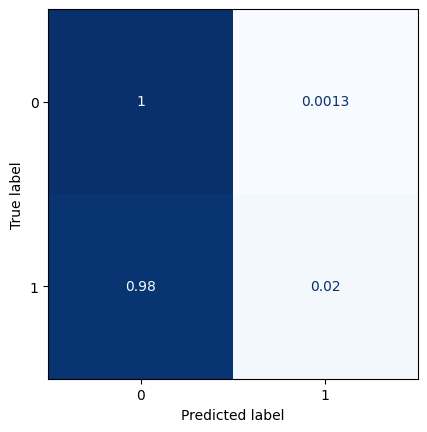

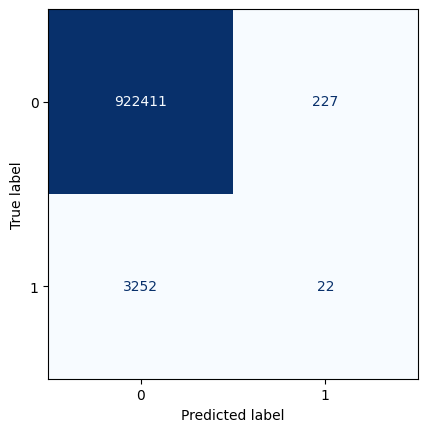

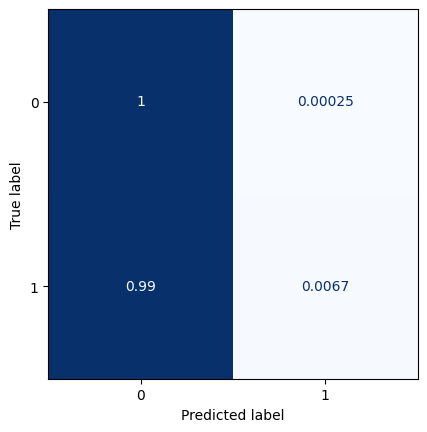

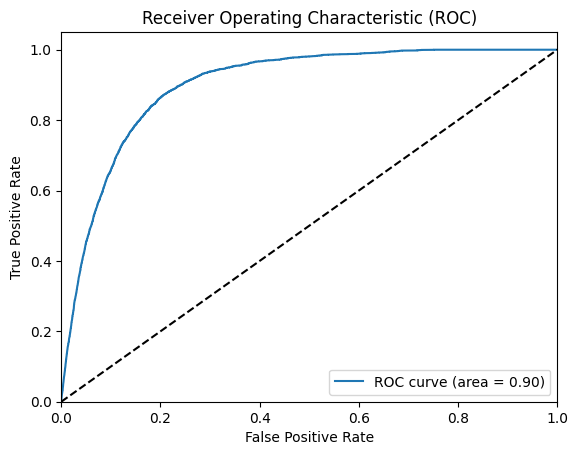

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.0034719261839007217
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_54 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_55 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_18 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_56 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-06-14 17:21:16.721772: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0538

2023-06-14 17:21:20.923383: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0538 - val_loss: 0.0224
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0235 - val_loss: 0.0211
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0226 - val_loss: 0.0207
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0221 - val_loss: 0.0208
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0218 - val_loss: 0.0203
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0204
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0199
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0200
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0211 - val_loss: 0.0198


2023-06-14 17:23:16.772429: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


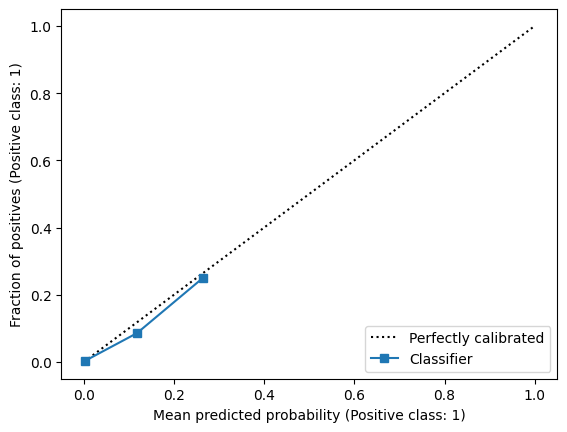

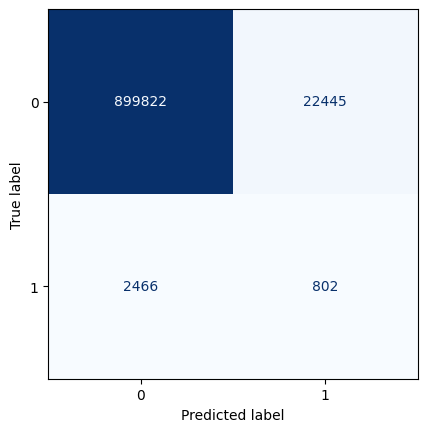

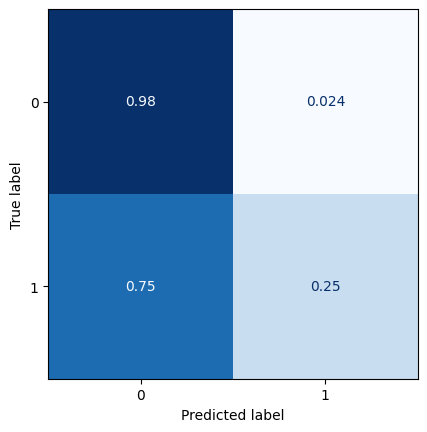

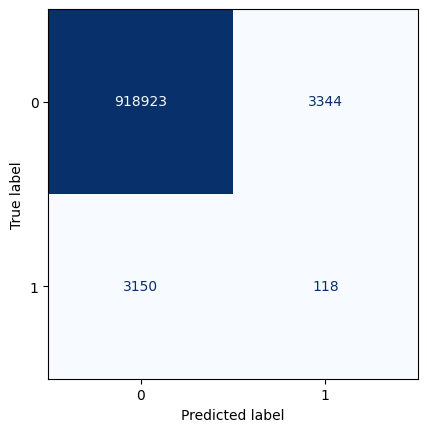

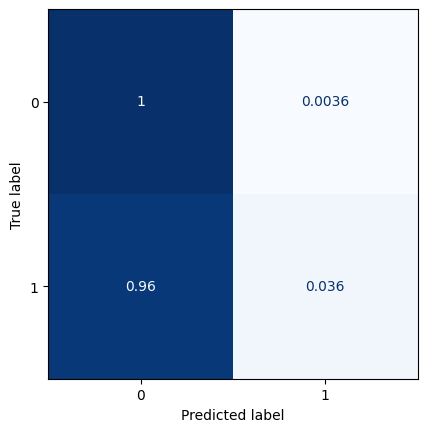

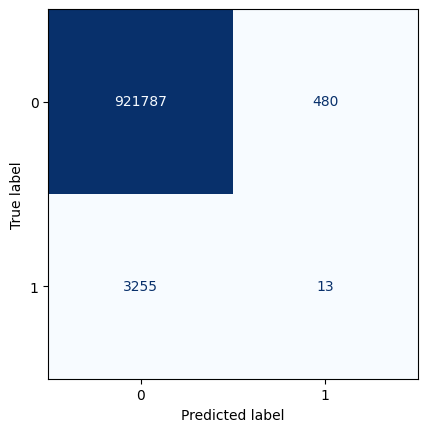

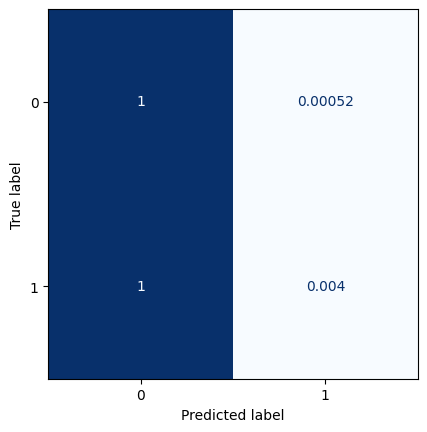

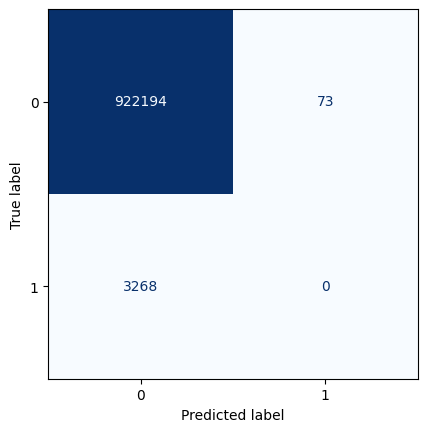

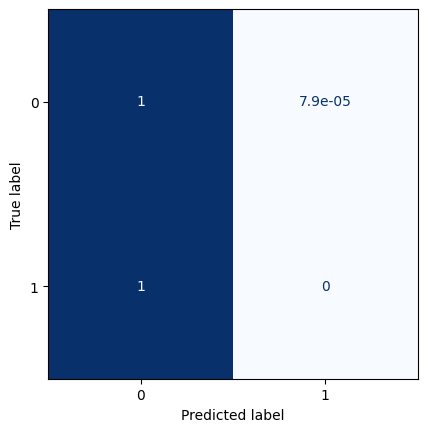

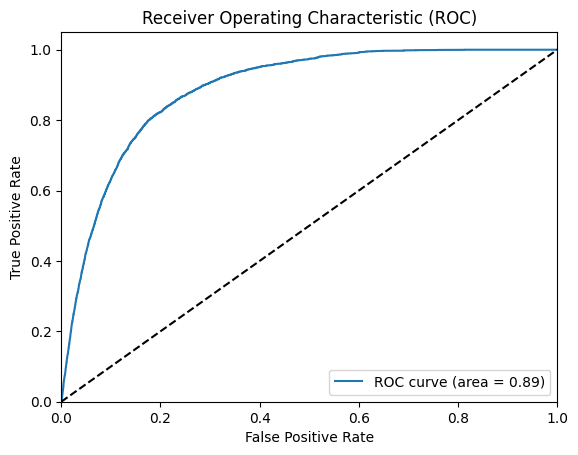

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.0034751563195108462
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_57 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_58 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_19 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_59 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-06-14 17:23:43.091547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0631

2023-06-14 17:23:46.372448: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0631 - val_loss: 0.0240
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0242 - val_loss: 0.0218
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0229 - val_loss: 0.0212
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0224 - val_loss: 0.0209
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0220 - val_loss: 0.0206
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0219 - val_loss: 0.0204
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0217 - val_loss: 0.0202
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0200
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0214 - val_loss: 0.0202
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0213 - val_loss: 0.0200
E

2023-06-14 17:25:24.221251: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


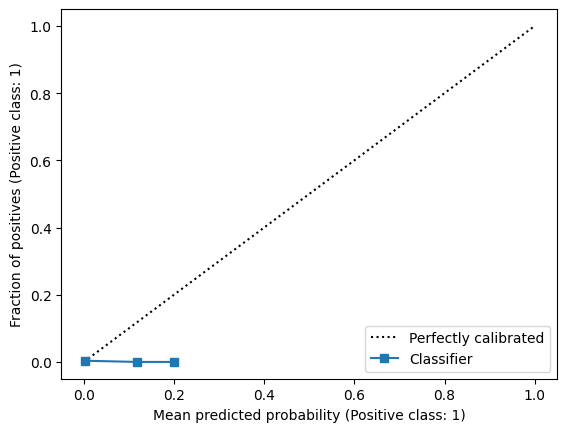

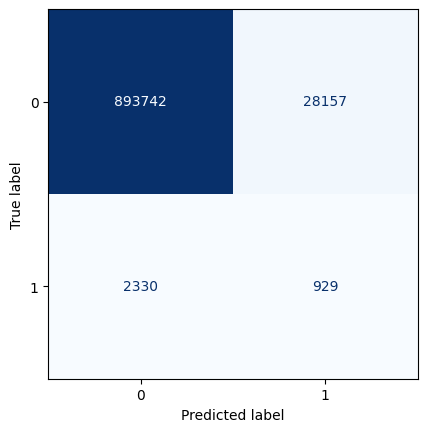

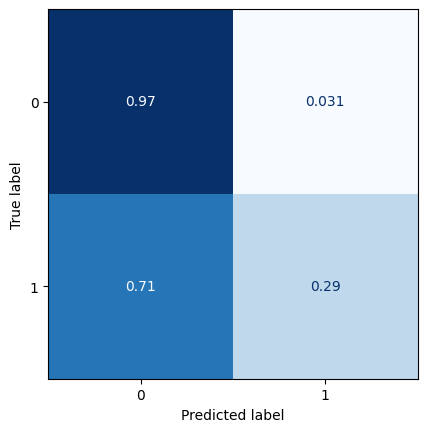

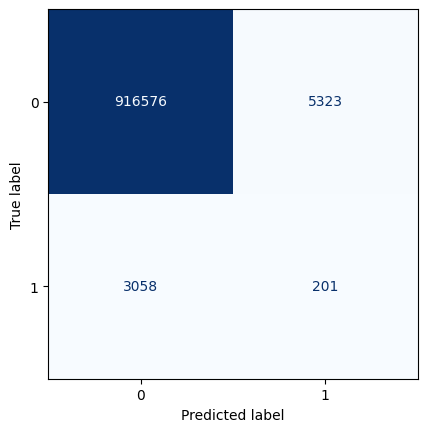

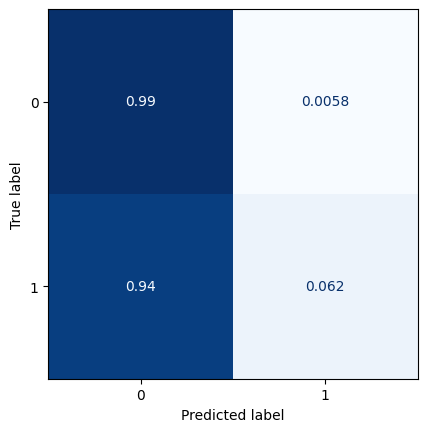

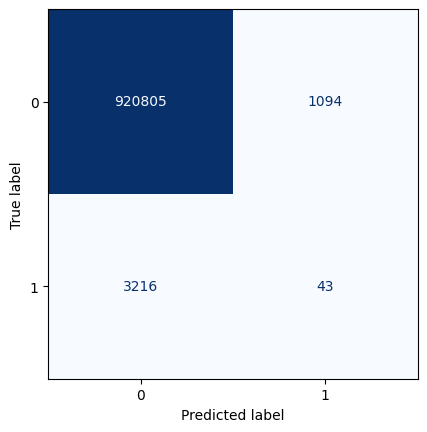

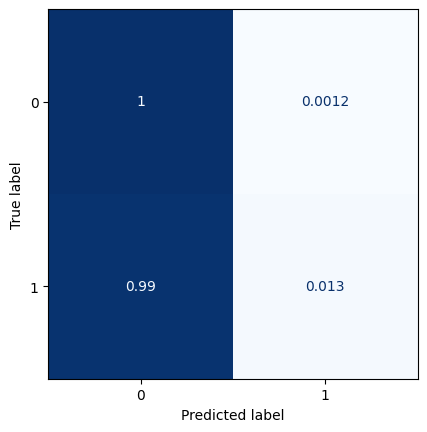

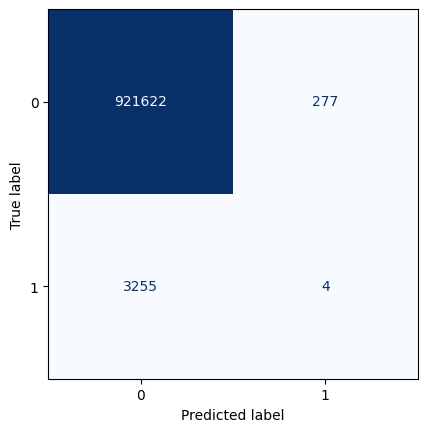

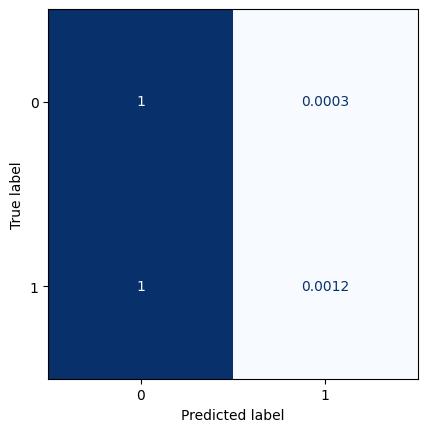

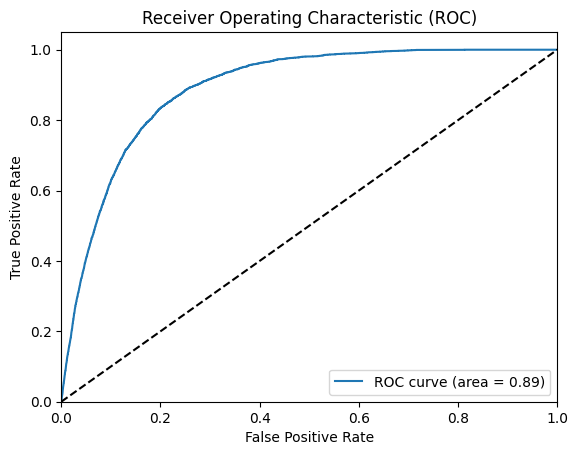

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.0034712219086233983
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_61 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_20 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_62 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-14 17:25:50.463607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0485

2023-06-14 17:25:55.066062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 13ms/step - loss: 0.0485 - val_loss: 0.0235
Epoch 2/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0241 - val_loss: 0.0217
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0228 - val_loss: 0.0211
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0209
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0204
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0208
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0203
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0200
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0204

2023-06-14 17:27:23.233229: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


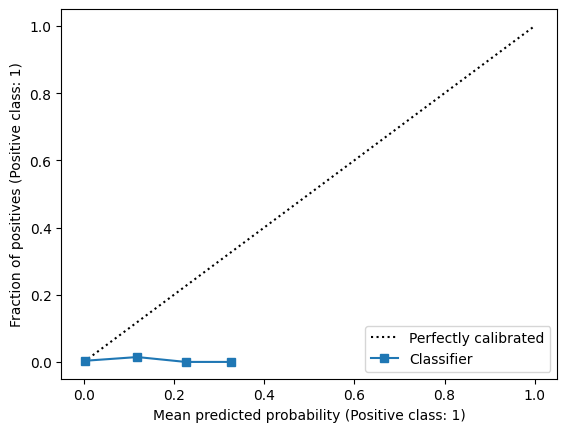

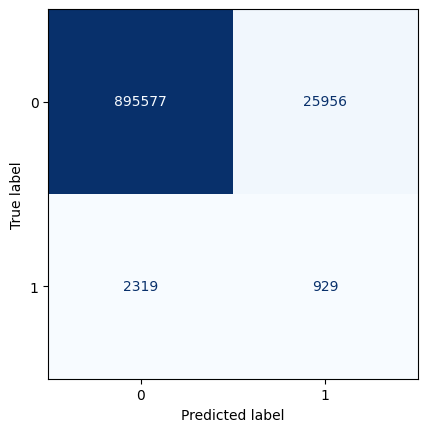

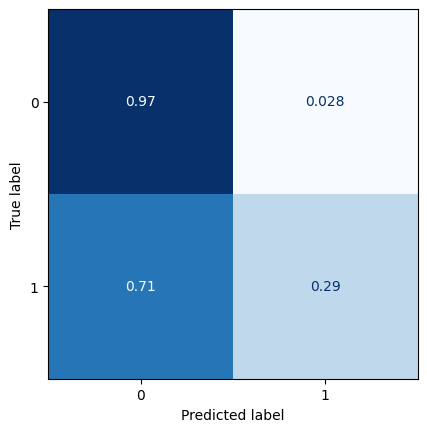

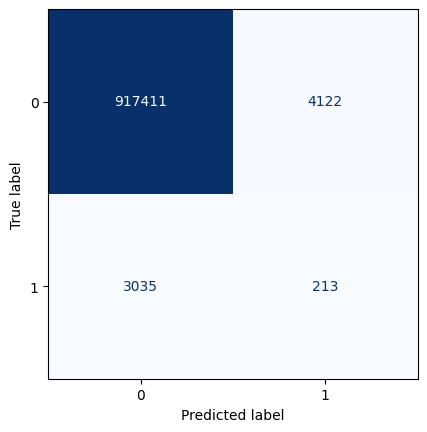

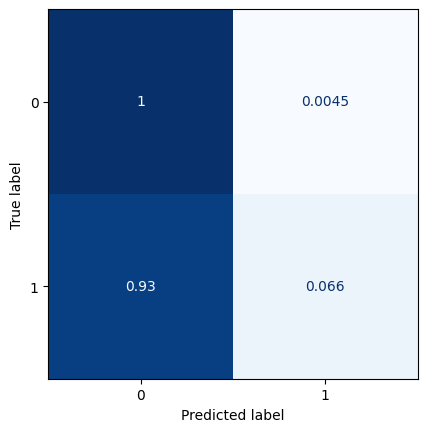

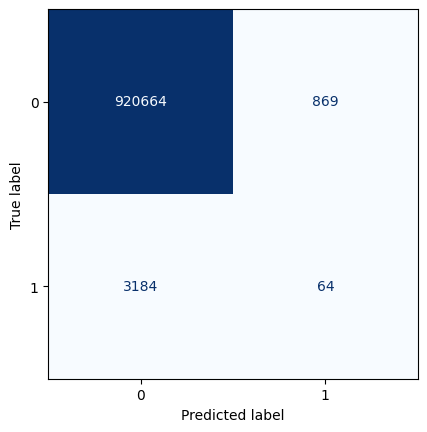

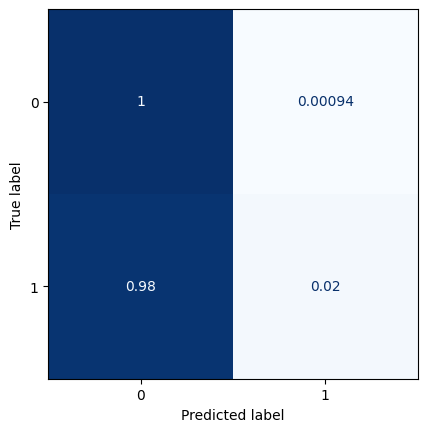

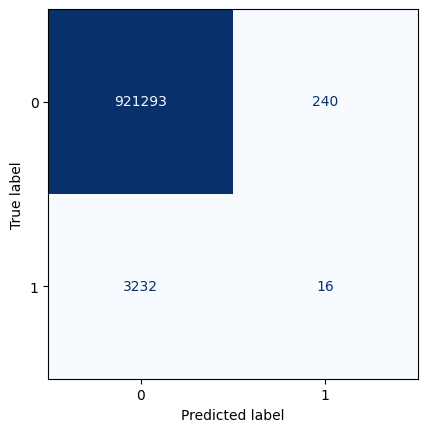

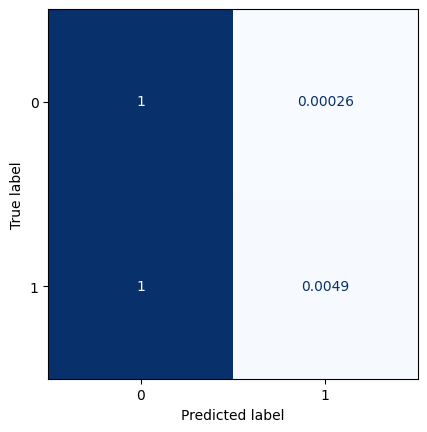

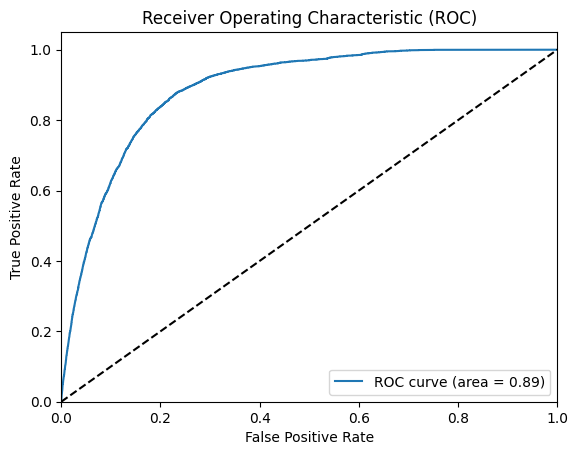

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.0034509301295339383
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_63 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_64 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_21 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_65 (Conv2D)          (None, 14, 30, 1)         73        
                                 

2023-06-14 17:27:53.444559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0577

2023-06-14 17:27:56.995344: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0577 - val_loss: 0.0236
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0240 - val_loss: 0.0219
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0230 - val_loss: 0.0217
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0225 - val_loss: 0.0210
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0222 - val_loss: 0.0209
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0219 - val_loss: 0.0205
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0218 - val_loss: 0.0204
Epoch 8/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0216 - val_loss: 0.0206
Epoch 9/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0204
Epoch 10/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0215 - val_loss: 0.0203


2023-06-14 17:29:30.379265: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


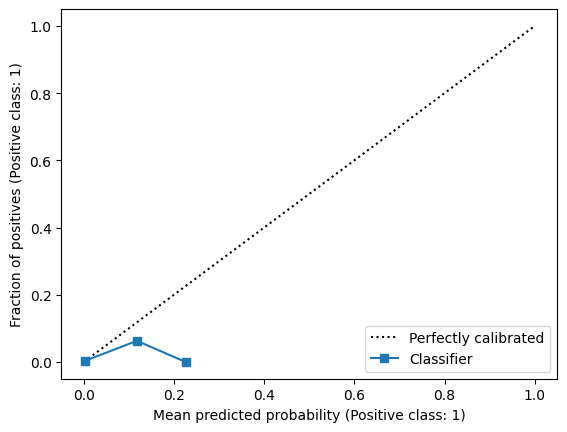

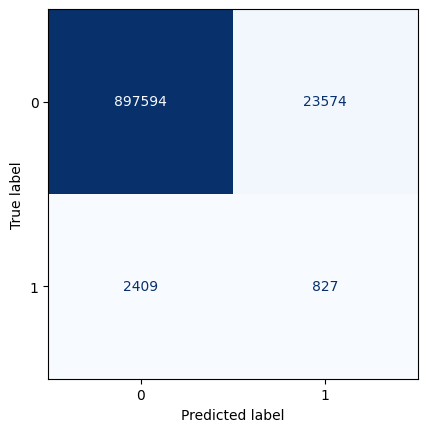

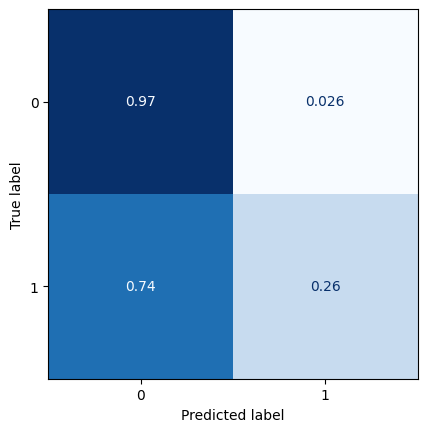

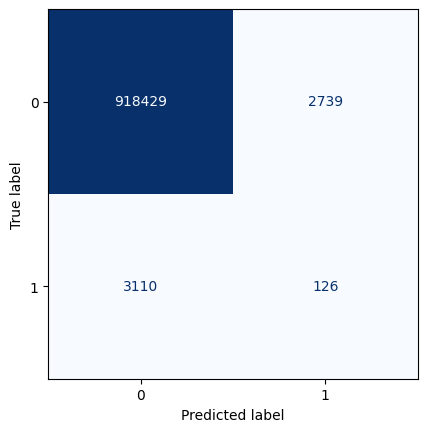

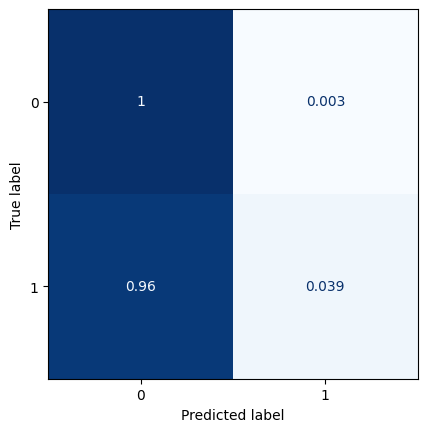

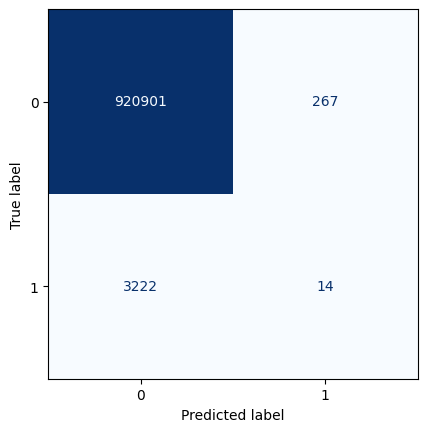

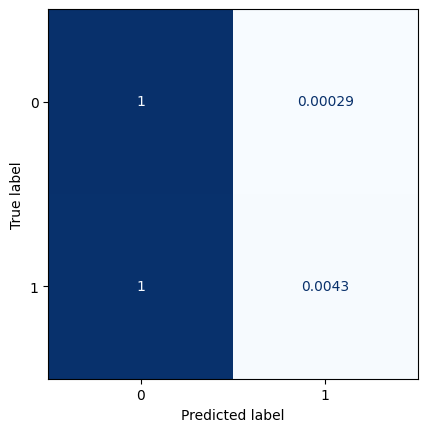

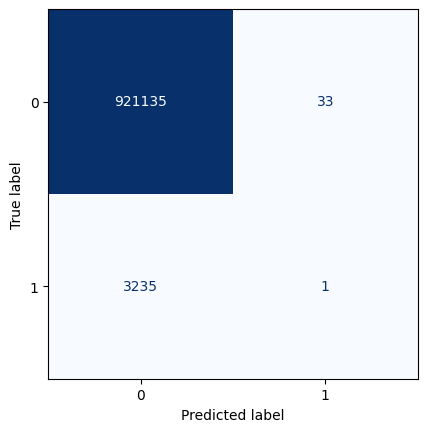

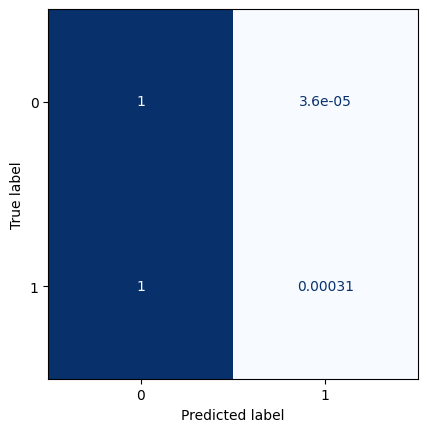

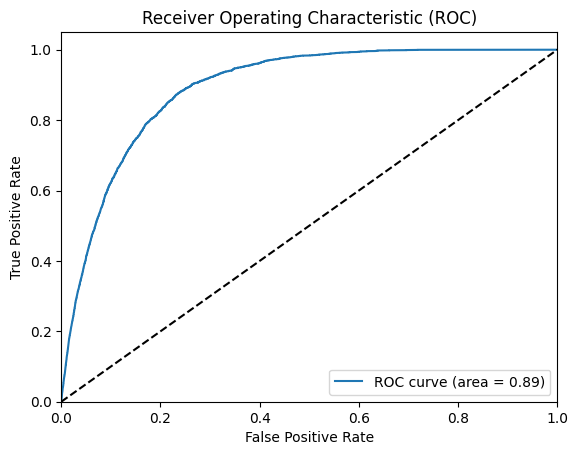

All zeros Brier score: 0.003500633921964855
Model Brier score: 0.00344216042164901


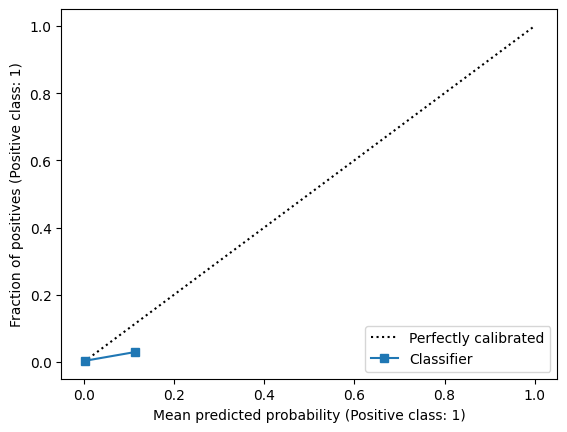

In [65]:
for lag in [1,2,3,4,5,6,7,8,9,10,11,12,13]:
    ### Model summary
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 18)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)
    
    ### Model training
    model.fit(train_img_std_2[:-lag], y_train_img[lag+1:], validation_data=(val_img_std_2[:-lag],y_val_img[lag+1:]),
        callbacks=[monitor],epochs=100)
    
    ### Confusion matrices
    t = model.predict(test_img_std_2[:-lag])

    ranges = [0.025,0.05,0.075,0.1]
    
    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag+1:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag+1:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    
    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag+1:].reshape(-1,1))
    
    z0 = np.zeros((1,13,29,1))
    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((z0,t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    test.to_csv("test_with_newTarget_predictions_2days.csv")
    
    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag+1:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag+1:].reshape(-1,1), np.zeros(len(y_test_img[lag+1:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag+1:].reshape(-1,1), t.reshape(-1,1))}')
    

## Model last four days features

In [66]:
train_img_std_4 = np.concatenate((train_img_std[:-3],train_img_std[1:-2],train_img_std[2:-1],train_img_std[3:]),axis=3)
val_img_std_4 = np.concatenate((val_img_std[:-3],val_img_std[1:-2],val_img_std[2:-1],val_img_std[3:]),axis=3)
test_img_std_4 = np.concatenate((test_img_std[:-3],test_img_std[1:-2],test_img_std[2:-1],test_img_std[3:]),axis=3)


In [68]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 36)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_67 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_22 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_22 (Cropping2D)  (None, 13, 29, 1)       

In [69]:
model.fit(train_img_std_4, y_train_img[3:], validation_data=(val_img_std_4,y_val_img[3:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-06-15 09:15:38.443428: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0374

2023-06-15 09:15:50.599190: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 14s 34ms/step - loss: 0.0374 - val_loss: 0.0125
Epoch 2/100
354/354 [==============================] - 9s 25ms/step - loss: 0.0136 - val_loss: 0.0102
Epoch 3/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0118 - val_loss: 0.0091
Epoch 4/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0109 - val_loss: 0.0085
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0103 - val_loss: 0.0086
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0100 - val_loss: 0.0079
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0097 - val_loss: 0.0079
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0095 - val_loss: 0.0079
Epoch 9/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0093 - val_loss: 0.0078
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0092 - val_loss: 0.0

### Full test evaluation

2023-06-15 09:19:02.103198: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 2s 13ms/step


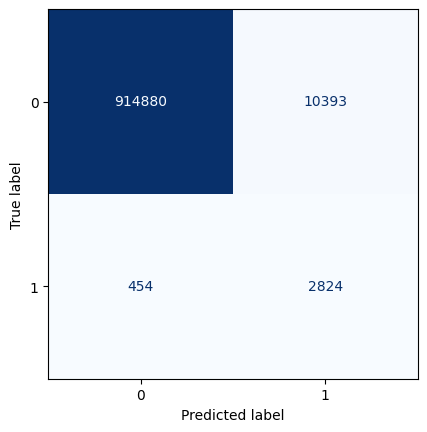

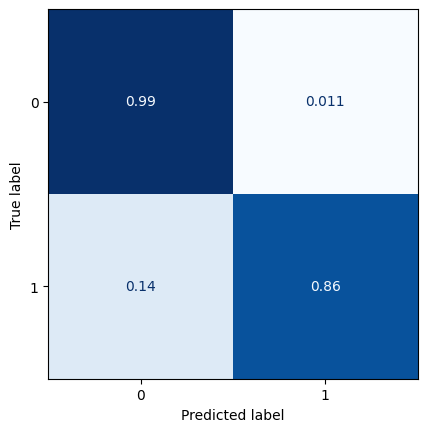

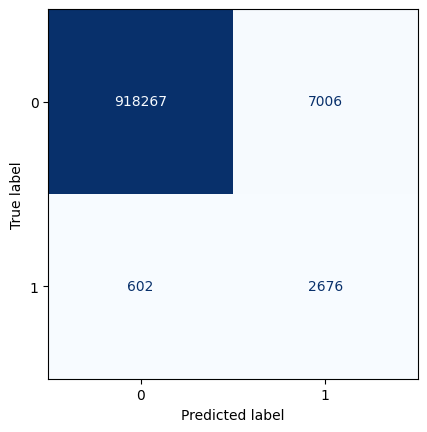

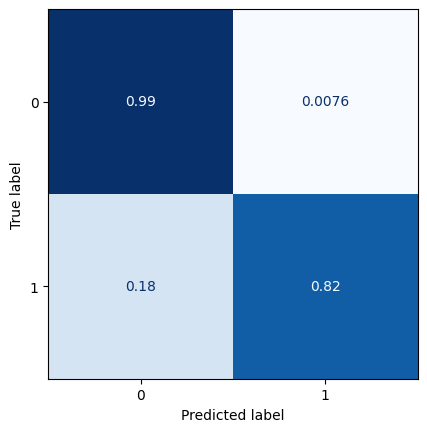

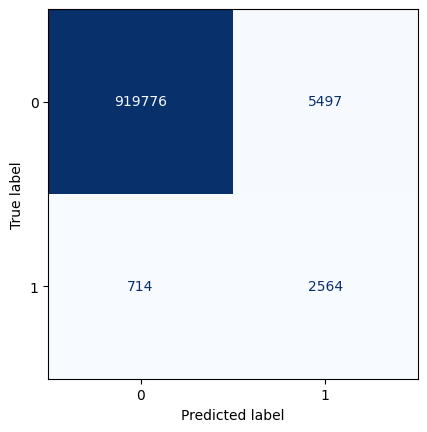

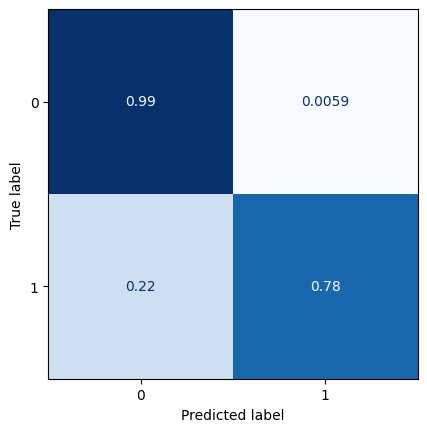

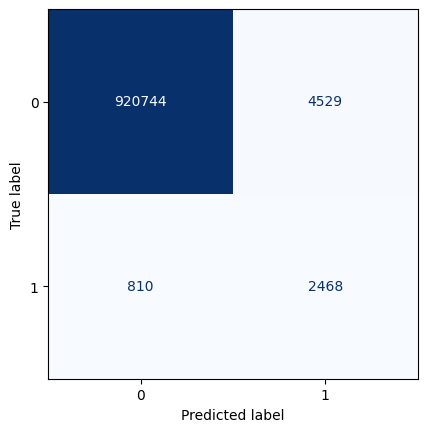

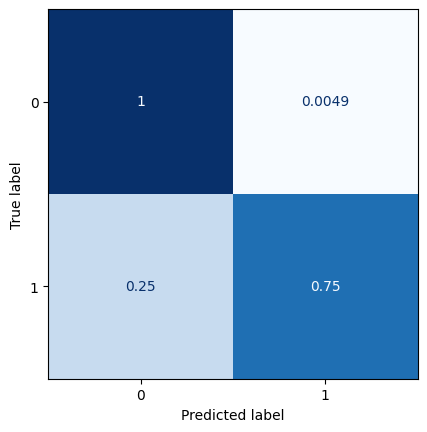

In [70]:
t = model.predict(test_img_std_4)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

# confusion matrix with threshold on 0.1, otherwise always 0 
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[3:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[3:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    

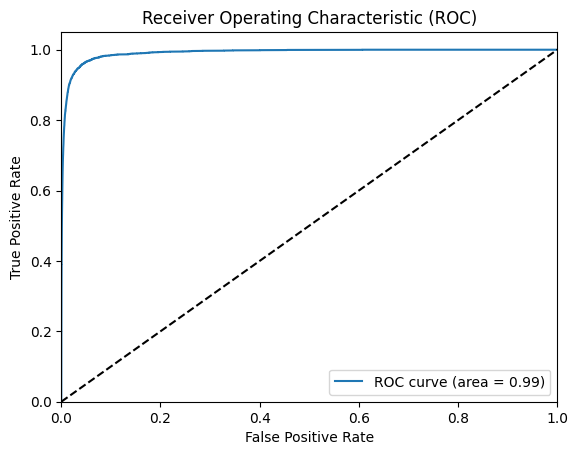

In [71]:
plot_roc(t.reshape(-1,1),y_test_img[3:].reshape(-1,1))

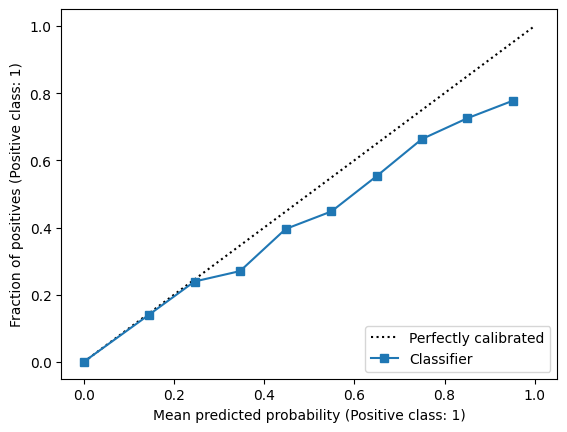

In [72]:
from sklearn.calibration import CalibrationDisplay

display = CalibrationDisplay.from_predictions(y_test_img[3:].reshape(-1,1), t.reshape(-1,1), n_bins=10)


In [73]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette

print(f'All zeros Brier score: {brier_score_loss(y_test_img[3:].reshape(-1,1), np.zeros(len(y_test_img[3:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[3:].reshape(-1,1), t.reshape(-1,1))}')

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.0022399781422878786


In [74]:
z = np.zeros((3,13,29,1))
tt = np.concatenate((z,t))
test['predictions_lag0'] = tt.reshape(-1,1)

In [75]:
test.to_csv("test_with_newTarget_predictions_4days.csv")

## Lags

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_70 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_23 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_71 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_23 (Cropping2D)  (None, 13, 29, 1)       

2023-06-15 09:28:26.452166: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0374

2023-06-15 09:28:32.413107: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 16ms/step - loss: 0.0374 - val_loss: 0.0162
Epoch 2/100
354/354 [==============================] - 5s 13ms/step - loss: 0.0165 - val_loss: 0.0133
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0144 - val_loss: 0.0120
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0135 - val_loss: 0.0115
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0130 - val_loss: 0.0114
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0125 - val_loss: 0.0112
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0122 - val_loss: 0.0106
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0120 - val_loss: 0.0103
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0118 - val_loss: 0.0107
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0117 - val_loss: 0.0106

2023-06-15 09:31:15.436013: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


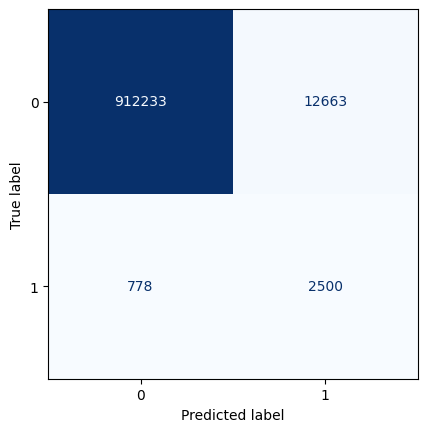

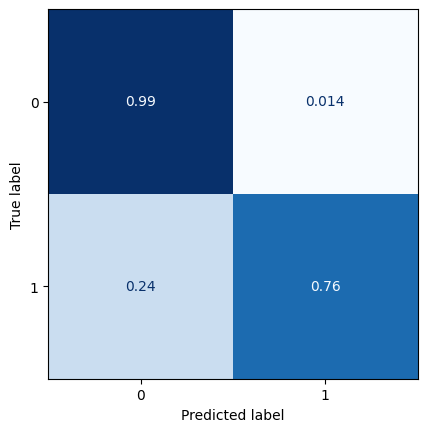

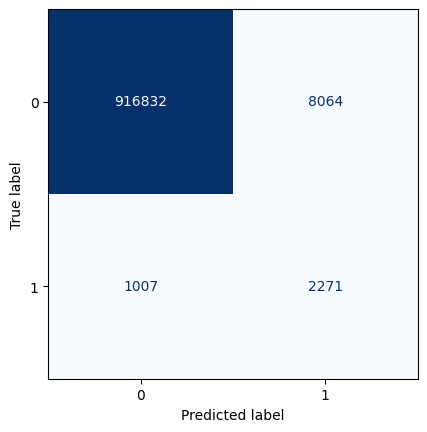

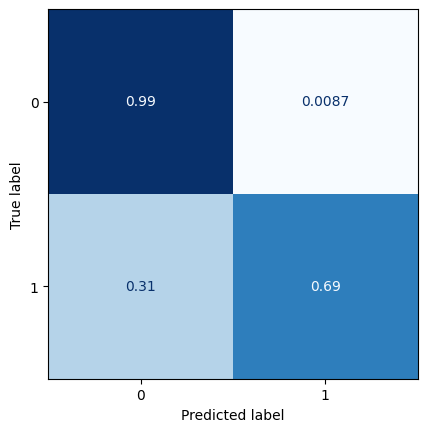

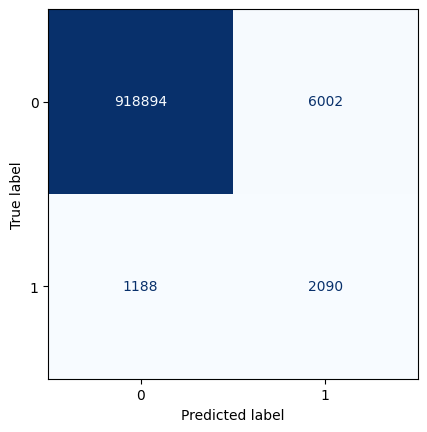

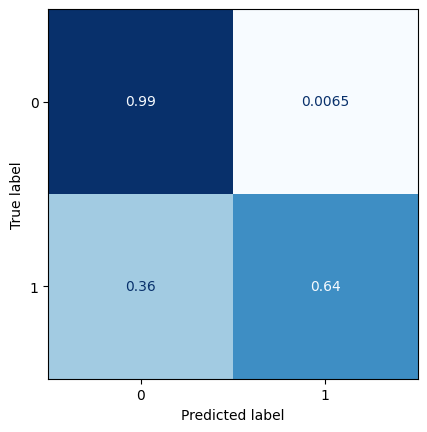

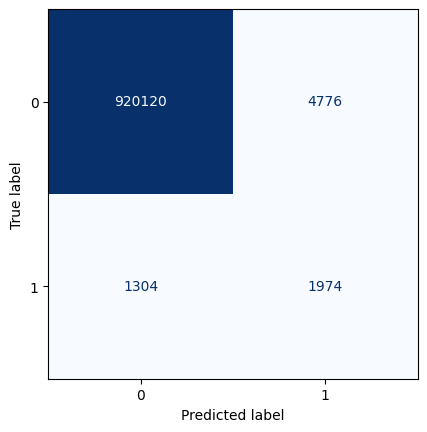

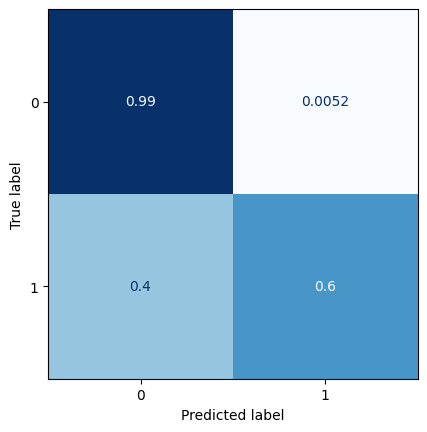

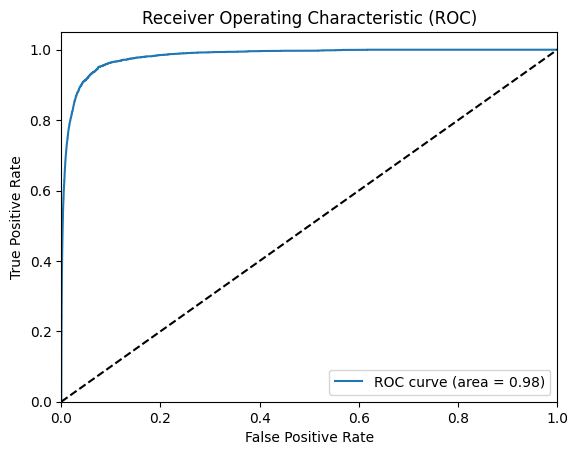

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.002712023963443933
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_73 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_24 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_74 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:31:53.841467: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0401

2023-06-15 09:31:59.500857: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 16ms/step - loss: 0.0401 - val_loss: 0.0185
Epoch 2/100
354/354 [==============================] - 6s 14ms/step - loss: 0.0193 - val_loss: 0.0164
Epoch 3/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0178 - val_loss: 0.0163
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0169 - val_loss: 0.0157
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0163 - val_loss: 0.0154
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0160 - val_loss: 0.0158
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0156 - val_loss: 0.0152
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0154 - val_loss: 0.0148
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0152 - val_loss: 0.0155
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0150 - val_loss: 0.014

2023-06-15 09:34:50.763469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


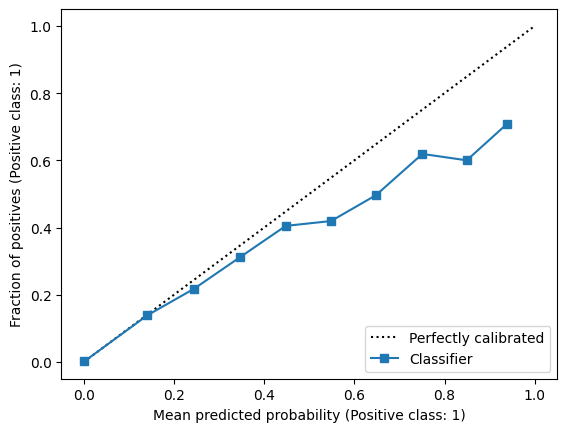

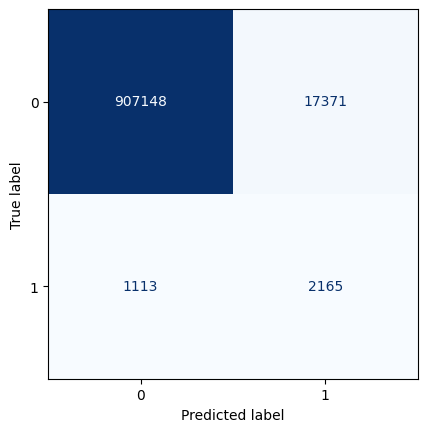

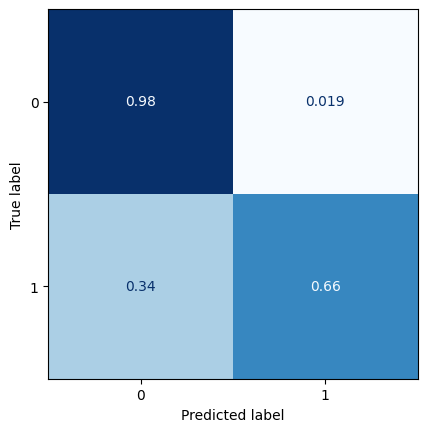

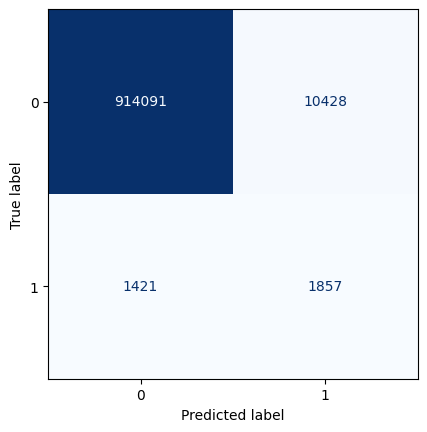

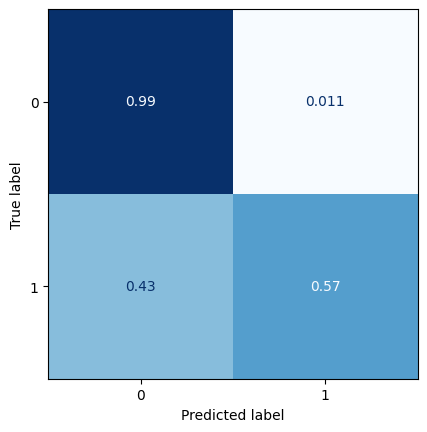

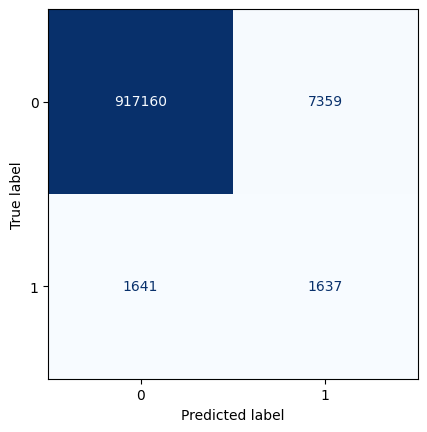

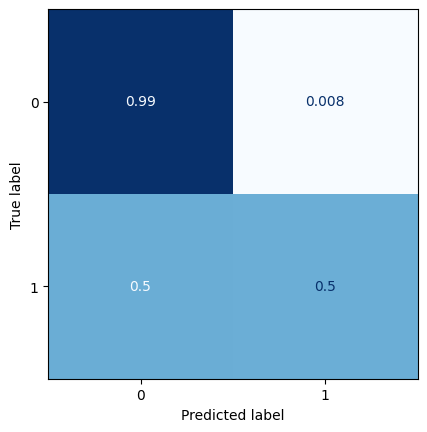

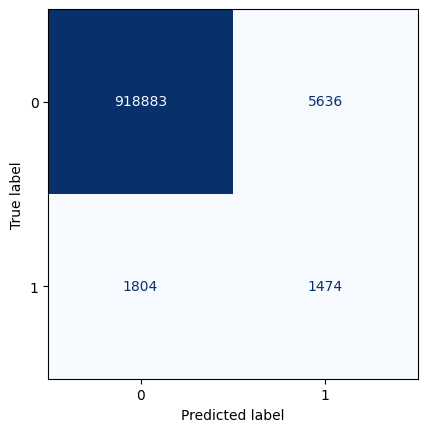

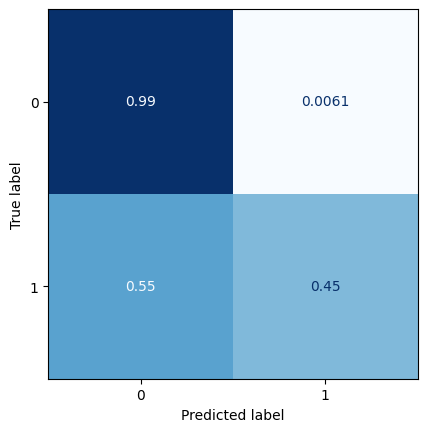

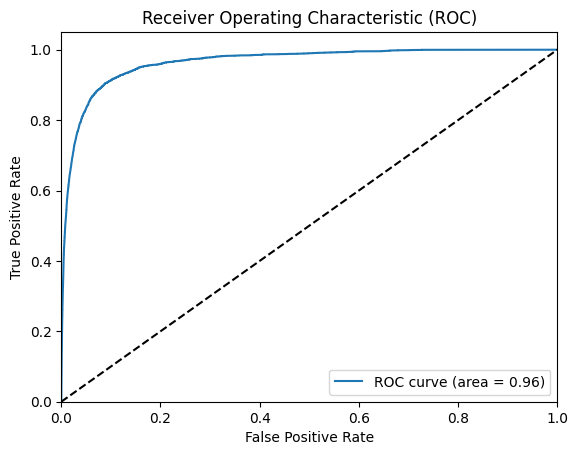

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.003128497601238571
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_76 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_25 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_77 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:35:31.143803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0684

2023-06-15 09:35:35.710729: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 13ms/step - loss: 0.0684 - val_loss: 0.0223
Epoch 2/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0230 - val_loss: 0.0196
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0209 - val_loss: 0.0183
Epoch 4/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0197 - val_loss: 0.0173
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0190 - val_loss: 0.0172
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0185 - val_loss: 0.0169
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0183 - val_loss: 0.0169
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0181 - val_loss: 0.0170
Epoch 9/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0178 - val_loss: 0.0169
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0176 - val_loss: 0.016

2023-06-15 09:37:38.831865: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


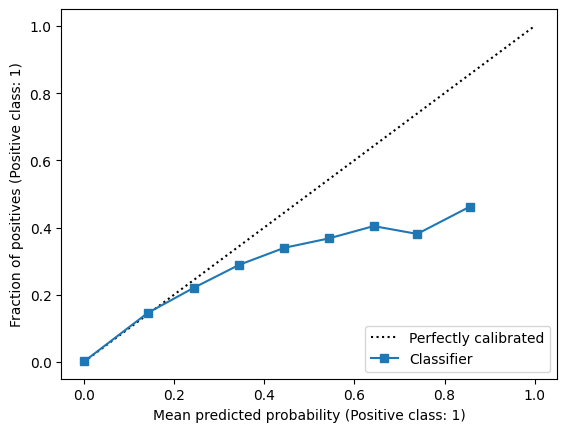

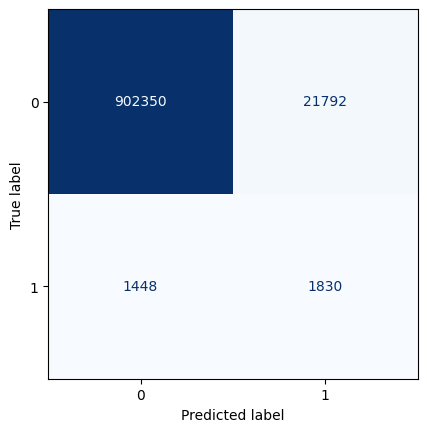

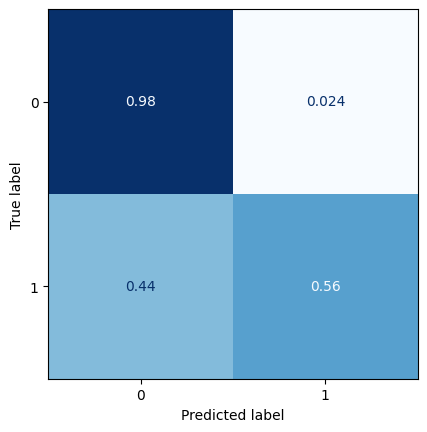

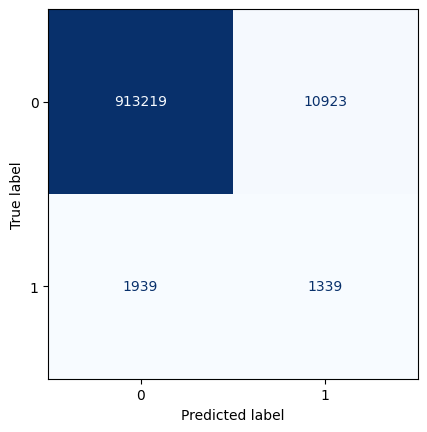

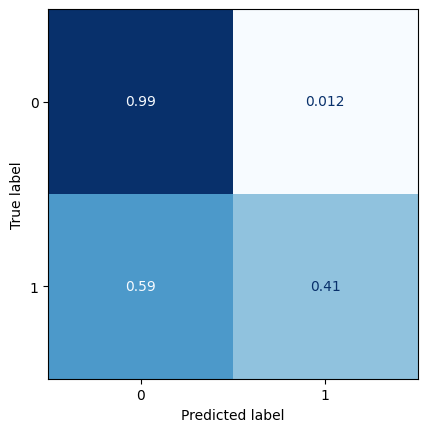

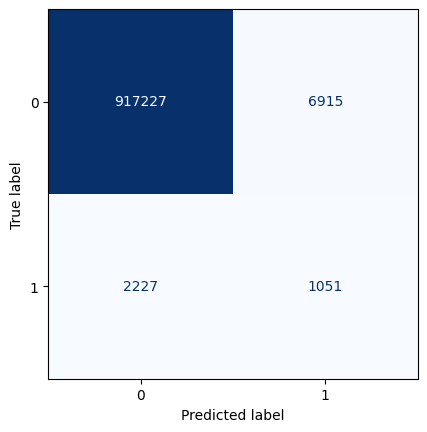

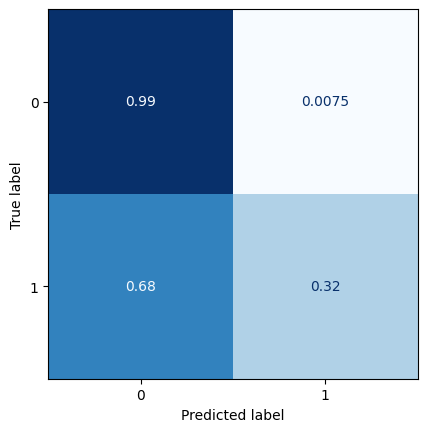

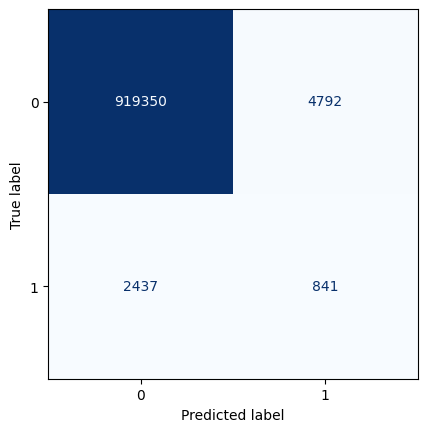

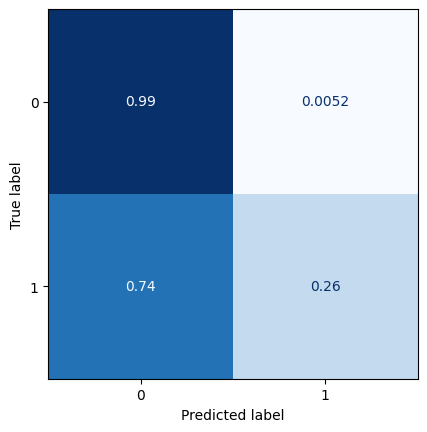

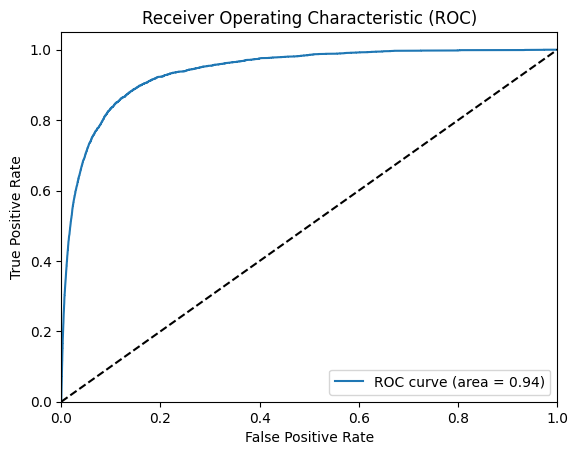

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.003348719246956673
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_26 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_80 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-06-15 09:38:16.538685: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0412

2023-06-15 09:38:21.541954: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 15ms/step - loss: 0.0412 - val_loss: 0.0199
Epoch 2/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0215 - val_loss: 0.0186
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0204 - val_loss: 0.0184
Epoch 4/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0199 - val_loss: 0.0186
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0196 - val_loss: 0.0182
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0194 - val_loss: 0.0180
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0184
Epoch 8/100
354/354 [==============================] - 47s 133ms/step - loss: 0.0190 - val_loss: 0.0179
Epoch 9/100
354/354 [==============================] - 9s 25ms/step - loss: 0.0189 - val_loss: 0.0177
Epoch 10/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0187 - val_loss: 0

2023-06-15 09:41:05.833433: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 6ms/step


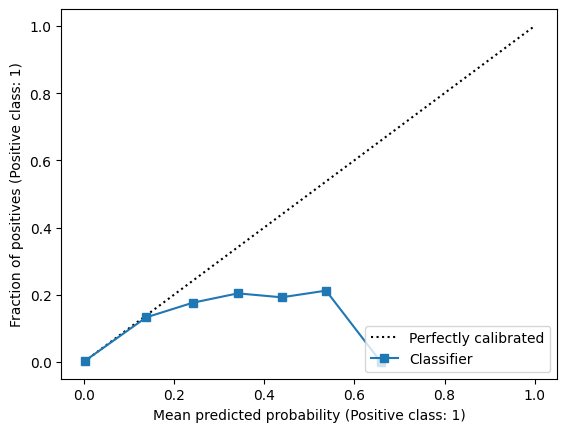

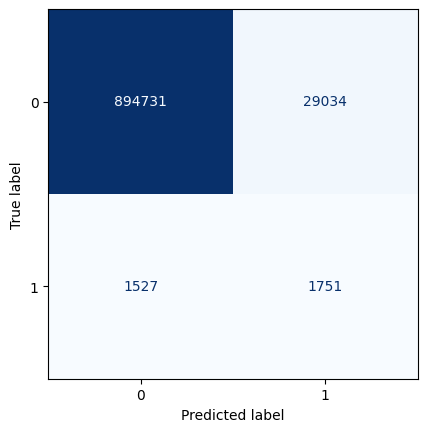

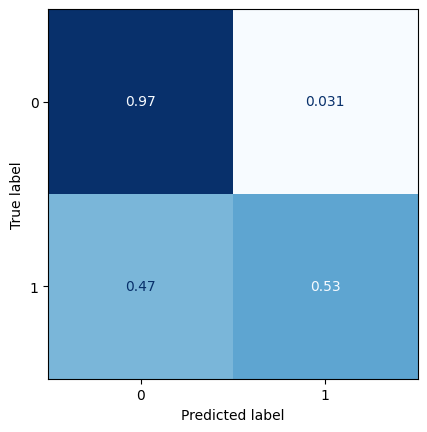

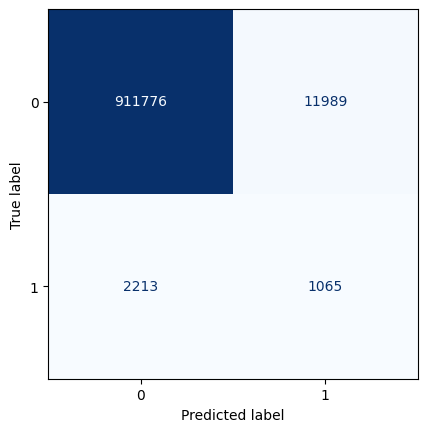

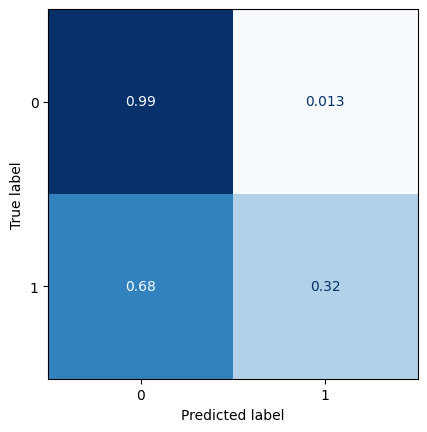

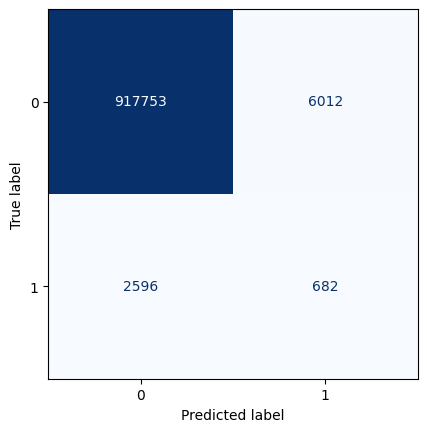

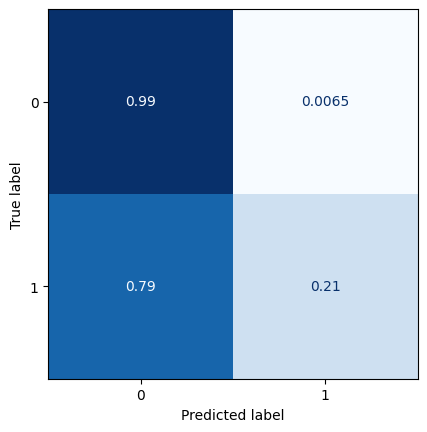

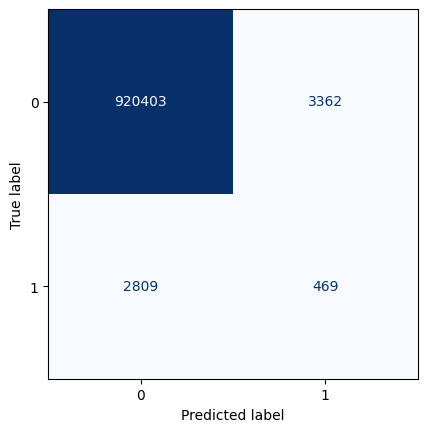

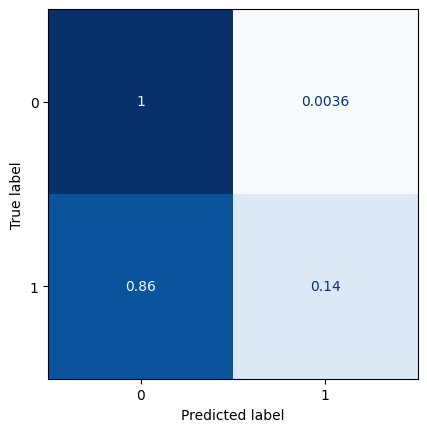

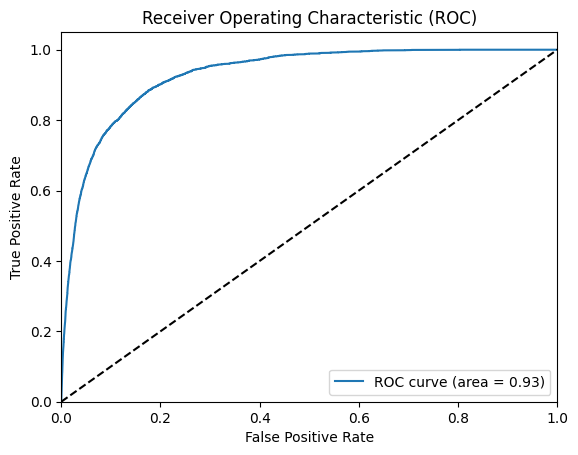

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.0034006506645410145
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_82 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_27 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 14, 30, 1)         73        
                                   

2023-06-15 09:42:12.394882: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0651

2023-06-15 09:42:20.340415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 25s 23ms/step - loss: 0.0651 - val_loss: 0.0215
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0229 - val_loss: 0.0201
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0217 - val_loss: 0.0192
Epoch 4/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0211 - val_loss: 0.0192
Epoch 5/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0207 - val_loss: 0.0188
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0193
Epoch 7/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0203 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0200 - val_loss: 0.0188
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0199 - val_loss: 0.0184
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0

2023-06-15 09:43:45.482836: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 4ms/step


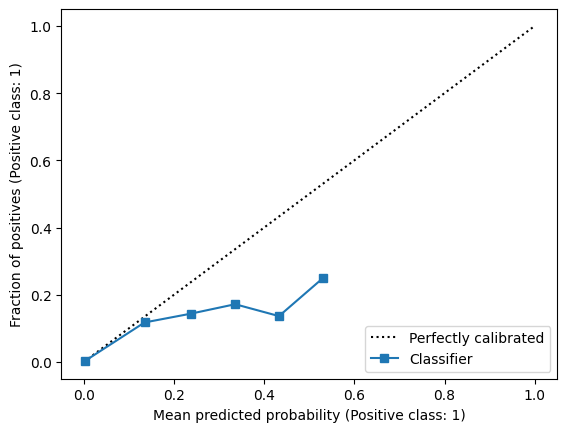

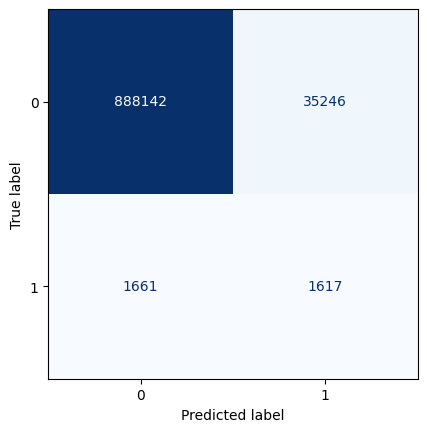

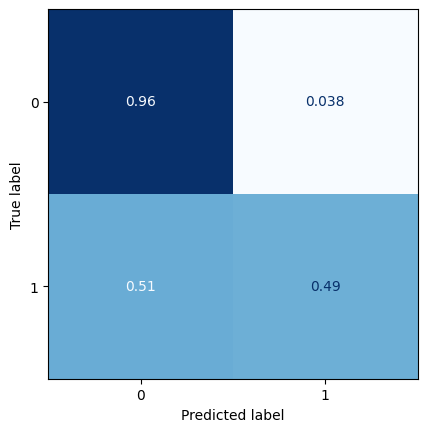

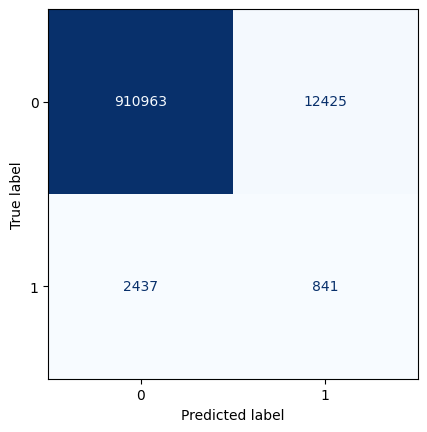

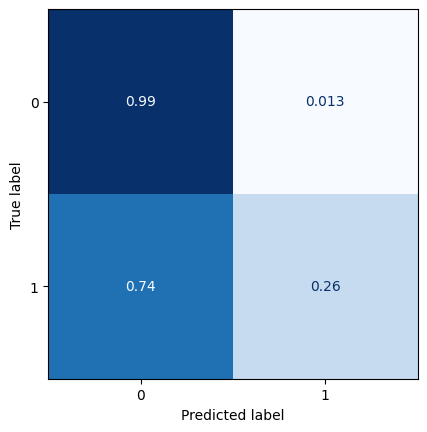

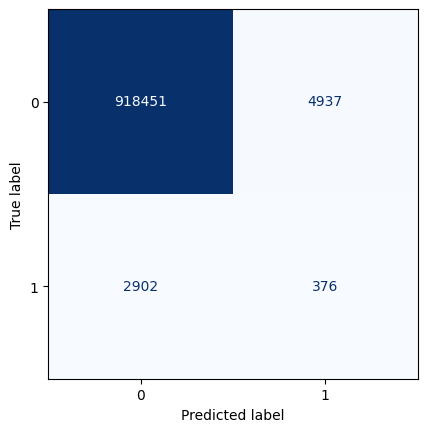

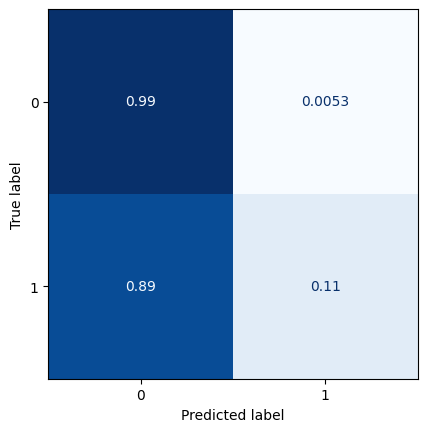

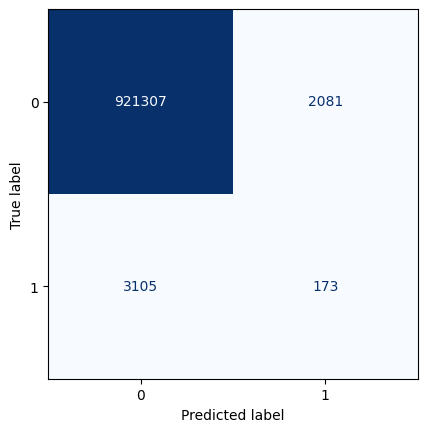

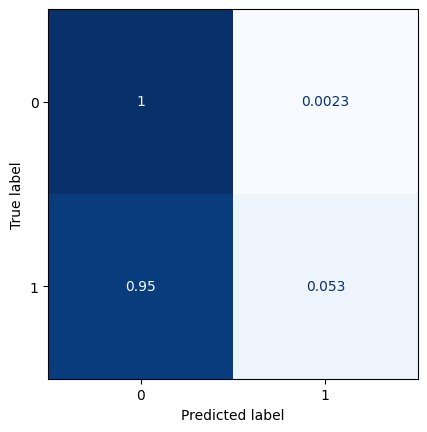

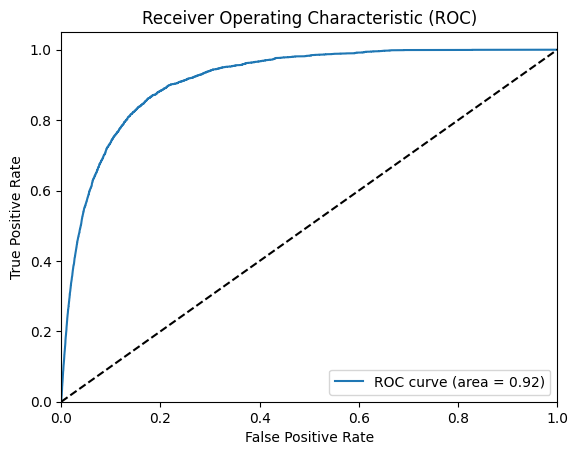

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.003444204516242137
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_85 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_28 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_86 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:44:18.671430: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0402

2023-06-15 09:44:25.445108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 8s 19ms/step - loss: 0.0402 - val_loss: 0.0218
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0233 - val_loss: 0.0204
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0201
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0195
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0193
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0200
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0193
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0192
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0190


2023-06-15 09:45:58.045852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


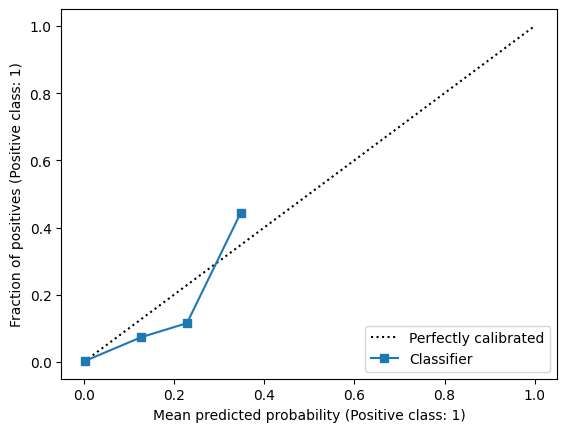

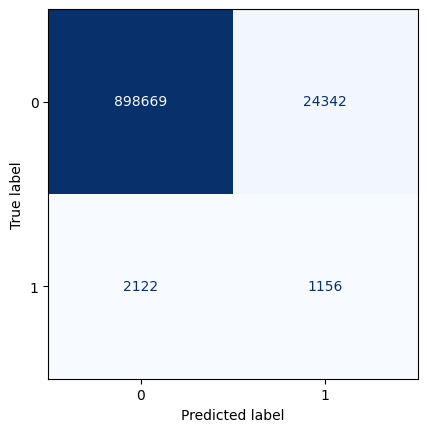

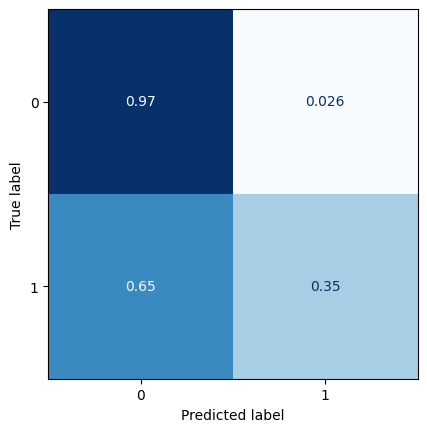

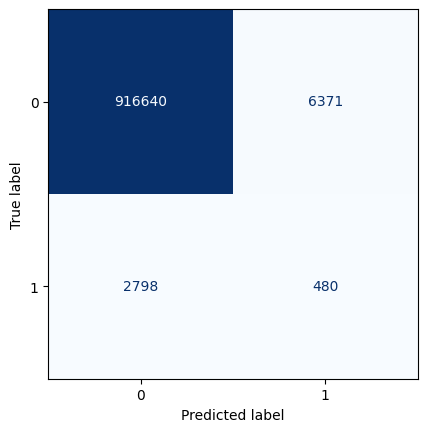

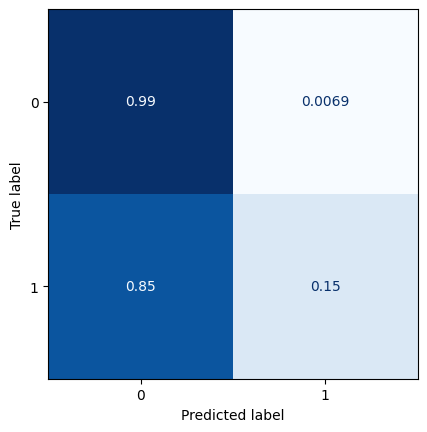

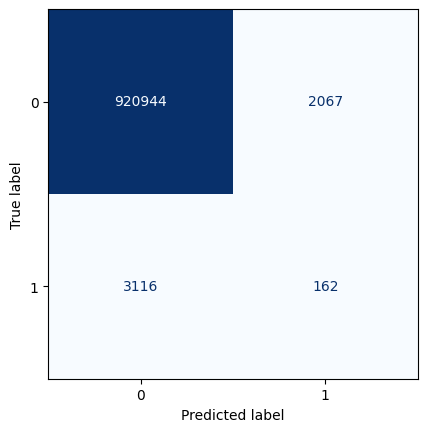

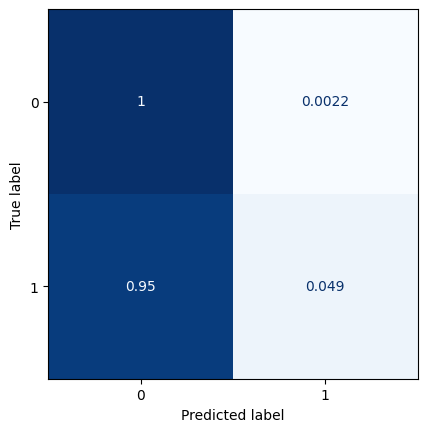

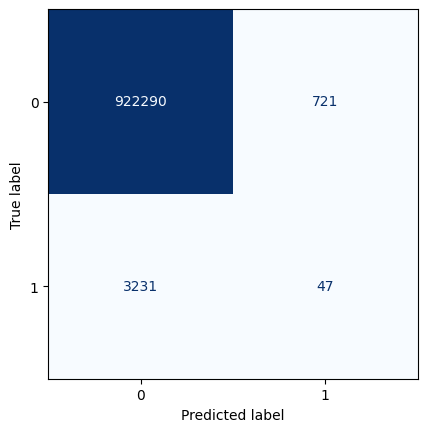

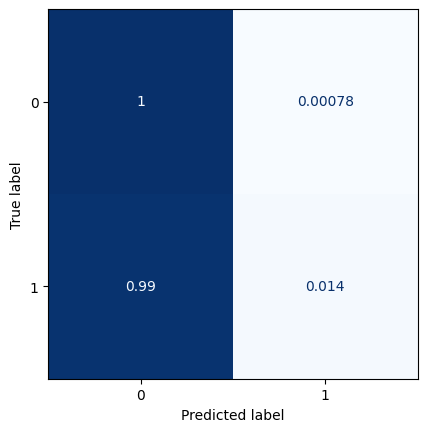

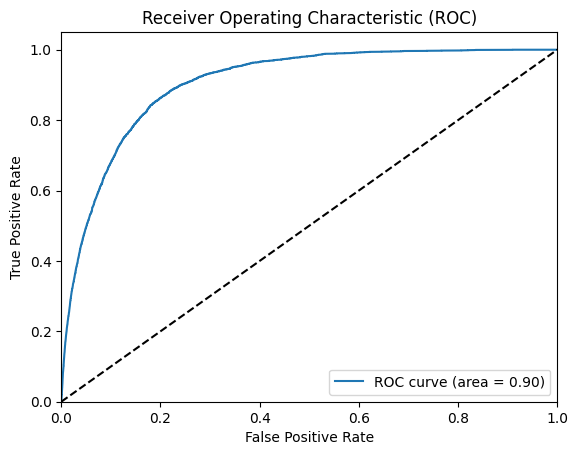

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.00345600442016416
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_87 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_88 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_29 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_89 (Conv2D)          (None, 14, 30, 1)         73        
                                    

2023-06-15 09:46:29.314701: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0449

2023-06-15 09:46:34.954003: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 7s 16ms/step - loss: 0.0449 - val_loss: 0.0214
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0228 - val_loss: 0.0203
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0196
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0195
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0196
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0194
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0206 - val_loss: 0.0195
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0197
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0192


2023-06-15 09:48:22.728128: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


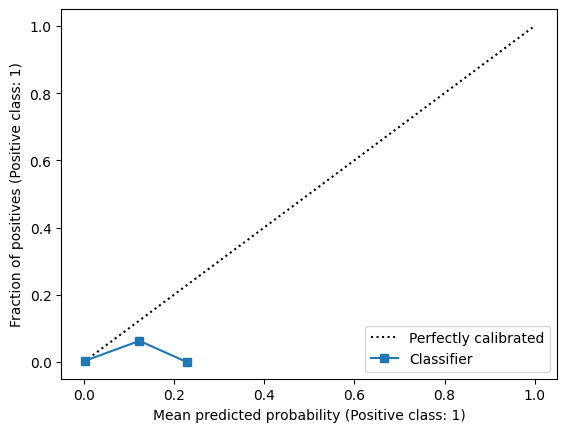

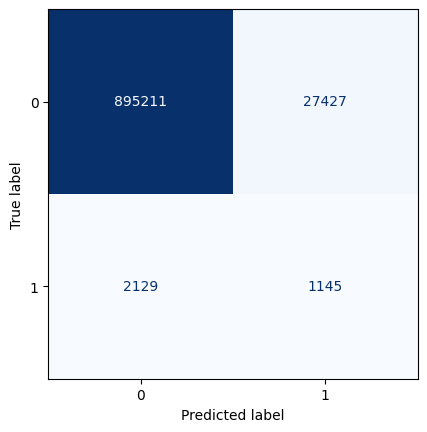

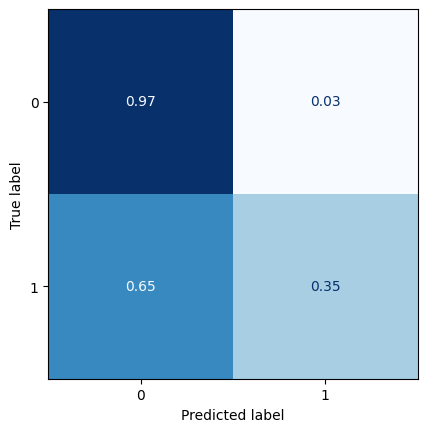

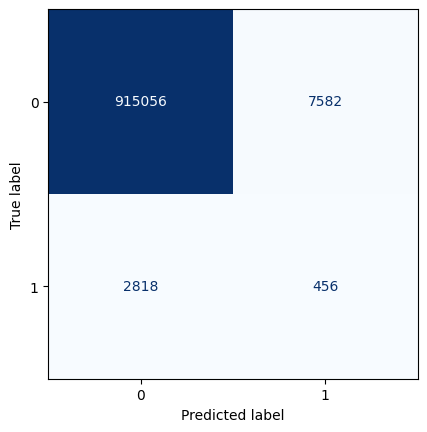

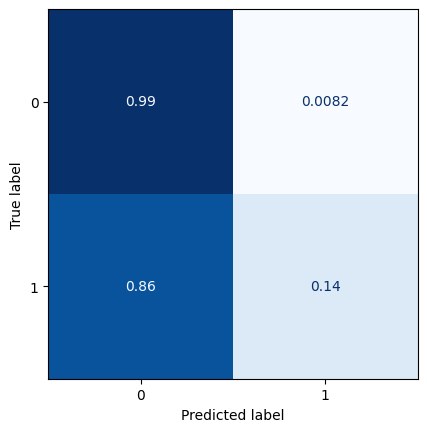

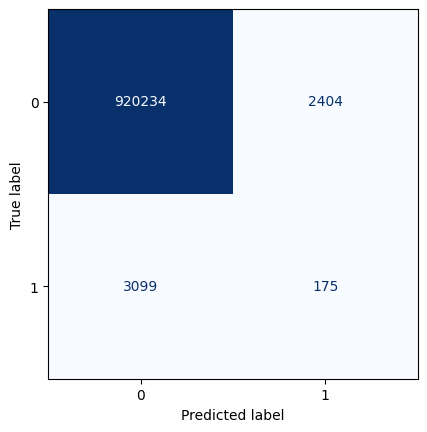

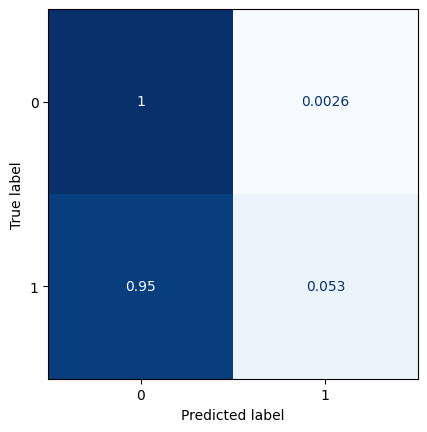

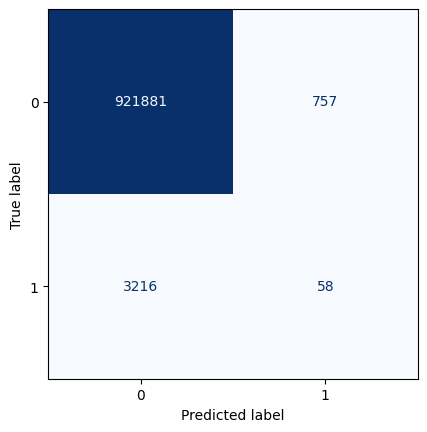

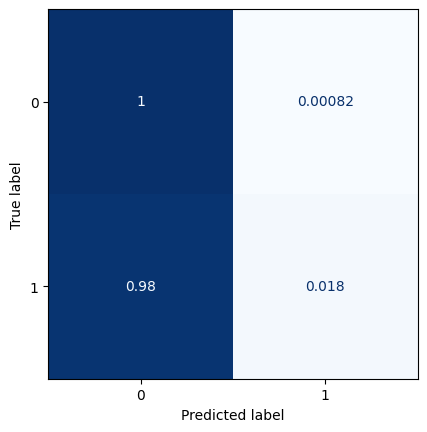

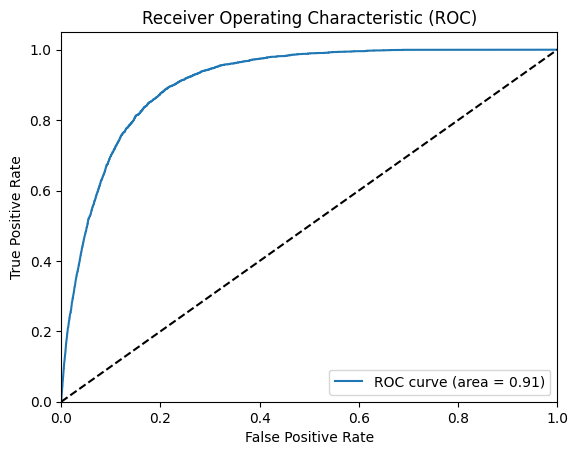

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.003458458158166638
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_90 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_91 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_30 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_92 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:48:58.967830: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0411

2023-06-15 09:49:03.837186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 13ms/step - loss: 0.0411 - val_loss: 0.0222
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0229 - val_loss: 0.0209
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0223 - val_loss: 0.0209
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0209
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0203
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0200
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0198
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0208 - val_loss: 0.0199
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0199
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0197


2023-06-15 09:50:41.497211: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


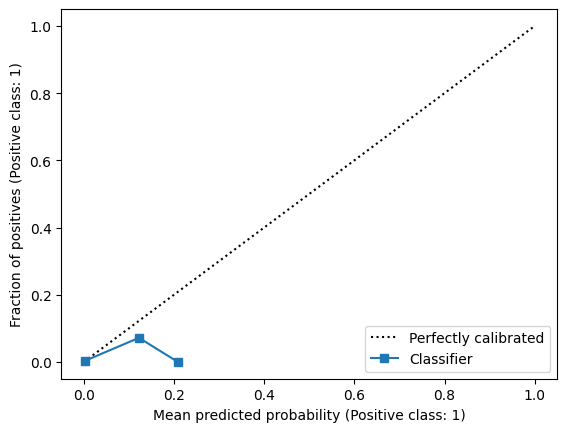

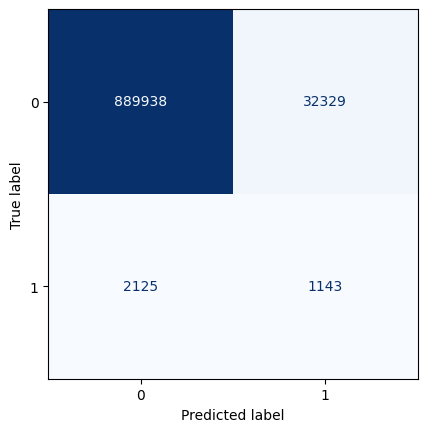

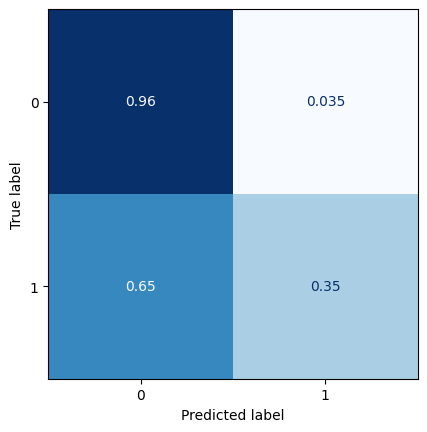

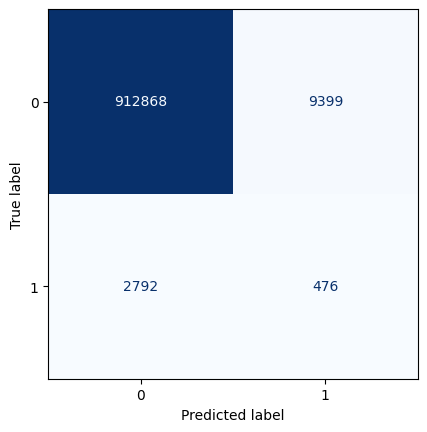

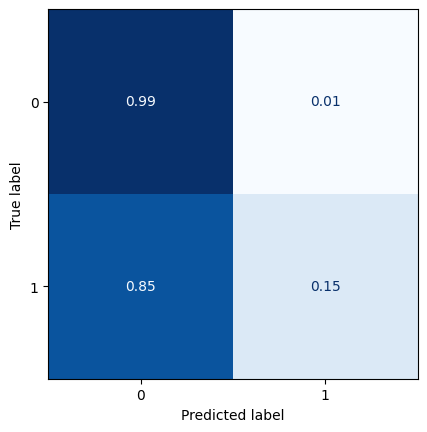

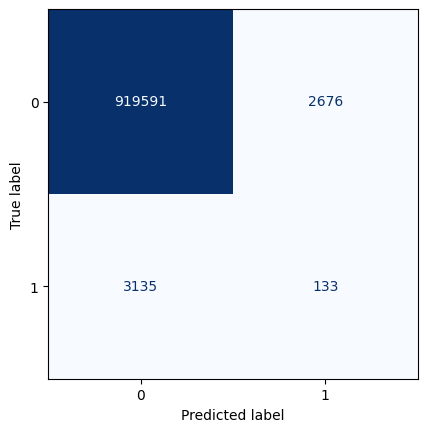

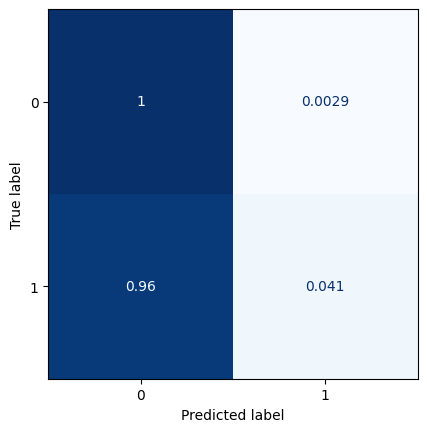

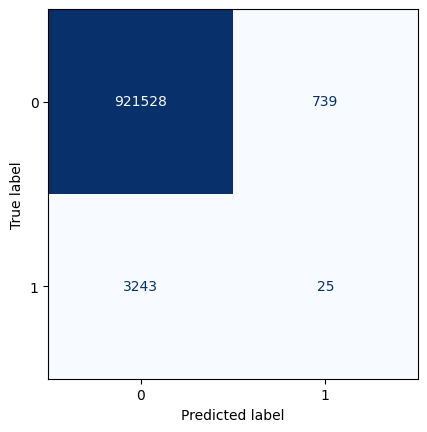

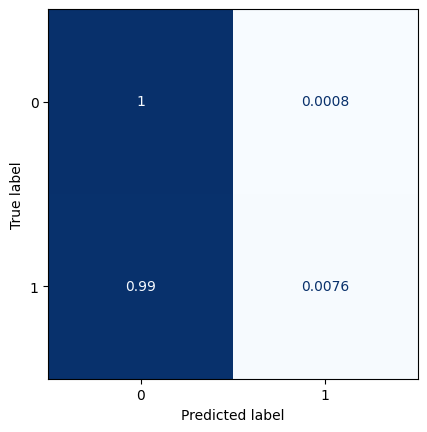

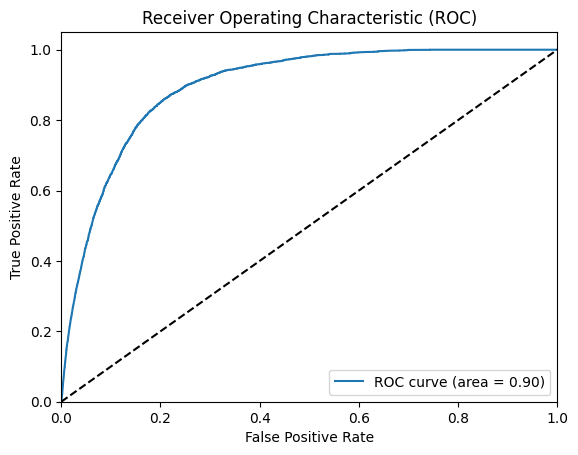

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.003473106951305094
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_93 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_94 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_31 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_95 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:51:17.778142: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0353

2023-06-15 09:51:22.618221: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 14ms/step - loss: 0.0353 - val_loss: 0.0216
Epoch 2/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0224 - val_loss: 0.0208
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0217 - val_loss: 0.0206
Epoch 4/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0214 - val_loss: 0.0202
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0201
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0202
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0209 - val_loss: 0.0200
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0200
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0197
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0199

2023-06-15 09:53:09.944586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


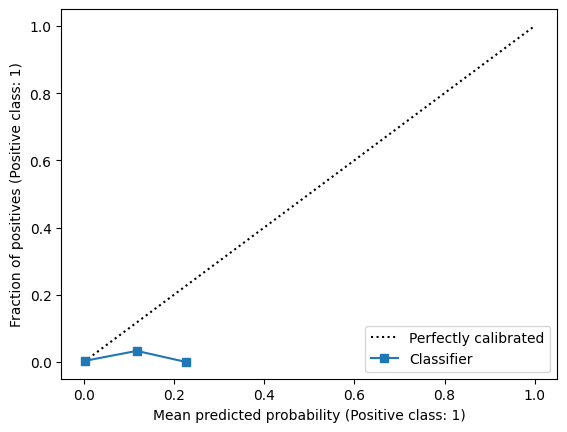

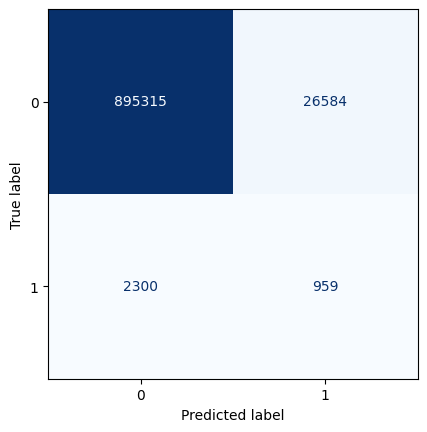

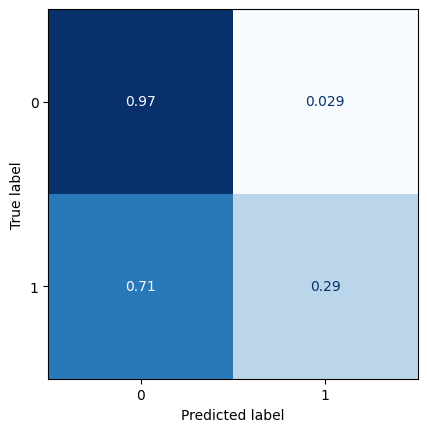

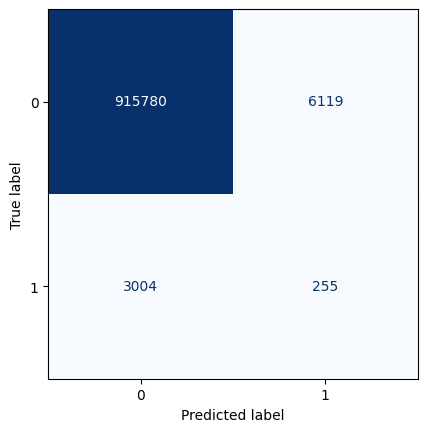

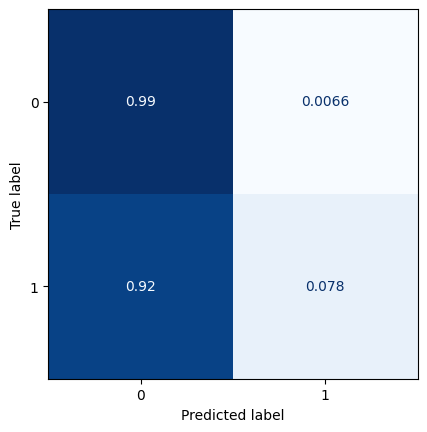

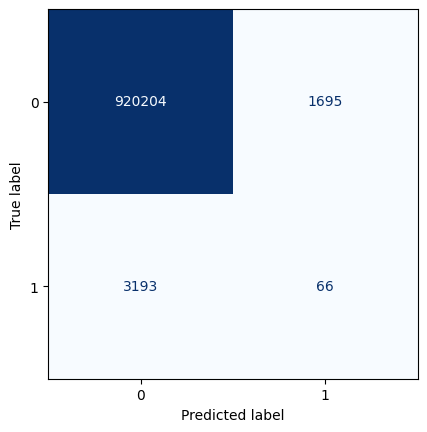

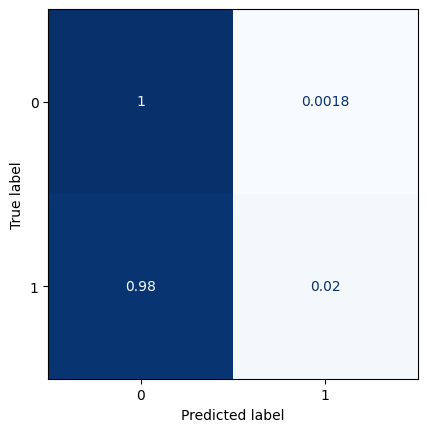

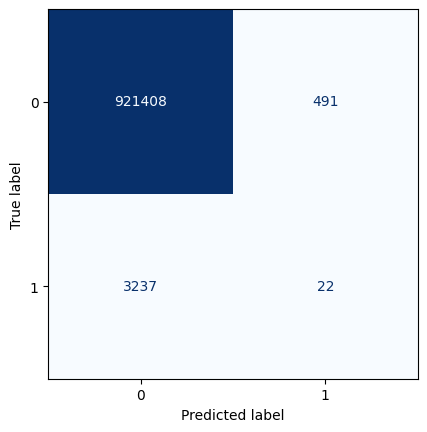

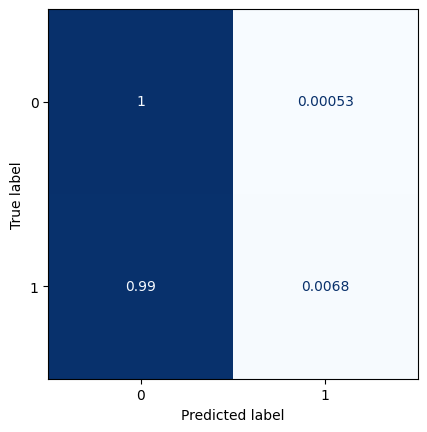

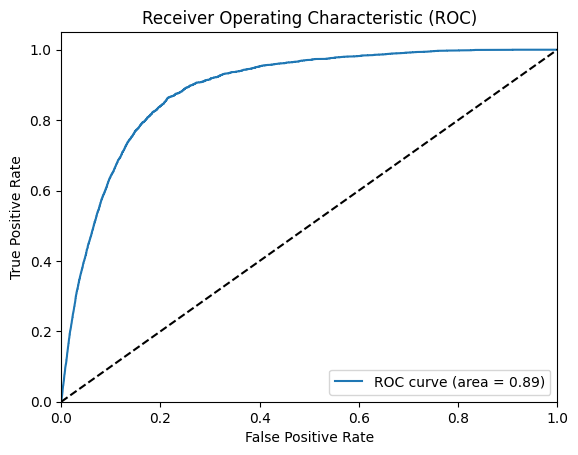

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.0034684301795628925
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_32 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 14, 30, 1)         73        
                                  

2023-06-15 09:53:49.751920: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0292

2023-06-15 09:53:54.872964: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 15ms/step - loss: 0.0292 - val_loss: 0.0212
Epoch 2/100
354/354 [==============================] - 4s 12ms/step - loss: 0.0224 - val_loss: 0.0207
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 12s 34ms/step - loss: 0.0214 - val_loss: 0.0209
Epoch 5/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0212 - val_loss: 0.0202
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0210 - val_loss: 0.0203
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0209 - val_loss: 0.0202
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0204
Epoch 9/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0208 - val_loss: 0.0201
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0207 - val_loss: 0.

2023-06-15 09:55:50.493067: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 9ms/step


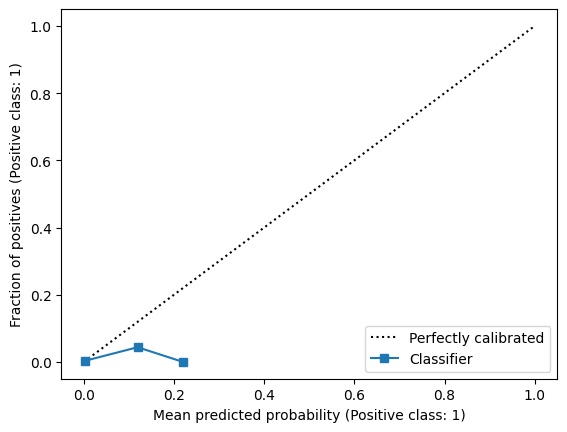

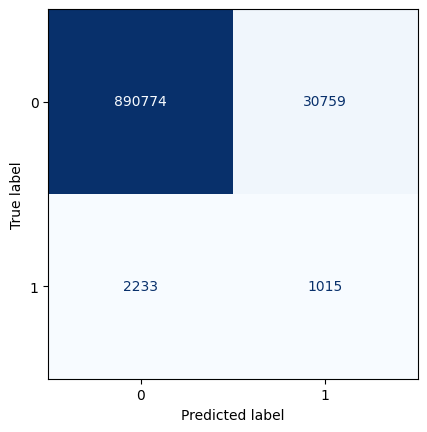

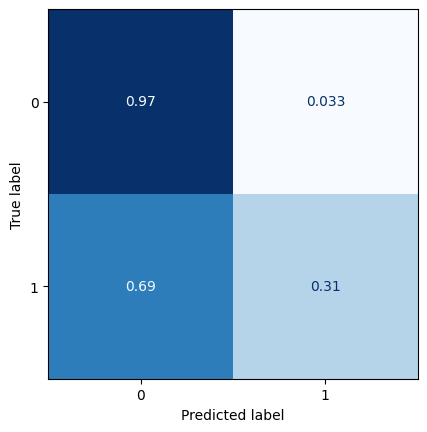

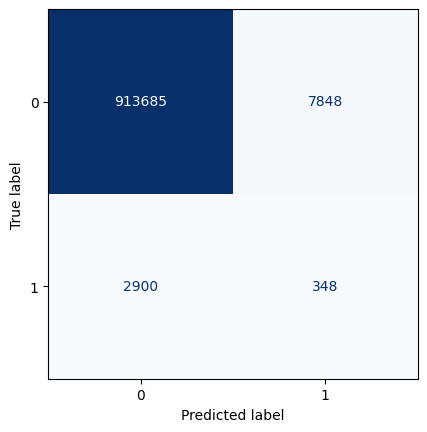

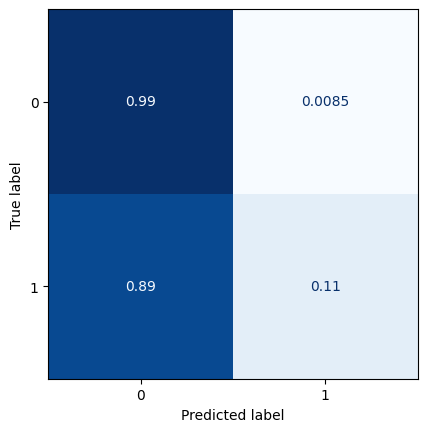

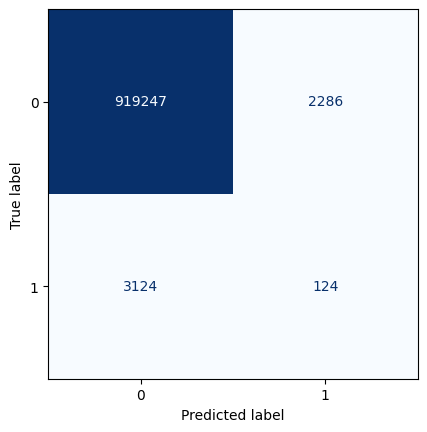

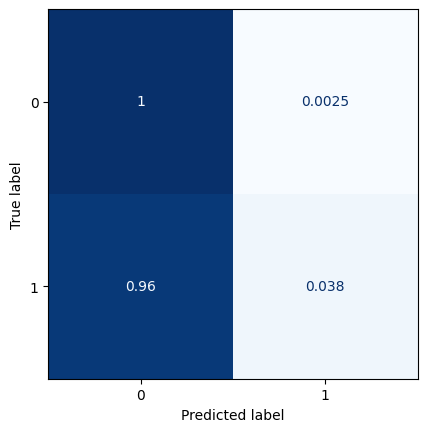

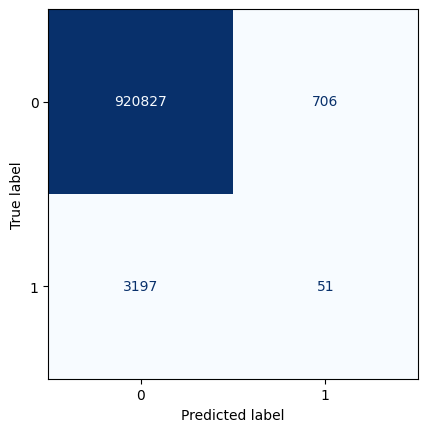

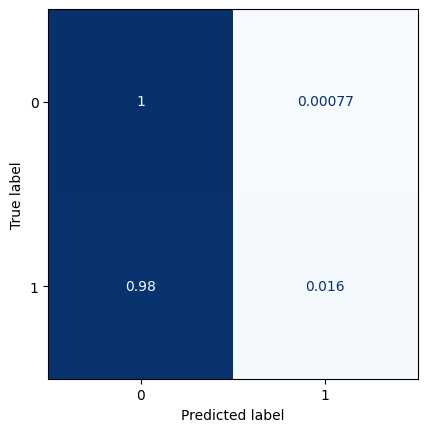

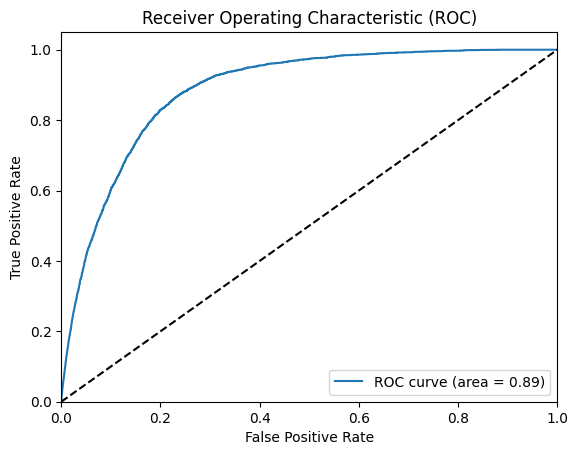

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.0034619428482595173
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_99 (Conv2D)          (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_100 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_33 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_101 (Conv2D)         (None, 14, 30, 1)         73        
                                 

2023-06-15 09:56:35.706303: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0479

2023-06-15 09:56:45.039995: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 11s 26ms/step - loss: 0.0479 - val_loss: 0.0226
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0229 - val_loss: 0.0213
Epoch 3/100
354/354 [==============================] - 5s 13ms/step - loss: 0.0221 - val_loss: 0.0210
Epoch 4/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0217 - val_loss: 0.0206
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0214 - val_loss: 0.0206
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0205
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0211 - val_loss: 0.0208
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0210 - val_loss: 0.0206
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0206
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.020

2023-06-15 09:58:30.422282: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 12ms/step


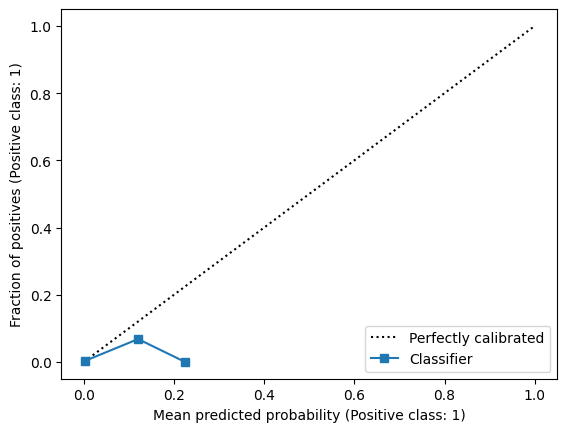

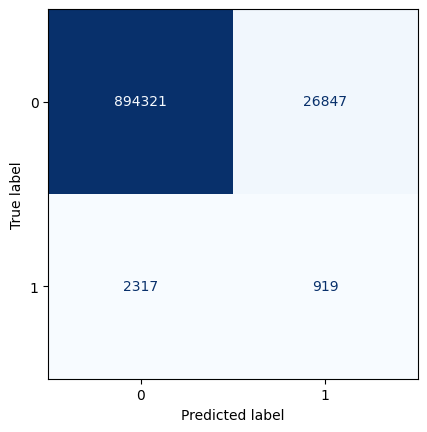

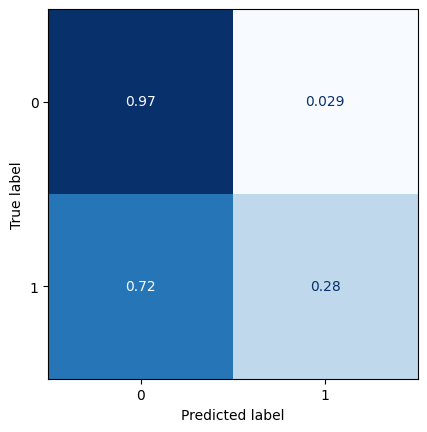

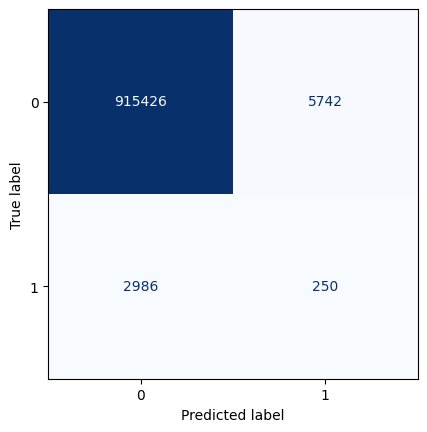

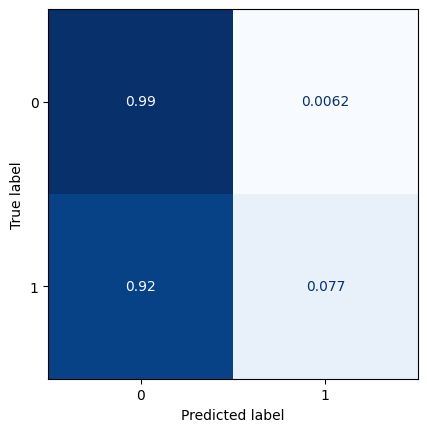

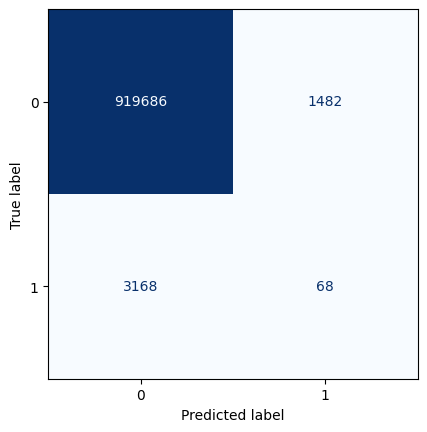

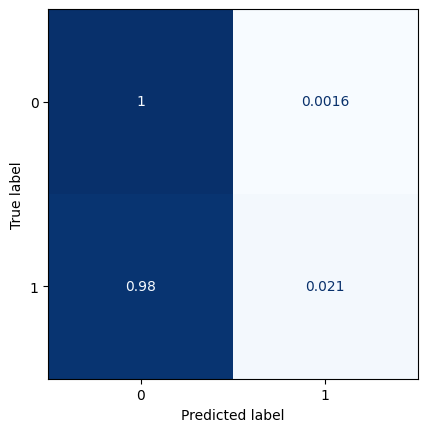

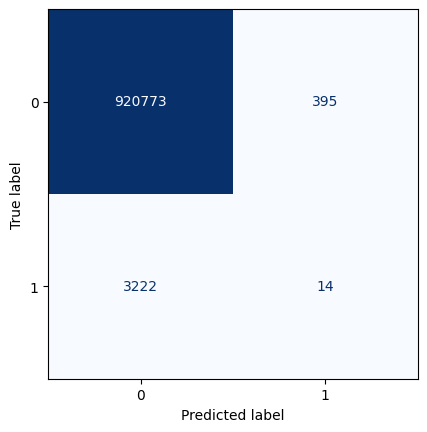

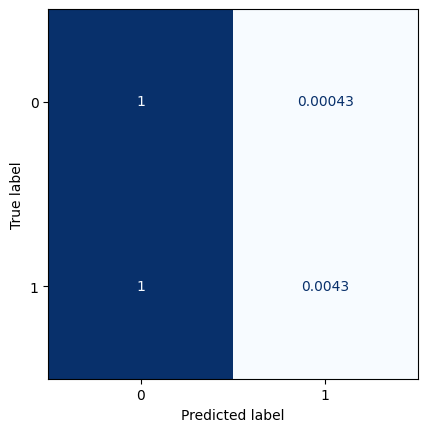

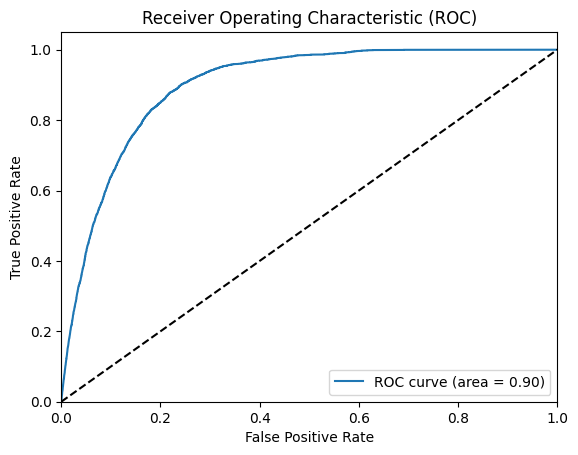

All zeros Brier score: 0.003500633921964855
Model Brier score: 0.003444660879210892
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_102 (Conv2D)         (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_103 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_34 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_104 (Conv2D)         (None, 14, 30, 1)         73        
                                   

2023-06-15 09:59:23.839123: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0672

2023-06-15 09:59:28.763880: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 13ms/step - loss: 0.0672 - val_loss: 0.0228
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0236 - val_loss: 0.0215
Epoch 3/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0226 - val_loss: 0.0212
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0211
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0207
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0205
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0207
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0202
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0206
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0211 - val_loss: 0.0202


2023-06-15 10:01:27.042885: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 5ms/step


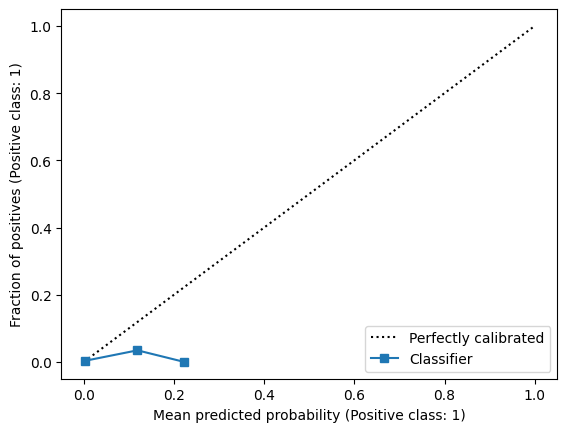

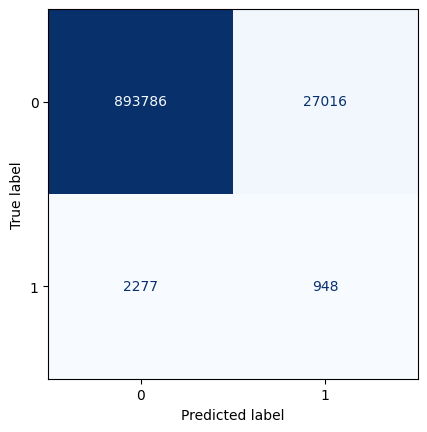

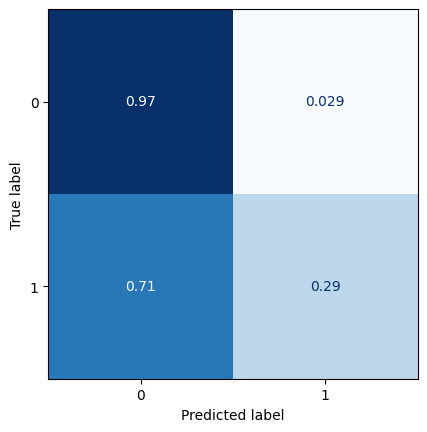

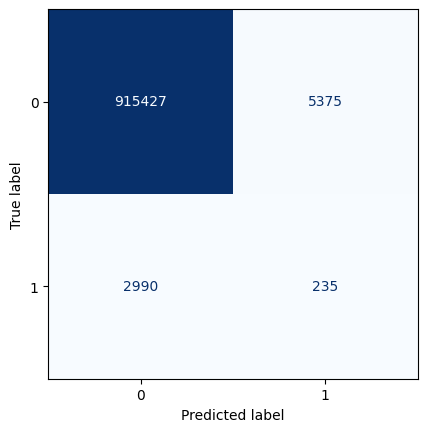

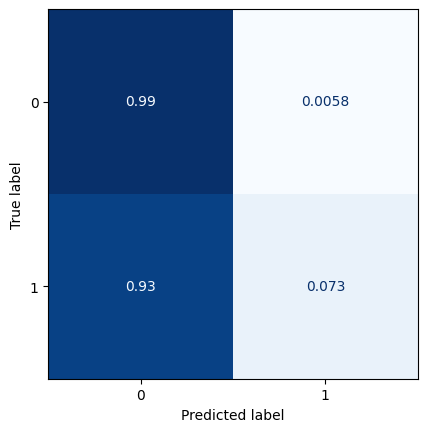

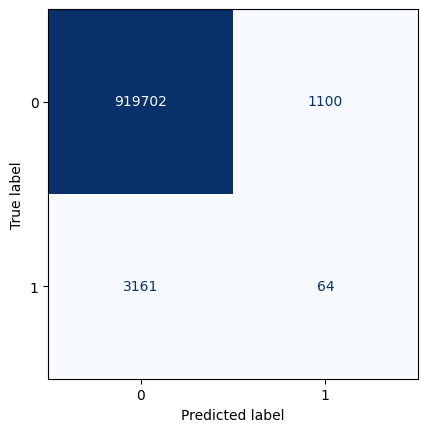

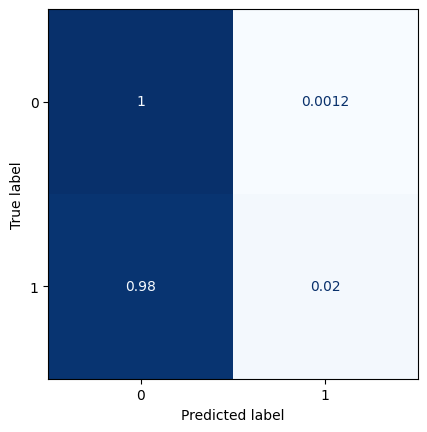

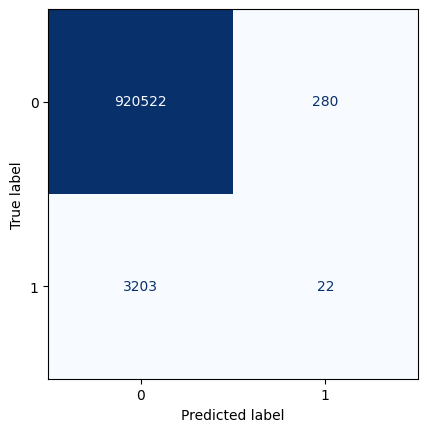

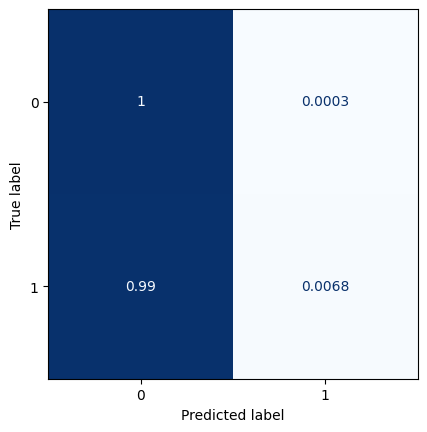

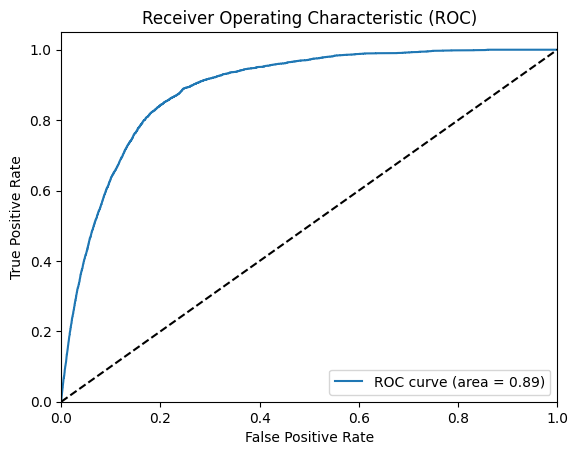

All zeros Brier score: 0.0034901577551305317
Model Brier score: 0.003432215091933705
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_105 (Conv2D)         (None, 13, 29, 8)         2600      
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_106 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_35 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_107 (Conv2D)         (None, 14, 30, 1)         73        
                                  

2023-06-15 10:02:05.051175: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0607

2023-06-15 10:02:10.247094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 6s 14ms/step - loss: 0.0607 - val_loss: 0.0239
Epoch 2/100
354/354 [==============================] - 3s 10ms/step - loss: 0.0240 - val_loss: 0.0224
Epoch 3/100
354/354 [==============================] - 4s 11ms/step - loss: 0.0226 - val_loss: 0.0215
Epoch 4/100
354/354 [==============================] - 4s 10ms/step - loss: 0.0221 - val_loss: 0.0210
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0217 - val_loss: 0.0208
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0215 - val_loss: 0.0207
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0209
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0204
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0205
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.02

2023-06-15 10:04:24.377270: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 1s 6ms/step


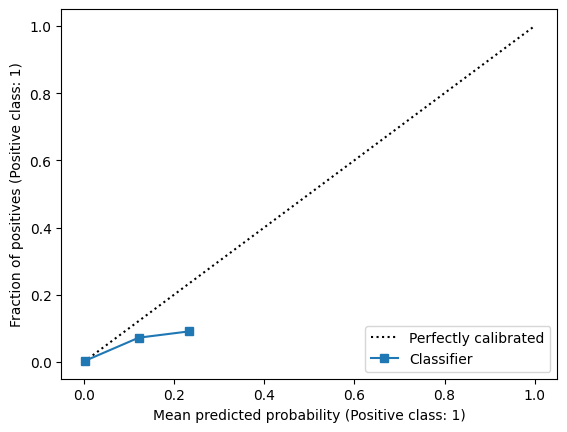

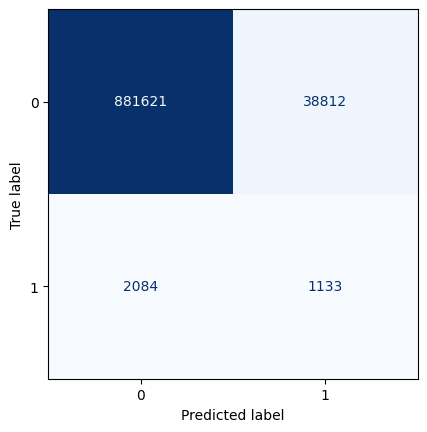

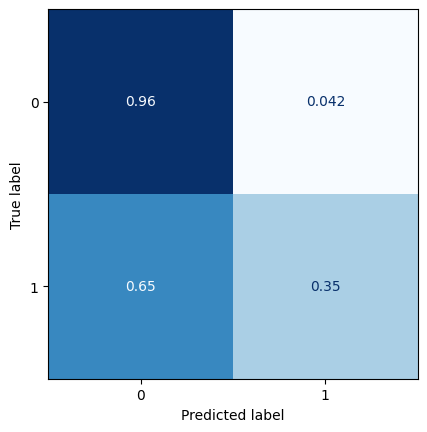

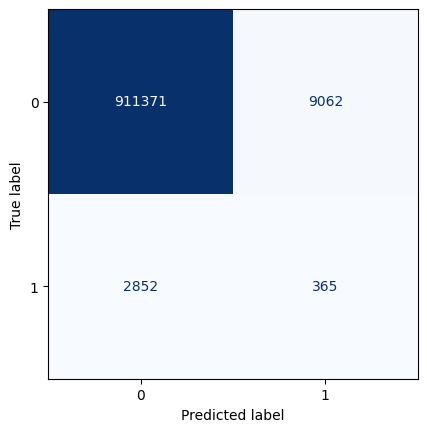

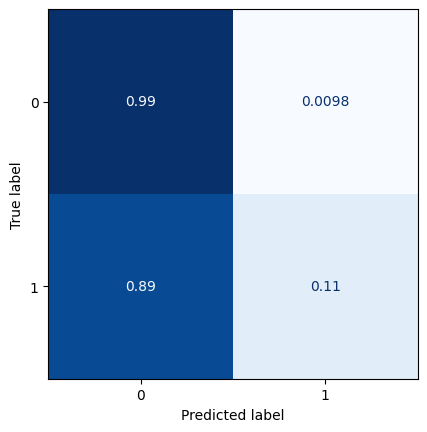

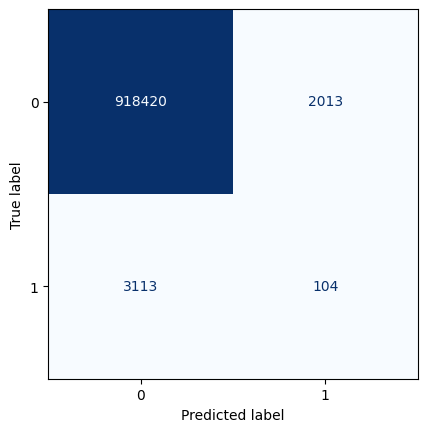

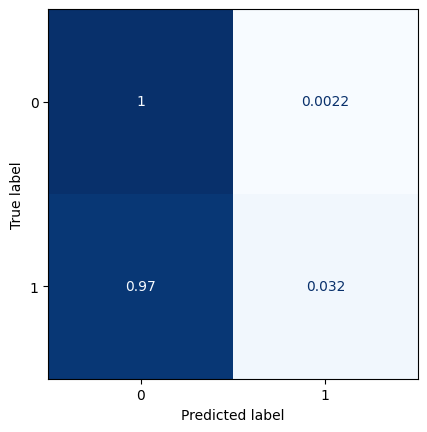

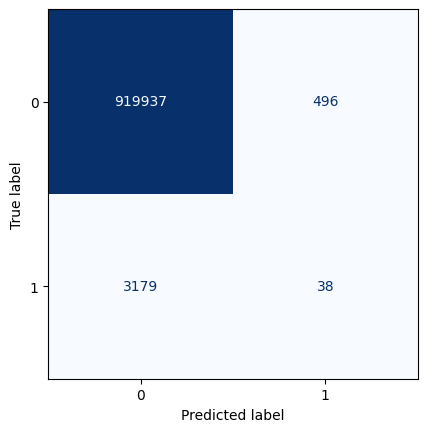

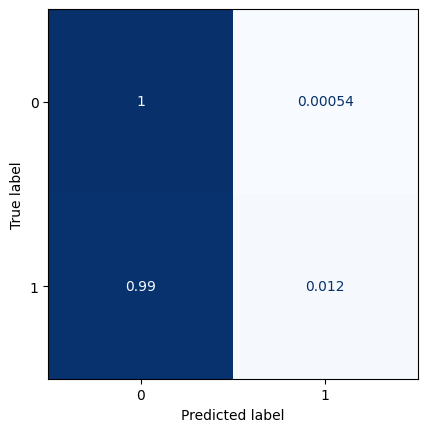

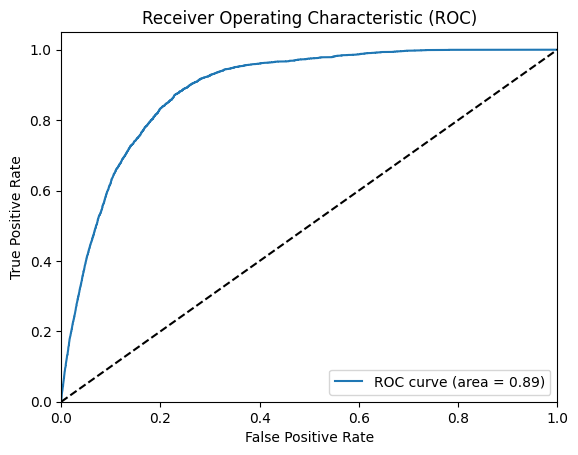

All zeros Brier score: 0.0034829210198668325
Model Brier score: 0.0034366405027533736


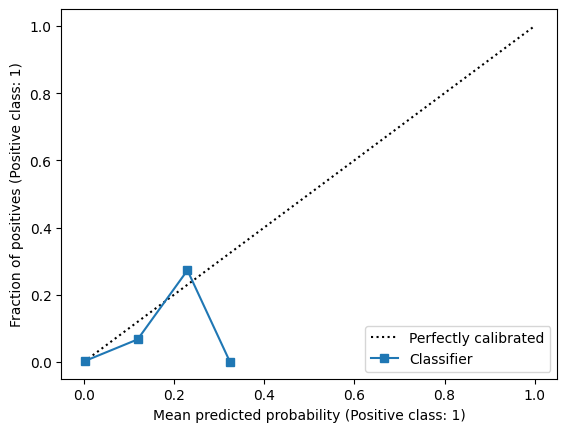

In [76]:
for lag in [1,2,3,4,5,6,7,8,9,10,11,12,13]:
    ### Model summary
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 36)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)
    
    ### Model training
    model.fit(train_img_std_4[:-lag], y_train_img[lag+3:], validation_data=(val_img_std_4[:-lag],y_val_img[lag+3:]),
        callbacks=[monitor],epochs=100)
    
    ### Confusion matrices
    t = model.predict(test_img_std_4[:-lag])

    ranges = [0.025,0.05,0.075,0.1]
    
    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag+3:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag+3:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    
    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag+3:].reshape(-1,1))
    
    z0 = np.zeros((3,13,29,1))
    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((z0,t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    test.to_csv("test_with_newTarget_predictions_4days.csv")
    
    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag+3:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag+3:].reshape(-1,1), np.zeros(len(y_test_img[lag+3:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag+3:].reshape(-1,1), t.reshape(-1,1))}')
    

## Model with one day before prediction as input

### Lag 0-1

In [74]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 9)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=10, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_111 (Conv2D)         (None, 13, 29, 8)         656       
                                                                 
 max_pooling2d_37 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_112 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_37 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_113 (Conv2D)         (None, 14, 30, 1)         73        
                                                                 
 cropping2d_37 (Cropping2D)  (None, 13, 29, 1)       

In [75]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=100)


Epoch 1/100


2023-06-26 17:20:53.237608: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0904

2023-06-26 17:20:56.761157: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0904 - val_loss: 0.0196
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0180 - val_loss: 0.0120
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0139 - val_loss: 0.0107
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0127 - val_loss: 0.0100
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0121 - val_loss: 0.0096
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0116 - val_loss: 0.0098
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0113 - val_loss: 0.0094
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0111 - val_loss: 0.0093
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0109 - val_loss: 0.0091
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0107 - val_loss: 0.0091


34/78 [============>.................] - ETA: 0s

2023-06-26 17:23:01.713878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step


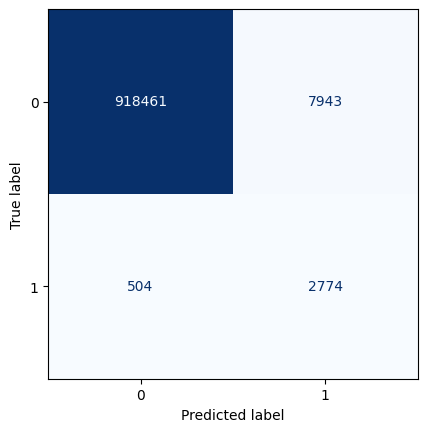

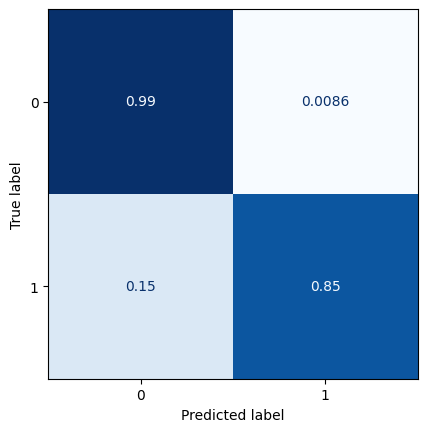

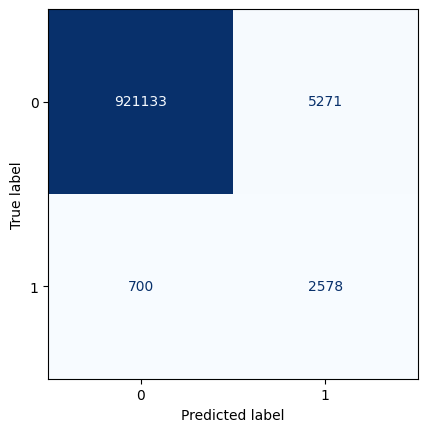

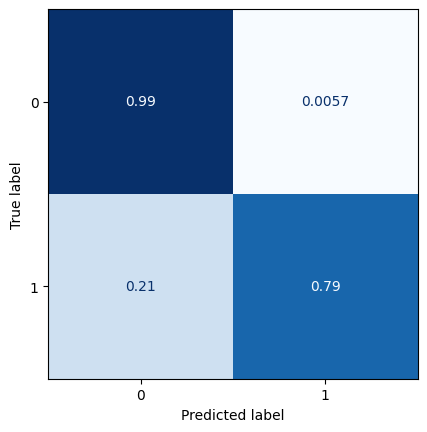

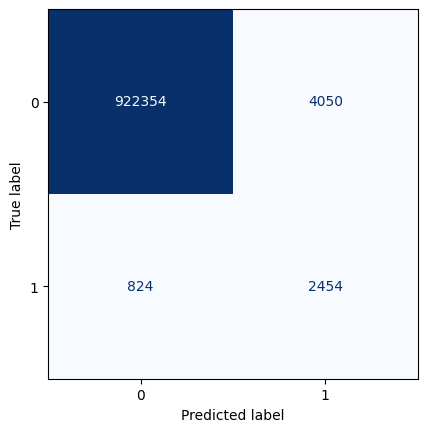

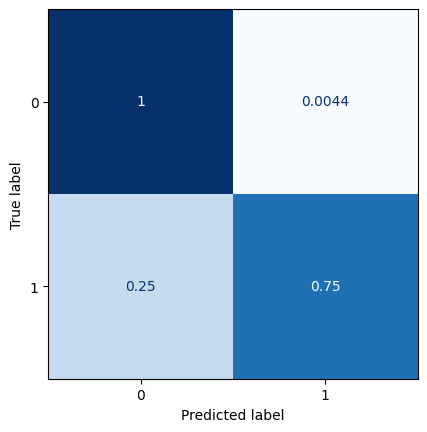

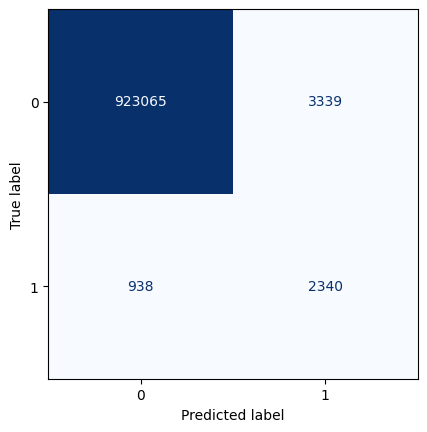

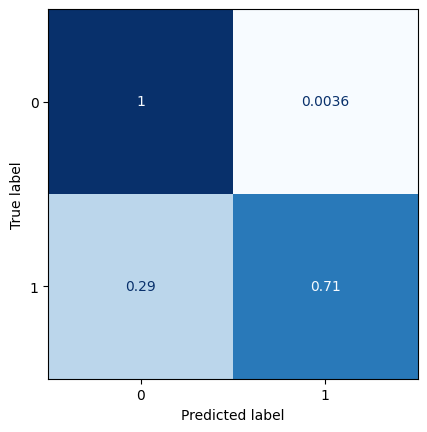

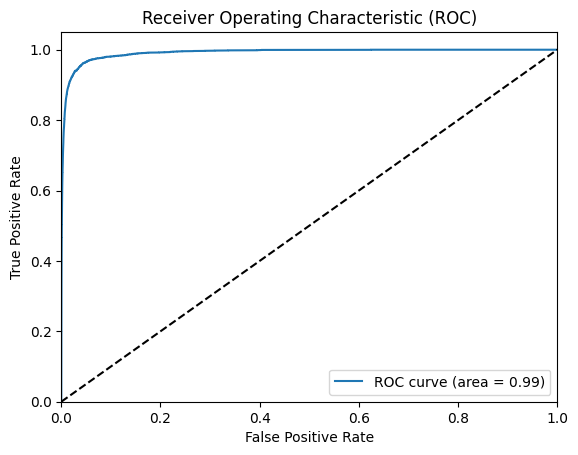

All zeros Brier score: 0.0035259368257102965
Model Brier score: 0.00217676524967306


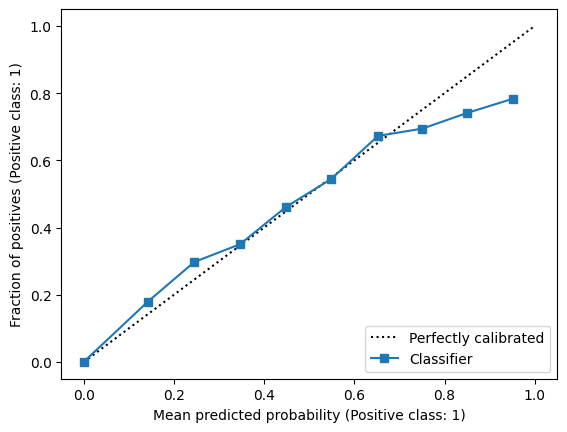

In [76]:
t = model.predict(test_img_std)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

### ROC
plot_roc(t.reshape(-1,1),y_test_img.reshape(-1,1))

test['predictions_lag'+str(0)] = t.reshape(-1,1)
test.to_csv("test_with_newTarget_predictions_target1.csv")

### calibration
display = CalibrationDisplay.from_predictions(y_test_img.reshape(-1,1), t.reshape(-1,1), n_bins=10)
print(f'All zeros Brier score: {brier_score_loss(y_test_img.reshape(-1,1), np.zeros(len(y_test_img.reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img.reshape(-1,1), t.reshape(-1,1))}')


In [77]:
t_train = model.predict(train_img_std)
t_val = model.predict(val_img_std)
t_test = model.predict(test_img_std)

train_img_std_Pred0 = np.concatenate((t_train,train_img_std),axis=3)
val_img_std_Pred0 = np.concatenate((t_val,val_img_std),axis=3)
test_img_std_Pred0 = np.concatenate((t_test,test_img_std),axis=3)


78/78 [==============================] - 0s 2ms/step


In [24]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 10)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_3 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_3 (Cropping2D)   (None, 13, 29, 1)        

In [25]:
model.fit(train_img_std_Pred0[:-1], y_train_img[1:], validation_data=(val_img_std_Pred0[:-1],y_val_img[1:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100
  1/354 [..............................] - ETA: 1:48 - loss: 0.8614

2023-06-26 11:22:17.753827: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0727

2023-06-26 11:22:20.747440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0727 - val_loss: 0.0193
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0196 - val_loss: 0.0146
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0156 - val_loss: 0.0126
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0140 - val_loss: 0.0122
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0133 - val_loss: 0.0116
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0129 - val_loss: 0.0112
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0125 - val_loss: 0.0111
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0123 - val_loss: 0.0114
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0120 - val_loss: 0.0111
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0118 - val_loss: 0.0108


78/78 [==============================] - 0s 3ms/step


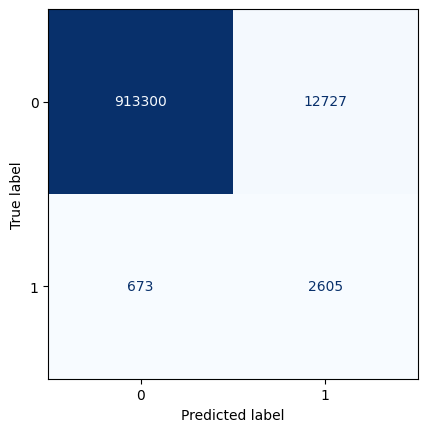

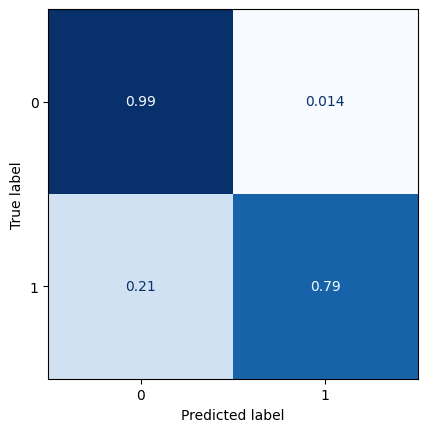

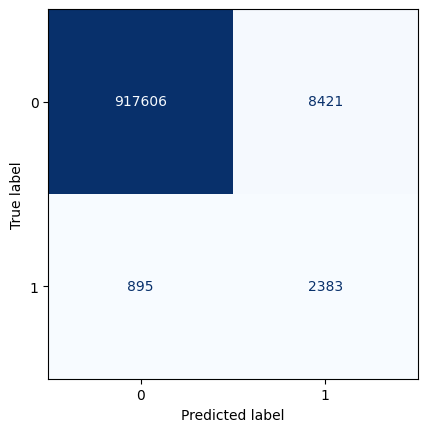

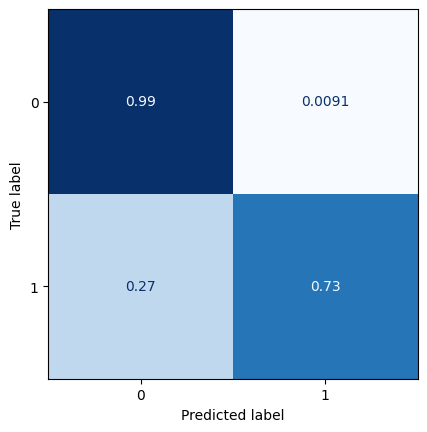

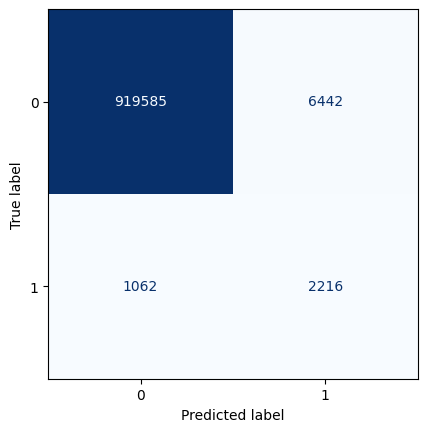

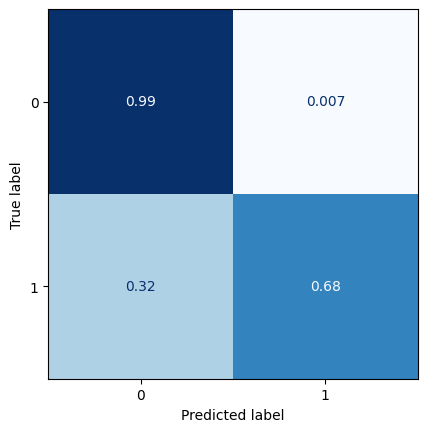

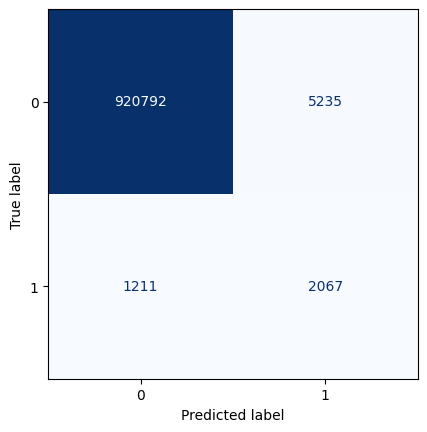

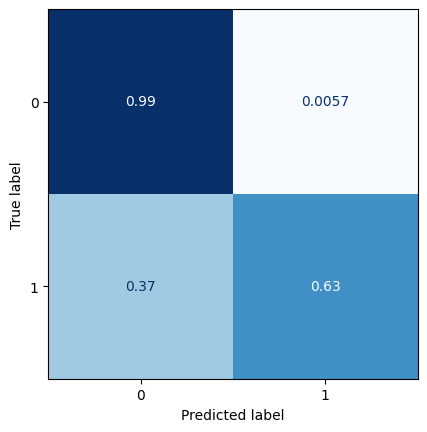

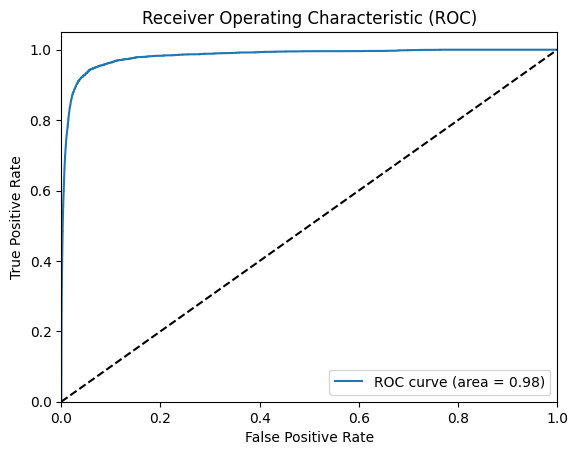

All zeros Brier score: 0.00352736722604527
Model Brier score: 0.002656928776857935


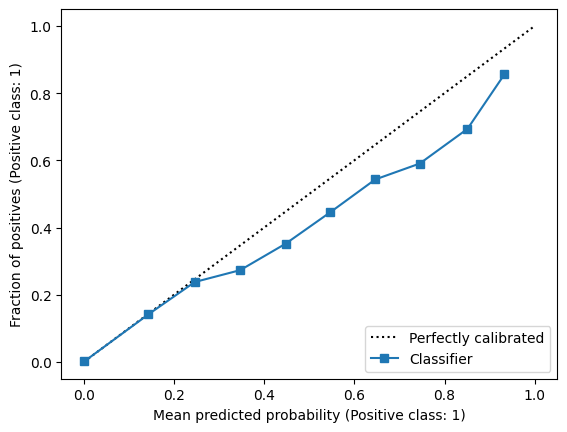

In [27]:
t = model.predict(test_img_std_Pred0[:-1])

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

### ROC
plot_roc(t.reshape(-1,1),y_test_img[1:].reshape(-1,1))

lag=1
z = np.zeros((lag,13,29,1))
tt = np.concatenate((t,z))
test['predictions_lag'+str(1)] = tt.reshape(-1,1)
test.to_csv("test_with_newTarget_predictions_target1.csv")

### calibration
display = CalibrationDisplay.from_predictions(y_test_img[1:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
print(f'All zeros Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), np.zeros(len(y_test_img[1:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), t.reshape(-1,1))}')


### Lag from 2 to 13

In [29]:
train_buffer = train_img_std_Pred0
val_buffer = val_img_std_Pred0
test_buffer = test_img_std_Pred0
train_buffer

array([[[[ 3.38961145e-05,  4.27113304e-01,  1.37508896e+00, ...,
           4.60972575e-01, -1.58825490e+00, -1.10596032e+00],
         [ 2.28079693e-06,  2.19114336e-01,  1.37282574e+00, ...,
           6.78440502e-01, -1.58825490e+00, -1.20719863e+00],
         [ 7.85724353e-07,  4.21189809e-01,  1.27558073e+00, ...,
           1.14706925e+00, -1.58825490e+00, -1.18827423e+00],
         ...,
         [ 2.42257847e-05,  1.88732872e+00,  1.32007047e+00, ...,
           2.52456449e+00,  6.46089324e-01, -9.84814941e-01],
         [ 5.60242042e-05,  1.96499168e+00,  1.20571395e+00, ...,
           1.87900267e+00,  6.49339282e-01, -1.19359838e+00],
         [ 1.60064345e-04,  1.03588502e+00,  1.09053155e+00, ...,
           1.26525283e+00,  6.50301850e-01, -1.17931194e+00]],

        [[ 8.74291231e-07,  6.46842452e-01,  1.32579176e+00, ...,
           8.38184395e-01, -1.58825490e+00, -1.34865214e+00],
         [ 3.39141906e-08,  6.71090976e-01,  1.25446831e+00, ...,
           1.75637237e

78/78 [==============================] - 0s 3ms/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_4 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 

2023-06-26 11:38:22.839336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0513

2023-06-26 11:38:25.737932: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 8ms/step - loss: 0.0513 - val_loss: 0.0181
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0185 - val_loss: 0.0160
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0165 - val_loss: 0.0149
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0156 - val_loss: 0.0144
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0152 - val_loss: 0.0142
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0148 - val_loss: 0.0138
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0146 - val_loss: 0.0139
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0145 - val_loss: 0.0141
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0143 - val_loss: 0.0138
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0142 - val_loss: 0.0135
E

2023-06-26 11:41:00.371764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


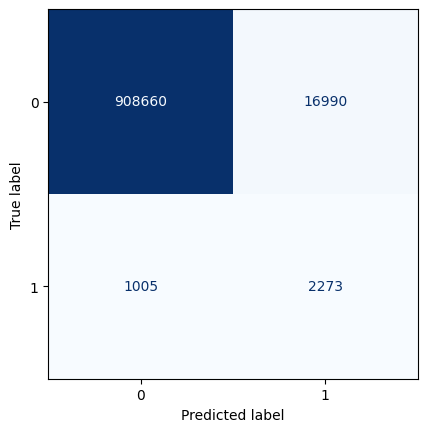

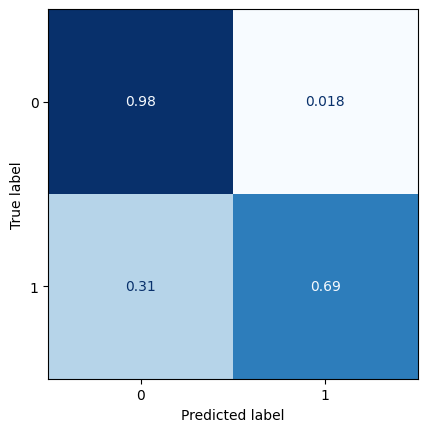

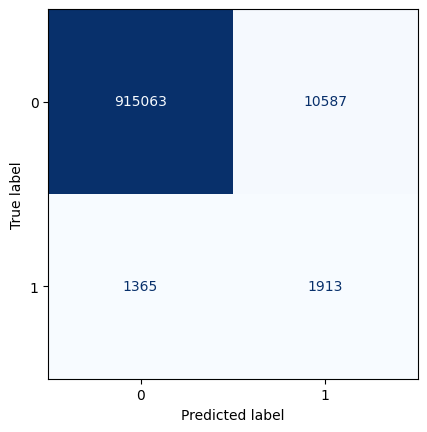

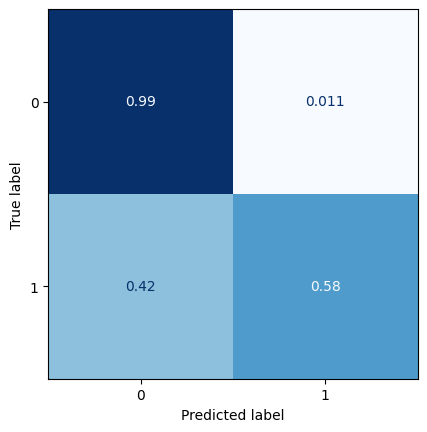

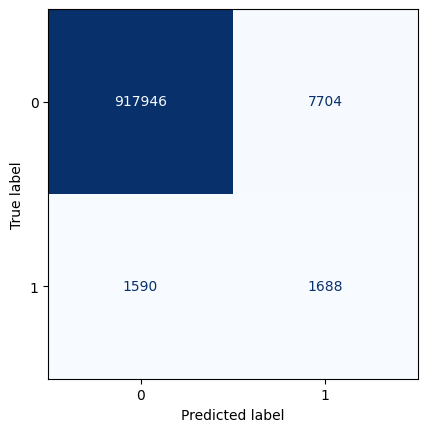

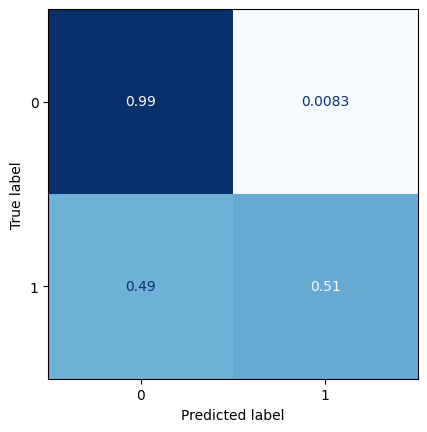

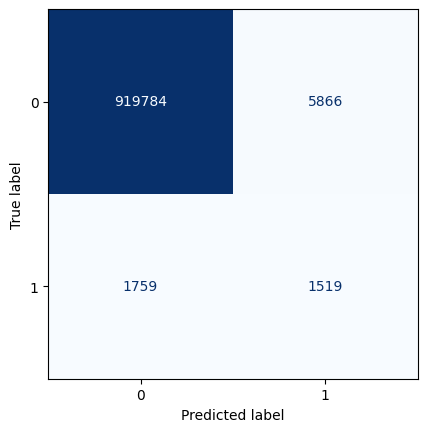

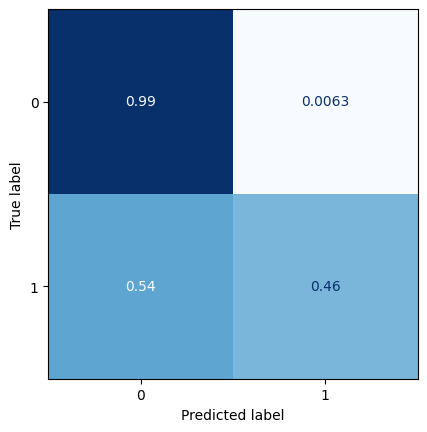

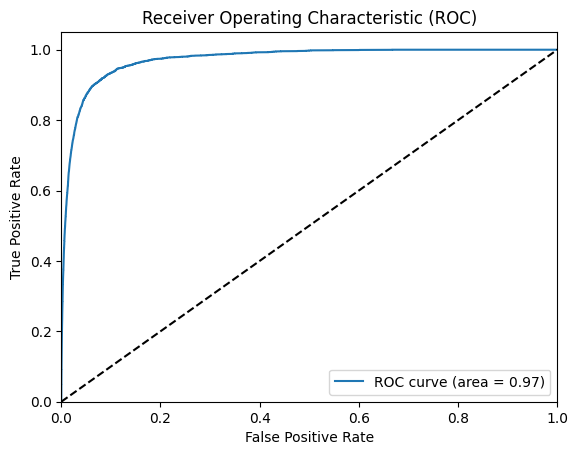

All zeros Brier score: 0.003528798787419477
Model Brier score: 0.003081458529299874
 59/354 [====>.........................] - ETA: 0s

2023-06-26 11:41:17.575098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 2ms/step
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_5 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 

2023-06-26 11:41:19.907924: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0655

2023-06-26 11:41:23.880562: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 12ms/step - loss: 0.0655 - val_loss: 0.0219
Epoch 2/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0229 - val_loss: 0.0189
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0176
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0171
Epoch 5/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0181 - val_loss: 0.0162
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0176 - val_loss: 0.0167
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0173 - val_loss: 0.0162
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0170 - val_loss: 0.0162
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0169 - val_loss: 0.0159
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0167 - val_loss: 0.0158


2023-06-26 11:43:58.549378: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


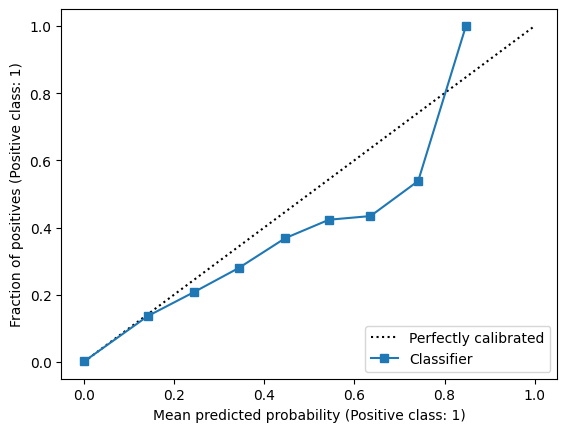

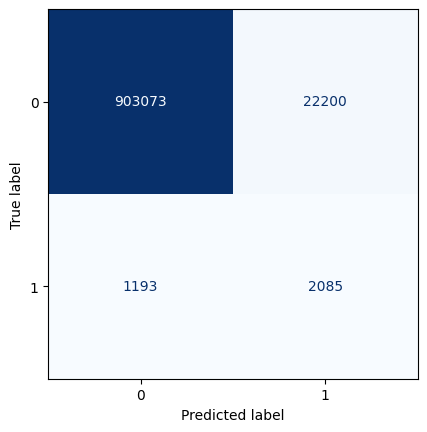

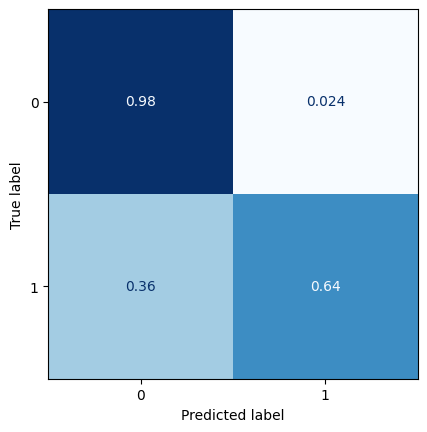

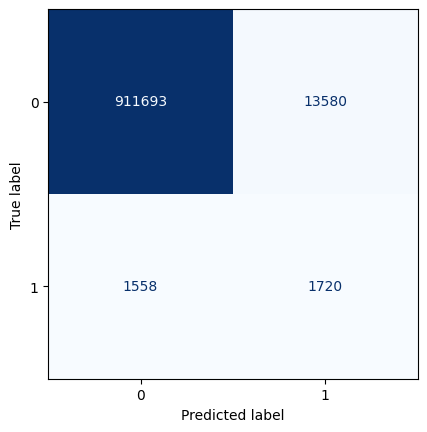

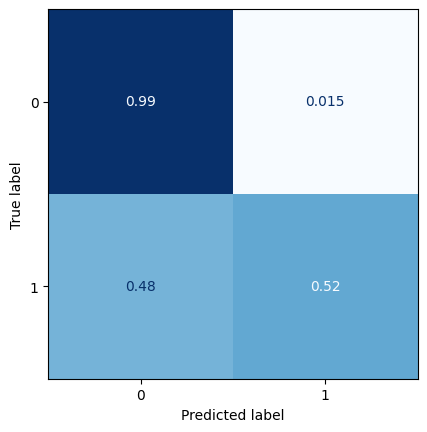

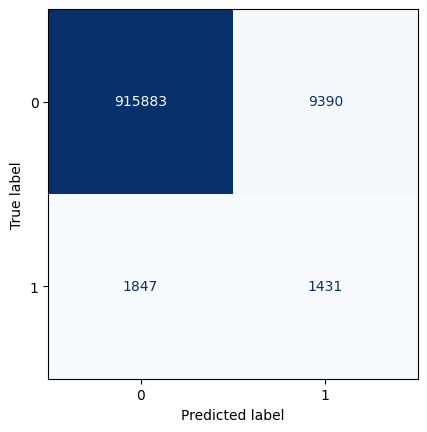

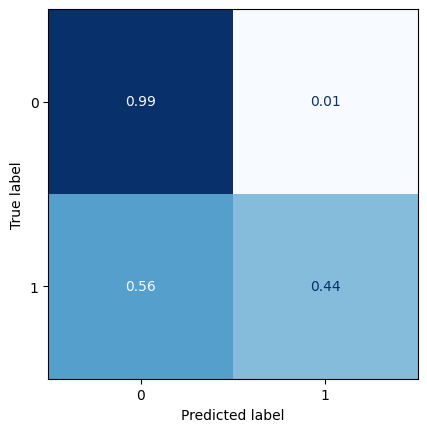

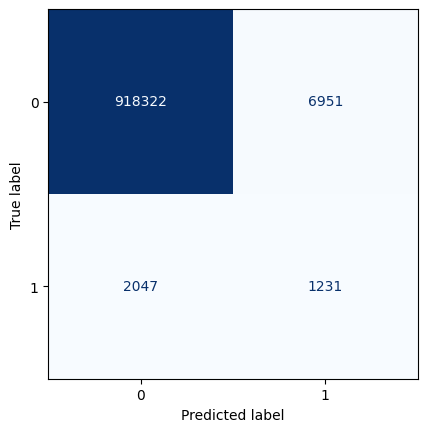

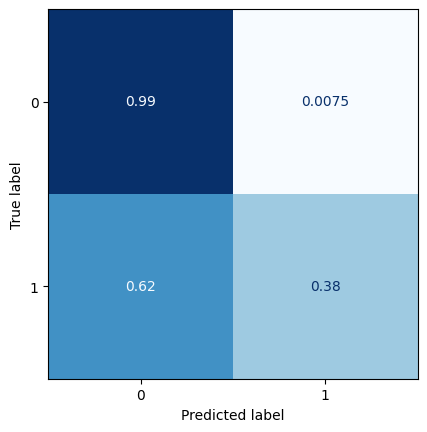

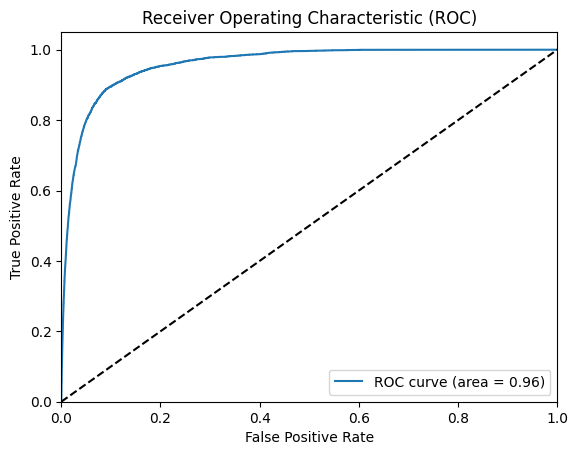

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.0032903815366356133
78/78 [==============================] - 0s 3ms/step
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_6 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_20 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 11:44:18.618318: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0871

2023-06-26 11:44:21.538459: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0871 - val_loss: 0.0219
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0229 - val_loss: 0.0193
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0181
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0181
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0173
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0174
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0186 - val_loss: 0.0173
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0184 - val_loss: 0.0170
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0182 - val_loss: 0.0170
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0180 - val_loss: 0.0169
E

2023-06-26 11:46:38.527267: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


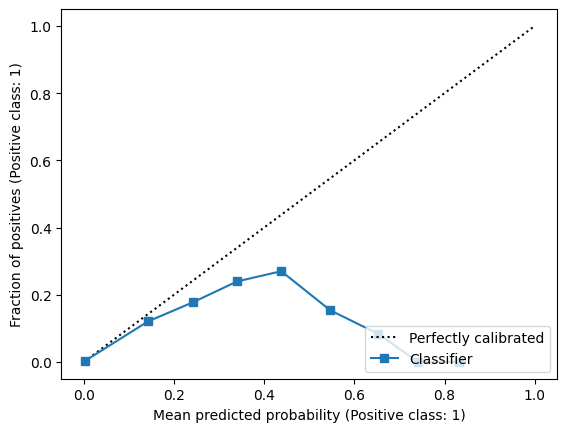

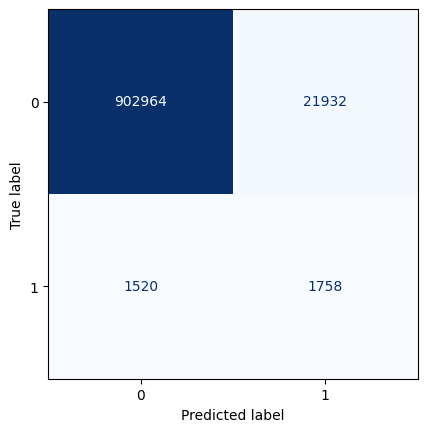

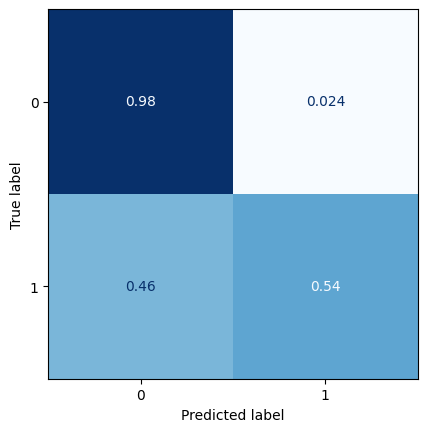

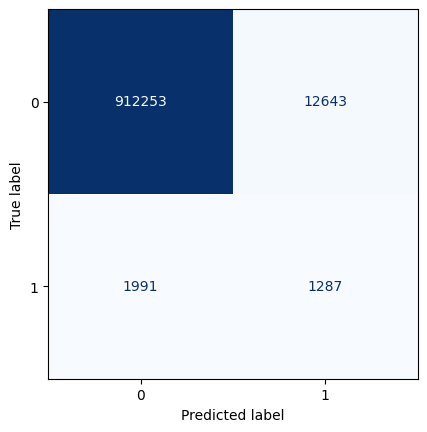

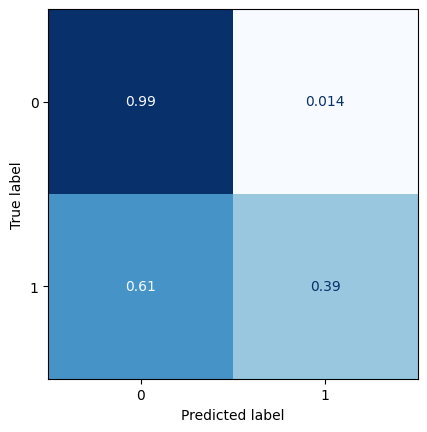

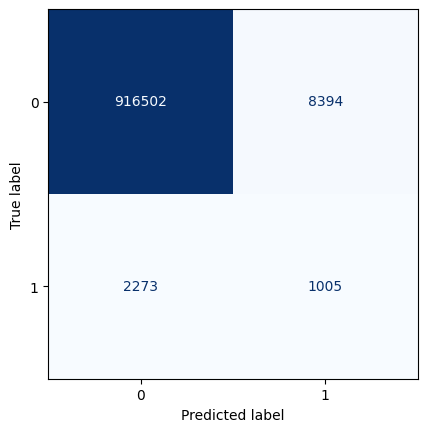

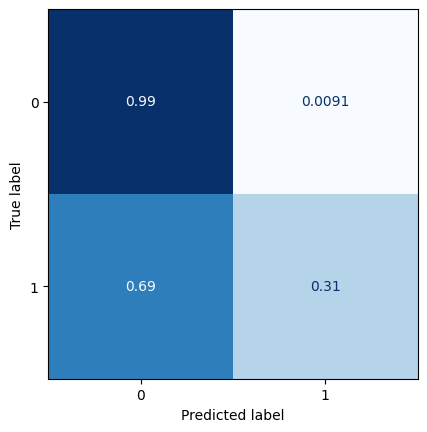

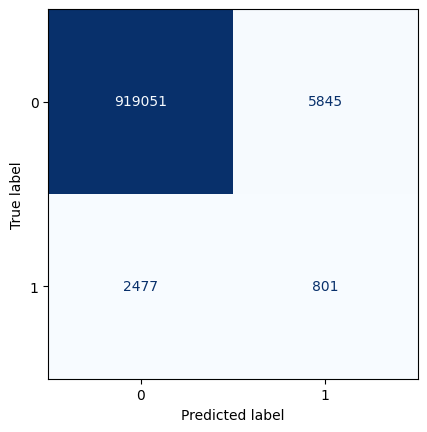

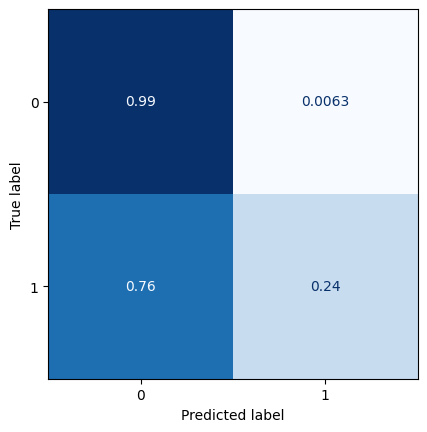

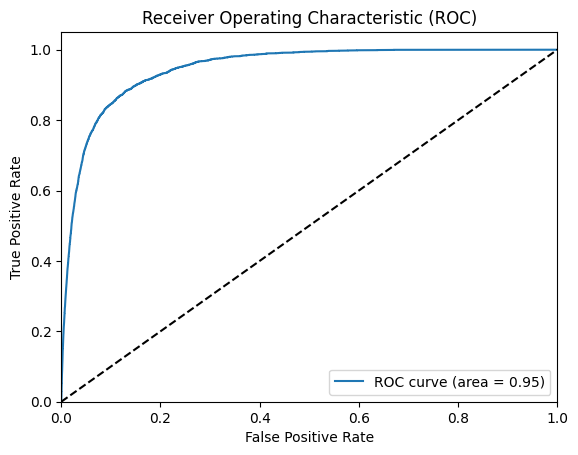

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.0033575376164050237
78/78 [==============================] - 0s 2ms/step
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_22 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_7 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_23 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 11:46:58.828542: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0468

2023-06-26 11:47:01.724820: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0468 - val_loss: 0.0210
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0192
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0187
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0198 - val_loss: 0.0181
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0194 - val_loss: 0.0181
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0191 - val_loss: 0.0177
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0189 - val_loss: 0.0177
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0178
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0187 - val_loss: 0.0178
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0186 - val_loss: 0.0178
E

2023-06-26 11:48:27.664972: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


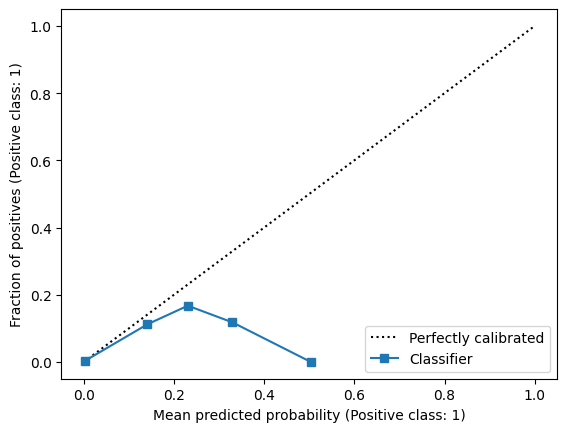

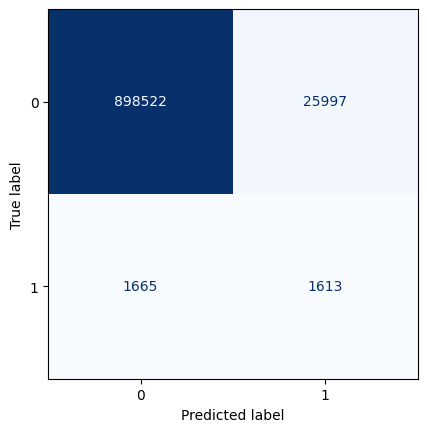

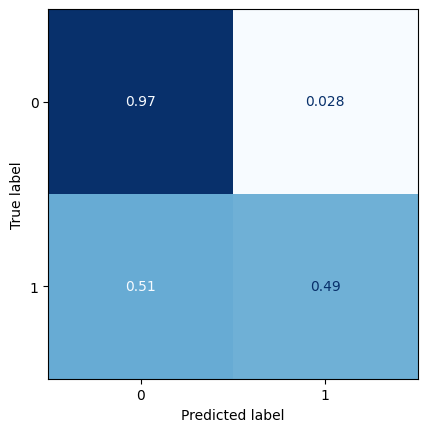

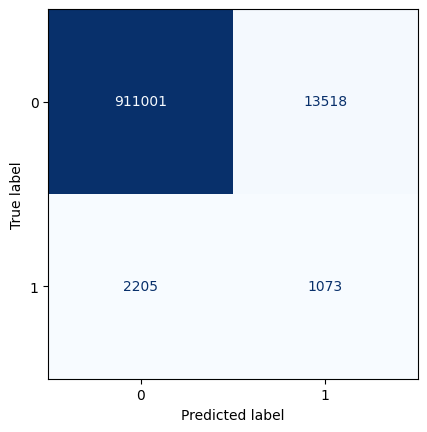

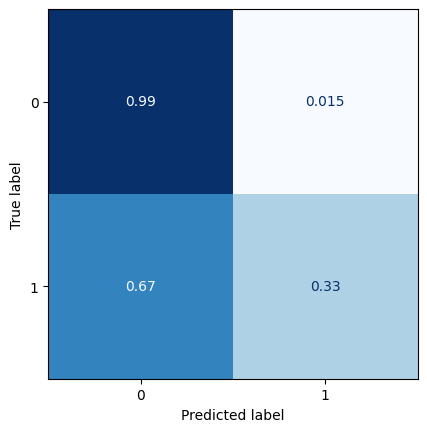

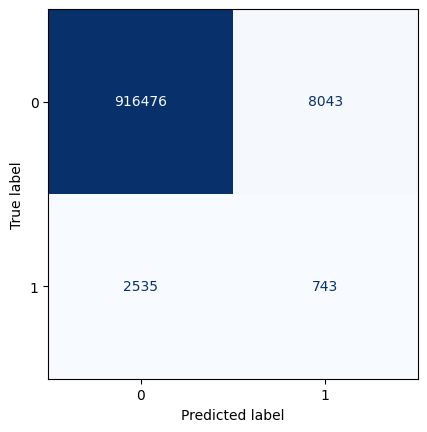

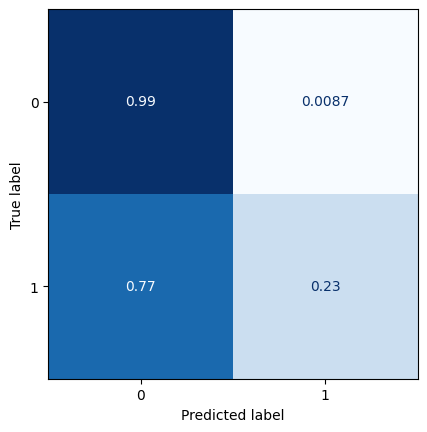

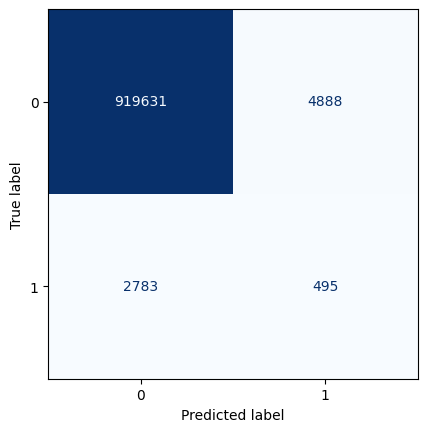

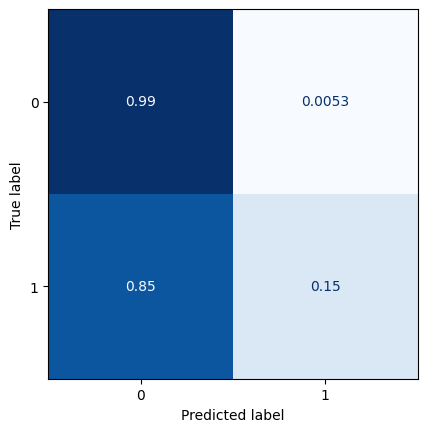

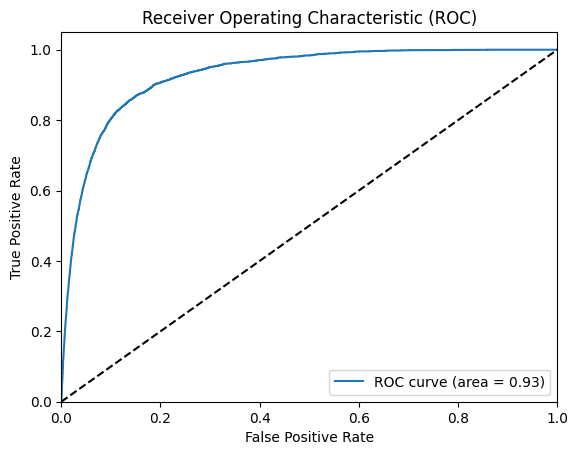

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.0034196536044326696
78/78 [==============================] - 0s 2ms/step
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_25 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_8 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_26 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 11:48:48.741915: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0426

2023-06-26 11:48:51.725155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0426 - val_loss: 0.0213
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0230 - val_loss: 0.0196
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0195
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0188
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0186
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0185
Epoch 7/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0199 - val_loss: 0.0184
Epoch 8/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0198 - val_loss: 0.0184
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0183
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0195 - val_loss: 0.0183


2023-06-26 11:50:24.166792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


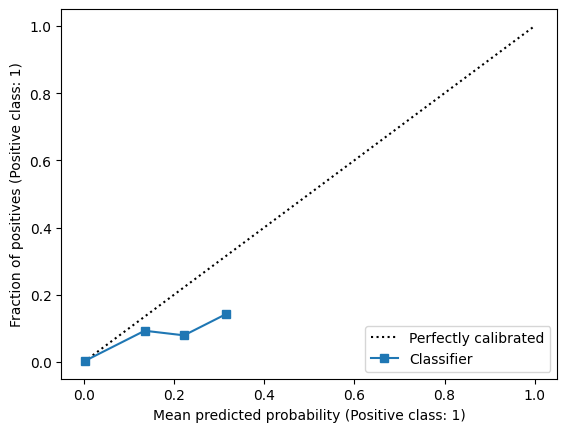

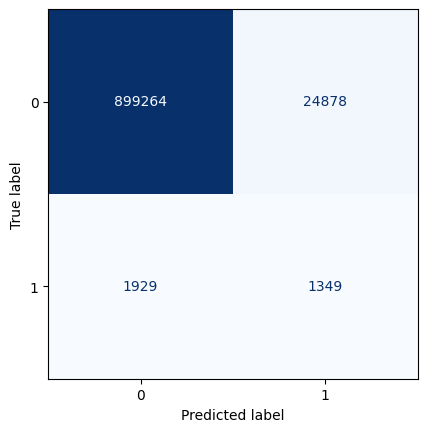

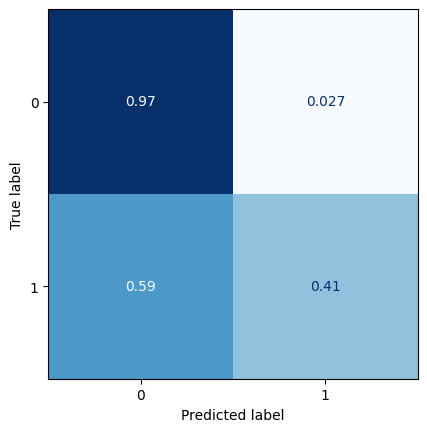

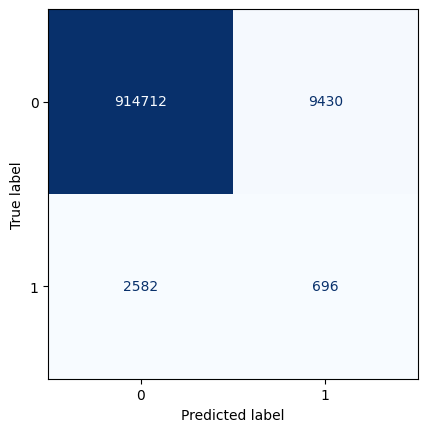

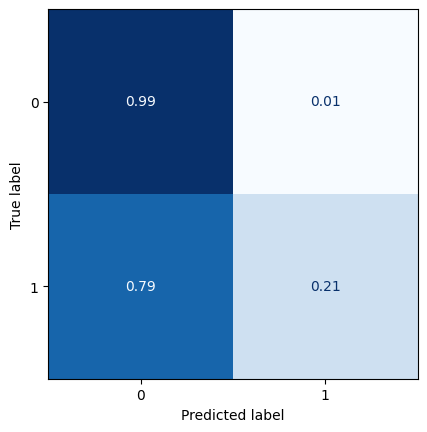

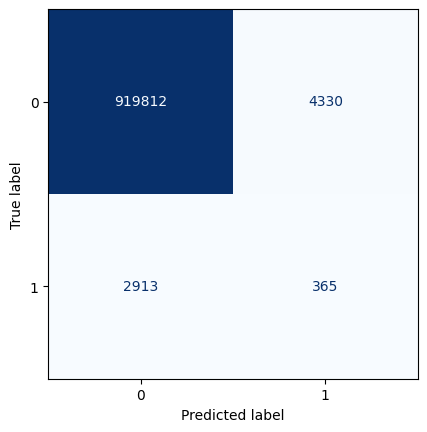

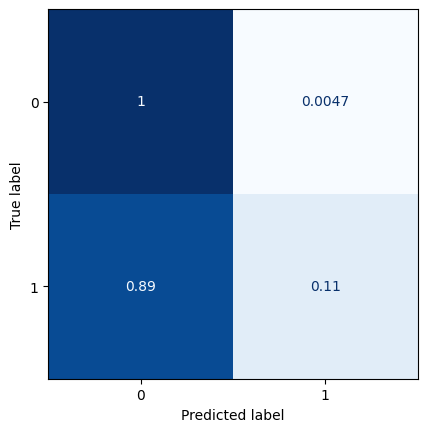

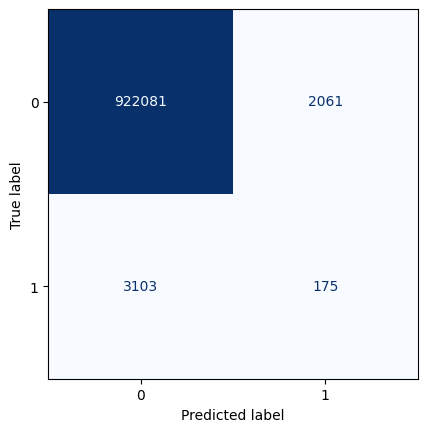

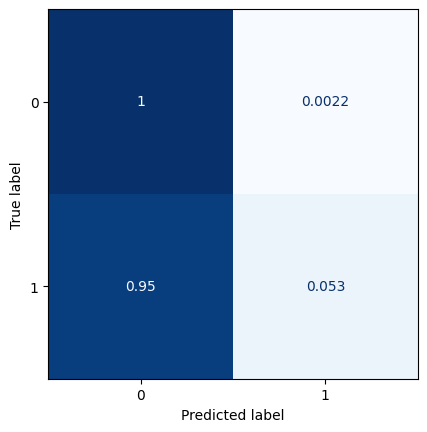

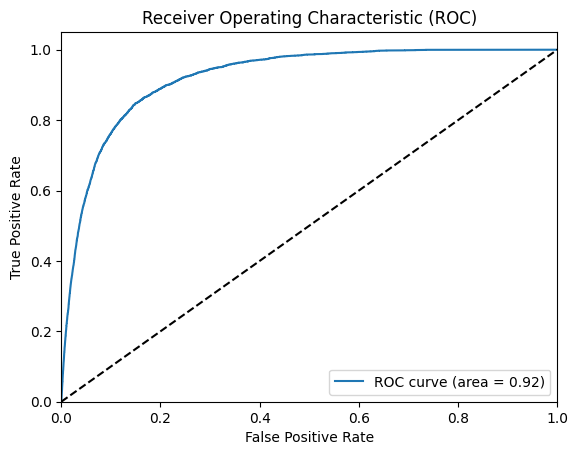

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.003440673040151313
78/78 [==============================] - 0s 3ms/step
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_28 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_9 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_29 (Conv2D)          (None, 14, 30, 1)   

2023-06-26 11:50:46.764315: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0766

2023-06-26 11:50:49.832178: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0766 - val_loss: 0.0227
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0240 - val_loss: 0.0208
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0200
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0198
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0194
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0197
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0193
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0190
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0190
E

2023-06-26 11:53:33.878734: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


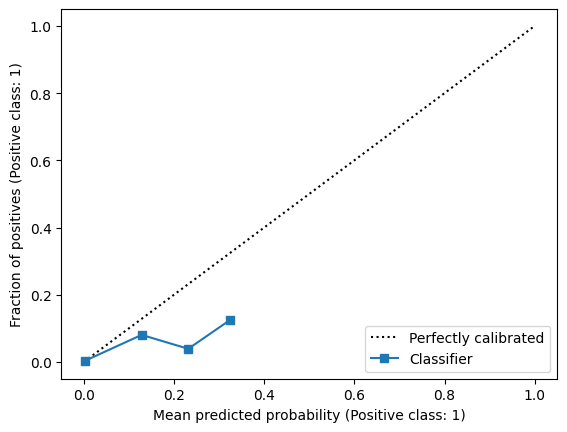

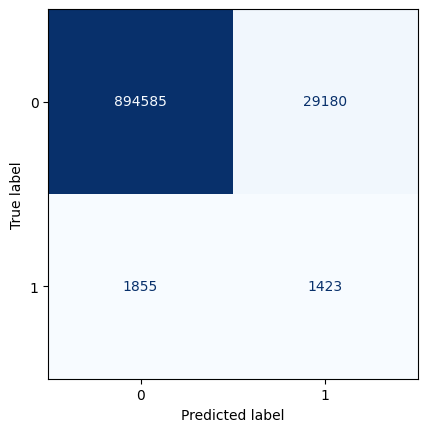

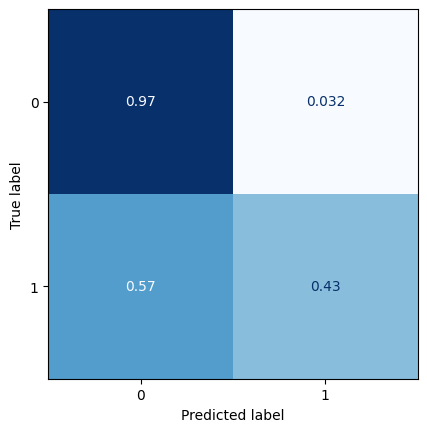

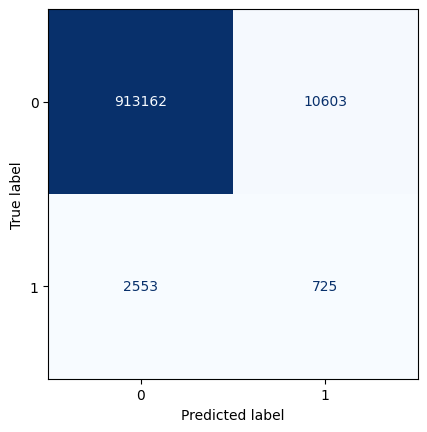

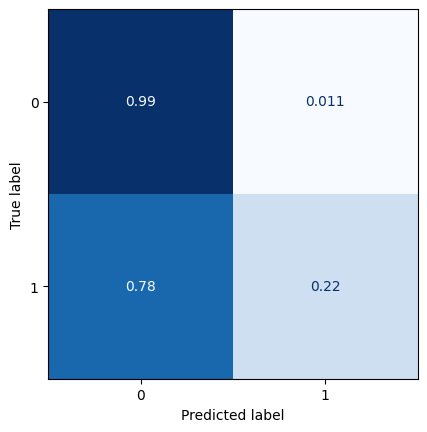

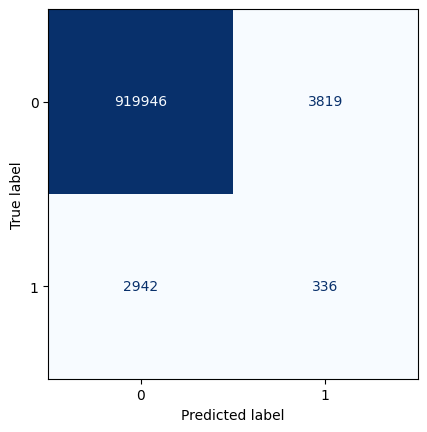

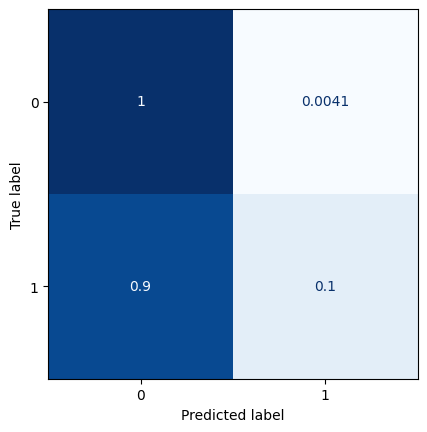

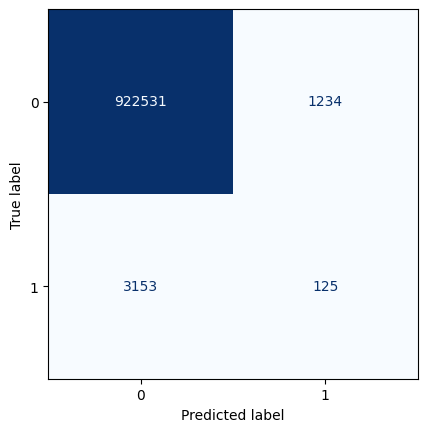

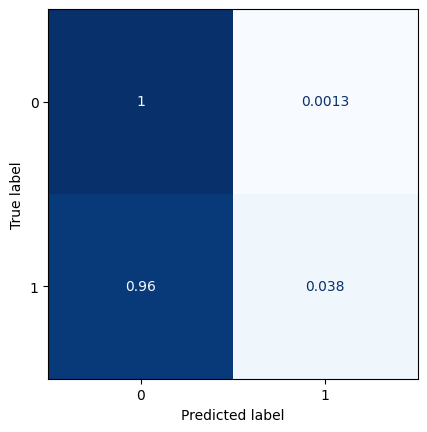

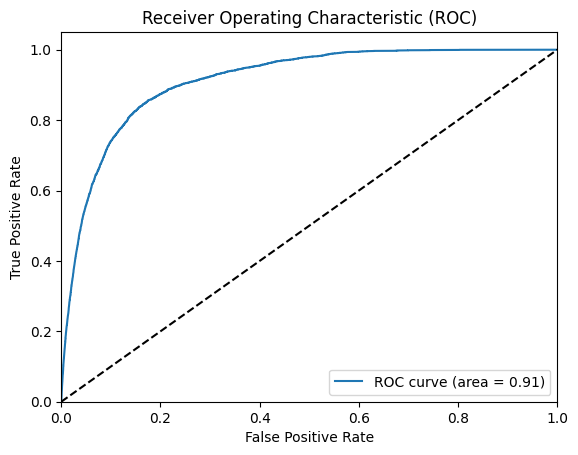

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.003438330904957145
78/78 [==============================] - 0s 2ms/step
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_31 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_10 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 14, 30, 1)   

2023-06-26 11:53:58.261668: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0441

2023-06-26 11:54:01.347694: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0441 - val_loss: 0.0207
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0198
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0197
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0194
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0191
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0191
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0191
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0192
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0189
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0188
E

2023-06-26 11:55:23.439823: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


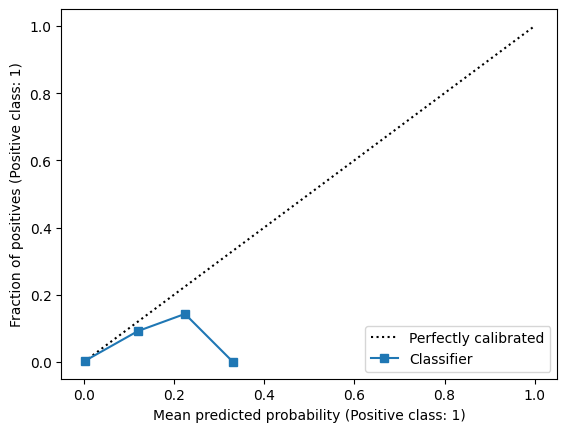

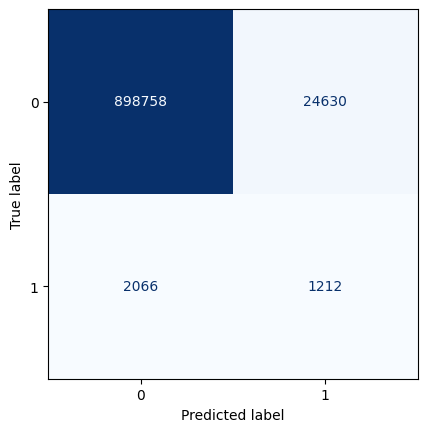

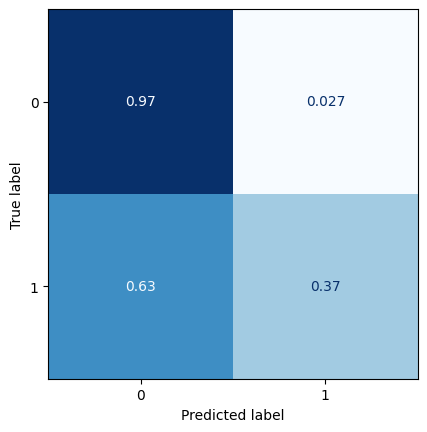

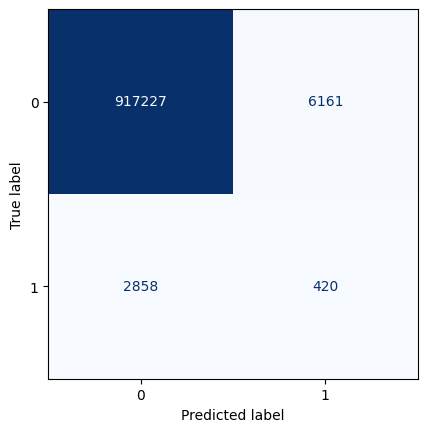

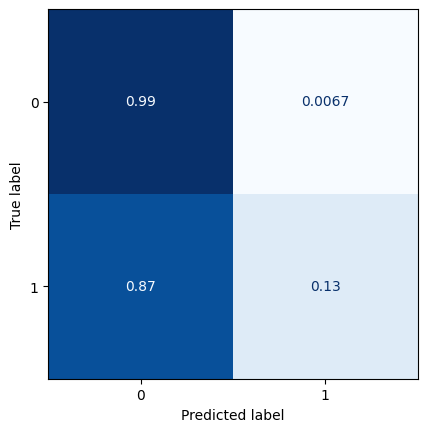

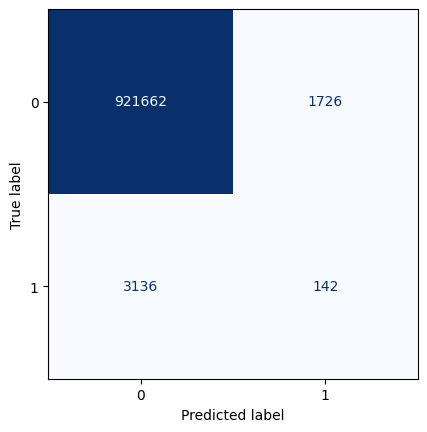

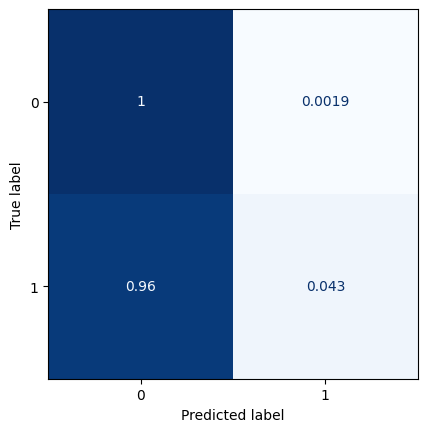

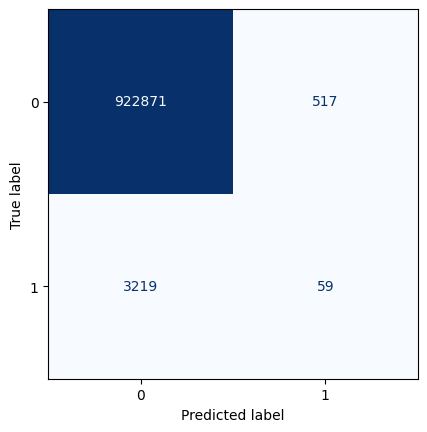

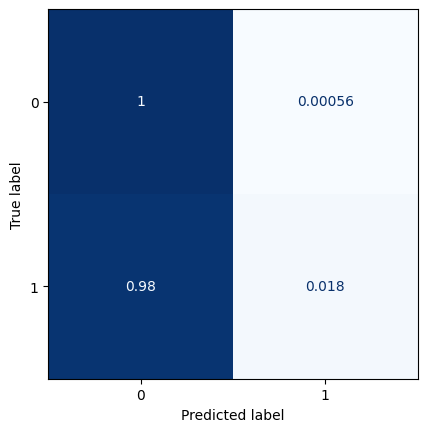

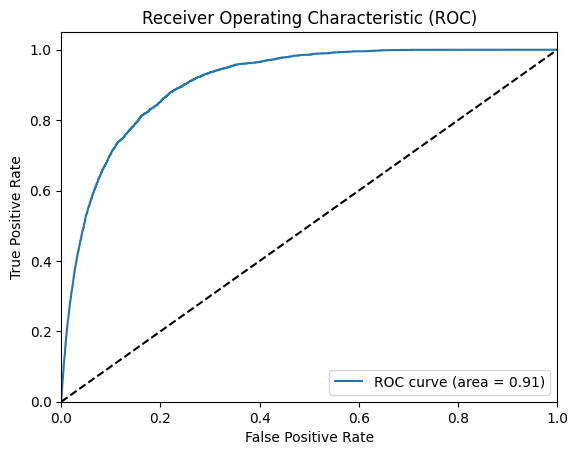

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.003448559817683936
78/78 [==============================] - 0s 3ms/step
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_34 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_11 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_35 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 11:55:49.169339: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0505

2023-06-26 11:55:52.312611: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0505 - val_loss: 0.0221
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0235 - val_loss: 0.0209
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0202
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0205
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0199
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0199
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0196
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0198
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0197
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0196
E

2023-06-26 11:57:46.986591: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


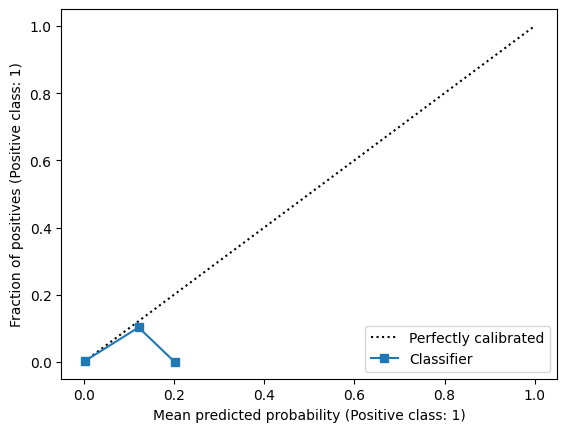

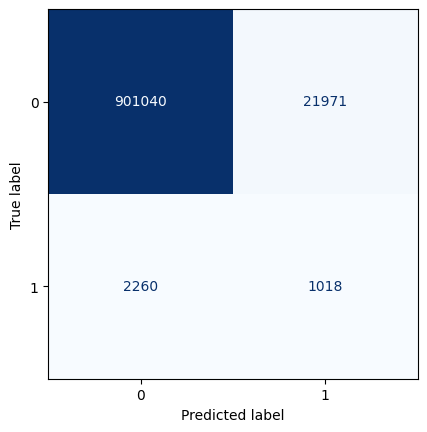

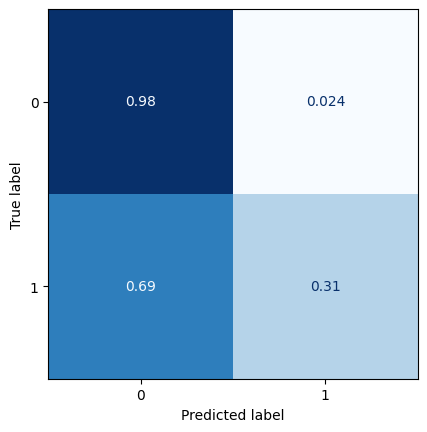

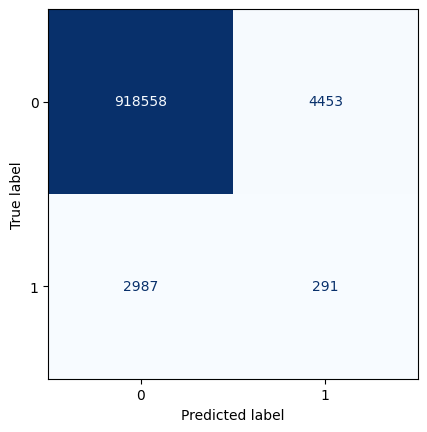

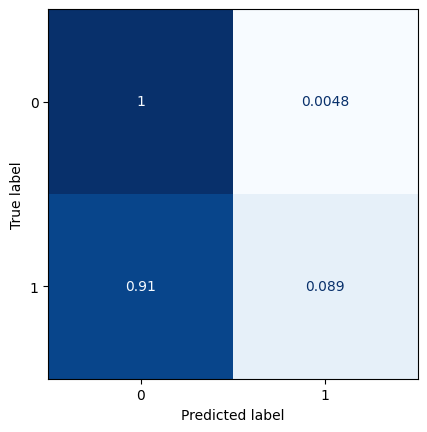

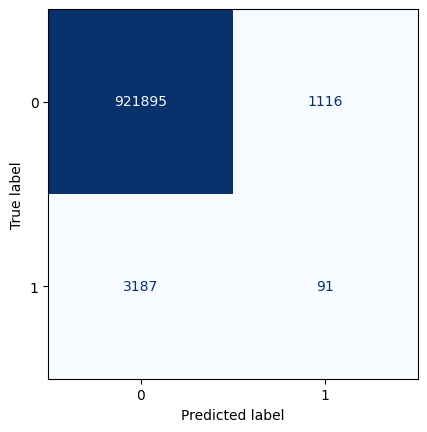

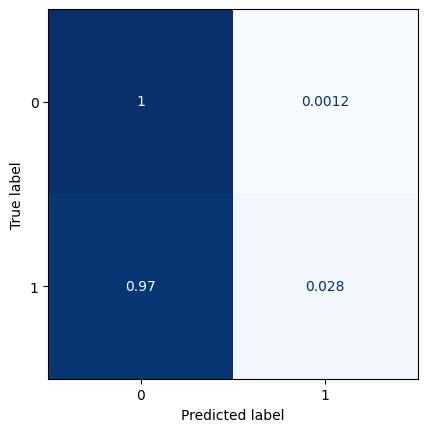

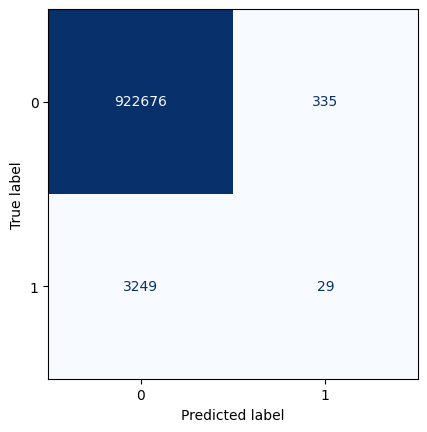

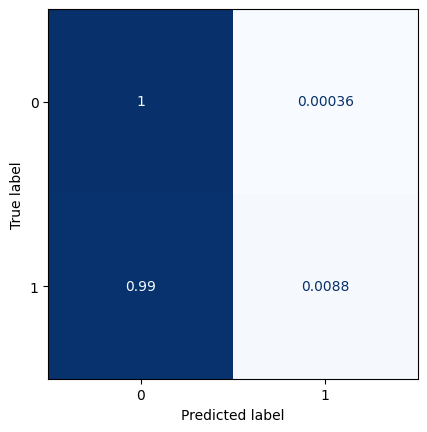

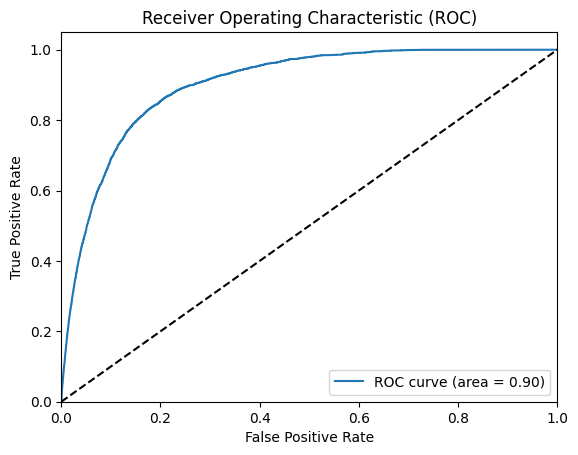

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.003461265407086071
78/78 [==============================] - 0s 2ms/step
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_12 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_38 (Conv2D)          (None, 14, 30, 1)  

2023-06-26 11:58:11.375870: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1034

2023-06-26 11:58:14.458578: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.1034 - val_loss: 0.0244
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0252 - val_loss: 0.0220
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0233 - val_loss: 0.0214
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0205
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0202
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0201
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0199
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0199
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0199
E

2023-06-26 12:00:04.987716: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


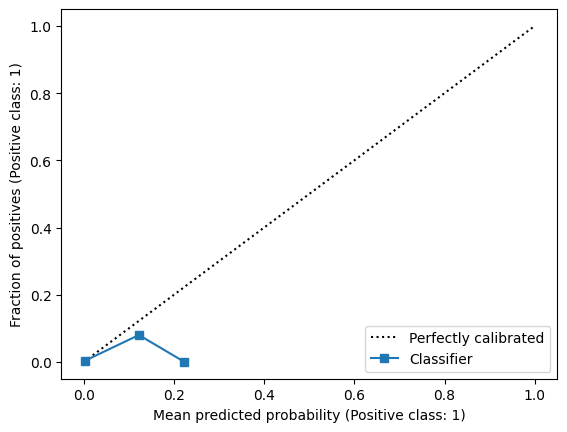

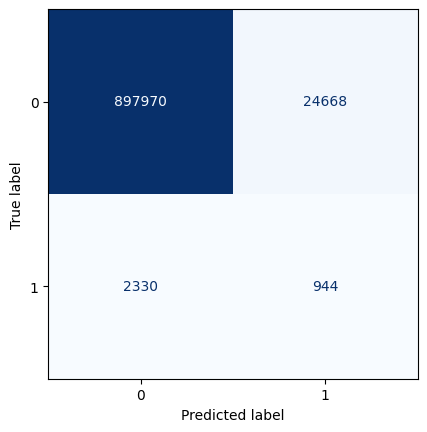

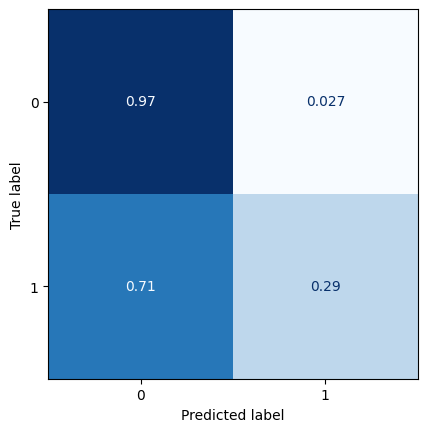

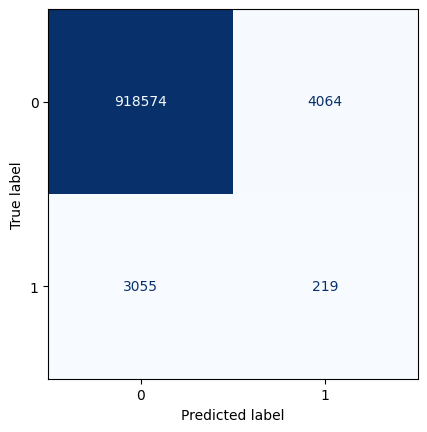

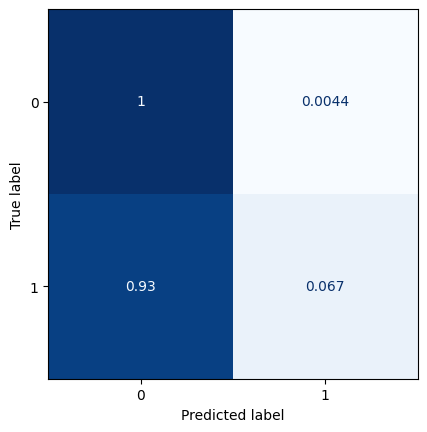

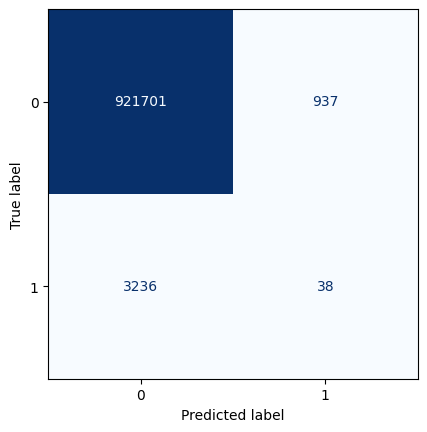

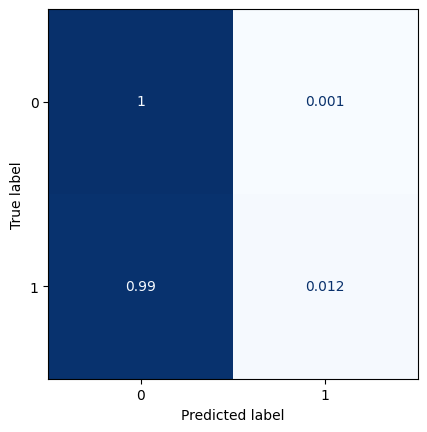

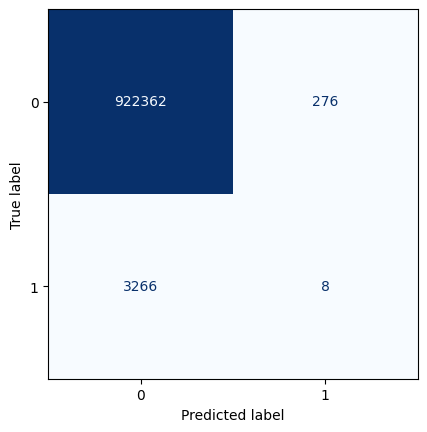

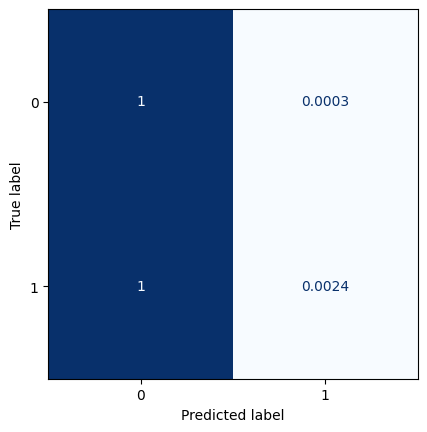

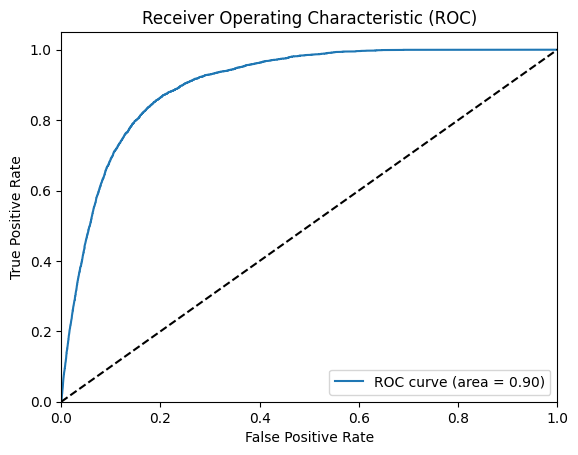

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.0034689988207007435
78/78 [==============================] - 0s 2ms/step
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_40 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_13 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 14, 30, 1)

2023-06-26 12:00:30.824213: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0380

2023-06-26 12:00:34.111446: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0380 - val_loss: 0.0226
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0232 - val_loss: 0.0213
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0223 - val_loss: 0.0206
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0204
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0202
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0203
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0201
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0198
Epoch 9/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0211 - val_loss: 0.0201
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0199


2023-06-26 12:02:28.927714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


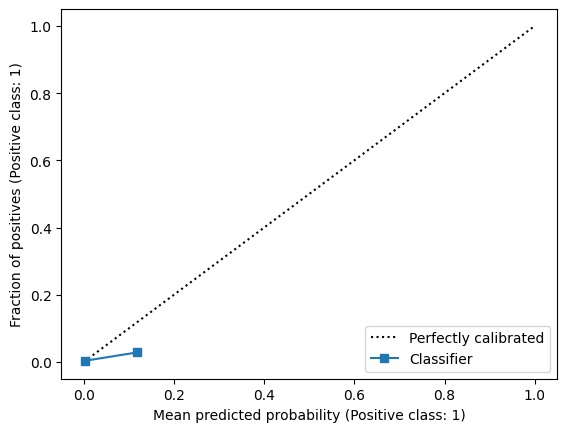

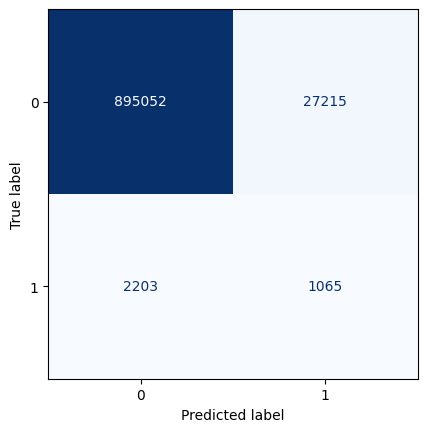

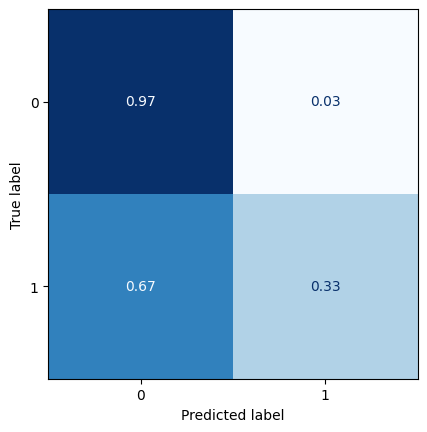

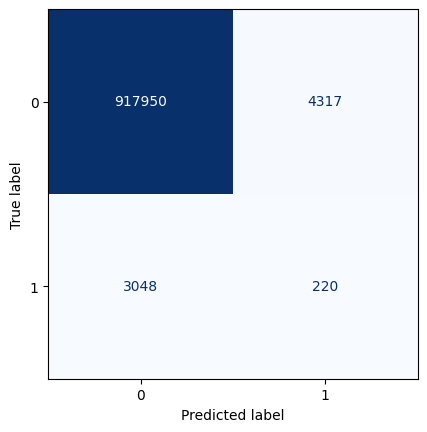

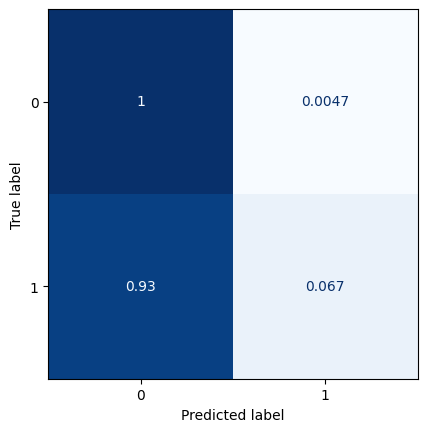

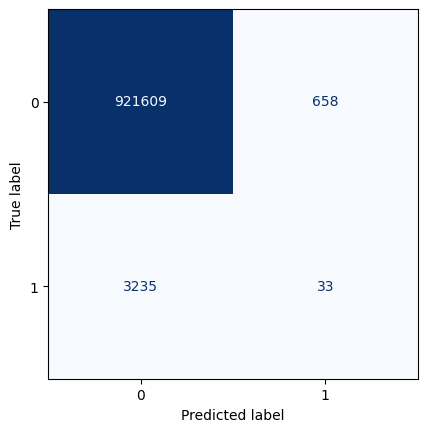

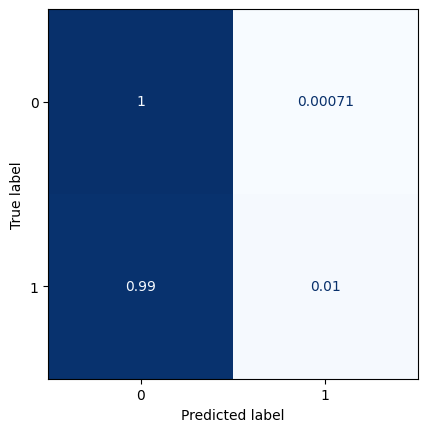

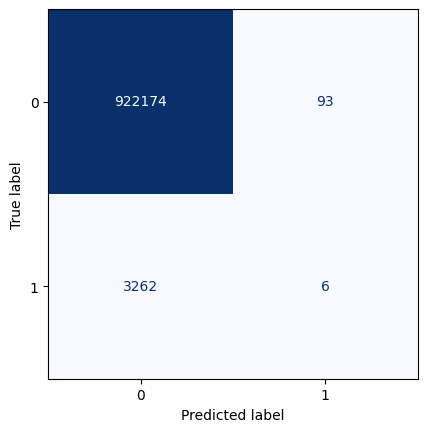

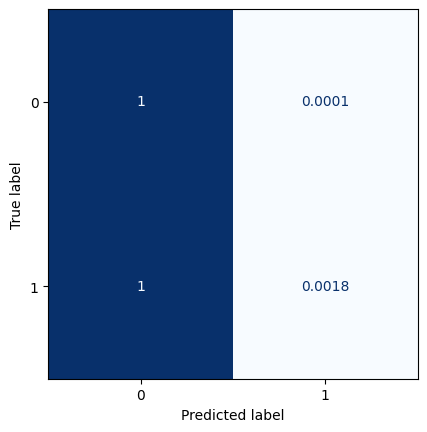

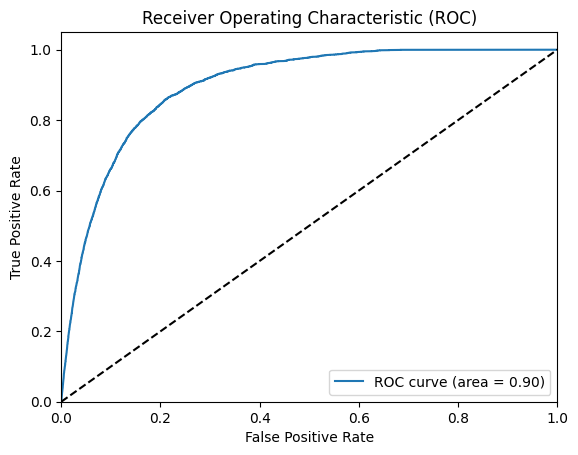

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.003461330989346289
78/78 [==============================] - 0s 3ms/step
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_43 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_14 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_44 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 12:02:56.526085: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0511

2023-06-26 12:02:59.618393: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0511 - val_loss: 0.0235
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0238 - val_loss: 0.0215
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0226 - val_loss: 0.0208
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0207
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0206
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0204
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0203
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0200
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0201
E

2023-06-26 12:05:34.702736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


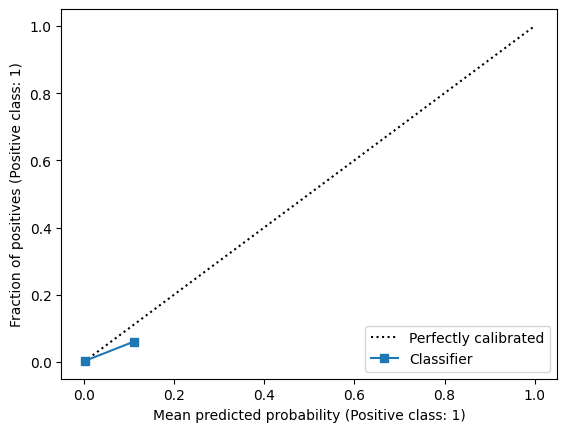

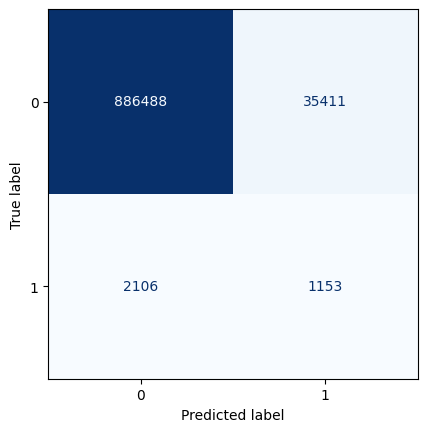

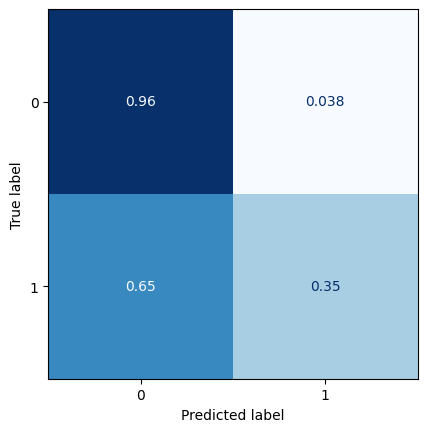

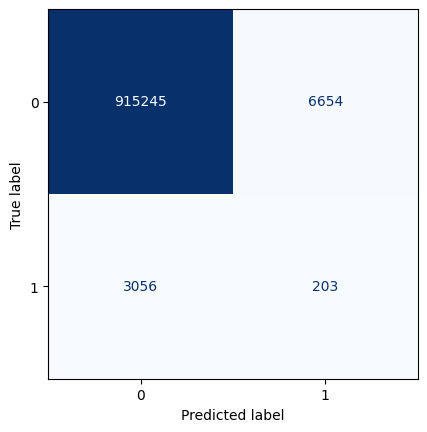

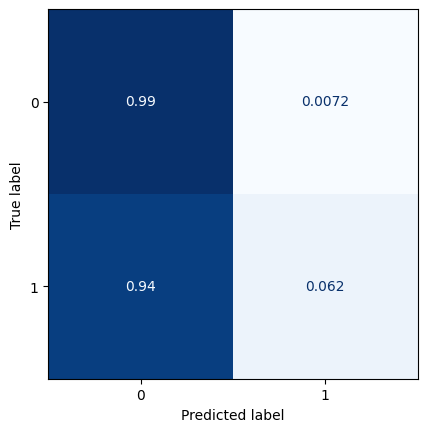

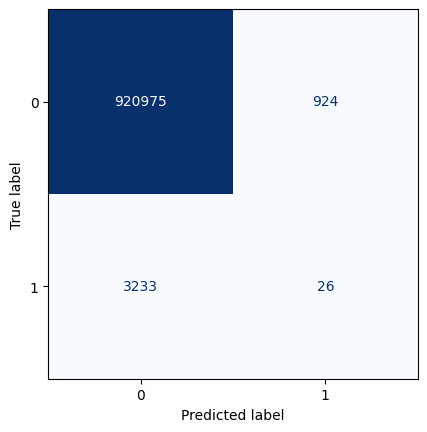

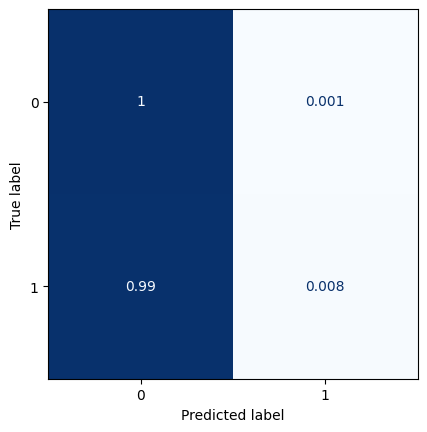

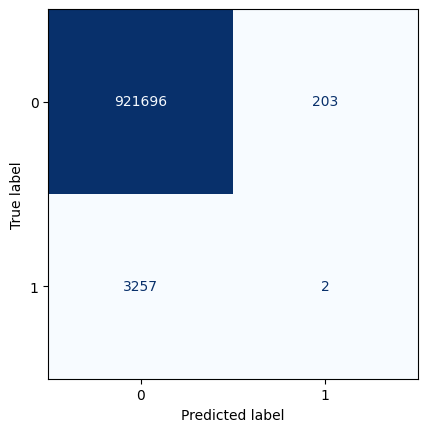

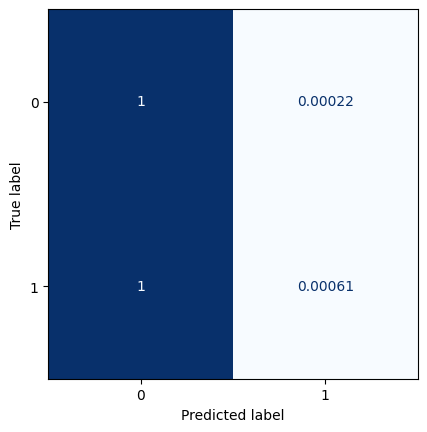

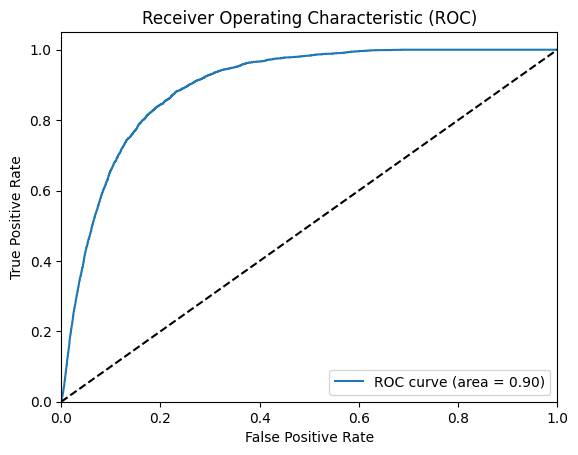

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.0034685254994839348
78/78 [==============================] - 0s 3ms/step
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_45 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_46 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_15 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_47 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 12:06:00.416047: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0520

2023-06-26 12:06:03.431334: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0520 - val_loss: 0.0243
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0248 - val_loss: 0.0222
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0232 - val_loss: 0.0214
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0217
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0208
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0209
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0203
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0202
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0201
E

2023-06-26 12:07:53.259336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


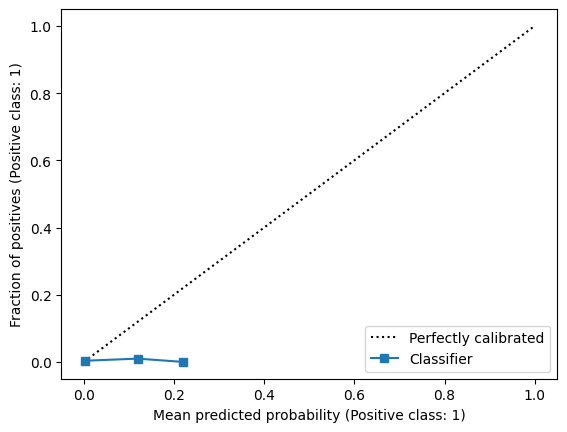

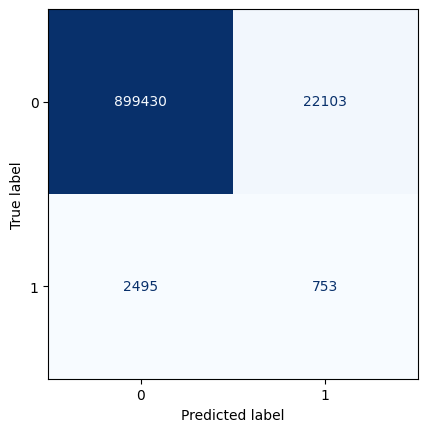

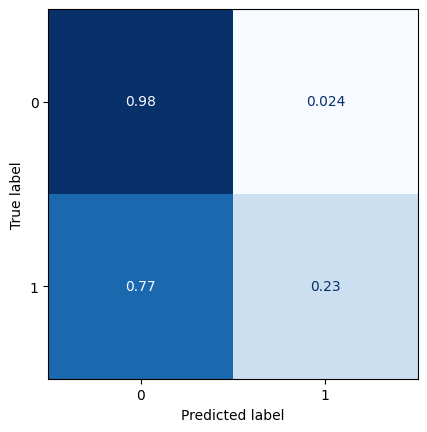

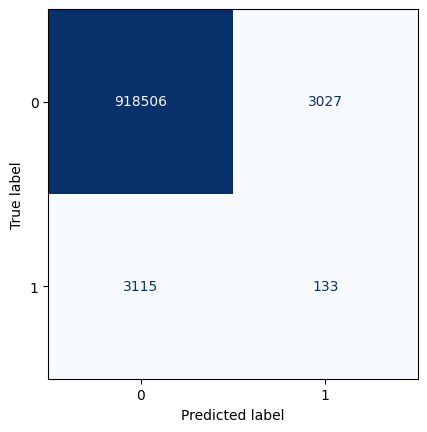

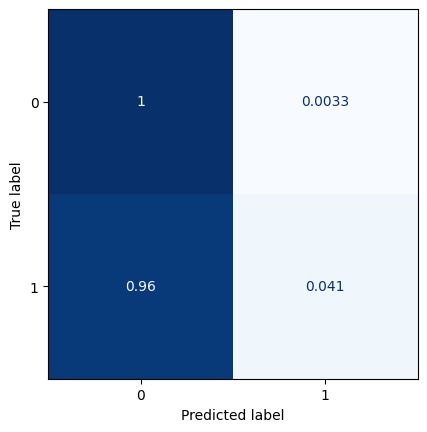

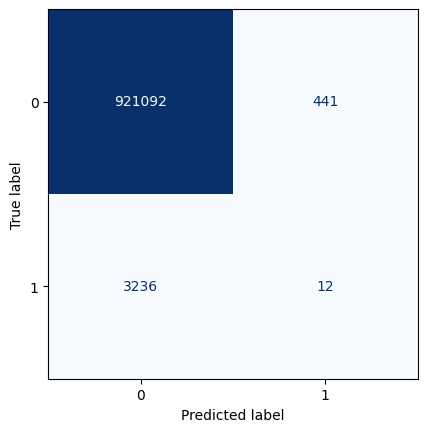

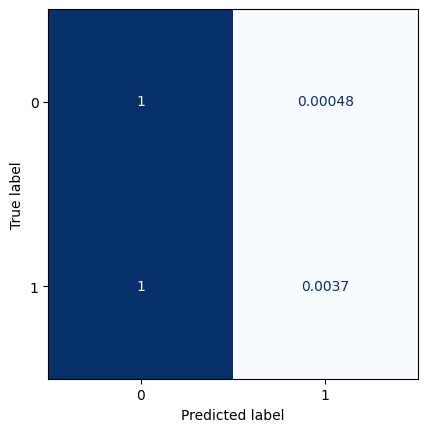

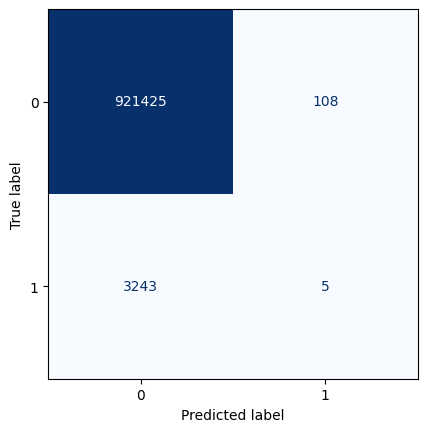

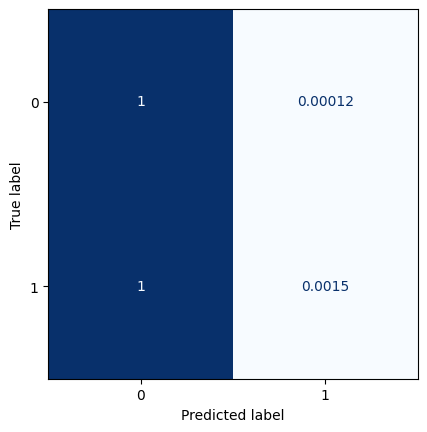

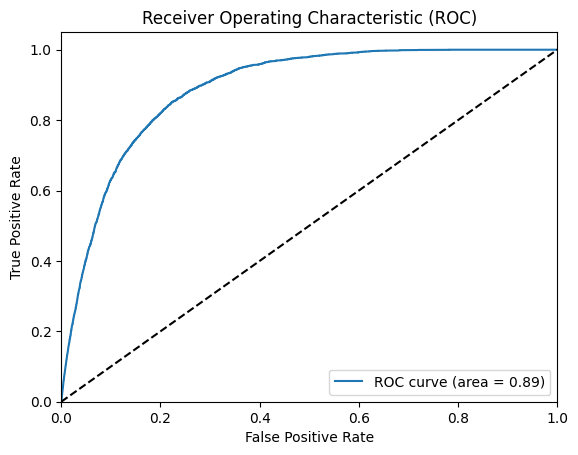

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.0034566667615264653


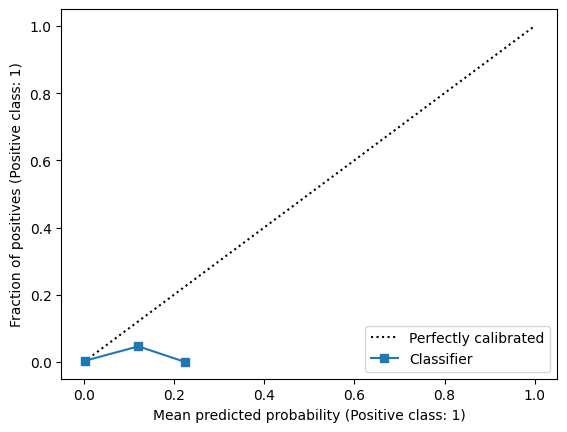

In [30]:
for lag in [2,3,4,5,6,7,8,9,10,11,12,13]:
    
    t_train = model.predict(train_img_std_Pred0)
    t_val = model.predict(val_img_std_Pred0)
    t_test = model.predict(test_img_std_Pred0)
    
    train_img_std_Pred0 = np.concatenate((t_train,train_img_std),axis=3)
    val_img_std_Pred0 = np.concatenate((t_val,val_img_std),axis=3)
    test_img_std_Pred0 = np.concatenate((t_test,test_img_std),axis=3)
    
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 10)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))
    
    #model.add(layers.Flatten())
    
    #model.add(layers.Reshape((2,4,16)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)

    model.fit(train_img_std_Pred0[:-lag], y_train_img[lag:], validation_data=(val_img_std_Pred0[:-lag],y_val_img[lag:]),
        callbacks=[monitor],epochs=100)
    
    t = model.predict(test_img_std_Pred0[:-lag])

    ranges = [0.025,0.05,0.075,0.1]

    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    
    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag:].reshape(-1,1))

    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    test.to_csv("test_with_newTarget_predictions_target1.csv")

    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), np.zeros(len(y_test_img[lag:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1))}')
    

In [31]:
pd.read_csv('test_with_newTarget_predictions_target1.csv')

,Unnamed: 0.1,Unnamed: 0,time,latitude,longitude,vo,r,u_200,u_850,v_200,v_850,ttr,sst,new_target,Real_tom_target,shear,target,predictions_lag0,predictions_lag1,predictions_lag2,predictions_lag3,predictions_lag4,predictions_lag5,predictions_lag6,predictions_lag7,predictions_lag8,predictions_lag9,predictions_lag10,predictions_lag11,predictions_lag12,predictions_lag13
0,34307,34307,2016-04-01,0.0,20.0,0.238973,1.386669,-0.945404,1.574206,0.511504,0.367981,2.652010,-1.588255,0.0,0.0,-0.516292,0,3.420953e-05,0.000109,1.465528e-06,0.000046,0.000022,0.000340,3.579008e-05,0.000167,0.000502,3.595067e-06,0.000515,4.784698e-06,5.254455e-05,0.000029
1,34308,34308,2016-04-01,0.0,22.5,-0.172396,1.196522,-0.819827,1.371793,0.717349,0.332262,3.396515,-1.588255,0.0,0.0,-0.755886,0,1.868647e-06,0.000010,1.040578e-07,0.000004,0.000001,0.000039,3.827882e-07,0.000018,0.000018,8.337664e-08,0.000016,4.152438e-07,4.677094e-07,0.000002
2,34309,34309,2016-04-01,0.0,25.0,1.188889,1.166772,-0.571398,1.173488,0.662464,0.144802,4.092788,-1.588255,0.0,0.0,-1.161314,0,4.096266e-07,0.000007,4.568987e-08,0.000003,0.000001,0.000042,2.537361e-07,0.000005,0.000005,3.963972e-08,0.000021,1.615393e-06,3.638270e-07,0.000002
3,34310,34310,2016-04-01,0.0,27.5,-0.649707,1.063899,-0.385753,0.812011,0.713230,0.584284,4.044557,-1.588255,0.0,0.0,-1.507685,0,2.601000e-07,0.000010,1.365608e-07,0.000005,0.000002,0.000060,3.765665e-07,0.000003,0.000004,6.108691e-09,0.000004,3.231481e-06,8.445667e-08,0.000005
4,34311,34311,2016-04-01,0.0,30.0,-0.629183,1.432846,-0.362931,0.809212,0.888739,-0.207576,3.438931,-1.588255,0.0,0.0,-1.154385,0,3.594609e-07,0.000016,3.240423e-07,0.000011,0.000003,0.000088,5.023594e-07,0.000005,0.000007,1.028899e-08,0.000002,6.788830e-06,1.244083e-07,0.000009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929677,963984,137600,2022-12-31,-30.0,80.0,0.677806,-1.271307,0.290892,-0.727302,0.813190,-0.684904,-0.431475,0.601392,0.0,0.0,0.050674,0,1.159324e-03,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000
929678,963985,137601,2022-12-31,-30.0,82.5,0.898493,-1.325164,0.224460,-0.764678,1.178495,-0.105389,-0.107881,0.599524,0.0,0.0,0.004080,0,5.650125e-04,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000
929679,963986,137602,2022-12-31,-30.0,85.0,1.629797,-1.468220,0.376651,-0.566606,1.728863,0.450626,-0.082227,0.597113,0.0,0.0,0.220205,0,1.308723e-04,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000
929680,963987,137603,2022-12-31,-30.0,87.5,0.280770,-1.453315,0.621629,-0.446284,2.368318,0.792994,-0.000815,0.594579,0.0,0.0,0.648118,0,3.861593e-04,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000


## Model with all days before as input

### Lag 0-1-2

In [58]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 9)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=10, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 13, 29, 8)         656       
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_70 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_23 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_71 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_23 (Cropping2D)  (None, 13, 29, 1)       

In [59]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=100)


Epoch 1/100


2023-06-26 15:32:42.860685: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0423

2023-06-26 15:32:46.410782: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0423 - val_loss: 0.0131
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0142 - val_loss: 0.0104
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0123 - val_loss: 0.0096
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0117 - val_loss: 0.0093
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0113 - val_loss: 0.0094
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0110 - val_loss: 0.0089
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0107 - val_loss: 0.0088
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0105 - val_loss: 0.0087
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0103 - val_loss: 0.0084
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0101 - val_loss: 0.0083


59/78 [=====================>........] - ETA: 0s

2023-06-26 15:34:57.939291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step


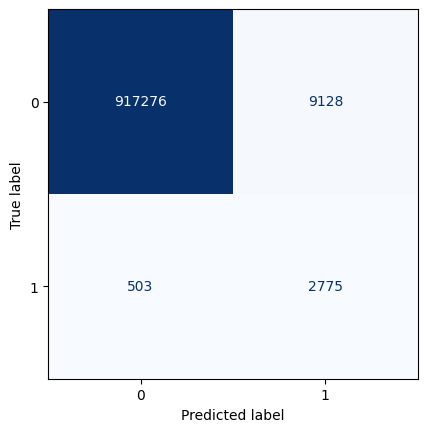

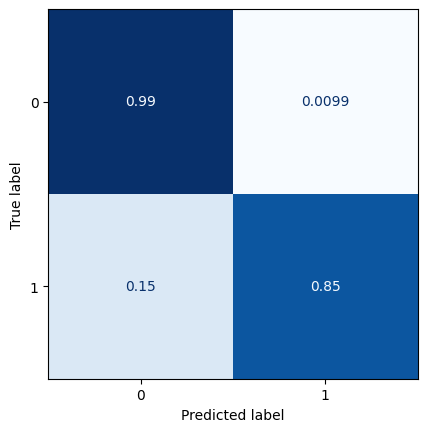

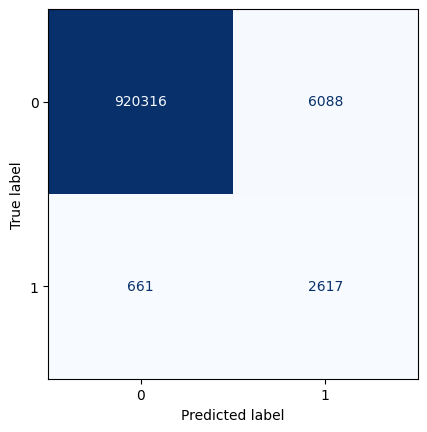

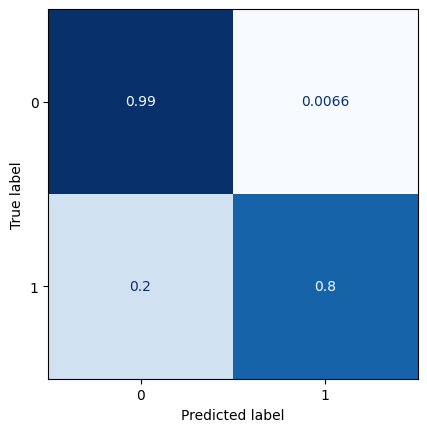

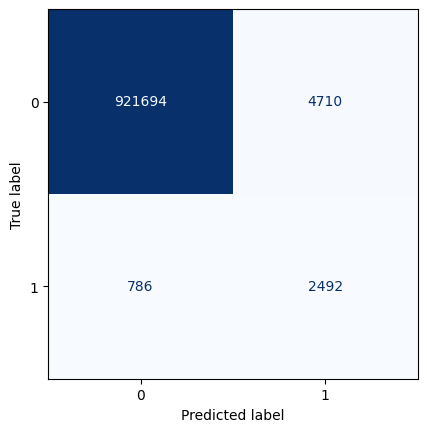

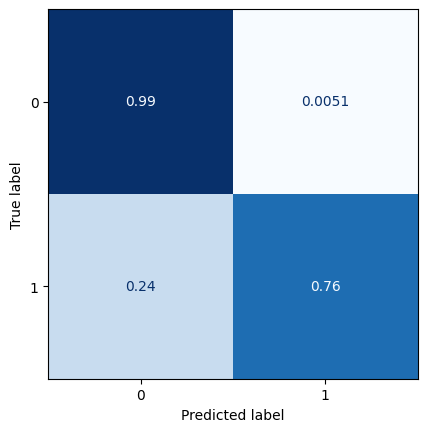

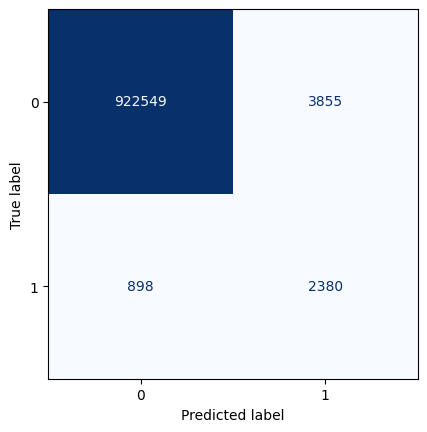

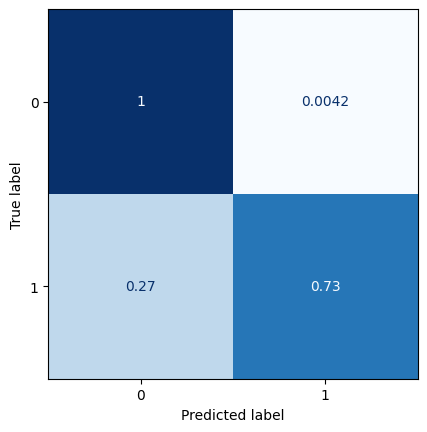

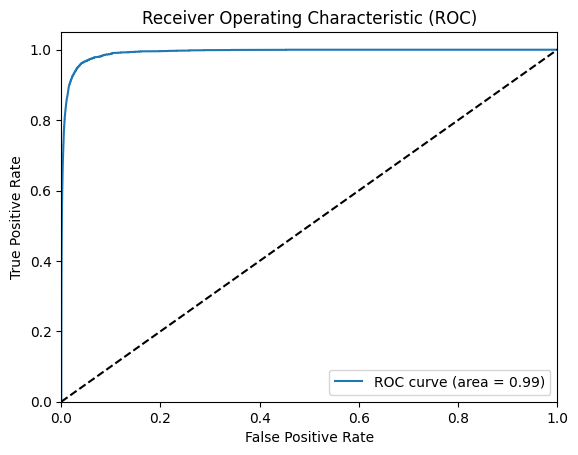

All zeros Brier score: 0.0035259368257102965
Model Brier score: 0.0021690262634060484


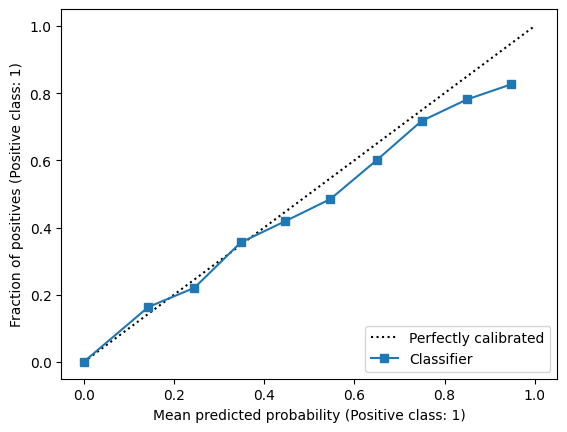

In [60]:
t = model.predict(test_img_std)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

### ROC
plot_roc(t.reshape(-1,1),y_test_img.reshape(-1,1))

test = test.iloc[:,:17]
test['predictions_lag'+str(0)] = t.reshape(-1,1)
test.to_csv("test_with_newTarget_predictions_targetAll.csv")

### calibration
display = CalibrationDisplay.from_predictions(y_test_img.reshape(-1,1), t.reshape(-1,1), n_bins=10)
print(f'All zeros Brier score: {brier_score_loss(y_test_img.reshape(-1,1), np.zeros(len(y_test_img.reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img.reshape(-1,1), t.reshape(-1,1))}')


In [61]:
t_train = model.predict(train_img_std)
t_val = model.predict(val_img_std)
t_test = model.predict(test_img_std)

train_img_std_Pred0 = np.concatenate((t_train,train_img_std),axis=3)
val_img_std_Pred0 = np.concatenate((t_val,val_img_std),axis=3)
test_img_std_Pred0 = np.concatenate((t_test,test_img_std),axis=3)


78/78 [==============================] - 0s 3ms/step


In [62]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 10)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_73 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_24 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_74 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_24 (Cropping2D)  (None, 13, 29, 1)       

In [63]:
model.fit(train_img_std_Pred0[:-1], y_train_img[1:], validation_data=(val_img_std_Pred0[:-1],y_val_img[1:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100
  1/354 [..............................] - ETA: 1:59 - loss: 0.6624

2023-06-26 15:35:15.938724: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0472

2023-06-26 15:35:18.870489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0472 - val_loss: 0.0159
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0160 - val_loss: 0.0135
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0142 - val_loss: 0.0126
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0134 - val_loss: 0.0120
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0129 - val_loss: 0.0119
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0126 - val_loss: 0.0115
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0124 - val_loss: 0.0113
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0122 - val_loss: 0.0110
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0120 - val_loss: 0.0111
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0119 - val_loss: 0.0109
E

58/78 [=====================>........] - ETA: 0s

2023-06-26 15:38:53.549701: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step


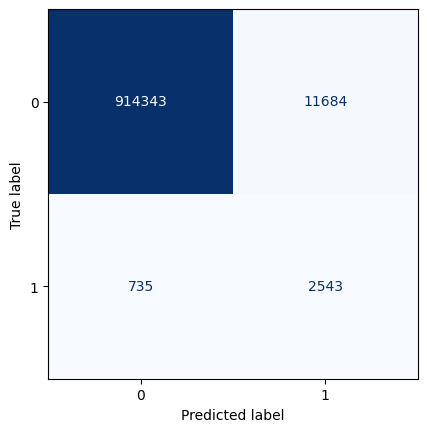

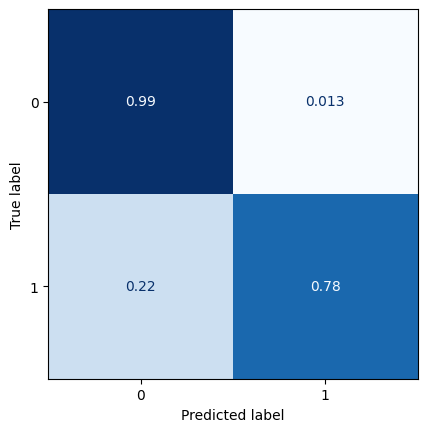

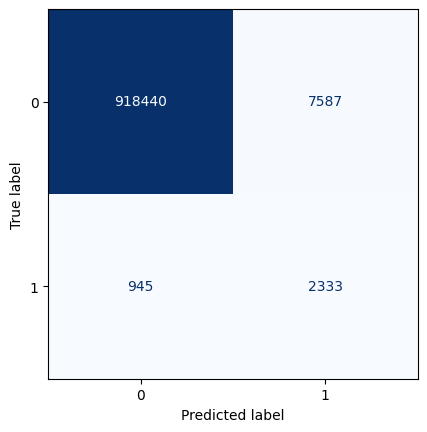

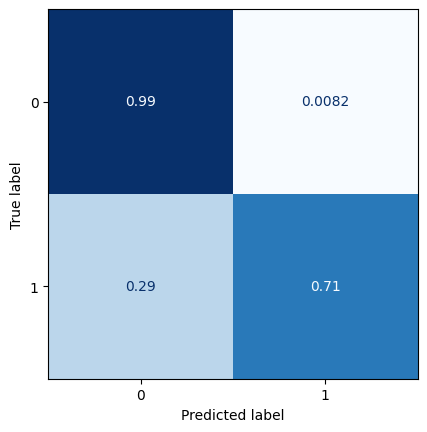

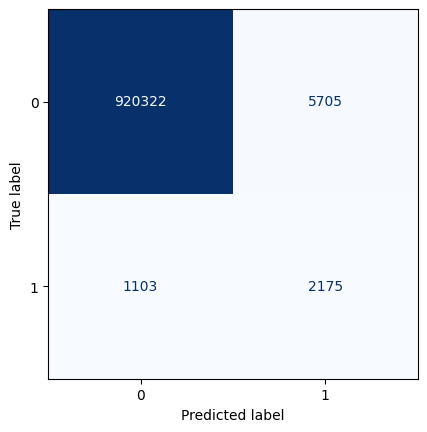

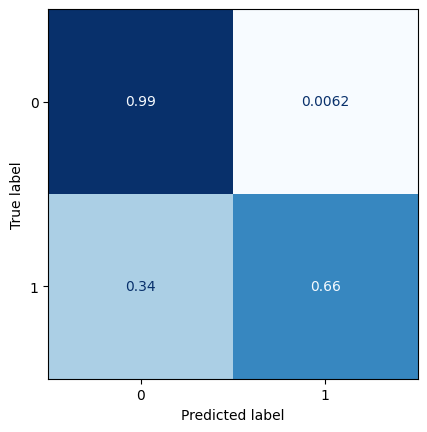

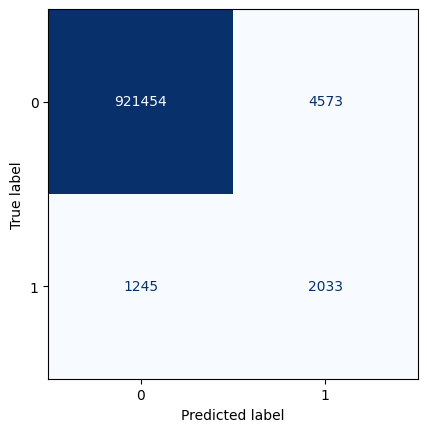

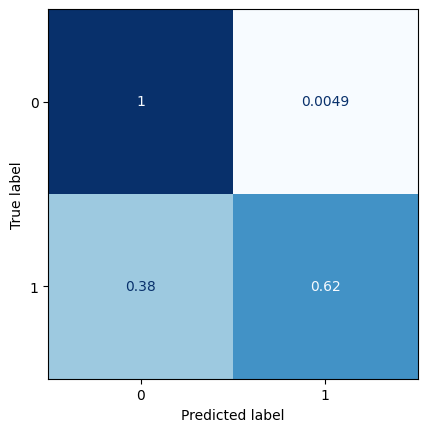

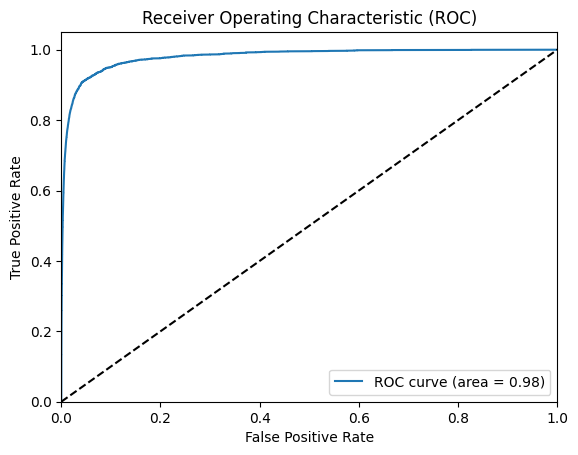

All zeros Brier score: 0.00352736722604527
Model Brier score: 0.0026323306655230095


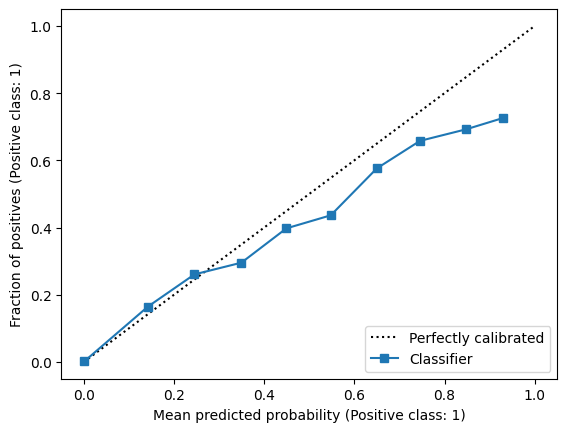

In [64]:
t = model.predict(test_img_std_Pred0[:-1])

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[1:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

### ROC
plot_roc(t.reshape(-1,1),y_test_img[1:].reshape(-1,1))

lag=1
z = np.zeros((lag,13,29,1))
tt = np.concatenate((t,z))
test['predictions_lag'+str(1)] = tt.reshape(-1,1)
test.to_csv("test_with_newTarget_predictions_targetAll.csv")

### calibration
display = CalibrationDisplay.from_predictions(y_test_img[1:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
print(f'All zeros Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), np.zeros(len(y_test_img[1:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), t.reshape(-1,1))}')


In [66]:
t_train = model.predict(train_img_std_Pred0)
t_val = model.predict(val_img_std_Pred0)
t_test = model.predict(test_img_std_Pred0)

train_img_std_Pred0 = np.concatenate((t_train,train_img_std_Pred0),axis=3)
val_img_std_Pred0 = np.concatenate((t_val,val_img_std_Pred0),axis=3)
test_img_std_Pred0 = np.concatenate((t_test,test_img_std_Pred0),axis=3)


78/78 [==============================] - 0s 3ms/step


In [68]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 11)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 13, 29, 8)         800       
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_76 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_25 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_77 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 
 cropping2d_25 (Cropping2D)  (None, 13, 29, 1)       

In [69]:
model.fit(train_img_std_Pred0[:-2], y_train_img[2:], validation_data=(val_img_std_Pred0[:-2],y_val_img[2:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-06-26 15:49:43.068536: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0291

2023-06-26 15:49:46.566418: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0291 - val_loss: 0.0162
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0169 - val_loss: 0.0148
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0158 - val_loss: 0.0144
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0152 - val_loss: 0.0139
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0149 - val_loss: 0.0138
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0146 - val_loss: 0.0152
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0144 - val_loss: 0.0135
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0143 - val_loss: 0.0136
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0142 - val_loss: 0.0135
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0141 - val_loss: 0.0136
E

37/77 [=============>................] - ETA: 0s

2023-06-26 15:52:32.536560: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


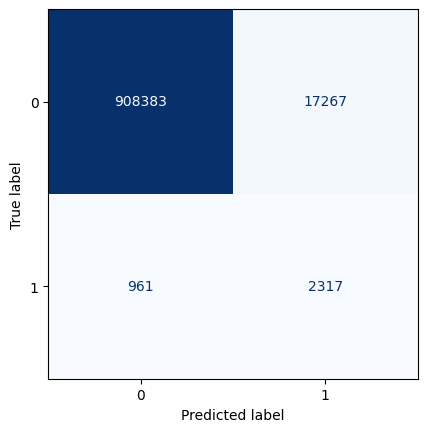

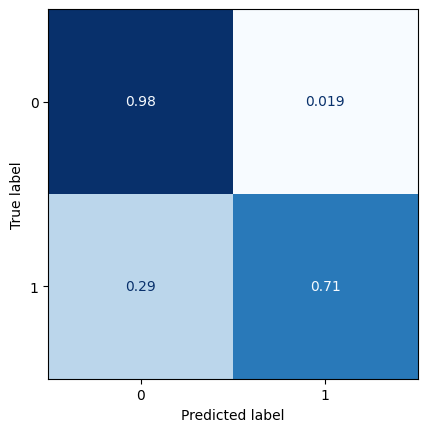

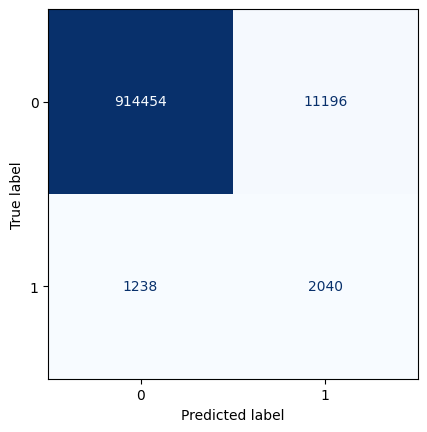

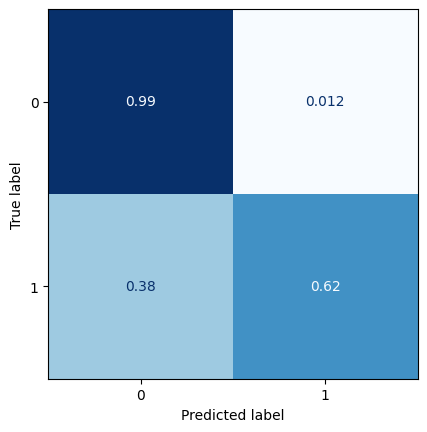

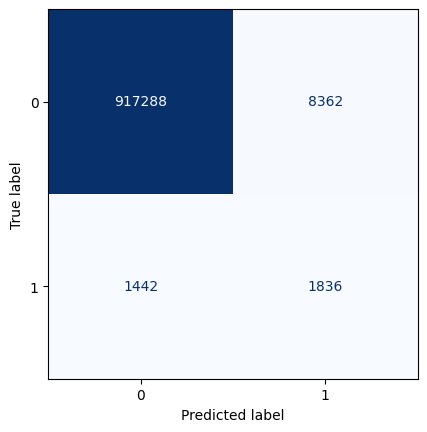

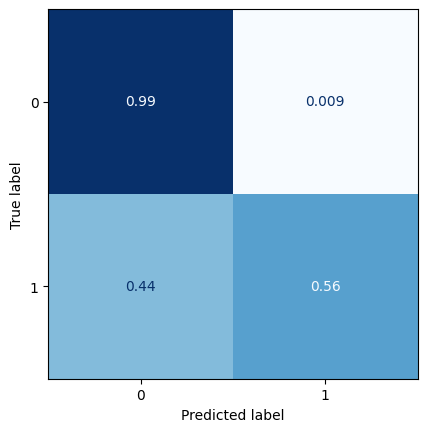

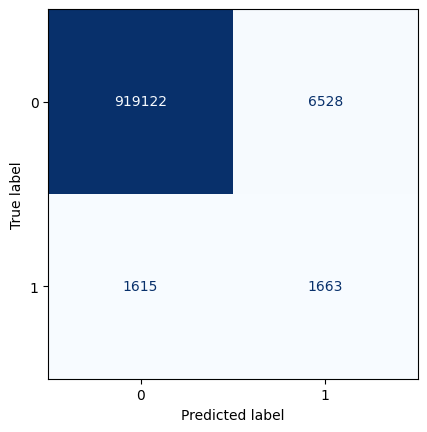

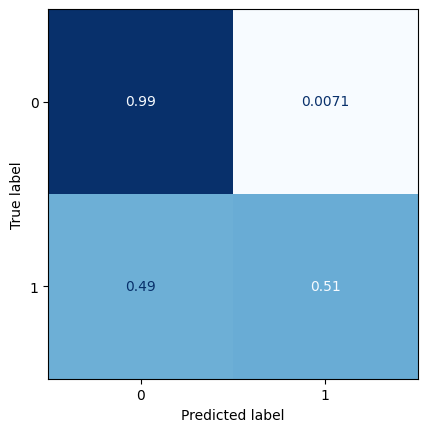

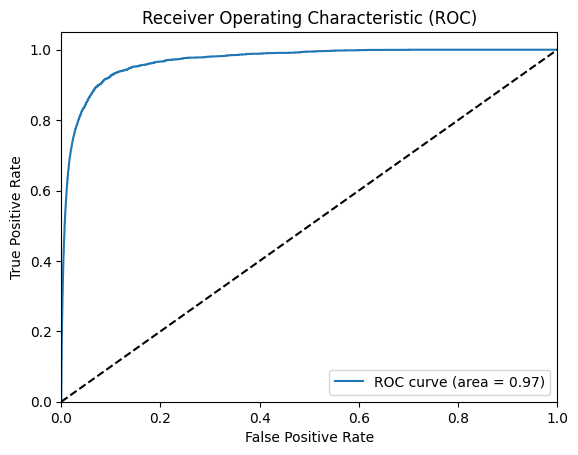

All zeros Brier score: 0.003528798787419477
Model Brier score: 0.0030658589382184342


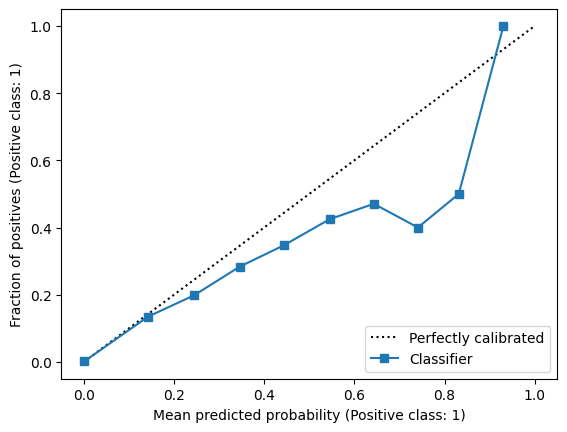

In [70]:
t = model.predict(test_img_std_Pred0[:-2])

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

    ConfusionMatrixDisplay(confusion_matrix(y_test_img[2:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img[2:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

### ROC
plot_roc(t.reshape(-1,1),y_test_img[2:].reshape(-1,1))

lag=2
z = np.zeros((lag,13,29,1))
tt = np.concatenate((t,z))
test['predictions_lag'+str(2)] = tt.reshape(-1,1)
test.to_csv("test_with_newTarget_predictions_targetAll.csv")

### calibration
display = CalibrationDisplay.from_predictions(y_test_img[2:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
print(f'All zeros Brier score: {brier_score_loss(y_test_img[2:].reshape(-1,1), np.zeros(len(y_test_img[2:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[2:].reshape(-1,1), t.reshape(-1,1))}')


 12/354 [>.............................] - ETA: 1s  

2023-06-26 16:08:00.172957: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 2ms/step
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 13, 29, 8)         872       
                                                                 
 max_pooling2d_26 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_79 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_26 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_80 (Conv2D)          (None, 14, 30, 1)         73        
                                                                 


2023-06-26 16:08:03.069898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0351

2023-06-26 16:08:06.417561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0351 - val_loss: 0.0182
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0168
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0175 - val_loss: 0.0161
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0170 - val_loss: 0.0157
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0166 - val_loss: 0.0155
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0163 - val_loss: 0.0154
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0161 - val_loss: 0.0154
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0160 - val_loss: 0.0155
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0159 - val_loss: 0.0156
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0158 - val_loss: 0.0155
E

2023-06-26 16:09:37.346728: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


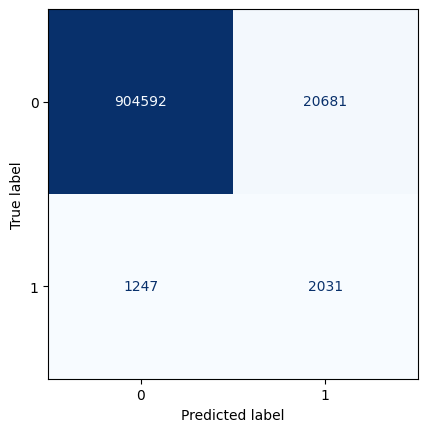

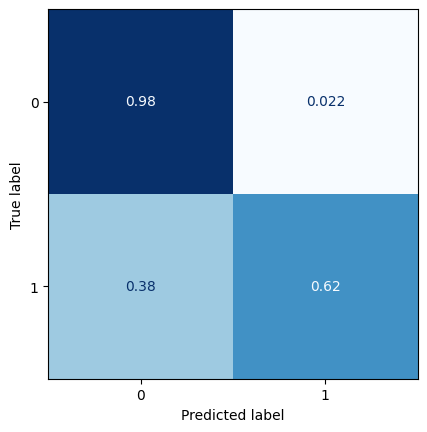

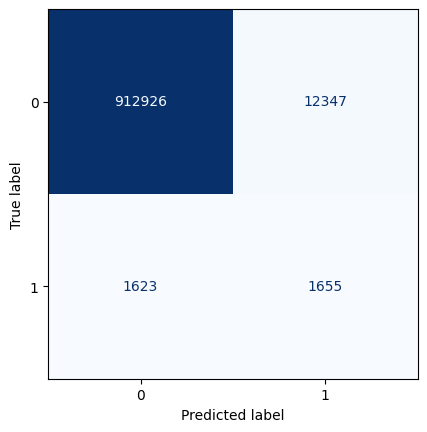

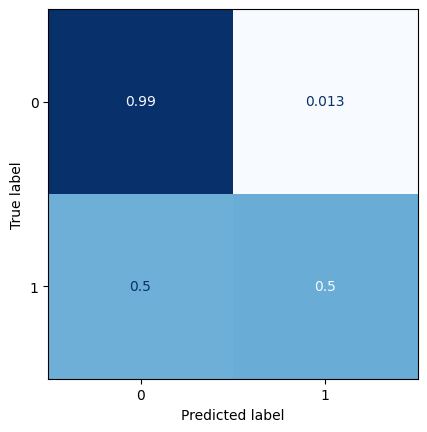

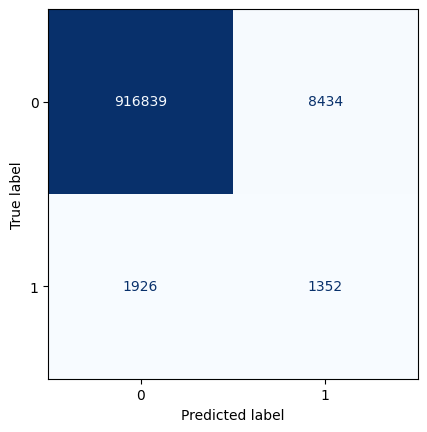

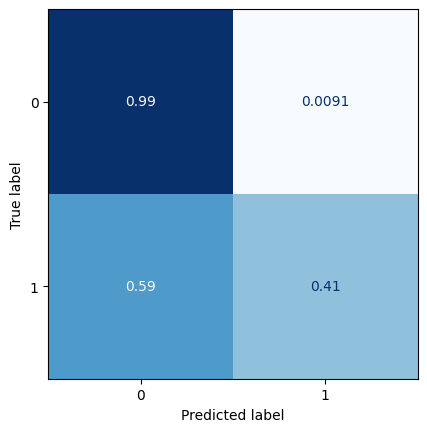

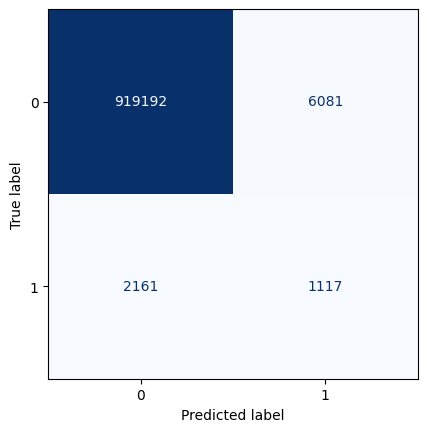

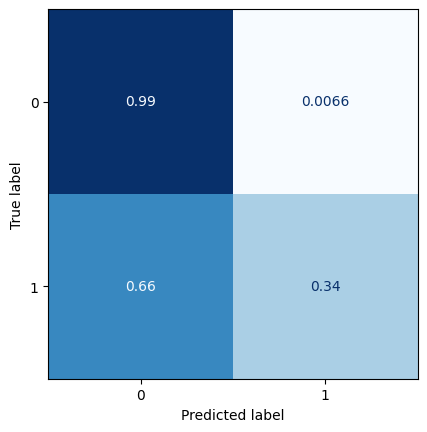

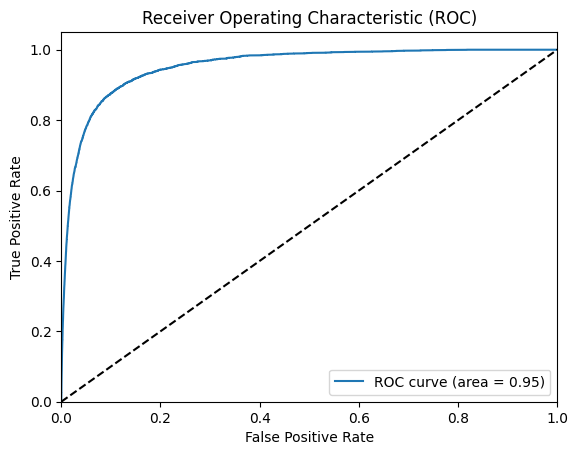

All zeros Brier score: 0.0035302315112470937
Model Brier score: 0.003246812871399955
78/78 [==============================] - 0s 2ms/step
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_81 (Conv2D)          (None, 13, 29, 8)         944       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_82 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_27 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_83 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 16:09:58.556765: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0379

2023-06-26 16:10:01.845313: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0379 - val_loss: 0.0193
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0183
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0191 - val_loss: 0.0179
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0186 - val_loss: 0.0173
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0183 - val_loss: 0.0178
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0181 - val_loss: 0.0171
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0179 - val_loss: 0.0171
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0178 - val_loss: 0.0171
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0177 - val_loss: 0.0170
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0176 - val_loss: 0.0169


2023-06-26 16:11:54.609917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


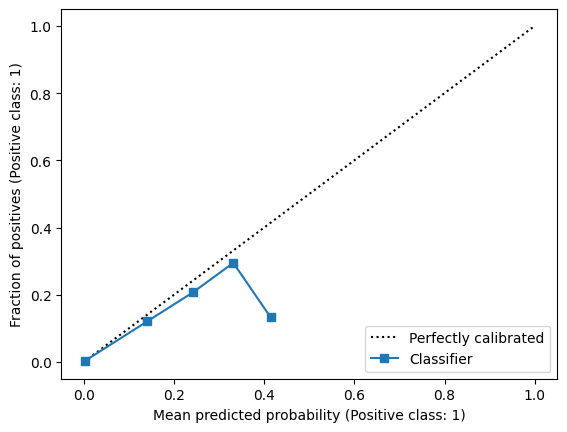

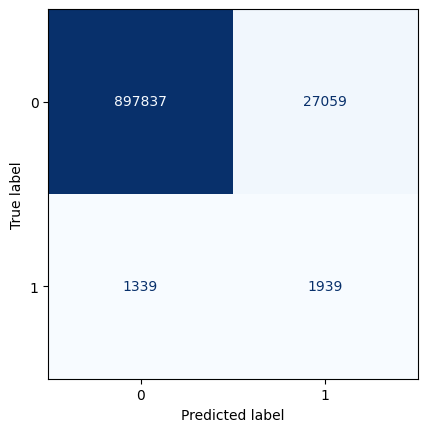

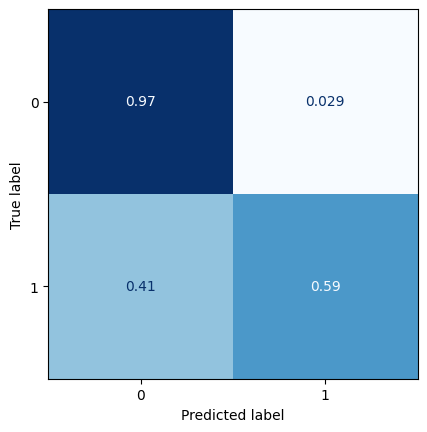

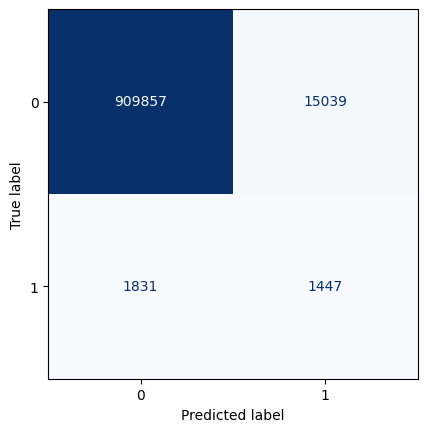

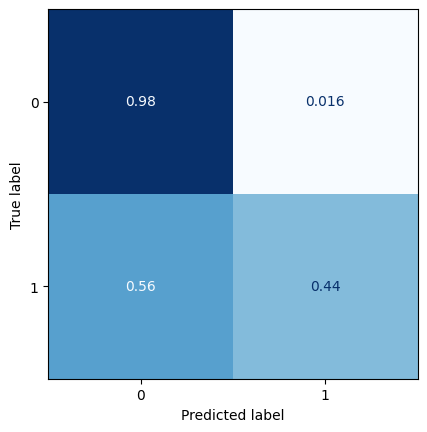

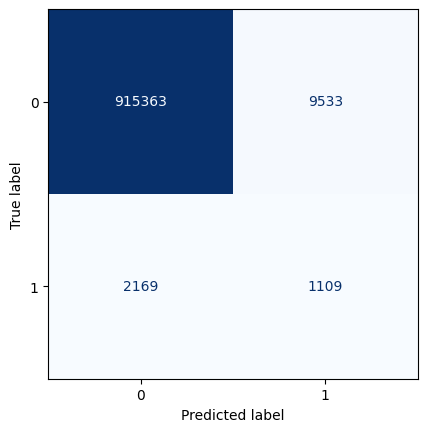

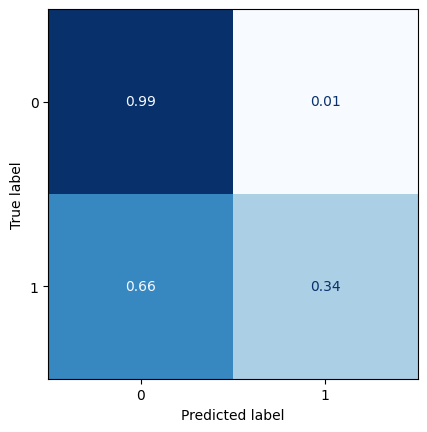

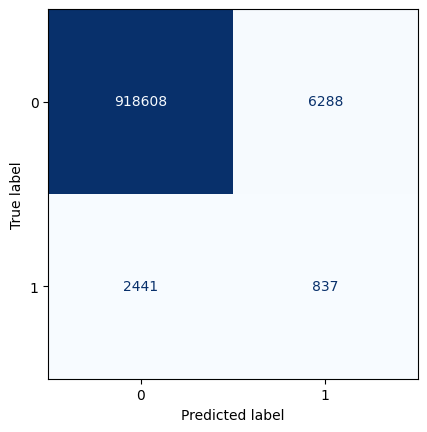

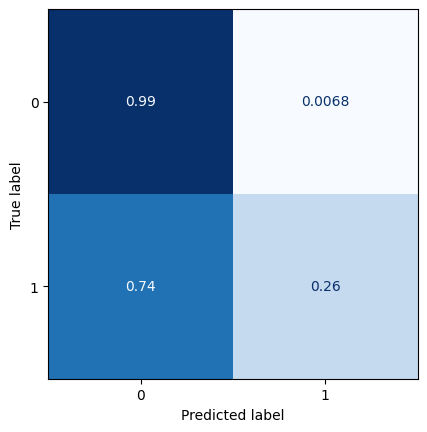

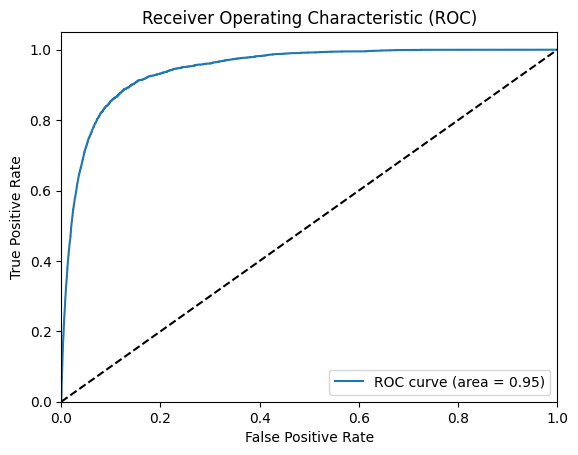

All zeros Brier score: 0.0035316653989445946
Model Brier score: 0.0033510474344775865
78/78 [==============================] - 0s 3ms/step
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 13, 29, 8)         1016      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_85 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_28 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_86 (Conv2D)          (None, 14, 30, 1)

2023-06-26 16:12:15.581472: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.1031

2023-06-26 16:12:18.849748: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.1031 - val_loss: 0.0206
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0194
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0192
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0185
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0194 - val_loss: 0.0183
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0192 - val_loss: 0.0183
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0190 - val_loss: 0.0182
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0189 - val_loss: 0.0181
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0188 - val_loss: 0.0182
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0187 - val_loss: 0.0183
E

2023-06-26 16:14:43.002127: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


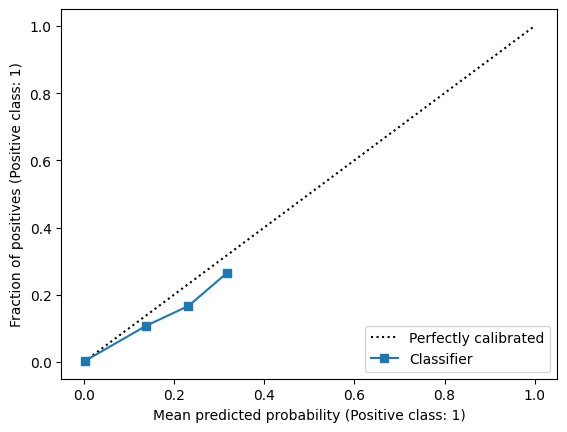

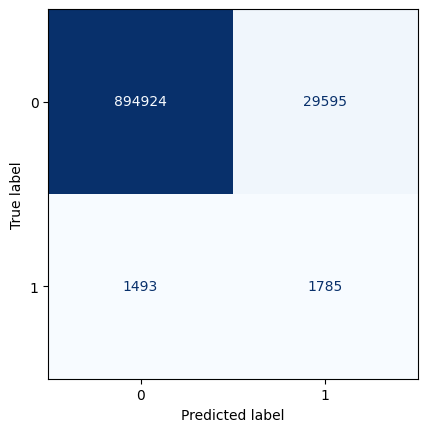

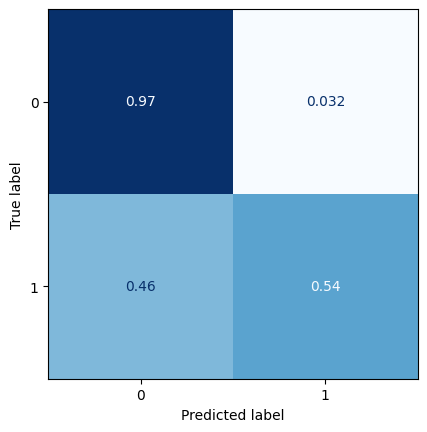

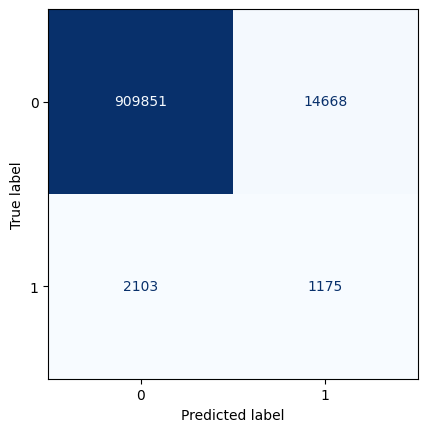

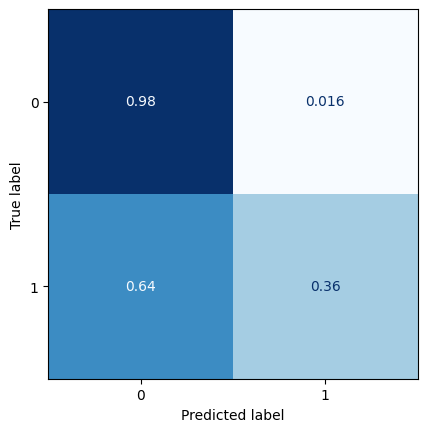

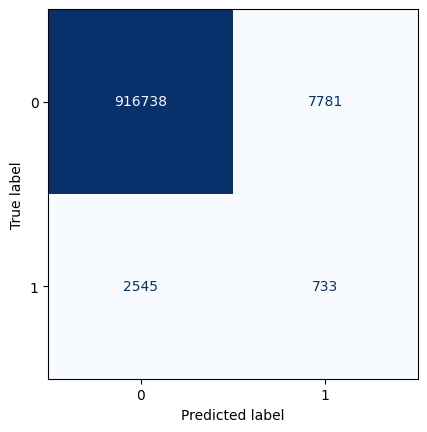

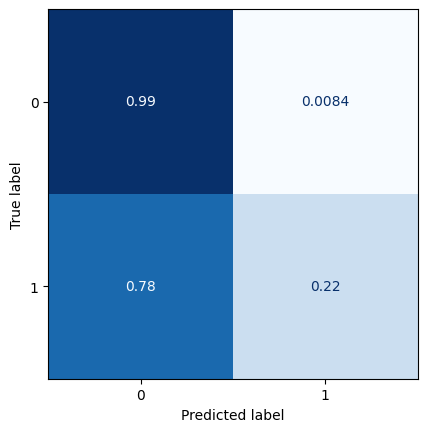

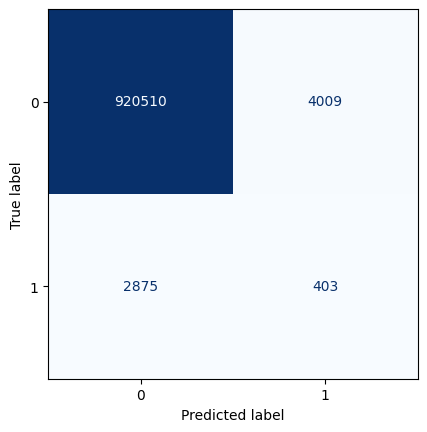

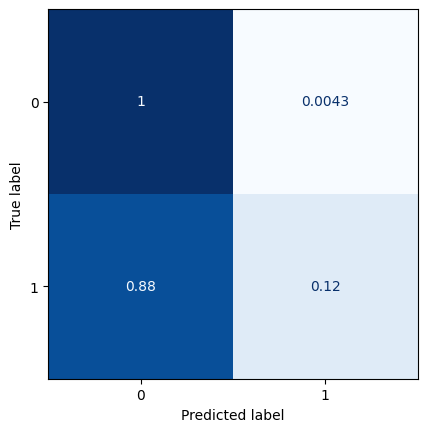

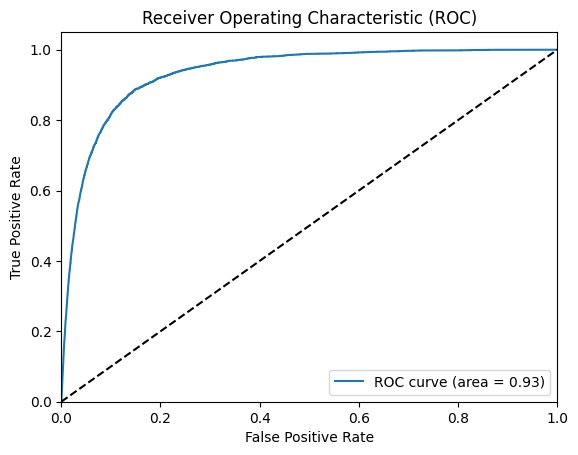

All zeros Brier score: 0.0035331004519307562
Model Brier score: 0.0034078148355983057
78/78 [==============================] - 0s 2ms/step
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_87 (Conv2D)          (None, 13, 29, 8)         1088      
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_88 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_29 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_89 (Conv2D)          (None, 14, 30, 1)

2023-06-26 16:15:04.088808: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0775

2023-06-26 16:15:07.181365: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0775 - val_loss: 0.0216
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0227 - val_loss: 0.0200
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0194
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0206 - val_loss: 0.0190
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0188
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0199 - val_loss: 0.0189
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0197 - val_loss: 0.0185
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0195 - val_loss: 0.0185
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0194 - val_loss: 0.0185
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0193 - val_loss: 0.0189
E

2023-06-26 16:16:44.369460: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


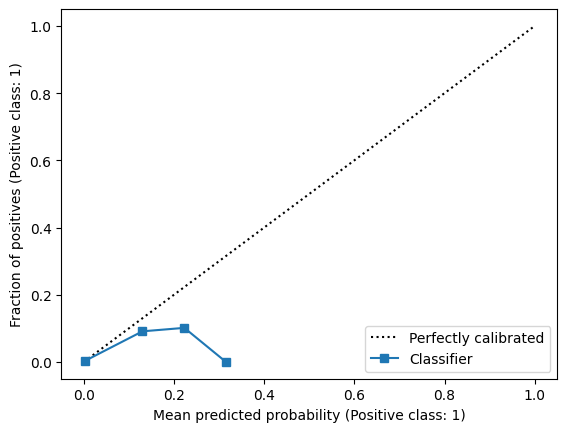

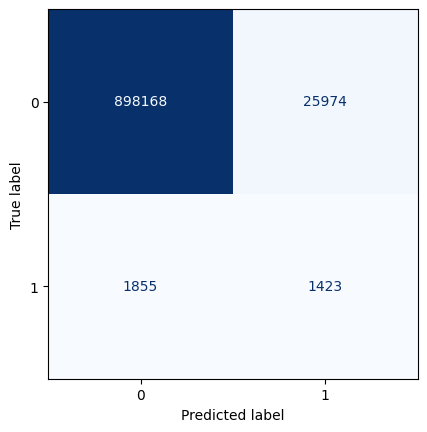

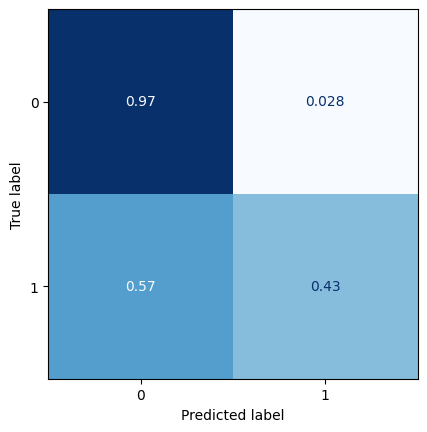

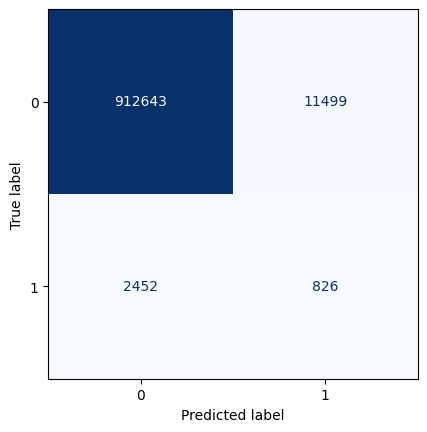

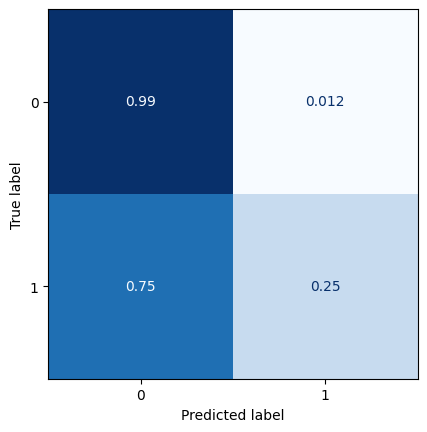

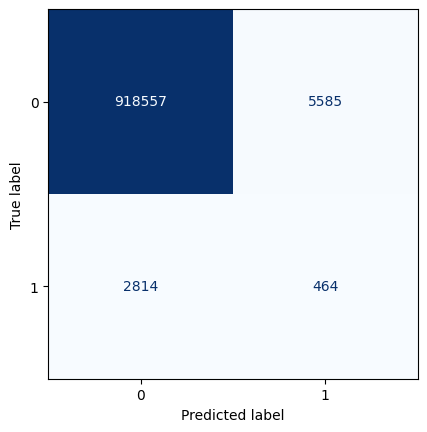

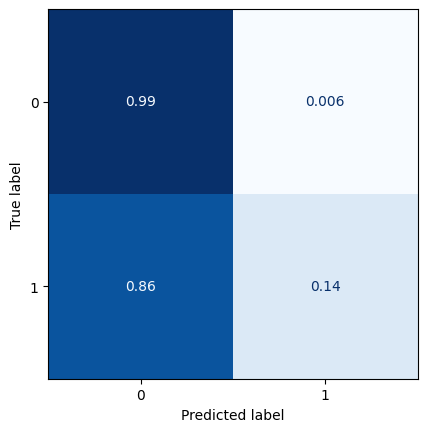

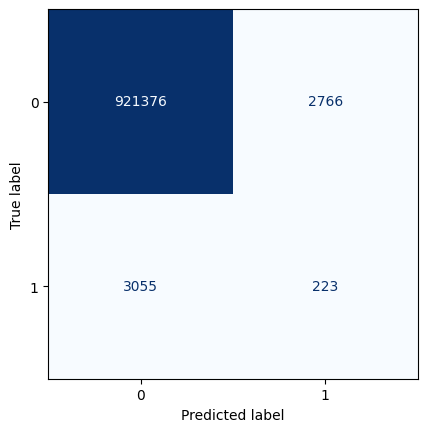

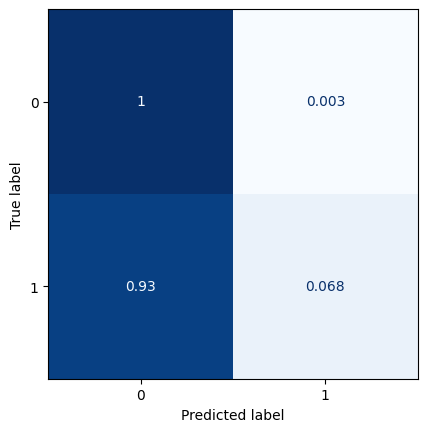

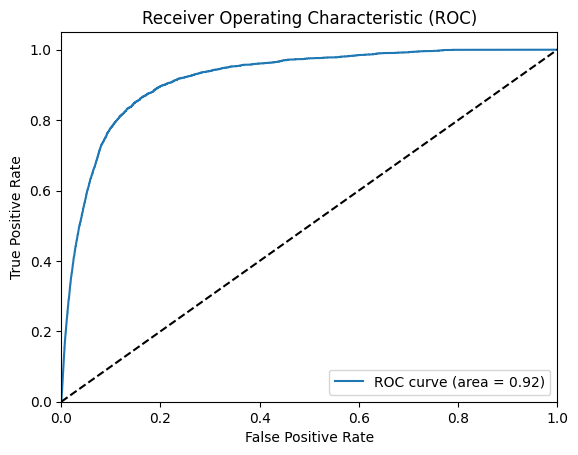

All zeros Brier score: 0.003534536671626663
Model Brier score: 0.003438943544980392
78/78 [==============================] - 0s 3ms/step
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_90 (Conv2D)          (None, 13, 29, 8)         1160      
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_91 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_30 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_92 (Conv2D)          (None, 14, 30, 1)  

2023-06-26 16:17:08.579469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0479

2023-06-26 16:17:12.100607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0479 - val_loss: 0.0218
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0233 - val_loss: 0.0207
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0199
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0198
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0195
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0196
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0204 - val_loss: 0.0194
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0191
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0199 - val_loss: 0.0191


2023-06-26 16:18:52.685076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


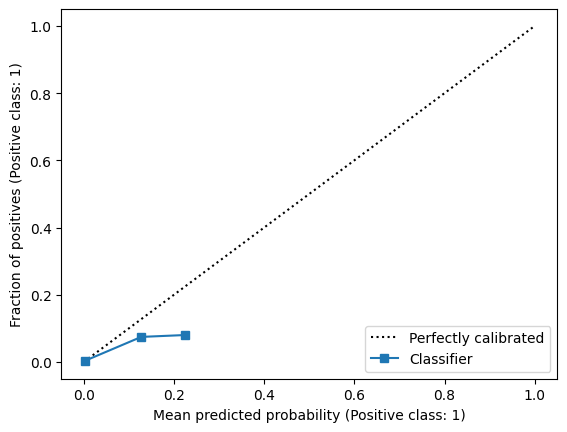

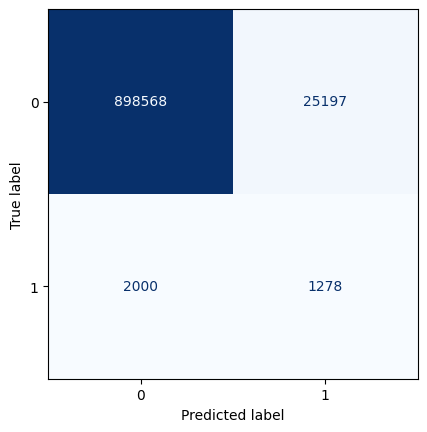

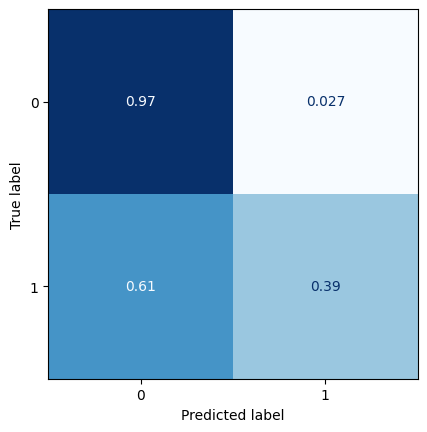

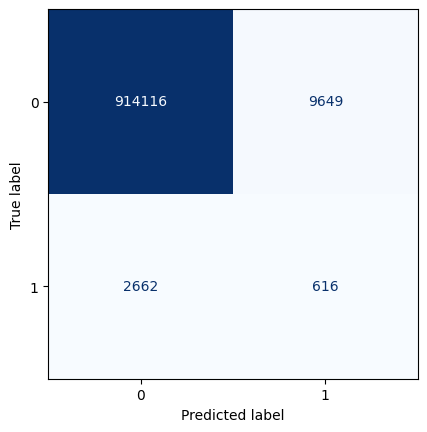

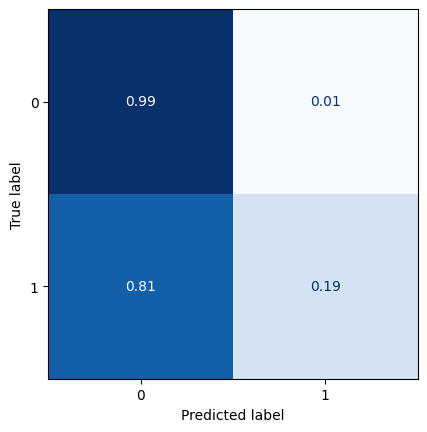

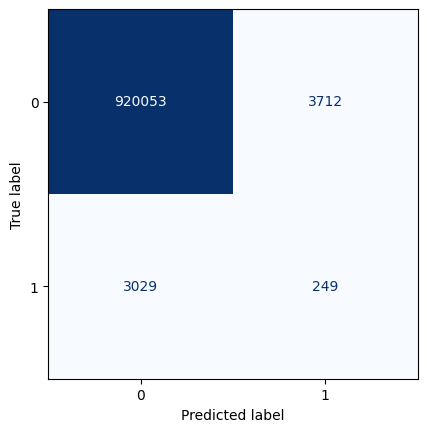

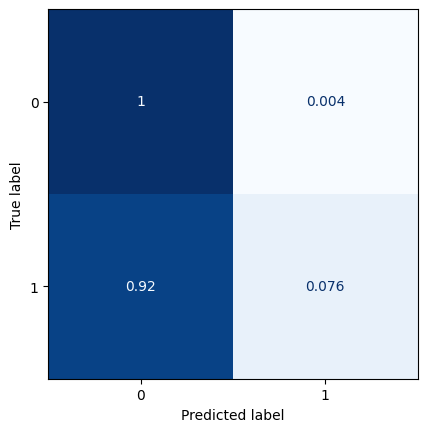

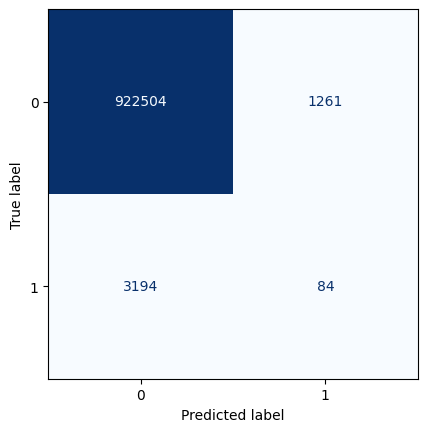

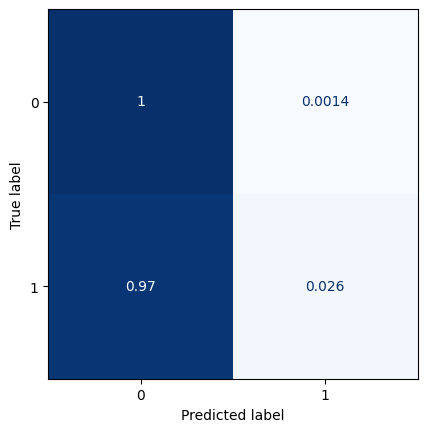

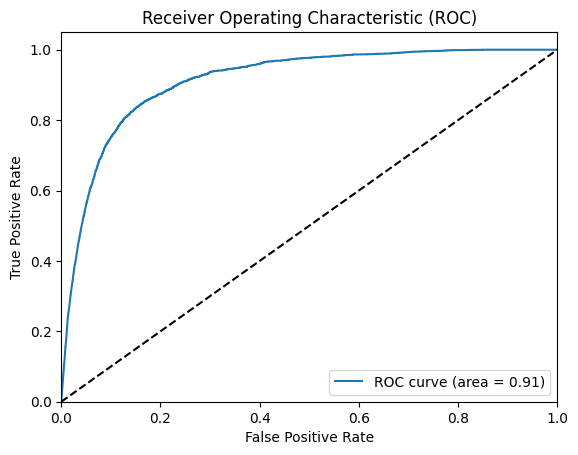

All zeros Brier score: 0.00353597405945571
Model Brier score: 0.003449331090459209
78/78 [==============================] - 0s 2ms/step
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_93 (Conv2D)          (None, 13, 29, 8)         1232      
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_94 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_31 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_95 (Conv2D)          (None, 14, 30, 1)   

2023-06-26 16:19:16.931845: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0367

2023-06-26 16:19:20.576254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0367 - val_loss: 0.0204
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0198
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0195
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0196
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0194
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0192
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0203 - val_loss: 0.0197
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0202 - val_loss: 0.0190
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0201 - val_loss: 0.0195
Epoch 10/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0200 - val_loss: 0.0192


2023-06-26 16:20:54.341286: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


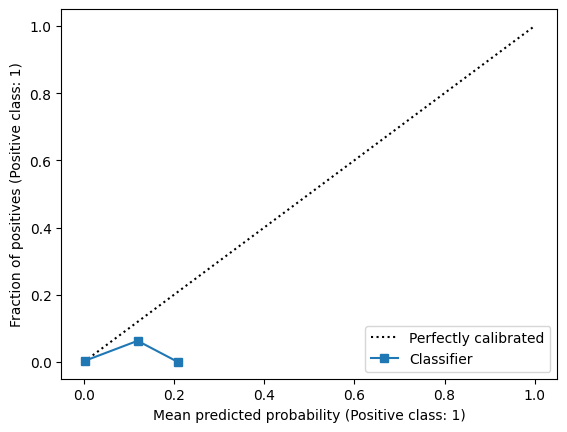

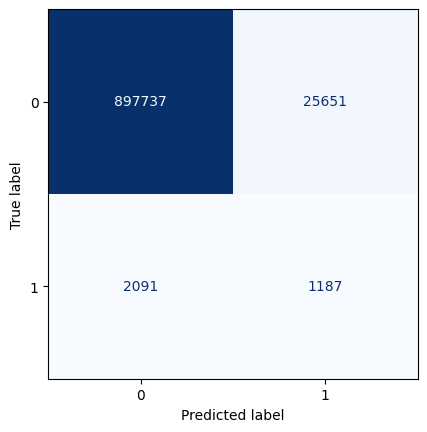

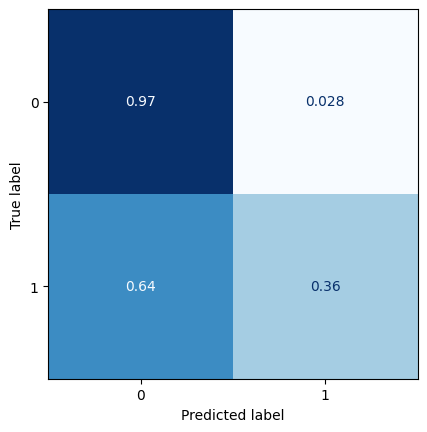

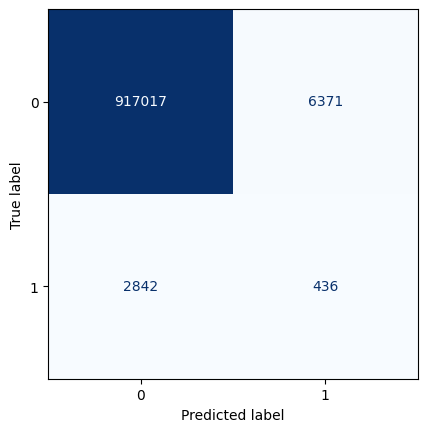

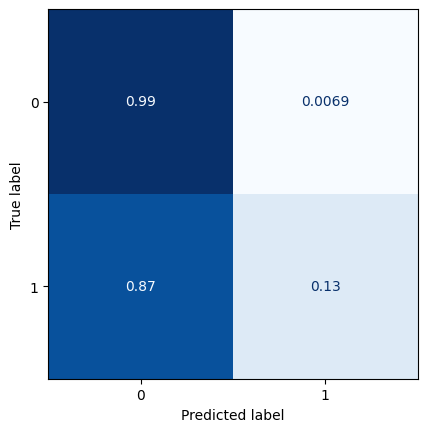

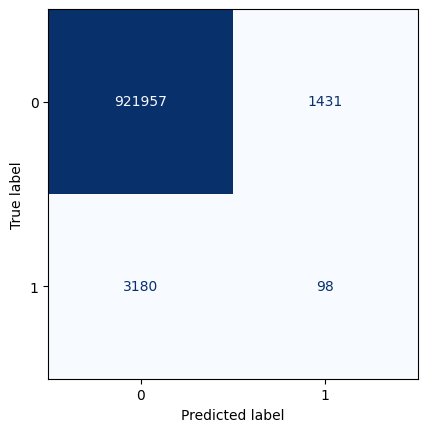

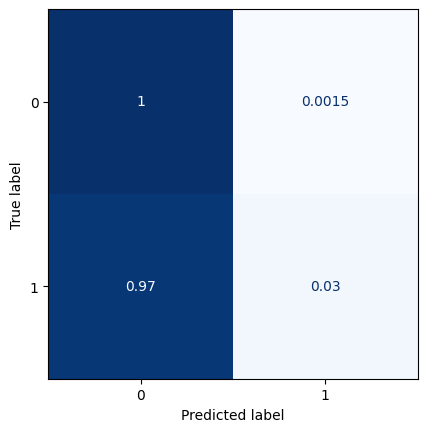

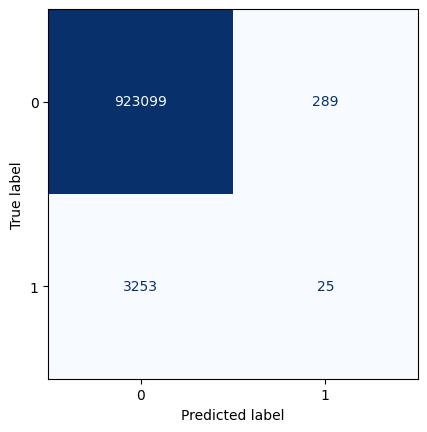

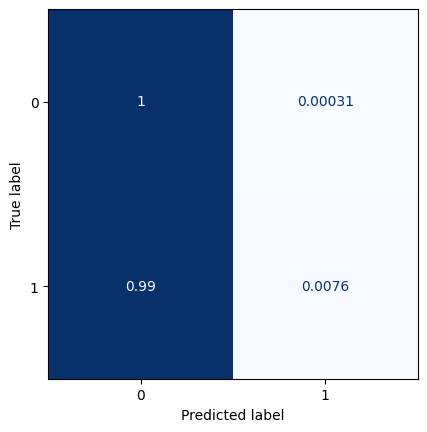

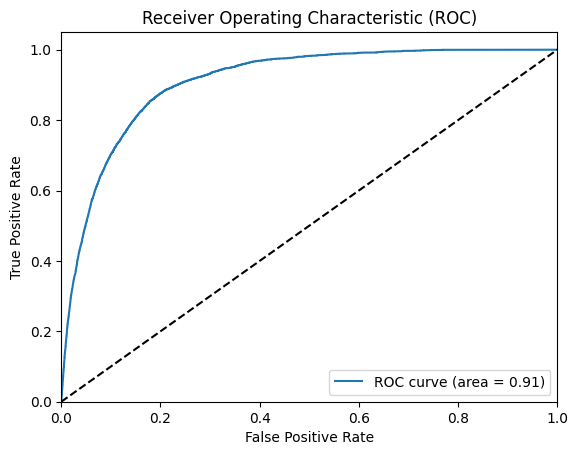

All zeros Brier score: 0.0035374126168436094
Model Brier score: 0.003452051394199858
78/78 [==============================] - 0s 3ms/step
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 13, 29, 8)         1304      
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_97 (Conv2D)          (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_32 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 14, 30, 1) 

2023-06-26 16:21:22.403454: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0470

2023-06-26 16:21:26.101639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0470 - val_loss: 0.0226
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0235 - val_loss: 0.0212
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0224 - val_loss: 0.0205
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0202
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0199
Epoch 6/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0212 - val_loss: 0.0198
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0195
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0208 - val_loss: 0.0193
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0207 - val_loss: 0.0194
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0205 - val_loss: 0.0192


2023-06-26 16:22:50.477564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


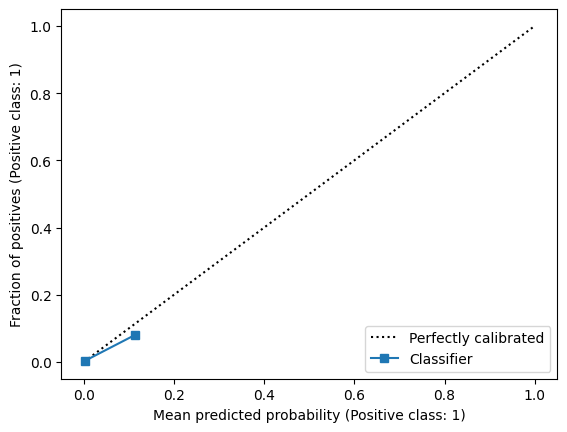

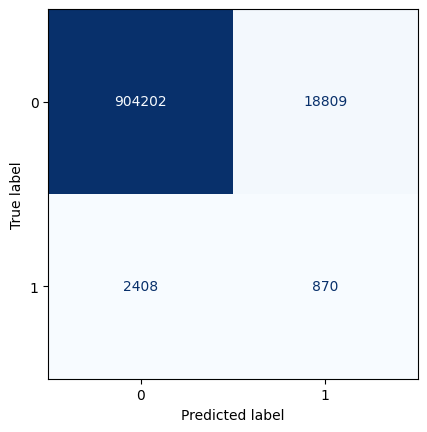

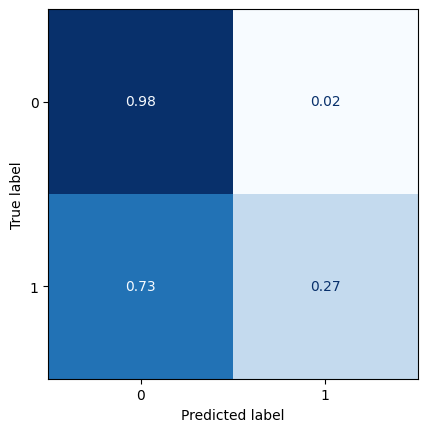

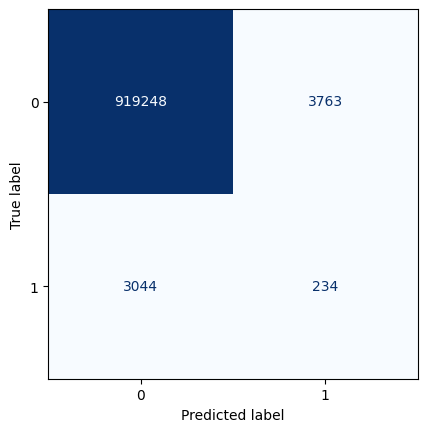

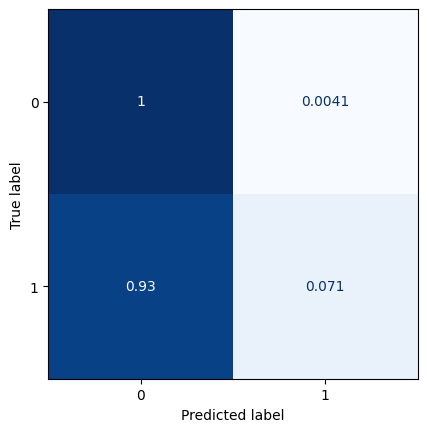

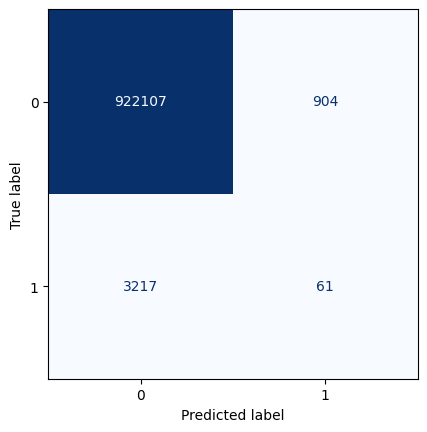

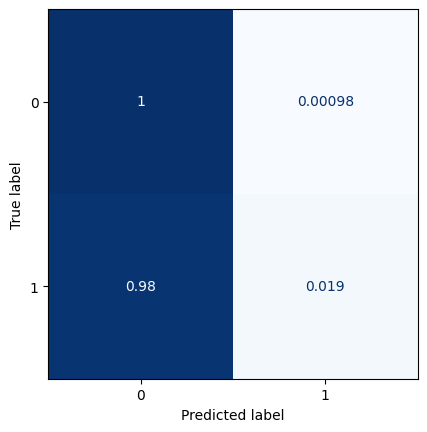

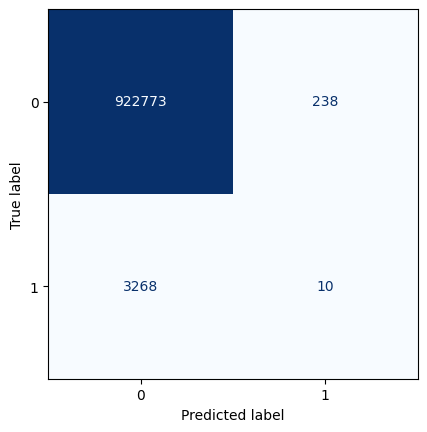

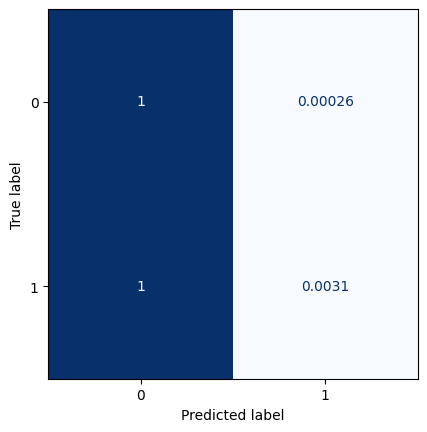

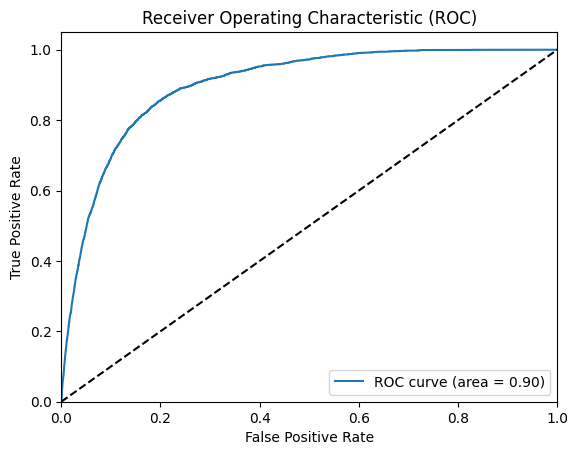

All zeros Brier score: 0.003538852345218393
Model Brier score: 0.00346486363593312
78/78 [==============================] - 0s 2ms/step
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_99 (Conv2D)          (None, 13, 29, 8)         1376      
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_100 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_33 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_101 (Conv2D)         (None, 14, 30, 1)   

2023-06-26 16:23:17.154499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0936

2023-06-26 16:23:21.127577: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 11ms/step - loss: 0.0936 - val_loss: 0.0245
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0252 - val_loss: 0.0220
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0234 - val_loss: 0.0213
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0226 - val_loss: 0.0206
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0221 - val_loss: 0.0205
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0203
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0200
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0201
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0196
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0197


2023-06-26 16:25:11.010057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


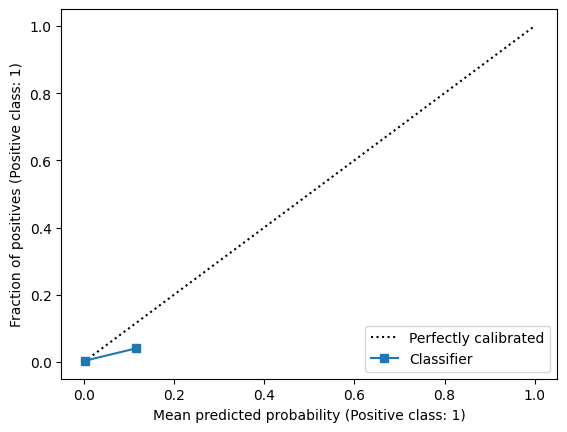

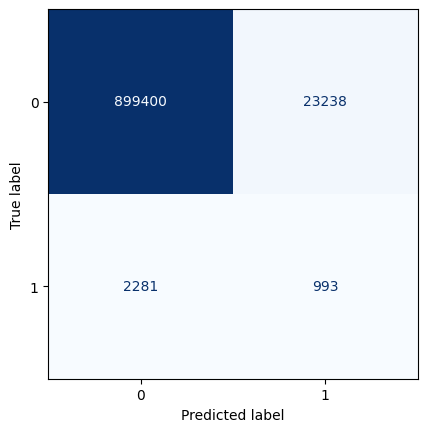

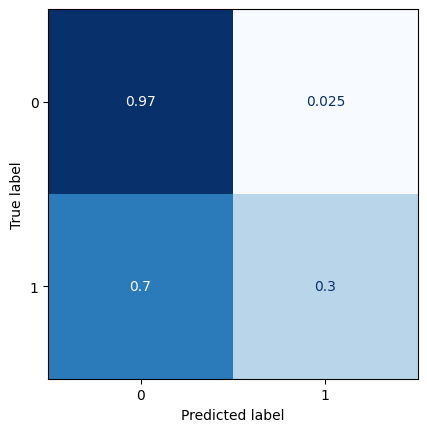

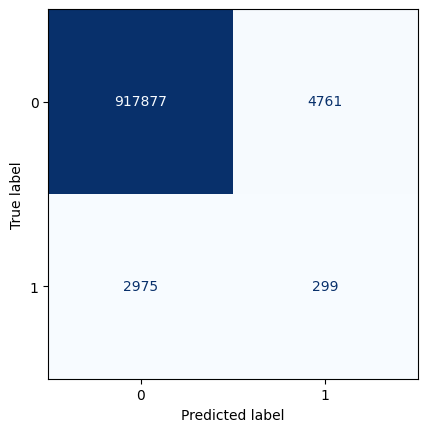

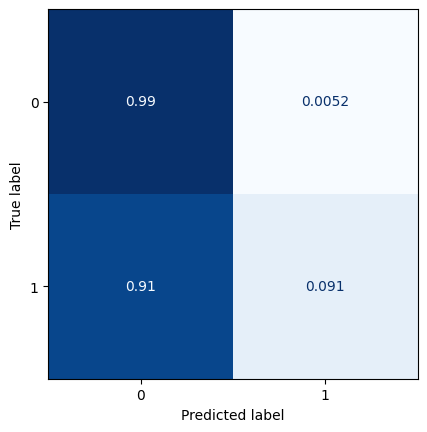

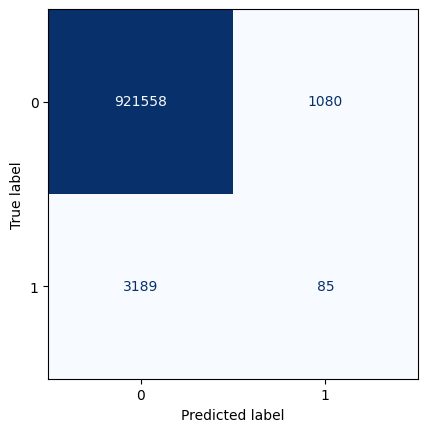

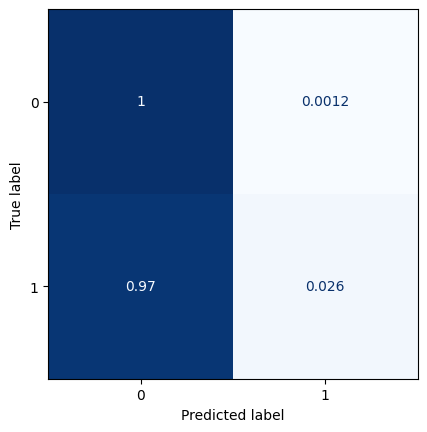

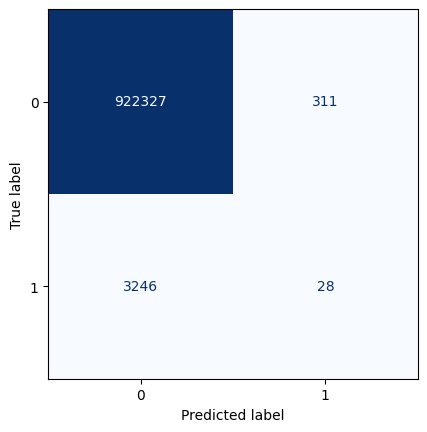

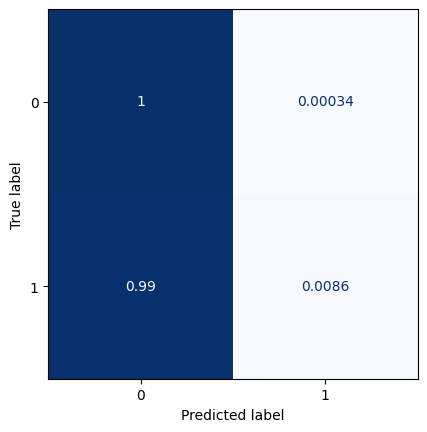

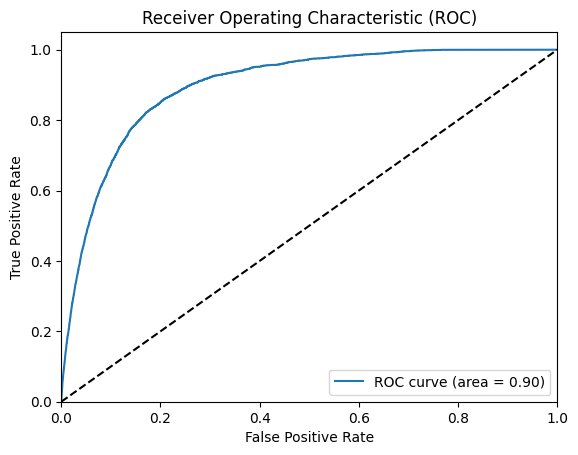

All zeros Brier score: 0.0035359731810366427
Model Brier score: 0.003460868356624166
78/78 [==============================] - 0s 3ms/step
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_102 (Conv2D)         (None, 13, 29, 8)         1448      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_103 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_34 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_104 (Conv2D)         (None, 14, 30, 1) 

2023-06-26 16:25:37.883290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0715

2023-06-26 16:25:42.346154: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 5s 12ms/step - loss: 0.0715 - val_loss: 0.0229
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0235 - val_loss: 0.0214
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0225 - val_loss: 0.0209
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0220 - val_loss: 0.0207
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0207
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0202
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0203
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0200
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0210 - val_loss: 0.0199
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0209 - val_loss: 0.0205


2023-06-26 16:27:37.368701: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


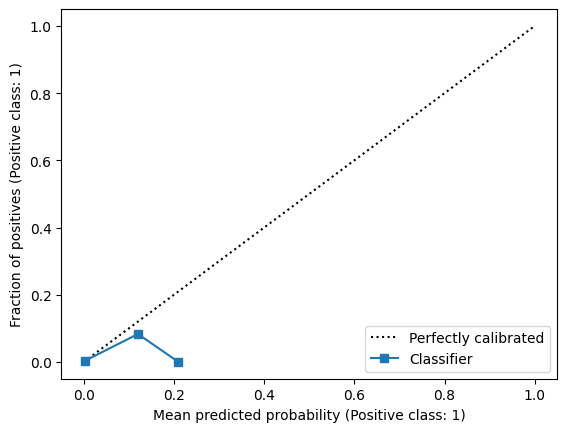

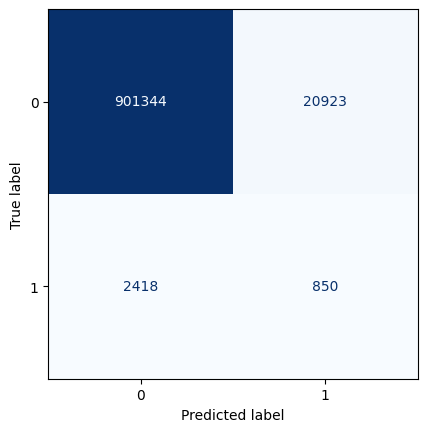

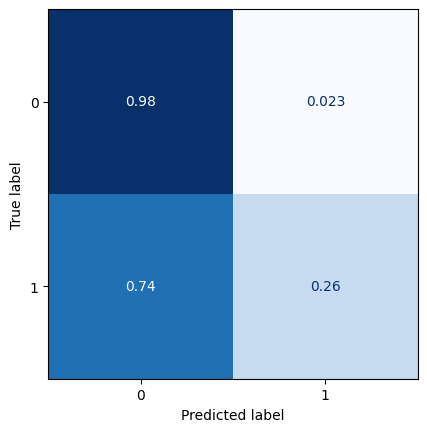

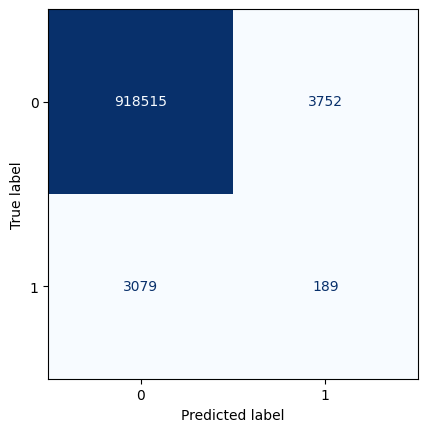

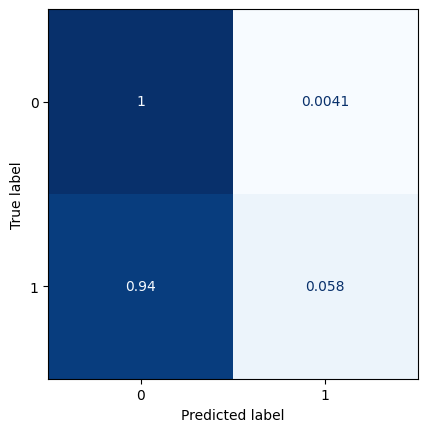

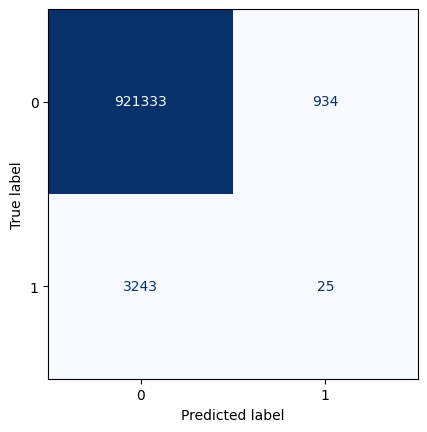

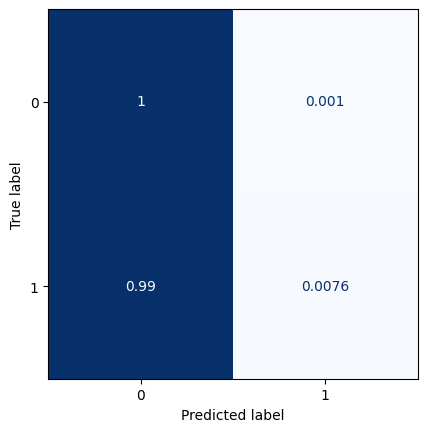

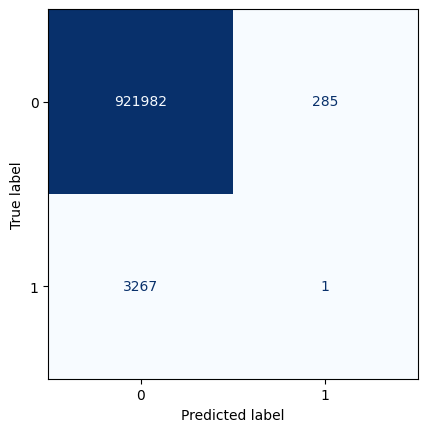

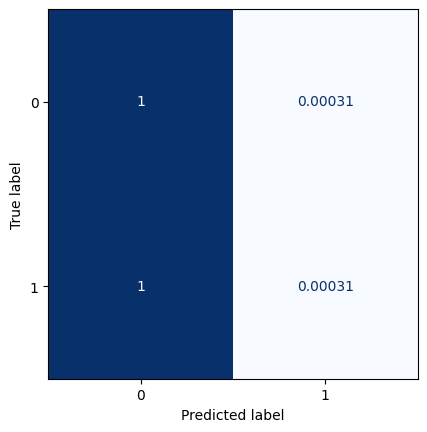

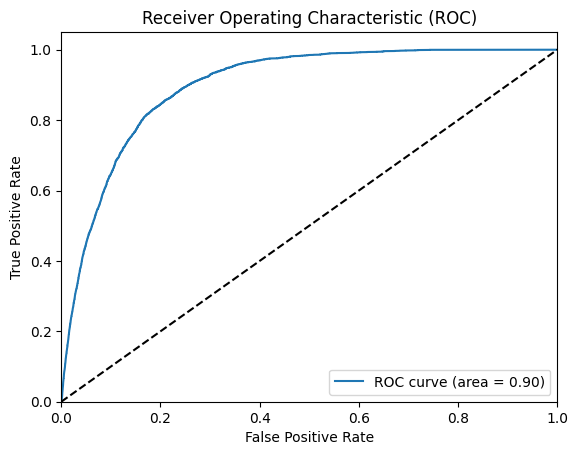

All zeros Brier score: 0.0035309307589664355
Model Brier score: 0.003469887342731629
78/78 [==============================] - 0s 3ms/step
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_105 (Conv2D)         (None, 13, 29, 8)         1520      
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_106 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_35 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_107 (Conv2D)         (None, 14, 30, 1) 

2023-06-26 16:28:04.851436: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0444

2023-06-26 16:28:08.311585: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0444 - val_loss: 0.0238
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0238 - val_loss: 0.0225
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0227 - val_loss: 0.0215
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0222 - val_loss: 0.0211
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0219 - val_loss: 0.0205
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0217 - val_loss: 0.0204
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0215 - val_loss: 0.0204
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0202
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0212 - val_loss: 0.0200
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0204


2023-06-26 16:30:06.006158: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step


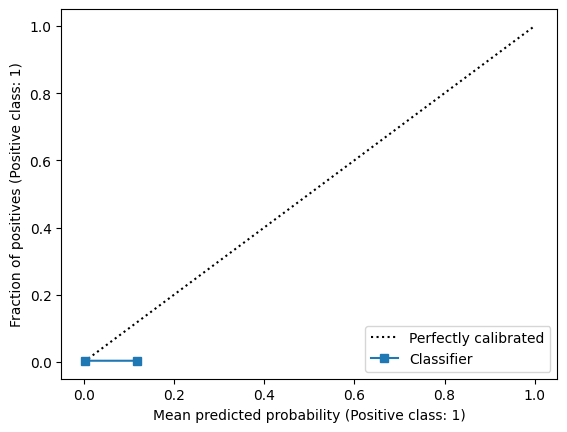

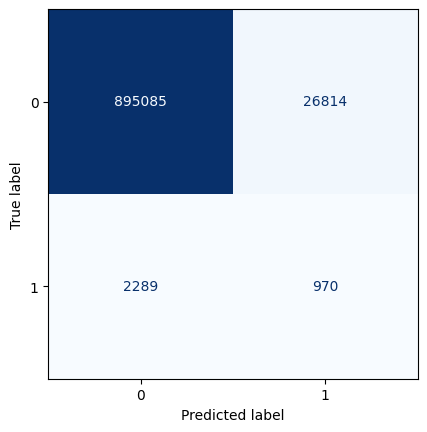

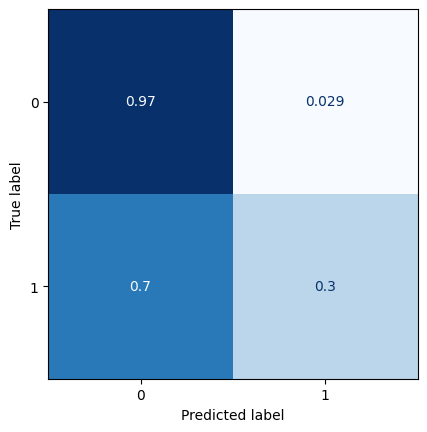

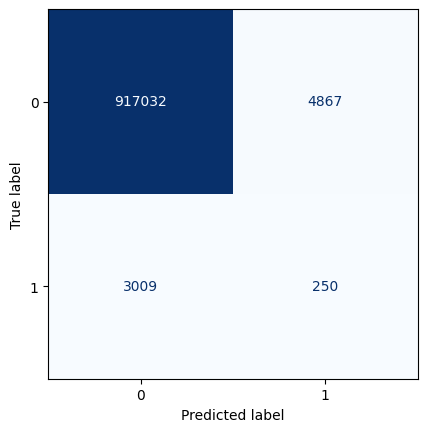

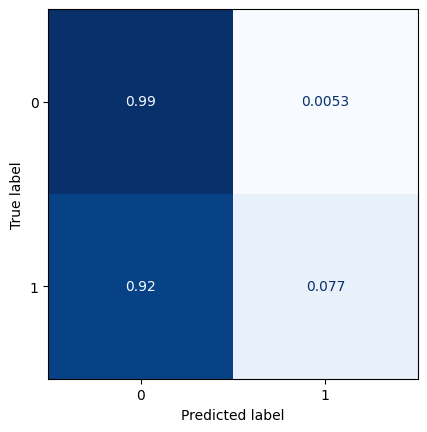

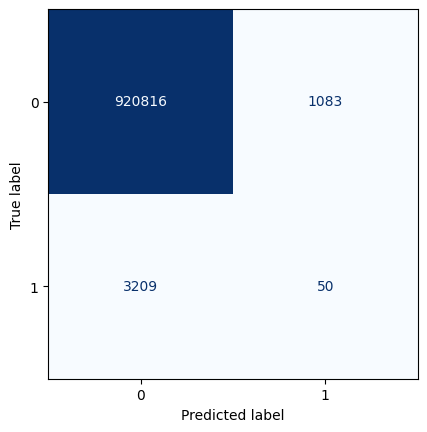

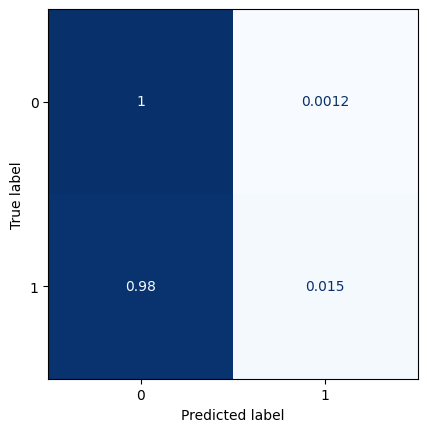

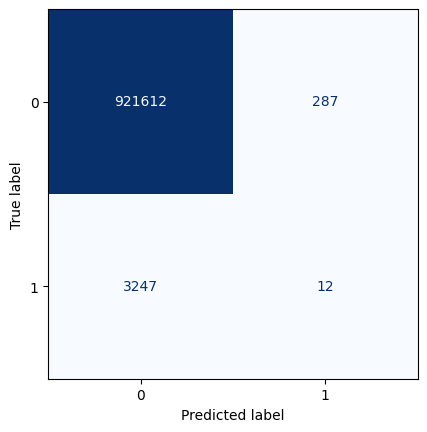

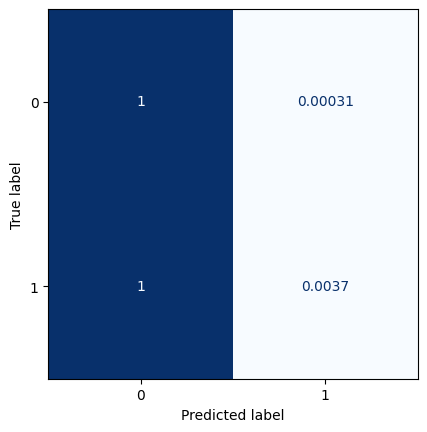

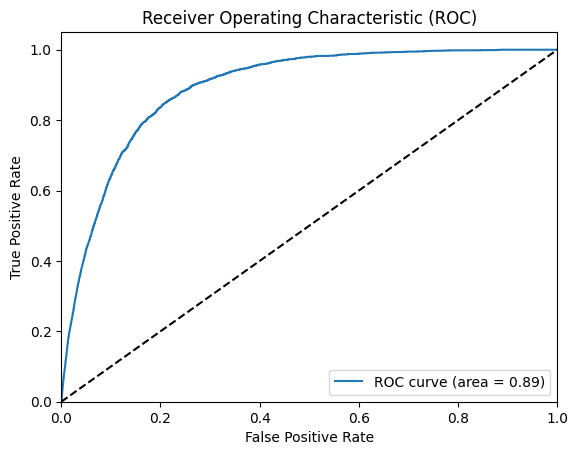

All zeros Brier score: 0.003522641537985944
Model Brier score: 0.0034615871728610613
78/78 [==============================] - 0s 2ms/step
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_108 (Conv2D)         (None, 13, 29, 8)         1592      
                                                                 
 max_pooling2d_36 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_109 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_36 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_110 (Conv2D)         (None, 14, 30, 1) 

2023-06-26 16:30:34.694973: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0506

2023-06-26 16:30:38.127808: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 10ms/step - loss: 0.0506 - val_loss: 0.0233
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0237 - val_loss: 0.0217
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0227 - val_loss: 0.0211
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0222 - val_loss: 0.0206
Epoch 5/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0218 - val_loss: 0.0209
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0216 - val_loss: 0.0205
Epoch 7/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0214 - val_loss: 0.0207
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0213 - val_loss: 0.0203
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0206
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0211 - val_loss: 0.0209


2023-06-26 16:33:12.566881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 4ms/step


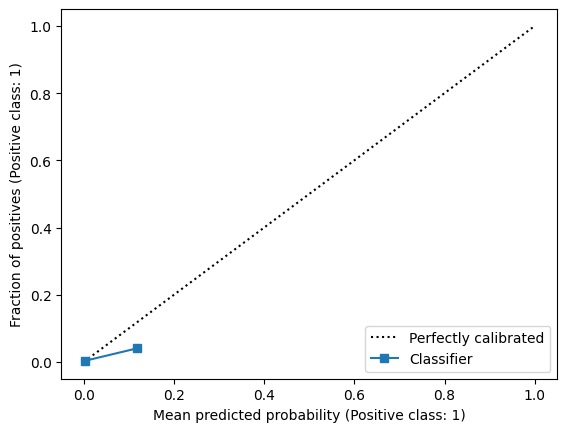

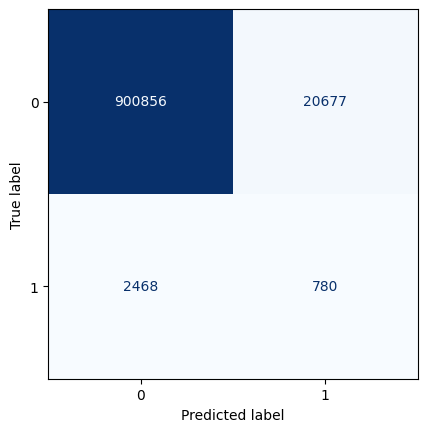

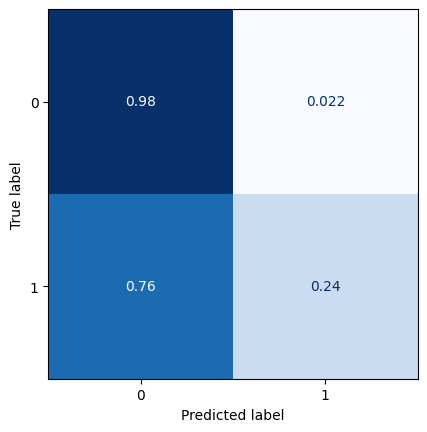

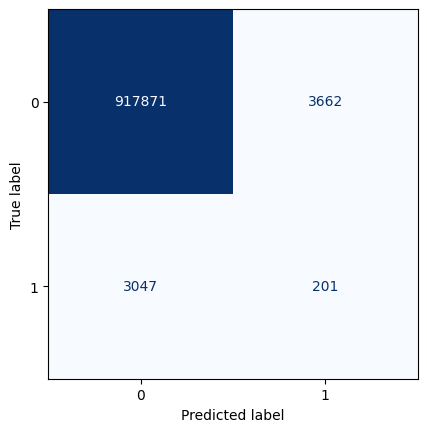

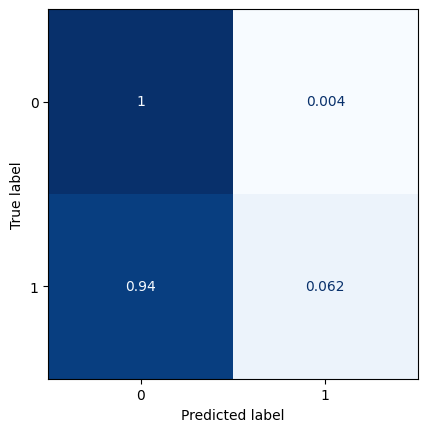

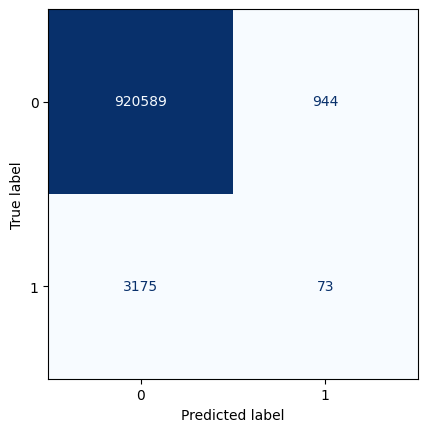

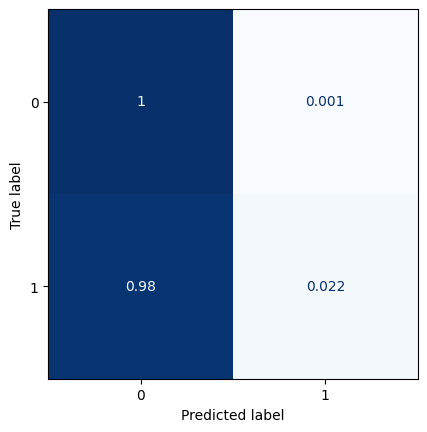

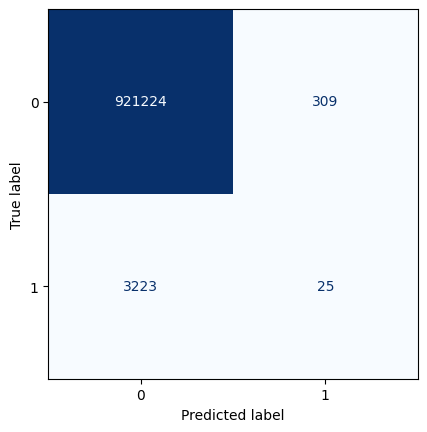

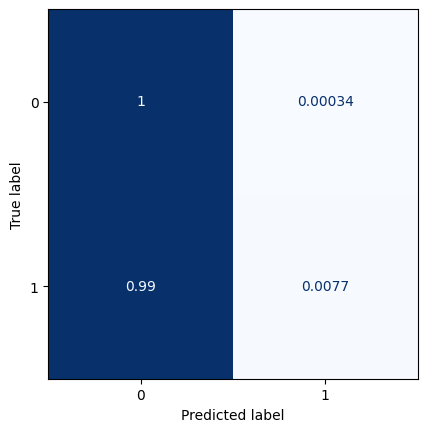

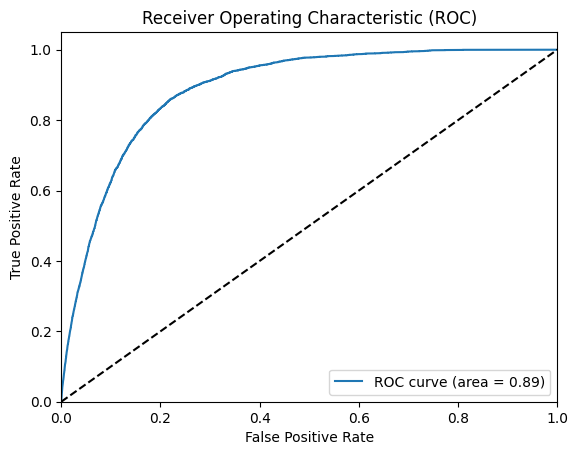

All zeros Brier score: 0.0035121828843801936
Model Brier score: 0.0034530458986256553


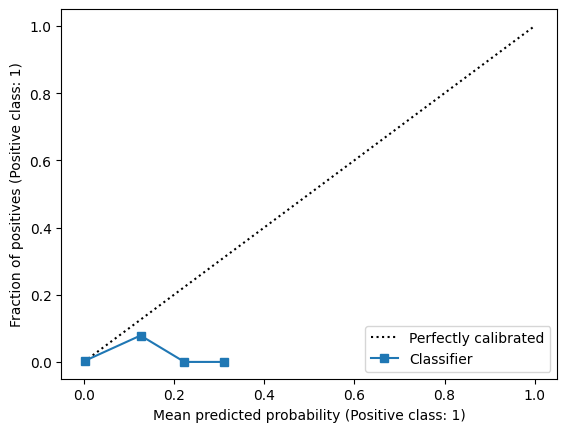

In [71]:
for lag in [3,4,5,6,7,8,9,10,11,12,13]:
    
    t_train = model.predict(train_img_std_Pred0)
    t_val = model.predict(val_img_std_Pred0)
    t_test = model.predict(test_img_std_Pred0)

    train_img_std_Pred0 = np.concatenate((t_train,train_img_std_Pred0),axis=3)
    val_img_std_Pred0 = np.concatenate((t_val,val_img_std_Pred0),axis=3)
    test_img_std_Pred0 = np.concatenate((t_test,test_img_std_Pred0),axis=3)
    
    model = Sequential()
    model.add(layers.Input(shape=(13, 29, 9+lag)))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))
    
    model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
    model.add(layers.UpSampling2D((2,2)))
    
    model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities
    
    model.add(layers.Cropping2D(cropping=((0,1),(0,1))))
    
    model.summary()
    
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
            verbose=1, mode='auto', restore_best_weights=True)

    model.fit(train_img_std_Pred0[:-lag], y_train_img[lag:], validation_data=(val_img_std_Pred0[:-lag],y_val_img[lag:]),
        callbacks=[monitor],epochs=100)
    
    t = model.predict(test_img_std_Pred0[:-lag])

    ranges = [0.025,0.05,0.075,0.1]

    for j in ranges:
        classes = []
        for i in t.reshape(-1,1):
            if i<=j: classes.append(0)
            else: classes.append(1)
    
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
        ConfusionMatrixDisplay(confusion_matrix(y_test_img[lag:].reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)

    ### ROC
    plot_roc(t.reshape(-1,1),y_test_img[lag:].reshape(-1,1))

    z = np.zeros((lag,13,29,1))
    tt = np.concatenate((t,z))
    test['predictions_lag'+str(lag)] = tt.reshape(-1,1)
    test.to_csv("test_with_newTarget_predictions_targetAll.csv")

    ### calibration
    display = CalibrationDisplay.from_predictions(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1), n_bins=10)
    print(f'All zeros Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), np.zeros(len(y_test_img[lag:].reshape(-1,1))))}')
    print(f'Model Brier score: {brier_score_loss(y_test_img[lag:].reshape(-1,1), t.reshape(-1,1))}')


## 1000 steps

In [16]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 9)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=1000, 
        verbose=1, mode='auto', restore_best_weights=True)


Metal device set to: Apple M1


2023-06-26 11:09:15.510268: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-26 11:09:15.511758: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 13, 29, 8)         656       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 7, 15, 8)         0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d (UpSampling2D  (None, 14, 30, 8)        0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 14, 30, 1)         73        
                                                                 
 cropping2d (Cropping2D)     (None, 13, 29, 1)         0

In [31]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=1000)

Epoch 1/1000


2023-06-22 13:49:59.561610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0438

2023-06-22 13:50:02.887089: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0438 - val_loss: 0.0147
Epoch 2/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0161 - val_loss: 0.0117
Epoch 3/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0136 - val_loss: 0.0101
Epoch 4/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0124 - val_loss: 0.0098
Epoch 5/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0119 - val_loss: 0.0092
Epoch 6/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0115 - val_loss: 0.0092
Epoch 7/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0111 - val_loss: 0.0089
Epoch 8/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0108 - val_loss: 0.0084
Epoch 9/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0105 - val_loss: 0.0088
Epoch 10/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0104 - val_loss:

354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0077
Epoch 160/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0080 - val_loss: 0.0086
Epoch 161/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0077
Epoch 162/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0075
Epoch 163/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0079 - val_loss: 0.0075
Epoch 164/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0079
Epoch 165/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0078
Epoch 166/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0080 - val_loss: 0.0077
Epoch 167/1000
354/354 [==============================] - 3s 7ms/step - loss: 0.0079 - val_loss: 0.0083
Epoch 168/1000
354/354 [==============================] - 3s 7ms/step - loss: 0

Epoch 238/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0078
Epoch 239/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0078
Epoch 240/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0081
Epoch 241/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0080
Epoch 242/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0083
Epoch 243/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0080
Epoch 244/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0083
Epoch 245/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0079
Epoch 246/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0078 - val_loss: 0.0083
Epoch 247/1000
354/354 [==============================] - 3s 8ms

Epoch 395/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0079
Epoch 396/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 397/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 398/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0080
Epoch 399/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 400/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0082
Epoch 401/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0080
Epoch 402/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0080
Epoch 403/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 404/1000
354/354 [==============================] - 3s 8ms

Epoch 474/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0078
Epoch 475/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 476/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0080
Epoch 477/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0083
Epoch 478/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 479/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0081
Epoch 480/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0083
Epoch 481/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0085
Epoch 482/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0077 - val_loss: 0.0086
Epoch 483/1000
354/354 [==============================] - 3s 8ms

Epoch 631/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 632/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 633/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 634/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 635/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 636/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0085
Epoch 637/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 638/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 639/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 640/1000
354/354 [==============================] - 3s 8ms

Epoch 710/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0085
Epoch 711/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 712/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 713/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0080
Epoch 714/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0080
Epoch 715/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 716/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 717/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 718/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 719/1000
354/354 [==============================] - 3s 8ms

Epoch 789/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0088
Epoch 790/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 791/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 792/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0085
Epoch 793/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 794/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 795/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 796/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0081
Epoch 797/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0085
Epoch 798/1000
354/354 [==============================] - 3s 8ms

Epoch 868/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 869/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0086
Epoch 870/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0085
Epoch 871/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 872/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 873/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 874/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 875/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0088
Epoch 876/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 877/1000
354/354 [==============================] - 3s 8ms

Epoch 947/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 948/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 949/1000
354/354 [==============================] - 4s 10ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 950/1000
354/354 [==============================] - 3s 9ms/step - loss: 0.0076 - val_loss: 0.0082
Epoch 951/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 952/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 953/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0075 - val_loss: 0.0086
Epoch 954/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0075 - val_loss: 0.0083
Epoch 955/1000
354/354 [==============================] - 3s 8ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 956/1000
354/354 [==============================] - 3s 7m

In [21]:
t_train = model.predict(train_img_std)
t_val = model.predict(val_img_std)
t_test = model.predict(test_img_std)


78/78 [==============================] - 0s 2ms/step


In [22]:
train_img_std_Pred0 = np.concatenate((t_train,train_img_std),axis=3)
val_img_std_Pred0 = np.concatenate((t_val,val_img_std),axis=3)
test_img_std_Pred0 = np.concatenate((t_test,test_img_std),axis=3)


In [23]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 10)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 13, 29, 8)         728       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_1 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 30, 1)         73        
                                                                 
 cropping2d_1 (Cropping2D)   (None, 13, 29, 1)        

In [24]:
model.fit(train_img_std_Pred0[:-1], y_train_img[1:], validation_data=(val_img_std_Pred0[:-1],y_val_img[1:]),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-06-22 13:23:27.688493: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0537

2023-06-22 13:23:30.810779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0537 - val_loss: 0.0156
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0162 - val_loss: 0.0133
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0140 - val_loss: 0.0120
Epoch 4/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0132 - val_loss: 0.0119
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0127 - val_loss: 0.0115
Epoch 6/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0123 - val_loss: 0.0114
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0120 - val_loss: 0.0111
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0118 - val_loss: 0.0111
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0116 - val_loss: 0.0110
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0115 - val_loss: 0.0109
E

In [25]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette
t = model.predict(test_img_std_Pred0[:-1])
print(f'All zeros Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), np.zeros(len(y_test_img[1:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[1:].reshape(-1,1), t.reshape(-1,1))}')

17/78 [=====>........................] - ETA: 0s 

2023-06-22 13:27:46.711481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


78/78 [==============================] - 0s 3ms/step
All zeros Brier score: 0.00352736722604527
Model Brier score: 0.0026994697826983657


### Lag=2

In [26]:
t_train = model.predict(train_img_std_Pred0)
t_val = model.predict(val_img_std_Pred0)
t_test = model.predict(test_img_std_Pred0)

train_img_std_Pred1 = np.concatenate((t_train,train_img_std_Pred0),axis=3)
val_img_std_Pred1 = np.concatenate((t_val,val_img_std_Pred0),axis=3)
test_img_std_Pred1 = np.concatenate((t_test,test_img_std_Pred0),axis=3)


78/78 [==============================] - 0s 2ms/step


In [27]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 11)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=50, 
        verbose=1, mode='auto', restore_best_weights=True)

model.fit(train_img_std_Pred1[:-2], y_train_img[2:], validation_data=(val_img_std_Pred1[:-2],y_val_img[2:]),
        callbacks=[monitor],epochs=100)



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 13, 29, 8)         800       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 7, 15, 8)         0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_2 (UpSampling  (None, 14, 30, 8)        0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 14, 30, 1)         73        
                                                                 
 cropping2d_2 (Cropping2D)   (None, 13, 29, 1)        

2023-06-22 13:31:34.240856: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0605

2023-06-22 13:31:37.733623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 4s 9ms/step - loss: 0.0605 - val_loss: 0.0173
Epoch 2/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0175 - val_loss: 0.0147
Epoch 3/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0157 - val_loss: 0.0145
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0151 - val_loss: 0.0139
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0148 - val_loss: 0.0138
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0145 - val_loss: 0.0135
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0143 - val_loss: 0.0135
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0143 - val_loss: 0.0132
Epoch 9/100
354/354 [==============================] - 3s 9ms/step - loss: 0.0141 - val_loss: 0.0139
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0140 - val_loss: 0.0136
E

In [28]:
from sklearn.metrics import brier_score_loss
### brier score con probabilità predette
t = model.predict(test_img_std_Pred1[:-2])
print(f'All zeros Brier score: {brier_score_loss(y_test_img[2:].reshape(-1,1), np.zeros(len(y_test_img[2:].reshape(-1,1))))}')
print(f'Model Brier score: {brier_score_loss(y_test_img[2:].reshape(-1,1), t.reshape(-1,1))}')

16/77 [=====>........................] - ETA: 0s 

2023-06-22 13:46:32.217922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


77/77 [==============================] - 0s 3ms/step
All zeros Brier score: 0.003528798787419477
Model Brier score: 0.003145791866612814


## Optimize Brier Score

In [106]:
def brier_score(y_true, y_pred):
    #brier_score = brier_score_loss(y_true.reshape(-1,1), y_pred.reshape(-1,1))
    squared_difference = tf.square(y_true - y_pred)
    brier_score = tf.reduce_mean(squared_difference, axis=-1)
     = tf.reduce_mean((y_pred - y_true) ** 2, axis=-1)
    return brier_score

In [109]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 9)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()

model.compile(loss='mean_squared_error', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=10, 
        verbose=1, mode='auto', restore_best_weights=True)


Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_129 (Conv2D)         (None, 13, 29, 8)         656       
                                                                 
 max_pooling2d_43 (MaxPoolin  (None, 7, 15, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_130 (Conv2D)         (None, 7, 15, 8)          584       
                                                                 
 up_sampling2d_43 (UpSamplin  (None, 14, 30, 8)        0         
 g2D)                                                            
                                                                 
 conv2d_131 (Conv2D)         (None, 14, 30, 1)         73        
                                                                 
 cropping2d_43 (Cropping2D)  (None, 13, 29, 1)       

In [110]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=100)

Epoch 1/100


2023-06-26 17:56:31.149896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - ETA: 0s - loss: 0.0095

2023-06-26 17:56:34.205764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


354/354 [==============================] - 3s 9ms/step - loss: 0.0095 - val_loss: 0.0037
Epoch 2/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 3/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 4/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 5/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 6/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 7/100
354/354 [==============================] - 3s 7ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 8/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 9/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0042 - val_loss: 0.0037
Epoch 10/100
354/354 [==============================] - 3s 8ms/step - loss: 0.0042 - val_loss: 0.0037
E

In [95]:
print(f'Model Brier score: {brier_score(y_test_img, model.predict(test_img_std))}')

78/78 [==============================] - 0s 2ms/step
Model Brier score: 0.0035356640624412045


In [105]:
brier_score(y_test_img,model.predict(test_img_std)).shape

78/78 [==============================] - 0s 3ms/step


TensorShape([2466, 13, 29])

# Save results and new metric

In [24]:
a1 = test.target.values.reshape(1,-1)
a1

array([[0, 0, 0, ..., 0, 0, 0]])

In [25]:
a2 = y_test_img.reshape(1,-1)
a2

array([[0., 0., 0., ..., 0., 0., 0.]])

In [26]:
a_diff = a1-a2

In [27]:
a_diff[a_diff>0]

array([], dtype=float64)

In [28]:
test['predictions'] = t.reshape(-1,1)
test['predictions_onlySea'] = t_onlySea.reshape(-1,1)

ValueError: Length of values (924781) does not match length of index (929682)

In [ ]:
test

In [ ]:
test.to_csv("test_with_newTarget_predictions.csv")

In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test[test.target==1],2.5)

cyclones_predicted = compute_cyclones(test[test.predictions>=0.025],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions>=0.025) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test[test.target==1],2.5)

cyclones_predicted = compute_cyclones(test[test.predictions>=0.05],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions>=0.05) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test.loc[(test.target==1) & (test.time<='2019-12-01')],2.5)

cyclones_predicted = compute_cyclones(test.loc[(test.predictions>=0.1) & (test.time<='2019-12-01')],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions>=0.05) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test[test.target_sea==1],2.5)

cyclones_predicted = compute_cyclones(test[test.predictions_onlySea>=0.025],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions_onlySea>=0.025) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test[test.target_sea==1],2.5)

cyclones_predicted = compute_cyclones(test[test.predictions_onlySea>=0.05],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions_onlySea>=0.05) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



In [ ]:
import sys
sys.path.append("/Users/paolo/Documents/TC/Paolo/scripts/")

from aux import compute_cyclones

cyclones_real = compute_cyclones(test.loc[(test.target_sea==1) & (test.time<='2019-12-01')],2.5)

cyclones_predicted = compute_cyclones(test.loc[(test.predictions_onlySea>=0.1) & (test.time<='2019-12-01')],2.5)

TC_founds = 0 
    
for TC in cyclones_real:
    found = 0 
    for point in TC:
        reduced = test[(test.predictions_onlySea>=0.1) & (test.time==point[2]) & (test.latitude==point[0]) & (test.longitude==point[1])]
        if reduced.shape[0]>=1:
            found = 1
    if found == 1: TC_founds+=1
        
print(f'Number of test TCs: {len(cyclones_real)}\n')
print(f'Number of test TCs correctly predicted: {TC_founds}\n')
print(f'Number of test TCs predicted, correctly or not: {len(cyclones_predicted)}\n')
print(f'Number of test TCs predicted but not happening: {len(cyclones_predicted)-TC_founds}\n')



# Higher threshold for class 1

In [ ]:
train['target'] = train.apply(lambda x: 1 if x.Real_tom_target>=70 else 0,axis=1)
test['target'] = test.apply(lambda x: 1 if x.Real_tom_target>=70 else 0,axis=1)
val['target'] = val.apply(lambda x: 1 if x.Real_tom_target>=70 else 0,axis=1)

y_train = train.loc[:,['target','latitude','longitude','time']]
y_val = val.loc[:,['target','latitude','longitude','time']]
y_test = test.loc[:,['target','latitude','longitude','time']]

In [ ]:
y_train_img = extract_images(y_train, variables, verbose=True)
y_val_img = extract_images(y_val, variables, verbose=True)
y_test_img = extract_images(y_test, variables, verbose=True)


In [ ]:
model = Sequential()
model.add(layers.Input(shape=(13, 29, 9)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

#model.add(layers.Flatten())

#model.add(layers.Reshape((2,4,16)))

model.add(layers.Conv2D(8, (3,3), activation='relu', padding='same'))
model.add(layers.UpSampling2D((2,2)))

model.add(layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')) # sigmoidal activation to have probabilities

model.add(layers.Cropping2D(cropping=((0,1),(0,1))))

model.summary()


model.compile(loss='binary_crossentropy', optimizer='adam')

monitor = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=20, 
        verbose=1, mode='auto', restore_best_weights=True)


In [ ]:
model.fit(train_img_std, y_train_img, validation_data=(val_img_std,y_val_img),
        callbacks=[monitor],epochs=100)

In [ ]:
t = model.predict(test_img_std)

ranges = [0.025,0.05,0.075,0.1]

for j in ranges:
    classes = []
    for i in t.reshape(-1,1):
        if i<=j: classes.append(0)
        else: classes.append(1)

# confusion matrix with threshold on 0.1, otherwise always 0 
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes)).plot(colorbar=False,cmap=plt.cm.Blues, values_format='d')
    ConfusionMatrixDisplay(confusion_matrix(y_test_img.reshape(-1,1), classes, normalize='true')).plot(colorbar=False,cmap=plt.cm.Blues)
    

In [ ]:
plot_roc(t.reshape(-1,1),y_test_img.reshape(-1,1))

display = CalibrationDisplay.from_predictions(y_test_img.reshape(-1,1), t.reshape(-1,1), n_bins=10)

print(brier_score_loss(y_test_img.reshape(-1,1), t.reshape(-1,1)))
print(brier_score_loss(y_test_img.reshape(-1,1), np.zeros(len(y_test_img.reshape(-1,1)))))